# Deep_learning scratch

ニューラルネットワークスクラッチの検証にはMNISTデータセットを使用します。各種ライブラリやサイトからダウンロードできますが、ここでは深層学習フレームワークのKerasを用います。以下のコードを実行すればデータセットをダウンロードし、展開まで行えます。

In [1]:
import seaborn as sns
import pandas as pd
import numpy as np
import tensorflow as tf
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import RMSprop

import matplotlib.pyplot as plt
%matplotlib inline

Using TensorFlow backend.


#### 《データセットをダウンロードするコード》

In [2]:
from keras.datasets import mnist
(X_train_org, y_train_org), (X_test_org, y_test_org) = mnist.load_data()

#### 《MNISTとは？》
画像分類のための定番データセットで、手書き数字認識を行います。このデータセットには訓練用6万枚、テスト用1万枚の28×28ピクセルの白黒画像、およびそれらが0〜9のどの数字であるかというラベルが含まれています。

#### 《画像データとは？》
デジタル画像は点の集合で、これをピクセルと呼びます。一般的に白黒画像であればピクセルには0〜255の値が含まれます。一方、カラー画像であればR（赤）、G（緑）、B（青）それぞれに対応する0〜255の値が含まれます。機械学習をする上では、この0〜255の値一つひとつが特徴量として扱われます。0〜255は符号なしの8ビット整数で表せる範囲になるため、NumPyであれば「uint8」型の変数として保持できます。

### データセットの確認

どういったデータなのかを見てみます。

#### 《サンプルコード》

In [3]:
print(X_train_org.shape)  # (60000, 28, 28)
print(X_test_org.shape)  # (10000, 28, 28)
print(X_train_org[0].dtype)  # uint8
print(X_train_org[0])

(60000, 28, 28)
(10000, 28, 28)
uint8
[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   3  18  18  18 126 136
  175  26 166 255 247 127   0   0   0   0]
 [  0   0   0   0   0   0   0   0  30  36  94 154 170 253 253 253 253 253
  225 172 253 242 195  64   0   0   0   0]
 [  0   0   0   0   0   0   0  49 238 253 253 253 253 253 253 253 253 251
   93  82  82  56  39   0   0   0   0   0]
 [  0   0   0   0   0   0 

各データは28×28ピクセルの白黒画像です。

### 平滑化
(1, 28, 28)の各画像を、(1, 784)に変換します。これまで学んできた機械学習手法や、今回扱う全結合層のみのニューラルネットワークではこの形で扱います。全てのピクセルが一列になっていることを、 平滑化（flatten） してあるという風に表現します。

#### 《サンプルコード》

In [4]:
X_train_org = X_train_org.reshape(-1, 784)
X_test_org = X_test_org.reshape(-1, 784)

In [5]:
X_train_org.shape

(60000, 784)

In [6]:
X_test_org.shape

(10000, 784)

#### 《補足》
ここまで機械学習を学んでくる中で、特徴量の数を「次元」と呼んできました。その視点ではMNISTは784次元のデータです。一方で、NumPyのshapeが(784,)の状態を1次元配列とも呼びます。画像としての縦横の情報を持つ（28, 28)の状態であれば、2次元配列です。この視点では2次元のデータです。さらに、もしもカラー画像であれば(28, 28, 3)ということになり、3次元配列です。先ほどの視点では3次元のデータになります。しかし、白黒でもカラーでも平面画像であり、立体データではないという視点で、2次元のデータです。画像データを扱う際にはこのように「次元」という言葉が複数の意味合いで使われることに注意してください。

### 画像データの可視化

画像データを可視化します。`plt.imshow`に渡します。

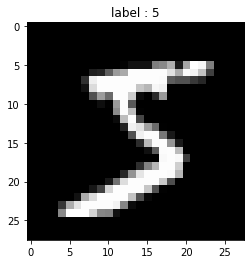

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline
index = 0
image = X_train_org[index].reshape(28, 28)
# X_train[index]: (784,)
# image: (28, 28)
plt.imshow(image, 'gray')
plt.title('label : {}'.format(y_train_org[index]))
plt.show()

#### 《発展的話題》
画像データは符号なし8ビット整数のuint8型で保持されることが一般的ですが、plt.imshowはより自由な配列を画像として表示することが可能です。例えば、以下のようにマイナスの値を持ったfloat64型の浮動小数点であってもエラーにはならないし、先ほどと全く同じ風に表示されます。

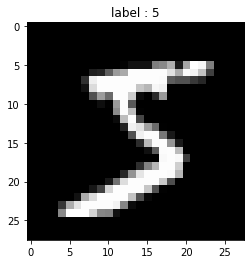

[[-105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35]
 [-105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35]
 [-105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35]
 [-105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35
  -105.35]
 [-105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -105.35 -1

In [8]:
index = 0
image = X_train_org[index].reshape(28, 28)
image = image.astype(np.float)  # float型に変換
image -= 105.35  # 意図的に負の小数値を作り出してみる
plt.imshow(image, 'gray')
plt.title('label : {}'.format(y_train_org[index]))
plt.show()
print(image)  # 値を確認

これは、自動的に値を0〜255の整数に変換して処理するように作られているからです。uint8型であっても最小値が0、最大値が255でない場合には色合いがおかしくなります。それを防ぐためには次のように引数を入れてください。

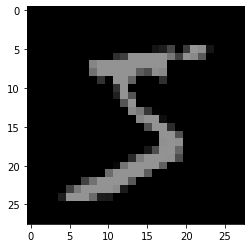

In [9]:
plt.imshow(image, 'gray', vmin=0, vmax=255)

画像関係のライブラリではこの自動的なスケーリングが思わぬ結果を生むことがあるので、新しいメソッドを使うときには確認しておきましょう。

### 前処理

#### 《サンプルコード》

In [10]:
X_train_org = X_train_org.astype(np.float)
X_test_org = X_test_org.astype(np.float)
X_train_org /= 255
X_test_org /= 255
print(X_train_org.max())  # 1.0
print(X_train_org.min())  # 0.0

1.0
0.0


また、正解ラベルは0から9の整数ですが、ニューラルネットワークで多クラス分類を行う際には one-hot表現 に変換します。scikit-learnの**OneHotEncoder**を使用したコードが以下です。このone-hot表現による値はそのラベルである確率を示していることになるため、float型で扱います。

In [11]:
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(handle_unknown='ignore', sparse=False)
y_train_one_hot = enc.fit_transform(y_train_org[:, np.newaxis])
y_test_one_hot = enc.transform(y_test_org[:, np.newaxis])
print(y_train_org.shape)  # (60000,)
print(y_train_one_hot.shape)  # (60000, 10)
print(y_train_one_hot.dtype)  # float64

(60000,)
(60000, 10)
float64


さらに、訓練データ6万枚の内2割を検証データとして分割してください。訓練データが48000枚、検証データが12000枚となります。

In [12]:
from sklearn.model_selection import train_test_split

In [13]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train_org, y_train_one_hot, test_size=0.2)
print(X_train.shape)  # (48000, 784)
print(X_val.shape)  # (12000, 784)
print(y_train.shape)  # (48000, 784)
print(y_val.shape)  # (12000, 784)

(48000, 784)
(12000, 784)
(48000, 10)
(12000, 10)


ニューラルネットワークのクラスをスクラッチで作成していきます。NumPyなど最低限のライブラリのみを使いアルゴリズムを実装していきます。


今回は多クラス分類を行う3層のニューラルネットワークを作成します。層の数などは固定した上でニューラルネットワークの基本を学びます。次のSprintで層を自由に変えられる設計にしていきます。


以下に雛形を用意してあります。このScratchSimpleNeuralNetrowkClassifierクラスにコードを書き加えていってください。

### ミニバッチ処理

これまでの機械学習スクラッチでは、全てのサンプルを一度に計算していました。しかし、ニューラルネットワークではデータを分割して入力する 確率的勾配降下法 が一般的です。分割した際のひとかたまりを ミニバッチ 、そのサンプル数を バッチサイズ と呼びます。


今回はバッチサイズを20とします。今回使う訓練データは48000枚ですから、48000÷20で2400回の更新を繰り返すことになります。ニューラルネットワークではこれを2400回 イテレーション（iteration） すると呼びます。訓練データを一度全て見ると1回の エポック（epoch） が終わったことになります。このエポックを複数回繰り返し、学習が完了します。


これを実現するための簡素なイテレータを用意しました。for文で呼び出すと、ミニバッチを取得できます。



In [14]:
class GetMiniBatch:
    """
    ミニバッチを取得するイテレータ

    Parameters
    ----------
    X : 次の形のndarray, shape (n_samples, n_features)
      訓練データ
    y : 次の形のndarray, shape (n_samples, 1)
      正解値
    batch_size : int
      バッチサイズ
    seed : int
      NumPyの乱数のシード
    """

    def __init__(self, X, y, batch_size=20, seed=0):
        self.batch_size = batch_size
        np.random.seed(seed)
        shuffle_index = np.random.permutation(np.arange(X.shape[0]))
        self._X = X[shuffle_index]
        self._y = y[shuffle_index]
        self._stop = np.ceil(X.shape[0]/self.batch_size).astype(np.int)

    def __len__(self):
        return self._stop

    def __getitem__(self, item):
        p0 = item*self.batch_size
        p1 = item*self.batch_size + self.batch_size
        return self._X[p0:p1], self._y[p0:p1]

    def __iter__(self):
        self._counter = 0
        return self

    def __next__(self):
        if self._counter >= self._stop:
            raise StopIteration()
        p0 = self._counter*self.batch_size
        p1 = self._counter*self.batch_size + self.batch_size
        self._counter += 1
        return self._X[p0:p1], self._y[p0:p1]

このクラスをインスタンス化し、for文を使うことでミニバッチが取り出せます。

In [15]:
get_mini_batch = GetMiniBatch(X_train, y_train, batch_size=20)
print(len(get_mini_batch))  # 2400
# print(get_mini_batch[5]) # 5番目のミニバッチが取得できる
for mini_X_train, mini_y_train in get_mini_batch:
    # このfor文内でミニバッチが使える
    print(mini_X_train)
    # print(mini_y_train)
    pass

2400
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ...

 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ..

 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ..

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ...

In [16]:
print(mini_X_train)
print(mini_y_train)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]


In [17]:
mini_X_train.shape

(20, 784)

In [18]:
len(mini_X_train)

20

In [19]:
mini_y_train.shape

(20, 10)

`__getitem__`や`__next__`は`__init__`と同じ特殊メソッドの一種です。

### 学習
ニューラルネットワークの学習はフォワードプロパゲーションとバックプロパゲションの繰り返しになります。

### 【問題1】重みの初期値を決めるコードの作成

ニューラルネットワークの各層の重みの初期値を決めるコードを作成してください。


重みの初期値は様々な方法が提案されていますが、今回はガウス分布による単純な初期化を行います。バイアスに関しても同様です。


以下のコードを参考にしてください。標準偏差の値sigmaはハイパーパラメータです。発展的な重みの初期化方法については次のSprintで扱います。

In [20]:
n_features = 784
n_nodes1 = 400
sigma = 0.01  # ガウス分布の標準偏差
W1 = sigma * np.random.randn(n_features, n_nodes1)  # 重み
print(W1.shape)
B1 = sigma * np.random.randn(n_nodes1)  # バイアス(W1の列数分だけ出力)
print(B1.shape)

(784, 400)
(400,)


### 【問題2】フォワードプロパゲーションの実装

三層のニューラルネットワークの**フォワードプロパゲーション**を作成してください。以下の説明ではノード数は1層目は400、2層目は200としますが、変更しても構いません。


各層の数式を以下に示します。今回はそれぞれの記号が表す配列が、実装上どのようなndarrayのshapeになるかを併記してあります。

In [21]:
batch_size = 20  # バッチサイズ
n_features = 784  # 特徴量の数
n_nodes1 = 400  # 1層目のノード数
n_nodes2 = 200  # 2層目のノード数
n_output = 10  # 出力のクラス数（3層目のノード数）

In [22]:
print("mini_X_train{}".format(mini_X_train.shape))
print("W1{}".format(W1.shape))
print("B1{}".format(B1.shape))

mini_X_train(20, 784)
W1(784, 400)
B1(400,)


- １層目の重み付き和

$$
A_1 = X \cdot W_1 + B_1
$$

$X$ : 特徴量ベクトル (batch_size, n_features)


$W_1$ : 1層目の重み (n_features, n_nodes1)


$B_1$ : 1層目のバイアス (n_nodes1,)


$A_1$ : 出力 (batch_size, n_nodes1)



In [23]:
# Xはバッチ数に応じて変化するため、今回はバッチ数に対応した最小単位で行う
A1 = np.dot(mini_X_train, W1) + B1
A1.shape

(20, 400)

In [24]:
def sigmoid(a):
    return 1 / (1 + np.exp(-a))

In [25]:
sigmoid(A1)

array([[0.51750598, 0.51674353, 0.48488724, ..., 0.49388525, 0.50215075,
        0.48902684],
       [0.50812165, 0.48985148, 0.51407716, ..., 0.50917993, 0.50957402,
        0.51039636],
       [0.50351768, 0.50734644, 0.49469754, ..., 0.47997514, 0.49138099,
        0.48760907],
       ...,
       [0.47522089, 0.50552309, 0.51433943, ..., 0.50266659, 0.4663205 ,
        0.48209428],
       [0.50101652, 0.50921139, 0.49427502, ..., 0.48867652, 0.4695671 ,
        0.49143587],
       [0.53684571, 0.4771807 , 0.48846019, ..., 0.49186509, 0.47591828,
        0.47992879]])

#### ハイパボリックタンジェント関数

In [26]:
def tanh(X):
    t = np.tanh(X)
    return t

In [27]:
tanh(A1)

array([[ 0.0699382 ,  0.06689912, -0.06039588, ..., -0.02445535,
         0.00860283, -0.04387151],
       [ 0.03247803, -0.04057738,  0.05626406, ...,  0.03670736,
         0.03828203,  0.04156749],
       [ 0.01407002,  0.0293794 , -0.02120747, ..., -0.07997118,
        -0.0344658 , -0.04953329],
       ...,
       [-0.0988736 ,  0.02208968,  0.05731058, ...,  0.01066605,
        -0.13410952, -0.07153113],
       [ 0.00406607,  0.03683306, -0.02289692, ..., -0.04527071,
        -0.12128231, -0.03424646],
       [ 0.14658681, -0.09108747, -0.04613469, ..., -0.03253104,
        -0.09610394, -0.08015569]])

- 1層目の活性化関数(シグモイド関数)

$$
Z_1 = f(A_1)
$$

In [28]:
Z1 = sigmoid(A1)
Z1.shape

(20, 400)

- 2層目

$$
A_2 = Z_1 \cdot W_2 + B_2
$$

$W_2$ : 2層目の重み (n_nodes1, n_nodes2)


$B_2$ : 2層目のバイアス (n_nodes2,)


$A_2$ : 出力 (batch_size, n_nodes2)

In [29]:
W2 = sigma * np.random.randn(n_nodes1, n_nodes2)  # 重み
print(W2.shape)
B2 = sigma * np.random.randn(n_nodes2)  # バイアス
print(B2.shape)

(400, 200)
(200,)


In [30]:
print("Z1{}".format(Z1.shape))
print("W2{}".format(W2.shape))
print("B2{}".format(B2.shape))

Z1(20, 400)
W2(400, 200)
B2(200,)


- 2層目の活性化関数(シグモイド関数)

$$
Z_2 = f(A_2)
$$

$f()$ : 活性化関数


$Z_2$ 出力 (batch_size, n_nodes2)

In [31]:
A2 = np.dot(Z1, W2) + B2
Z2 = sigmoid(A2)
print("A2{}".format(A2.shape))
print("Z2{}".format(Z2.shape))

A2(20, 200)
Z2(20, 200)


- 3層目

#### ソフトマックス関数
ソフトマックス関数を作成し、フォワードプロパゲーションの中で使用します。これも活性化関数の一種ですが、多クラス分類の出力層で使われる特性上、区別して扱われることが多いです。


次の数式です。

$$
Z_{3\_k} = \frac{exp(A_{3\_k})}{\sum_{i=1}^{n_c}exp(A_{3\_i})}
$$

$Z_{3_k}$ : $k$ 番目のクラスの確率ベクトル (batch_size,)


$A_{3_k}$ : $k$ 番目のクラスにあたる前の層からのベクトル (batch_size,)


$n_c$ : クラスの数、n_output。今回のMNISTでは10。


分母は全てのクラスに相当する値を指数関数に通した上で足し合わせたものです。その中で、分子に $k$ 番目のクラスを持ってくることで、 $k$ 番目のクラスである確率が求まります。


これを10クラス分計算し、合わせたものが $Z_3$ です。

In [32]:
np.exp(A1).shape

(20, 400)

In [33]:
np.sum(np.exp(A1), axis=1).reshape(-1, 1).shape

(20, 1)

In [34]:
def softmax(x):
    exp_x = np.exp(x)
    s = exp_x / np.sum(np.exp(x), axis=1).reshape(-1, 1)
    return s

In [35]:
print(softmax(A1))
print(softmax(A1).shape)

[[0.00266237 0.00265426 0.0023366  ... 0.00242227 0.0025037  0.00237564]
 [0.00256942 0.00238833 0.0026314  ... 0.00258033 0.0025844  0.00259292]
 [0.00252335 0.0025623  0.00243587 ... 0.00229647 0.00240377 0.00236775]
 ...
 [0.0022594  0.00255075 0.00264235 ... 0.00252177 0.0021801  0.00232249]
 [0.00250163 0.00258501 0.00243507 ... 0.00238113 0.00220559 0.00240757]
 [0.00288087 0.00226846 0.00237329 ... 0.00240584 0.00225701 0.00229358]]
(20, 400)


In [36]:
W3 = sigma * np.random.randn(n_nodes2, n_output)  # 重み
print(W3.shape)
B3 = sigma * np.random.randn(n_output)  # バイアス
print(B3.shape)

(200, 10)
(10,)


In [37]:
print("Z2{}".format(Z2.shape))
print("W3{}".format(W3.shape))
print("B3{}".format(B3.shape))

Z2(20, 200)
W3(200, 10)
B3(10,)


In [38]:
A3 = np.dot(Z2, W3) + B3
Z3 = softmax(A3)
print("A3{}".format(A3.shape))
print("Z3{}".format(Z3.shape))

A3(20, 10)
Z3(20, 10)


In [39]:
print(Z3)
Z3.shape

[[0.09503673 0.08555671 0.09871296 0.10779866 0.09672316 0.11015984
  0.10449234 0.09993108 0.10828433 0.09330418]
 [0.09503259 0.08557668 0.09869525 0.10779033 0.09672426 0.11016023
  0.10449549 0.09992112 0.10830998 0.09329407]
 [0.09504168 0.08556877 0.09872039 0.10778483 0.09670285 0.11016094
  0.10446418 0.0999252  0.10830432 0.09332683]
 [0.09502496 0.08557599 0.09869609 0.10777796 0.09672446 0.11016711
  0.10448453 0.09992391 0.10832359 0.09330141]
 [0.09501891 0.08558624 0.09870435 0.10777541 0.09671612 0.11017751
  0.10448413 0.09993819 0.10830472 0.09329441]
 [0.09502764 0.08558902 0.09869921 0.10776844 0.09672346 0.11017187
  0.10449286 0.09993765 0.10829062 0.09329922]
 [0.09504753 0.08556201 0.09871564 0.10778309 0.09670251 0.11019513
  0.10446182 0.09993373 0.10828491 0.09331362]
 [0.09504032 0.08556771 0.09872364 0.10778309 0.09670375 0.11017036
  0.10446007 0.09994576 0.10829618 0.09330912]
 [0.09503476 0.08558047 0.0987148  0.10779194 0.09669482 0.11018419
  0.10447668

(20, 10)

In [40]:
print("mini_y_train:\n", mini_y_train)
("mini_y_train", mini_y_train.shape)

mini_y_train:
 [[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]


('mini_y_train', (20, 10))

### 【問題3】交差エントロピー誤差の実装
目的関数（損失関数）を作成します。


多クラス分類の目的関数である交差エントロピー誤差 $L$ は次の数式です。

$$
L = - \frac{1}{n_b}\sum_{j}^{n_b}\sum_{k}^{n_c}y_{jk} log(z_{3\_jk})
$$

Kクラスでは

$$
\begin{align}
E = \sum_{k=1}^{K} t_k \times \log{(y_k)}
\end{align}
$$

$y_{ij}$ : $j$ 番目のサンプルの $k$ 番目のクラスの正解ラベル（one-hot表現で0か1のスカラー）


$z_{3_ij}$ : $j$ 番目のサンプルの $k$ 番目のクラスの確率（スカラー）


$n_{b}$ : バッチサイズ、batch_size


$n_{c}$ : クラスの数、n_output（今回のMNISTでは10）


サンプル1つあたりの誤差が求まります。

- **交差エントロピー誤差のイメージ**

自然対数logは、logに渡される x の値が 0 に近い時には絶対数の大きな出力を返し、 x の値が 1 に近いほど、絶対数が 0 に近い出力を返します。

すなわち、正解データ t が 1 の時、それに対応するモデル出力 y が 1 に近い数値を出力できていれば、 t と x の乗算結果は小さくなり、 x が 0 に近い誤った数値を出力していれば、 t と x の乗算結果は大きくなる、という論理です。

[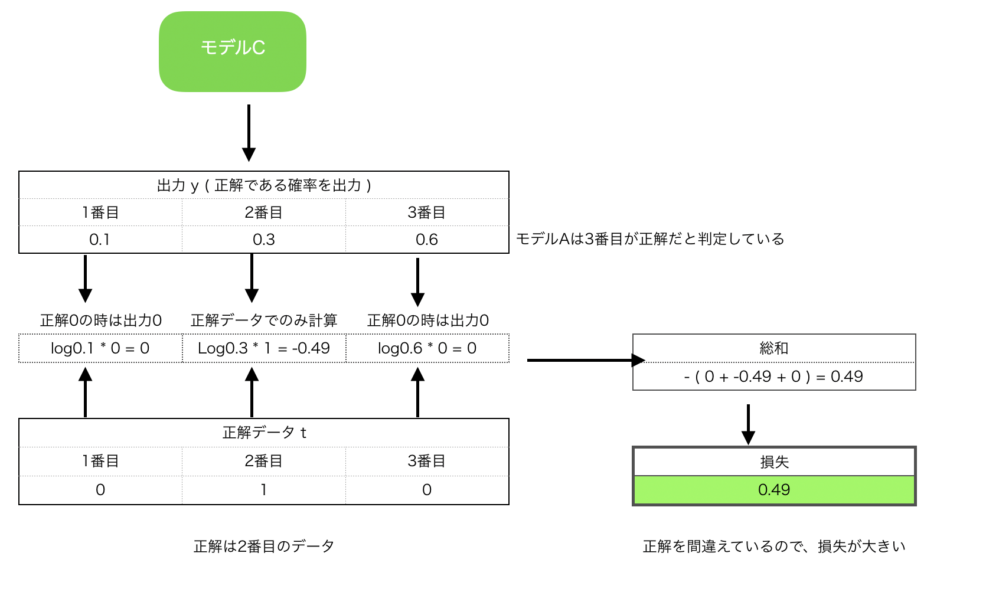](http://wild-data-chase.com/index.php/2018/12/23/post-270/#outline__3_1)

交差エントロピー誤差では、実質、t = 1 の場合にしか計算は行われません(t = 0 の時には、乗算結果は常に 0 に収束するから)。今回 t = 1 なのは2番目のデータなので、2番目で計算が行われます。
モデル出力 y の2番目は 0.3 (正解を判断できていない)で、その log をとると -0.49 となり、この正負をひっくり返した 0.49 という値が損失として出力されます。

[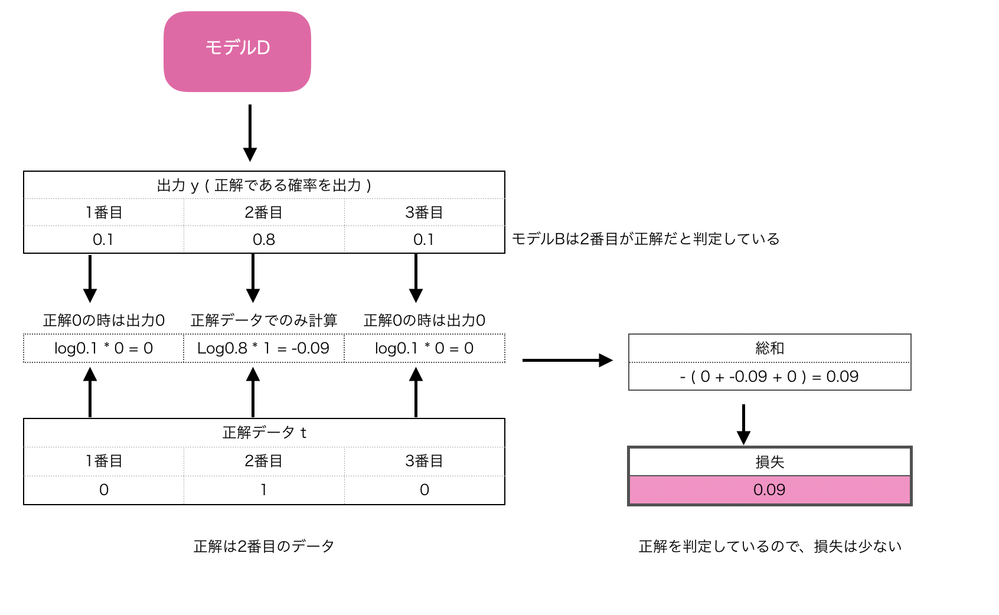](http://wild-data-chase.com/index.php/2018/12/23/post-270/#outline__3_1)

対して、こちらは正解を判定できている場合です。上と同じように、モデル出力 y の2番目の値を見てみると 0.8 となっており(正解を判定できている)、その log値は -0.09 です。先ほどと同じように損失を求めると、こちらの損失は 0.09 と出力されました。

このように、二乗和誤差の時と同様に、正解を正しく判定できている場合に、損失が小さくなる、ことを確認できます。


**→要するにモデル出力 y のlog値と正解データ t を乗算し、それを全て足し合わせて、マイナスを付ければ良いということ！！(バッチサイズが20あるので、さらに平均をする)**

In [41]:
def cross_entropy(y, t):
    d = 1e-7  # 計算不能に陥ることを避けるための微小な値
    return -np.sum(t * np.log(y + d)) / batch_size

### 【問題4】バックプロパゲーションの実装

三層のニューラルネットワークのバックプロパゲーションを作成してください。確率的勾配降下法を行う部分です。


数式を以下に示します。


まず、i層目の重みとバイアスの更新式です。 $W_i$ と $B_i$ に対し、更新後の $W_i^{\prime}$ と $B_i^{\prime}$ は次の数式で求められます。

$$
W_i^{\prime} = W_i - \alpha \frac{\partial L}{\partial W_i} \\
B_i^{\prime} = B_i - \alpha \frac{\partial L}{\partial B_i}
$$

$\alpha$ : 学習率（層ごとに変えることも可能だが、基本的には全て同じとする）


$\frac{\partial L}{\partial W_i}$ : $W_i$ に関する損失 $L$ の勾配


$\frac{\partial L}{\partial B_i}$ : $B_i$ に関する損失 $L$ の勾配


＊この勾配はミニバッチのサンプル数分の合計または平均を考えます。ここでは合計を計算します。


この更新方法はSprint3線形回帰やsprint4ロジスティック回帰における最急降下法と同様です。より効果的な更新方法が知られており、それは次のSprintで扱います。


勾配 $\frac{\partial L}{\partial W_i}$ や $\frac{\partial L}{\partial B_i}$ を求めるために、バックプロパゲーションを行います。以下の数式です。ハイパボリックタンジェント関数を使用した例を載せました。シグモイド関数の場合の数式はその後ろにあります。



- 「3層目」

$$
\frac{\partial L}{\partial A_3} = Z_{3} - Y\\
\frac{\partial L}{\partial B_3} = \sum_{j}^{n_b}\frac{\partial L}{\partial A_{3\_j}}\\
\frac{\partial L}{\partial W_3} = Z_{2}^{T}\cdot \frac{\partial L}{\partial A_3}\\
\frac{\partial L}{\partial Z_2} = \frac{\partial L}{\partial A_3} \cdot W_3^T
$$

$\frac{\partial L}{\partial A_3}$ : $A_3$ に関する損失 $L$ の勾配 (batch_size, n_output)


$\frac{\partial L}{\partial A_{3_j}}$ : j番目のサンプルの$A_3$ に関する損失 $L$ の勾配 (n_nodes2,)


$\frac{\partial L}{\partial B_3}$ : $B_3$ に関する損失 $L$ の勾配 (n_output,)


$\frac{\partial L}{\partial W_3}$ : $W_3$ に関する損失 $L$ の勾配 (n_nodes2, n_output) 


$\frac{\partial L}{\partial Z_2}$ : $Z_2$ に関する損失 $L$ の勾配 (batch_size, n_nodes2)


$Z_{3}$ : ソフトマックス関数の出力 (batch_size, n_output)


$Y$ : 正解ラベル (batch_size, n_output)


$Z_{2}$ : 2層目の活性化関数の出力 (batch_size, n_nodes2)


$W_3$ : 3層目の重み (n_nodes2, n_output)


1.　

$$
\frac{\partial L}{\partial A_3} = Z_{3} - Y\\
$$

In [42]:
delta_A3 = Z3 - mini_y_train
# print(delta_A3)
print(delta_A3.shape)  # (batch_size, n_output)

(20, 10)


2.

$$
\frac{\partial L}{\partial B_3} = \sum_{j}^{n_b}\frac{\partial L}{\partial A_{3\_j}}\\
$$

In [43]:
delta_B3 = np.sum(delta_A3, axis=0)
delta_B3.shape  # (n_output,)

(10,)

3.  


$$
\frac{\partial L}{\partial W_3} = Z_{2}^{T}\cdot \frac{\partial L}{\partial A_3}\\
$$

In [44]:
delta_W3 = np.dot(Z2.T, delta_A3)
delta_W3.shape  # (n_nodes2, n_output)

(200, 10)

4. 


$$
\frac{\partial L}{\partial Z_2} = \frac{\partial L}{\partial A_3} \cdot W_3^T
$$


In [45]:
delta_Z2 = np.dot(delta_A3, W3.T)
delta_Z2.shape  # (batch_size, n_nodes2)

(20, 200)

- ２層目

$$
\frac{\partial L}{\partial A_2} = \frac{\partial L}{\partial Z_2} \odot \{1-tanh^2(A_{2})\}\\
\frac{\partial L}{\partial B_2} = \sum_{j}^{n_b}\frac{\partial L}{\partial A_{2\_j}}\\
\frac{\partial L}{\partial W_2} = Z_{1}^T \cdot \frac{\partial L}{\partial A_2}\\
\frac{\partial L}{\partial Z_1} = \frac{\partial L}{\partial A_2} \cdot W_2^T
$$

#### 《補足》
活性化関数にシグモイド関数を使用した場合は、次のようになります。

$$
\frac{\partial L}{\partial A_2} = \frac{\partial L}{\partial Z_2} \odot  \{1-sigmoid(A_{2})\}sigmoid(A_{2})
\\
$$

$\frac{\partial L}{\partial A_2}$ : $A_2$ に関する損失 $L$ の勾配 (batch_size, n_nodes2)


$\frac{\partial L}{\partial A_{2_j}}$ : j番目のサンプルの$A_2$ に関する損失 $L$ の勾配 (n_nodes2,)


$\frac{\partial L}{\partial B_2}$ : $B_2$ に関する損失 $L$ の勾配 (n_output,)


$\frac{\partial L}{\partial W_2}$ : $W_2$ に関する損失 $L$ の勾配 (n_nodes1, n_nodes2)


$\frac{\partial L}{\partial Z_2}$ : $Z_2$ に関する損失 $L$ の勾配 (batch_size, n_nodes2)


$A_2$ : 2層目の出力 (batch_size, n_nodes2)


$Z_{1}$ : 1層目の活性化関数の出力 (batch_size, n_nodes1)


$W_2$ : 2層目の重み (n_nodes1, n_nodes2)


1. 


$$
\frac{\partial L}{\partial A_2} = \frac{\partial L}{\partial Z_2} \odot  \{1-sigmoid(A_{2})\}sigmoid(A_{2})
\\
$$

In [46]:
mini_sigmoidA2 = (1 - sigmoid(A2)) * sigmoid(A2)
print(mini_sigmoidA2.shape)
print(delta_Z2.shape)
delta_A2 = delta_Z2 * mini_sigmoidA2
print(delta_A2.shape)  # (batch_size, n_nodes2)

(20, 200)
(20, 200)
(20, 200)


2.　

$$
\frac{\partial L}{\partial B_2} = \sum_{j}^{n_b}\frac{\partial L}{\partial A_{2\_j}}\\
$$

In [47]:
delta_B2 = np.sum(delta_A2, axis=0)
delta_B2.shape  # (n_output,)# 2層目のノード数あればOK

(200,)

3. 


$$
\frac{\partial L}{\partial W_2} = Z_{1}^T \cdot \frac{\partial L}{\partial A_2}\\
$$

In [48]:
delta_W2 = np.dot(Z1.T, delta_A2)
delta_W3.shape  # (n_nodes2, n_output)

(200, 10)

4. 


$$
\frac{\partial L}{\partial Z_1} = \frac{\partial L}{\partial A_2} \cdot W_2^T
$$

In [49]:
delta_Z1 = np.dot(delta_A2, W2.T)
delta_Z1.shape  # (batch_size, n_nodes2)

(20, 400)

- １層目

$$
\frac{\partial L}{\partial A_1} = \frac{\partial L}{\partial Z_1} \odot \{1-tanh^2(A_{1})\}\\
\frac{\partial L}{\partial B_1} = \sum_{j}^{n_b}\frac{\partial L}{\partial A_{1\_j}}\\
\frac{\partial L}{\partial W_1} = X^T \cdot \frac{\partial L}{\partial A_1}\\
$$

#### 《補足》
活性化関数にシグモイド関数を使用した場合は、次のようになります。

$$
\frac{\partial L}{\partial A_1} = \frac{\partial L}{\partial Z_1} \odot  \{1-sigmoid(A_{1})\}sigmoid(A_{1})
$$

$\frac{\partial L}{\partial A_1}$ : $A_1$ に関する損失 $L$ の勾配 (batch_size, n_nodes1)


$\frac{\partial L}{\partial A_{1_j}}$ : j番目のサンプルの$A_1$ に関する損失 $L$ の勾配 (n_nodes1,)


$\frac{\partial L}{\partial B_1}$ : $B_1$ に関する損失 $L$ の勾配 (n_output,)


$\frac{\partial L}{\partial W_1}$ : $W_1$ に関する損失 $L$ の勾配 (n_features, n_nodes1)


$\frac{\partial L}{\partial Z_1}$ : $Z_1$ に関する損失 $L$ の勾配 (batch_size, n_nodes1)


$A_1$ : 1層目の出力 (batch_size, n_nodes1)


$X$ : 特徴量ベクトル (batch_size, n_features)


$W_1$ : 1層目の重み (n_features, n_nodes1)

1.


$$
\frac{\partial L}{\partial A_1} = \frac{\partial L}{\partial Z_1} \odot  \{1-sigmoid(A_{1})\}sigmoid(A_{1})
$$

In [50]:
mini_sigmoidA1 = (1 - sigmoid(A1)) * sigmoid(A1)
print(mini_sigmoidA1.shape)
print(delta_Z1.shape)
delta_A1 = delta_Z1 * mini_sigmoidA1
print(delta_A1.shape)  # (batch_size, n_nodes1)

(20, 400)
(20, 400)
(20, 400)


2. 


$$
\frac{\partial L}{\partial B_1} = \sum_{j}^{n_b}\frac{\partial L}{\partial A_{1\_j}}\\
$$

In [51]:
delta_B1 = np.sum(delta_A1, axis=0)
delta_B1.shape  # (n_output,)# 1層目のノード数あればOK

(400,)

3. 


$$
\frac{\partial L}{\partial W_1} = X^T \cdot \frac{\partial L}{\partial A_1}\\
$$

In [52]:
delta_W1 = np.dot(mini_X_train.T, delta_A1)
delta_W1.shape  # (n_features, n_nodes1)

(784, 400)

### 【問題5】推定
推定を行うメソッドを作成してください。


フォワードプロパゲーションによって出力された10個の確率の中で、最も高いものはどれかを判定します。


In [53]:
print(Z3.argmax(axis=1))

[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5]


### 【問題6】学習と推定

MNISTのデータを学習・推定し、Accuracyを計算してください。


In [54]:
# valデータもtrainデータと同じバッチ数で分ける

get_mini_batch = GetMiniBatch(X_val, y_val, batch_size=20)
print(len(get_mini_batch))
# print(get_mini_batch[5]) # 5番目のミニバッチが取得できる
for mini_X_val, mini_y_val in get_mini_batch:
    # このfor文内でミニバッチが使える
    # print("mini_X:\n{}".format(mini_X_val))
    # print("mini_y:\n{}".format(mini_y_val))
    pass

600


In [55]:
n_features = 784
n_nodes1 = 400
sigma = 0.01  # ガウス分布の標準偏差

# 重み
W1 = sigma * np.random.randn(n_features, n_nodes1)
W2 = sigma * np.random.randn(n_nodes1, n_nodes2)
W3 = sigma * np.random.randn(n_nodes2, n_output)

# バイアス
B1 = sigma * np.random.randn(n_nodes1)
B2 = sigma * np.random.randn(n_nodes2)
B3 = sigma * np.random.randn(n_output)

In [56]:
from sklearn.metrics import accuracy_score

In [57]:
# 1エポックの推定を出す

get_mini_batch = GetMiniBatch(X_train, y_train, batch_size=20)

for mini_X_train, mini_y_train in get_mini_batch:
    # このfor文内でミニバッチが使える

    # Forwardpropagation
    A1 = np.dot(mini_X_train, W1) + B1
    Z1 = sigmoid(A1)

    A2 = np.dot(Z1, W2) + B2
    Z2 = sigmoid(A2)

    A3 = np.dot(Z2, W3) + B3
    Z3 = softmax(A3)
    # print(Z3)
    # print("fW1:\n{}".format(W1))

    # backpropagation

    alpha = 0.01

    delta_A3 = Z3 - mini_y_train
    delta_B3 = np.sum(delta_A3, axis=0)
    delta_W3 = np.dot(Z2.T, delta_A3)
    delta_Z2 = np.dot(delta_A3, W3.T)
    W3 = W3 - alpha*delta_W3
    B3 = B3 - alpha*delta_B3
    # print(delta_W3)

    mini_sigmoidA2 = (1 - sigmoid(A2)) * sigmoid(A2)
    delta_A2 = delta_Z2 * mini_sigmoidA2
    delta_B2 = np.sum(delta_A2, axis=0)
    delta_W2 = np.dot(Z1.T, delta_A2)
    delta_Z1 = np.dot(delta_A2, W2.T)
    W2 = W2 - alpha*delta_W2
    B2 = B2 - alpha*delta_B2
    # print(delta_W2)

    mini_sigmoidA1 = (1 - sigmoid(A1)) * sigmoid(A1)
    delta_A1 = delta_Z1 * mini_sigmoidA1
    delta_B1 = np.sum(delta_A1, axis=0)
    delta_W1 = np.dot(mini_X_train.T, delta_A1)
    W1 = W1 - alpha*delta_W1
    B1 = B1 - alpha*delta_B1
    # print(delta_A1)
    # print(delta_W1[0])
    print("mini_y_pred:\n{}".format(Z3.argmax(axis=1)))
    print("mini_y_train:\n{}".format(mini_y_train.argmax(axis=1)))
    print("正解率： {}".format(accuracy_score(
        Z3.argmax(axis=1), mini_y_train.argmax(axis=1))))
    #print(" bW3:\n{}".format(W1))

    pass

mini_y_pred:
[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
mini_y_train:
[1 9 3 2 0 3 0 0 5 1 1 4 8 3 9 6 4 6 1 4]
正解率： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 8 8 3 8 7 2 9 8 7 1 1 1 7 0 9 9 4 9 1]
正解率： 0.25
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[8 1 6 2 8 8 3 4 0 6 3 3 9 2 6 8 7 5 9 8]
正解率： 0.05
mini_y_pred:
[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8]
mini_y_train:
[3 9 2 7 3 6 3 4 3 5 1 9 7 6 9 4 3 8 7 6]
正解率： 0.05
mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
mini_y_train:
[4 8 1 8 2 9 3 4 1 1 0 9 5 8 6 3 5 3 3 0]
正解率： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[6 6 5 8 7 9 9 5 2 9 3 3 8 6 9 9 3 1 2 3]
正解率： 0.05
mini_y_pred:
[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
mini_y_train:
[8 3 0 9 4 3 5 1 8 8 9 1 7 3 9 3 7 0 8 9]
正解率： 0.2
mini_y_pred:
[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8]
mini_y_train:
[3 8 8 3 3 0 5 7 1 2 7 3 9 9 9 3 2 0 9 1]
正解率： 0.1
mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 

mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
mini_y_train:
[1 8 5 2 9 0 3 0 8 7 2 2 3 6 8 1 2 7 8 6]
正解率： 0.1
mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
mini_y_train:
[1 5 9 8 7 7 6 5 8 1 5 5 1 9 1 0 9 9 9 7]
正解率： 0.0
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 3 8 1 7 9 8 0 2 8 2 5 3 4 6 1 8 0 8 7]
正解率： 0.1
mini_y_pred:
[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8]
mini_y_train:
[0 4 7 4 1 3 0 9 9 7 1 4 8 3 4 2 1 8 2 5]
正解率： 0.1
mini_y_pred:
[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8]
mini_y_train:
[2 4 1 1 4 9 8 4 1 3 7 6 0 7 8 4 5 2 6 1]
正解率： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 0 1 7 4 7 7 3 9 9 9 7 2 9 5 0 2 5 5 8]
正解率： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 6 4 5 9 9 0 3 7 3 4 8 6 8 4 2 9 4 9]
正解率： 0.05
mini_y_pred:
[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9]
mini_y_train:
[9 4 8 0 7 4 6 3 6 8 3 3 7 1 6 2 0 2 3 9]
正解率： 0.1
mini_y_pred:
[9 9 9 9 9 9 9 9 9 9 9 9 

mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
mini_y_train:
[3 0 7 5 6 1 0 0 1 4 8 7 2 2 4 3 7 5 1 4]
正解率： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[8 6 1 9 3 3 6 0 9 8 6 3 3 2 7 3 0 7 4 2]
正解率： 0.05
mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
mini_y_train:
[2 3 5 1 8 6 9 4 4 7 0 9 7 1 6 2 8 4 4 1]
正解率： 0.05
mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
mini_y_train:
[0 8 9 2 0 3 3 3 7 2 4 9 9 2 9 8 8 5 6 4]
正解率： 0.15
mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
mini_y_train:
[2 1 3 2 3 0 6 7 3 5 1 6 2 9 0 0 7 1 9 8]
正解率： 0.15
mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
mini_y_train:
[0 8 6 2 8 8 4 3 9 0 0 1 8 5 9 1 5 5 9 8]
正解率： 0.05
mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
mini_y_train:
[1 6 2 7 7 2 5 8 1 3 3 7 5 1 2 4 4 1 0 1]
正解率： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 8 0 3 5 8 3 7 4 0 0 5 5 0 3 9 2 6 1 1]
正解率： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1

mini_y_pred:
[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8]
mini_y_train:
[1 1 6 2 1 2 5 8 6 4 9 2 4 6 2 7 8 6 0 9]
正解率： 0.1
mini_y_pred:
[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8]
mini_y_train:
[5 8 4 8 5 8 1 3 2 3 7 8 6 9 0 8 6 3 4 6]
正解率： 0.25
mini_y_pred:
[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8]
mini_y_train:
[2 4 0 6 7 0 0 1 0 4 0 0 2 9 0 1 4 6 1 4]
正解率： 0.0
mini_y_pred:
[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8]
mini_y_train:
[5 1 7 6 7 3 0 5 5 0 0 3 0 3 9 2 4 6 3 9]
正解率： 0.0
mini_y_pred:
[8 8 0 8 8 8 8 0 8 0 0 8 8 8 8 8 8 8 8 0]
mini_y_train:
[8 3 3 5 3 6 5 6 6 5 9 2 1 1 3 7 7 4 2 6]
正解率： 0.05
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[3 8 3 0 4 0 1 4 6 3 6 7 6 7 1 8 5 8 4 6]
正解率： 0.2
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[7 3 3 7 3 1 6 4 5 2 4 9 8 4 5 4 0 7 3 5]
正解率： 0.05
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[8 7 3 1 8 7 0 2 1 4 1 8 2 7 2 0 1 3 6 3]
正解率： 0.05
mini_y_pred:
[8 8 8 8 8 8 8 8 8 8 8 

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 5 5 9 2 8 8 7 2 4 7 8 9 5 5 0 3 2 9 9]
正解率： 0.0
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 1 3 6 7 2 0 6 7 3 4 5 7 5 7 6 3 1 3 1]
正解率： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[8 1 3 2 1 5 5 9 1 1 4 2 2 3 1 8 1 7 3 8]
正解率： 0.3
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[6 9 6 3 7 9 0 2 0 3 2 2 2 7 4 7 1 9 3 3]
正解率： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 4 7 2 8 7 0 0 8 6 7 3 4 5 4 9 2 6 4 5]
正解率： 0.0
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 8 3 3 7 6 9 5 5 2 7 6 6 5 5 7 5 4 6 5]
正解率： 0.0
mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 1]
mini_y_train:
[9 0 2 5 2 4 9 7 2 6 0 3 3 4 9 2 5 4 1 7]
正解率： 0.15
mini_y_pred:
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
mini_y_train:
[8 0 5 0 7 0 2 6 4 9 1 7 8 8 7 1 5 7 5 0]
正解率： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7

mini_y_pred:
[1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[2 1 7 9 2 8 9 6 2 0 3 8 1 6 1 2 3 1 9 5]
正解率： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 7 8 7 8 7 0 2 9 4 2 1 3 6 8 8 9 8 2 2]
正解率： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 9 7 3 1 0 8 8 1 7 4 7 4 9 5 2 4 7 1 4]
正解率： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 0 5 9 5 6 2 4 2 5 9 8 0 7 8 3 2 4 8 9]
正解率： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 9 3 3 2 3 7 7 1 2 6 5 1 6 5 8 0 5 0 8]
正解率： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 8 7 6 1 5 3 4 3 2 6 8 8 6 7 2 9 4 6 3]
正解率： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 7 9 0 4 9 3 4 4 5 1 5 2 9 9 9 3 1 7 3]
正解率： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 7 9 1 1 9 5 8 8 0 3 2 5 4 9 8 1 5 7 7]
正解率： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 

mini_y_pred:
[7 7 7 0 7 0 7 7 0 7 7 7 0 7 7 0 7 1 7 7]
mini_y_train:
[6 2 5 0 5 4 7 5 0 7 5 6 2 4 8 4 4 1 5 2]
正解率： 0.25
mini_y_pred:
[5 5 7 5 7 7 0 7 5 5 0 5 5 5 5 5 7 7 5 5]
mini_y_train:
[2 6 9 0 1 8 0 7 2 0 2 8 6 2 5 3 4 5 4 4]
正解率： 0.15
mini_y_pred:
[5 7 1 7 5 5 5 5 5 5 5 5 5 5 5 5 5 5 0 1]
mini_y_train:
[2 5 1 4 6 2 3 9 3 7 6 4 6 4 3 4 7 6 8 1]
正解率： 0.1
mini_y_pred:
[7 5 1 7 5 1 7 5 5 5 0 5 1 0 5 7 5 5 0 7]
mini_y_train:
[3 2 1 3 8 1 1 8 6 3 0 6 1 0 5 6 2 0 0 4]
正解率： 0.35
mini_y_pred:
[1 1 1 1 5 5 0 5 1 1 1 0 1 1 5 0 0 1 5 5]
mini_y_train:
[1 7 1 1 3 8 5 3 4 7 1 0 8 3 9 0 6 7 6 4]
正解率： 0.3
mini_y_pred:
[1 1 3 3 3 1 0 0 1 1 1 1 3 0 1 1 1 3 3 1]
mini_y_train:
[9 1 2 9 3 2 8 0 9 9 8 3 6 5 1 9 1 2 6 9]
正解率： 0.25
mini_y_pred:
[0 0 1 1 0 1 1 1 1 0 1 1 1 0 0 1 3 0 3 0]
mini_y_train:
[6 3 9 1 3 4 9 5 5 0 5 9 3 0 0 7 5 6 2 0]
正解率： 0.25
mini_y_pred:
[1 1 1 5 1 1 1 0 1 0 5 5 1 5 5 1 1 1 1 5]
mini_y_train:
[0 9 7 6 7 2 7 0 6 2 3 6 4 6 5 1 6 5 8 4]
正解率： 0.15
mini_y_pred:
[1 1 1 6 1 0 6 1 1 5 

mini_y_pred:
[1 1 0 0 7 1 1 7 7 0 1 0 0 0 0 7 7 0 0 7]
mini_y_train:
[5 1 5 0 4 1 1 2 9 0 1 0 5 6 3 5 2 0 0 7]
正解率： 0.5
mini_y_pred:
[1 1 1 1 0 1 1 1 1 0 0 0 0 7 7 1 1 1 0 1]
mini_y_train:
[4 9 9 1 6 1 4 1 3 5 5 0 9 3 7 7 8 1 0 4]
正解率： 0.35
mini_y_pred:
[1 1 1 0 0 1 1 0 0 0 1 7 0 1 1 1 1 1 1 0]
mini_y_train:
[8 0 9 8 3 7 2 2 5 0 3 4 6 1 6 7 3 4 4 3]
正解率： 0.1
mini_y_pred:
[1 0 1 7 0 0 1 1 0 0 1 1 1 1 1 1 7 0 0 1]
mini_y_train:
[9 3 0 9 5 3 7 9 2 0 3 9 7 7 1 7 9 0 0 1]
正解率： 0.25
mini_y_pred:
[1 1 0 0 1 7 1 1 1 1 1 1 0 1 1 7 1 1 1 1]
mini_y_train:
[7 7 6 0 6 5 9 5 2 2 5 3 0 9 8 6 1 4 2 4]
正解率： 0.15
mini_y_pred:
[0 1 7 0 0 0 1 7 1 1 7 1 1 0 1 1 7 1 1 1]
mini_y_train:
[6 1 8 2 0 6 5 5 8 2 7 5 7 8 8 1 5 7 7 5]
正解率： 0.2
mini_y_pred:
[1 7 7 1 1 7 7 7 1 0 0 7 1 1 1 1 1 7 1 7]
mini_y_train:
[6 6 7 1 9 6 9 8 7 0 0 8 9 2 1 1 8 9 1 7]
正解率： 0.4
mini_y_pred:
[1 1 7 1 0 1 1 1 1 0 7 7 7 1 7 1 7 1 0 7]
mini_y_train:
[7 6 2 7 0 4 7 7 8 6 4 2 6 7 4 1 6 8 0 5]
正解率： 0.15
mini_y_pred:
[1 1 7 7 1 1 7 1 7 7 1 

mini_y_pred:
[1 1 1 1 0 1 1 0 1 1 3 1 1 1 1 0 1 1 1 3]
mini_y_train:
[8 9 8 6 4 8 8 0 4 4 8 9 3 1 7 0 3 7 1 3]
正解率： 0.25
mini_y_pred:
[1 1 1 0 1 3 1 0 1 1 1 1 3 3 1 1 1 0 1 1]
mini_y_train:
[9 1 3 5 1 4 1 5 2 9 4 1 3 2 9 2 1 5 1 3]
正解率： 0.35
mini_y_pred:
[3 1 3 1 1 3 3 1 3 1 1 1 1 1 3 0 1 1 1 3]
mini_y_train:
[5 8 5 1 8 4 8 2 6 8 6 4 2 5 2 0 6 5 4 3]
正解率： 0.15
mini_y_pred:
[1 1 1 1 1 0 1 1 1 1 0 1 1 3 1 0 1 0 3 3]
mini_y_train:
[1 1 8 2 7 6 8 7 9 6 6 6 6 9 4 0 3 6 8 2]
正解率： 0.15
mini_y_pred:
[6 3 3 1 1 6 1 1 0 0 3 3 3 6 1 6 6 1 1 1]
mini_y_train:
[5 4 2 3 7 2 3 8 3 5 7 2 4 2 1 6 6 6 1 2]
正解率： 0.2
mini_y_pred:
[0 1 3 0 1 0 1 1 3 1 3 1 6 3 1 0 0 1 1 1]
mini_y_train:
[0 1 3 4 8 6 5 4 5 2 8 9 2 2 4 0 5 1 2 6]
正解率： 0.25
mini_y_pred:
[1 1 0 1 1 2 1 2 1 2 1 2 2 2 1 2 1 2 2 1]
mini_y_train:
[4 2 0 8 1 5 9 7 7 7 2 2 8 8 1 5 7 3 4 7]
正解率： 0.2
mini_y_pred:
[2 1 1 1 1 1 1 1 0 1 2 0 2 1 1 1 2 1 0 1]
mini_y_train:
[4 4 7 7 7 7 7 9 0 3 5 5 4 1 1 4 6 8 0 1]
正解率： 0.25
mini_y_pred:
[1 1 1 2 1 0 0 1 1 1 

mini_y_pred:
[1 1 0 9 6 6 1 9 1 0 1 0 6 1 1 0 0 0 9 1]
mini_y_train:
[1 5 6 2 6 7 8 5 1 8 8 2 2 1 5 0 5 0 4 9]
正解率： 0.3
mini_y_pred:
[0 6 0 6 1 0 9 6 0 1 6 1 1 1 9 9 6 0 0 1]
mini_y_train:
[2 5 6 4 7 2 9 5 4 8 2 9 8 1 5 8 7 8 7 4]
正解率： 0.1
mini_y_pred:
[6 1 0 9 0 1 1 1 0 0 1 9 0 6 9 1 1 9 1 9]
mini_y_train:
[4 7 9 5 6 1 8 9 0 4 1 9 0 5 8 6 1 9 1 7]
正解率： 0.4
mini_y_pred:
[9 9 9 9 1 0 9 9 1 1 0 9 9 6 9 0 1 0 0 9]
mini_y_train:
[3 2 7 2 7 4 8 3 5 6 6 3 4 4 7 8 4 8 0 5]
正解率： 0.05
mini_y_pred:
[1 1 6 0 6 0 0 1 9 6 1 0 6 9 9 1 1 0 0 1]
mini_y_train:
[4 9 3 6 2 0 8 1 8 5 8 6 3 2 5 7 9 0 6 1]
正解率： 0.2
mini_y_pred:
[1 0 1 1 9 9 9 6 1 0 1 0 0 6 0 0 1 6 0 9]
mini_y_train:
[7 2 8 9 9 5 7 0 8 3 7 2 6 2 0 2 1 6 8 7]
正解率： 0.2
mini_y_pred:
[1 1 6 0 0 1 6 1 8 1 1 8 8 8 0 1 1 9 8 0]
mini_y_train:
[1 8 0 0 4 1 6 9 2 7 3 0 8 2 6 7 2 5 7 0]
正解率： 0.3
mini_y_pred:
[0 7 0 8 7 1 0 8 0 1 6 0 8 1 7 8 1 8 0 8]
mini_y_train:
[6 5 0 6 6 2 0 3 0 1 6 6 2 1 5 6 3 9 5 8]
正解率： 0.35
mini_y_pred:
[6 0 1 6 0 6 6 0 0 0 1 0 

mini_y_pred:
[0 2 1 0 0 7 0 0 2 1 0 7 7 7 7 7 0 1 0 2]
mini_y_train:
[8 9 9 2 0 7 0 3 4 1 3 4 5 9 6 7 8 9 0 4]
正解率： 0.3
mini_y_pred:
[0 0 0 0 0 7 1 7 1 1 7 7 2 2 0 7 0 7 0 0]
mini_y_train:
[5 9 0 8 5 6 2 7 7 7 4 8 9 2 5 4 0 3 0 0]
正解率： 0.3
mini_y_pred:
[0 0 0 7 7 0 1 2 2 0 0 0 1 7 1 0 7 0 0 0]
mini_y_train:
[8 4 7 5 4 8 1 8 2 0 5 5 7 3 7 0 3 0 2 3]
正解率： 0.25
mini_y_pred:
[2 0 0 1 1 2 1 1 7 0 0 0 7 7 1 0 0 1 2 7]
mini_y_train:
[6 0 5 2 1 7 9 1 2 0 6 3 2 8 1 0 3 8 8 8]
正解率： 0.3
mini_y_pred:
[0 0 0 1 0 2 0 0 0 1 0 0 0 2 0 7 7 1 1 1]
mini_y_train:
[3 9 4 1 6 4 2 8 5 7 0 0 3 8 8 5 8 7 1 8]
正解率： 0.2
mini_y_pred:
[0 0 0 8 7 0 7 0 0 7 1 0 7 8 0 0 8 1 0 0]
mini_y_train:
[2 2 8 9 8 4 4 0 7 2 3 3 2 5 6 4 6 4 4 0]
正解率： 0.1
mini_y_pred:
[1 1 1 1 0 0 2 1 0 2 0 2 1 0 2 0 2 2 2 1]
mini_y_train:
[8 1 1 9 5 0 2 1 2 7 3 4 2 9 5 0 8 4 5 1]
正解率： 0.35
mini_y_pred:
[1 0 0 0 0 7 7 0 0 2 2 1 0 0 0 7 0 2 7 1]
mini_y_train:
[7 6 2 3 4 2 3 7 6 8 8 8 9 6 5 8 5 9 5 7]
正解率： 0.0
mini_y_pred:
[0 8 0 7 0 1 0 1 1 8 8 0 

mini_y_pred:
[2 0 1 7 0 7 2 0 0 0 0 1 0 0 0 2 2 0 2 2]
mini_y_train:
[6 0 1 2 5 9 7 0 0 0 0 7 6 6 4 0 6 3 9 9]
正解率： 0.3
mini_y_pred:
[0 7 7 7 7 2 2 2 1 7 2 0 7 7 7 7 0 0 0 0]
mini_y_train:
[0 2 6 6 7 3 4 4 8 3 7 3 3 3 9 3 3 0 0 5]
正解率： 0.2
mini_y_pred:
[2 7 0 1 7 1 7 0 0 1 1 1 0 7 0 0 2 1 0 1]
mini_y_train:
[5 2 5 1 9 1 8 4 2 1 1 1 0 9 2 6 6 1 0 1]
正解率： 0.45
mini_y_pred:
[2 0 7 2 0 7 7 7 7 7 7 2 0 2 7 0 1 1 0 7]
mini_y_train:
[4 8 8 8 6 9 5 8 4 4 8 5 4 3 7 3 1 1 6 5]
正解率： 0.15
mini_y_pred:
[8 0 7 7 0 7 7 7 0 7 1 0 0 8 1 7 0 7 0 7]
mini_y_train:
[9 4 7 8 5 3 4 7 8 5 1 3 5 6 1 7 8 7 0 5]
正解率： 0.35
mini_y_pred:
[0 0 7 0 0 7 1 7 8 7 8 1 7 0 0 0 1 8 7 7]
mini_y_train:
[9 2 4 0 0 8 1 7 3 3 4 9 4 3 0 4 7 2 2 7]
正解率： 0.3
mini_y_pred:
[0 0 1 7 7 1 8 7 7 7 7 7 8 7 8 7 0 7 0 1]
mini_y_train:
[3 6 1 6 4 8 4 4 6 9 8 8 7 3 3 7 0 6 6 1]
正解率： 0.2
mini_y_pred:
[0 0 0 7 7 0 8 7 0 8 8 0 7 7 0 0 7 1 7 0]
mini_y_train:
[0 0 6 3 7 6 2 7 9 2 2 0 2 7 0 0 7 1 6 4]
正解率： 0.5
mini_y_pred:
[0 8 1 7 7 0 1 1 0 7 8 7

mini_y_pred:
[1 1 0 3 3 7 1 7 3 1 3 3 7 1 3 1 0 0 1 7]
mini_y_train:
[1 9 4 3 7 9 1 3 2 1 4 5 2 1 4 1 2 4 1 6]
正解率： 0.35
mini_y_pred:
[7 7 3 7 1 1 7 3 3 0 3 3 7 3 3 7 0 7 3 0]
mini_y_train:
[7 9 9 3 1 8 7 2 4 0 2 3 9 8 8 7 8 3 3 3]
正解率： 0.35
mini_y_pred:
[7 7 0 0 0 3 3 3 3 7 1 1 0 3 3 3 1 3 7 3]
mini_y_train:
[3 7 2 6 5 3 9 8 4 8 7 8 2 6 7 6 1 7 4 2]
正解率： 0.15
mini_y_pred:
[0 0 0 3 0 3 1 7 1 0 1 0 3 1 3 1 0 3 3 0]
mini_y_train:
[0 0 5 2 0 5 1 2 1 0 1 0 8 1 9 1 6 9 2 2]
正解率： 0.5
mini_y_pred:
[3 0 3 3 1 1 7 7 0 3 3 3 7 3 0 7 0 0 0 1]
mini_y_train:
[2 0 6 9 1 9 2 9 6 3 3 7 3 3 0 3 6 6 3 1]
正解率： 0.35
mini_y_pred:
[0 1 7 1 1 0 1 7 1 3 3 0 3 3 0 0 7 3 0 0]
mini_y_train:
[5 5 3 1 8 4 9 9 1 8 9 0 9 4 0 2 7 9 0 2]
正解率： 0.3
mini_y_pred:
[3 3 3 3 9 3 7 3 1 1 3 0 3 0 1 3 3 3 1 0]
mini_y_train:
[4 8 3 3 2 2 5 6 1 1 6 5 9 0 1 3 2 4 7 3]
正解率： 0.35
mini_y_pred:
[3 1 3 0 1 1 3 0 0 3 3 3 1 1 0 0 3 0 1 3]
mini_y_train:
[6 9 7 0 8 1 8 8 6 2 3 5 1 1 5 0 2 6 1 8]
正解率： 0.35
mini_y_pred:
[3 0 3 0 1 1 3 1 3 3 

正解率： 0.2
mini_y_pred:
[3 3 9 0 3 3 9 9 9 1 3 9 7 3 7 0 0 1 7 9]
mini_y_train:
[9 6 6 6 6 3 7 6 2 1 6 4 7 9 5 6 6 7 7 9]
正解率： 0.25
mini_y_pred:
[0 6 0 3 7 1 9 9 1 1 6 6 0 6 1 1 0 3 1 0]
mini_y_train:
[4 8 0 9 7 1 9 7 1 1 2 8 3 3 1 1 4 8 7 3]
正解率： 0.4
mini_y_pred:
[3 7 1 7 3 0 9 3 7 0 1 3 0 0 7 0 9 0 3 7]
mini_y_train:
[3 5 5 7 5 2 7 3 7 5 1 3 4 6 8 0 9 5 9 7]
正解率： 0.45
mini_y_pred:
[7 0 3 3 7 0 3 1 1 0 3 7 3 1 0 1 3 7 6 3]
mini_y_train:
[7 0 7 4 3 6 4 1 1 0 5 2 4 7 5 1 6 3 0 3]
正解率： 0.35
mini_y_pred:
[0 3 0 1 7 7 0 7 7 7 1 3 7 0 3 7 7 7 0 3]
mini_y_train:
[2 6 2 1 6 6 6 3 8 3 2 3 8 0 9 7 7 9 3 9]
正解率： 0.25
mini_y_pred:
[7 0 7 3 3 0 0 7 0 7 1 0 1 6 7 1 6 3 3 1]
mini_y_train:
[7 0 6 3 2 2 3 9 6 7 1 0 1 6 9 9 7 3 4 7]
正解率： 0.45
mini_y_pred:
[1 0 3 3 0 3 1 1 3 7 0 3 3 7 3 1 3 3 0 1]
mini_y_train:
[7 3 9 4 8 9 1 1 4 2 2 4 4 9 7 1 7 9 2 1]
正解率： 0.2
mini_y_pred:
[7 7 1 7 3 1 7 7 3 3 1 3 1 0 3 7 0 7 1 3]
mini_y_train:
[7 8 1 6 3 1 9 9 5 6 7 3 1 2 9 7 2 2 1 7]
正解率： 0.4
mini_y_pred:
[0 0 0 3 3 1 

正解率： 0.35
mini_y_pred:
[9 9 0 9 0 1 0 2 1 2 1 2 9 2 0 1 0 2 2 9]
mini_y_train:
[3 6 0 9 5 1 0 5 1 2 1 2 7 5 7 1 6 4 5 9]
正解率： 0.5
mini_y_pred:
[2 2 0 9 2 0 9 0 2 9 2 9 0 1 9 0 1 2 0 0]
mini_y_train:
[4 3 5 8 9 2 4 0 3 7 9 7 0 1 8 0 1 5 0 3]
正解率： 0.3
mini_y_pred:
[2 9 0 1 0 2 0 2 2 2 0 9 9 1 2 2 0 9 1 2]
mini_y_train:
[4 8 5 7 8 8 5 8 2 9 0 9 5 7 6 6 0 8 8 4]
正解率： 0.2
mini_y_pred:
[9 0 2 0 2 9 0 0 1 0 2 9 1 2 9 0 0 9 2 2]
mini_y_train:
[2 5 9 3 8 5 0 6 7 2 5 9 7 4 8 5 4 3 2 8]
正解率： 0.15
mini_y_pred:
[1 7 2 0 7 2 1 9 0 7 9 2 0 9 2 2 0 0 1 0]
mini_y_train:
[1 7 9 0 2 3 1 3 5 3 8 5 2 6 9 9 6 0 1 8]
正解率： 0.3
mini_y_pred:
[9 9 9 1 0 9 0 9 2 0 9 0 2 9 0 2 0 9 0 0]
mini_y_train:
[8 3 7 1 6 4 4 9 3 5 9 6 3 4 3 3 0 9 0 0]
正解率： 0.35
mini_y_pred:
[0 2 9 0 2 0 9 0 1 0 2 9 2 9 9 9 1 0 9 9]
mini_y_train:
[0 5 8 6 2 9 7 3 9 0 6 9 8 4 9 7 8 5 5 2]
正解率： 0.25
mini_y_pred:
[1 1 0 2 9 1 0 9 0 0 9 9 9 2 0 1 9 9 0 9]
mini_y_train:
[1 1 5 3 7 1 6 8 8 4 9 7 7 5 3 1 4 2 5 8]
正解率： 0.25
mini_y_pred:
[0 1 9 0 0 0 

mini_y_pred:
[4 4 4 4 7 4 0 7 7 4 7 4 0 4 4 5 7 5 0 7]
mini_y_train:
[8 5 9 5 2 9 0 9 9 4 8 4 3 9 3 5 6 5 4 8]
正解率： 0.25
mini_y_pred:
[1 0 0 1 7 1 8 8 4 1 1 1 1 0 0 0 9 8 0 4]
mini_y_train:
[1 2 0 1 8 7 9 2 6 1 1 1 1 4 0 3 3 8 5 6]
正解率： 0.45
mini_y_pred:
[1 8 4 8 8 5 4 4 0 8 8 8 7 1 8 0 8 5 0 0]
mini_y_train:
[1 8 5 6 4 3 5 2 6 2 4 4 4 8 8 0 7 6 0 3]
正解率： 0.25
mini_y_pred:
[1 4 0 1 0 8 4 0 1 1 4 0 1 1 4 1 5 0 0 4]
mini_y_train:
[7 9 6 1 0 3 6 5 1 7 8 0 1 1 5 7 3 0 3 8]
正解率： 0.35
mini_y_pred:
[8 0 0 0 5 1 0 0 8 1 8 8 8 0 8 0 7 5 1 0]
mini_y_train:
[5 6 0 4 3 7 6 3 4 1 8 7 7 0 3 2 7 4 1 6]
正解率： 0.3
mini_y_pred:
[1 7 0 0 4 1 4 4 8 4 8 8 1 4 4 7 7 8 7 4]
mini_y_train:
[1 4 0 0 8 1 3 4 2 6 9 7 1 4 2 2 8 9 9 7]
正解率： 0.35
mini_y_pred:
[0 0 0 7 0 0 7 1 0 0 4 1 8 0 1 0 4 0 0 4]
mini_y_train:
[5 0 2 9 0 6 9 7 6 5 8 7 9 0 7 0 3 0 6 4]
正解率： 0.3
mini_y_pred:
[4 7 1 4 0 0 7 1 0 8 0 1 4 7 0 4 4 4 0 8]
mini_y_train:
[3 3 9 8 2 6 9 1 6 6 5 1 8 8 8 6 5 3 6 8]
正解率： 0.15
mini_y_pred:
[0 0 1 8 8 0 8 0 8 8 

mini_y_pred:
[0 4 6 0 7 0 1 7 1 7 6 0 0 7 7 6 0 6 7 6]
mini_y_train:
[0 4 2 8 9 4 1 6 1 3 8 0 6 1 8 2 0 8 9 3]
正解率： 0.3
mini_y_pred:
[0 0 6 0 6 7 1 7 4 6 7 1 6 6 4 1 7 4 4 6]
mini_y_train:
[6 2 6 0 6 8 9 9 9 0 8 1 2 2 8 1 7 4 9 7]
正解率： 0.35
mini_y_pred:
[6 7 6 0 9 6 4 1 6 0 1 7 9 1 4 6 6 6 6 6]
mini_y_train:
[6 7 3 6 3 3 4 1 4 8 7 3 5 1 3 0 0 8 3 3]
正解率： 0.25
mini_y_pred:
[6 1 0 0 1 7 6 6 1 4 0 6 0 6 6 9 1 6 6 9]
mini_y_train:
[4 1 2 3 7 7 4 9 1 9 0 3 5 6 7 9 1 5 6 4]
正解率： 0.4
mini_y_pred:
[1 7 9 7 1 0 6 4 0 6 7 0 7 1 1 7 7 4 6 9]
mini_y_train:
[1 8 8 9 1 0 9 7 2 4 9 0 7 1 1 7 7 8 8 7]
正解率： 0.45
mini_y_pred:
[7 7 1 6 0 1 7 0 6 7 6 7 6 7 6 7 1 0 1 6]
mini_y_train:
[9 8 7 3 0 1 8 4 4 1 3 7 5 3 3 2 7 2 1 4]
正解率： 0.2
mini_y_pred:
[6 7 6 7 6 6 0 1 0 0 7 6 1 7 6 6 7 1 0 7]
mini_y_train:
[6 4 4 5 3 9 0 7 6 3 2 6 1 7 6 6 2 1 0 9]
正解率： 0.45
mini_y_pred:
[6 9 0 1 6 1 6 1 1 7 6 0 0 0 0 6 7 0 0 7]
mini_y_train:
[2 3 0 1 8 1 3 1 1 4 8 2 2 5 0 6 8 3 0 9]
正解率： 0.4
mini_y_pred:
[6 0 1 7 1 7 7 7 7 7 0 

mini_y_pred:
[0 7 0 7 0 1 1 0 4 5 5 5 5 4 0 5 4 1 7 7]
mini_y_train:
[8 6 8 5 5 3 9 0 4 8 3 9 5 7 8 3 3 1 9 7]
正解率： 0.25
mini_y_pred:
[3 7 1 5 0 0 7 1 7 0 1 5 3 5 1 5 8 1 5 5]
mini_y_train:
[4 9 1 2 2 6 9 1 9 0 7 2 4 8 1 4 2 1 8 5]
正解率： 0.3
mini_y_pred:
[0 5 7 7 5 5 1 0 7 1 1 9 7 5 1 5 5 9 7 1]
mini_y_train:
[5 8 9 4 4 3 1 6 9 1 1 8 9 8 7 0 0 4 7 1]
正解率： 0.25
mini_y_pred:
[7 7 7 4 0 4 1 1 5 4 4 9 1 4 5 0 0 5 0 4]
mini_y_train:
[1 7 9 8 8 8 1 3 4 2 8 4 1 5 2 3 0 6 6 5]
正解率： 0.2
mini_y_pred:
[9 5 7 0 5 5 7 0 5 5 7 9 9 0 0 0 0 0 0 7]
mini_y_train:
[3 3 5 0 5 9 3 8 3 6 9 3 8 5 0 5 2 0 6 9]
正解率： 0.2
mini_y_pred:
[3 8 0 9 0 1 3 7 1 5 7 5 3 9 1 0 1 1 7 3]
mini_y_train:
[6 8 3 5 0 1 4 8 9 2 8 3 8 8 1 3 6 1 9 4]
正解率： 0.25
mini_y_pred:
[8 0 0 0 9 7 8 0 8 9 8 9 5 8 1 7 9 1 0 5]
mini_y_train:
[9 0 0 3 2 8 9 2 5 8 9 7 5 3 1 9 8 7 2 5]
正解率： 0.25
mini_y_pred:
[1 0 1 9 8 0 0 0 0 1 8 5 0 5 0 9 1 1 0 9]
mini_y_train:
[8 0 1 4 3 0 0 5 0 1 8 2 6 3 3 7 1 7 6 9]
正解率： 0.45
mini_y_pred:
[1 1 1 5 9 1 1 0 1 0 7

mini_y_pred:
[9 2 2 0 0 1 6 0 0 0 0 0 0 0 9 0 9 7 2 1]
mini_y_train:
[3 3 6 5 0 1 3 8 0 3 0 0 2 6 3 0 8 7 6 1]
正解率： 0.4
mini_y_pred:
[3 1 1 9 3 3 3 3 3 1 9 1 3 6 3 0 7 3 9 0]
mini_y_train:
[2 1 1 3 3 5 4 4 9 1 7 1 3 8 4 0 2 6 7 4]
正解率： 0.35
mini_y_pred:
[0 7 1 7 0 3 0 3 7 3 1 7 1 7 0 1 1 0 6 3]
mini_y_train:
[0 7 1 4 0 9 6 6 3 3 1 7 1 9 0 1 1 3 2 3]
正解率： 0.6
mini_y_pred:
[3 0 3 3 1 1 0 3 7 3 3 0 0 1 3 6 3 3 0 0]
mini_y_train:
[3 7 3 2 8 1 6 5 4 3 2 0 8 7 6 3 3 5 0 0]
正解率： 0.4
mini_y_pred:
[0 0 3 3 3 3 7 0 7 1 7 1 0 0 7 0 7 0 3 0]
mini_y_train:
[0 5 9 2 4 5 6 6 9 4 2 9 0 2 7 0 5 0 3 3]
正解率： 0.3
mini_y_pred:
[3 9 7 3 1 1 9 7 7 3 3 0 7 1 0 1 1 7 3 7]
mini_y_train:
[9 2 8 2 7 1 9 8 4 8 8 0 7 1 6 1 1 7 8 4]
正解率： 0.4
mini_y_pred:
[3 7 7 9 3 3 3 7 3 1 3 0 7 0 3 3 0 0 0 3]
mini_y_train:
[3 9 3 8 4 4 5 2 3 9 9 8 4 0 8 9 5 2 0 6]
正解率： 0.2
mini_y_pred:
[3 1 3 3 3 7 0 1 1 7 3 3 0 0 0 3 7 1 9 3]
mini_y_train:
[4 1 9 5 4 4 6 1 2 2 8 5 2 0 6 7 7 1 9 3]
正解率： 0.35
mini_y_pred:
[3 0 9 0 9 3 9 7 1 9 1 3 

mini_y_pred:
[4 9 7 7 1 0 7 7 0 1 7 7 2 4 1 7 1 4 1 7]
mini_y_train:
[4 7 4 7 7 6 3 8 0 1 9 2 3 2 1 4 7 8 1 7]
正解率： 0.35
mini_y_pred:
[1 1 2 7 4 7 0 0 0 1 4 2 4 1 7 0 1 1 7 4]
mini_y_train:
[5 1 2 7 5 7 8 3 6 1 5 8 3 1 7 6 1 7 8 3]
正解率： 0.4
mini_y_pred:
[7 4 1 7 4 4 7 0 4 4 7 7 2 7 2 2 7 7 7 0]
mini_y_train:
[3 4 7 9 9 9 9 6 3 2 7 5 2 4 3 2 2 7 4 3]
正解率： 0.25
mini_y_pred:
[2 7 2 7 0 4 4 7 2 7 7 0 7 2 1 1 1 4 4 2]
mini_y_train:
[2 7 6 1 2 4 7 8 2 9 1 3 1 3 1 1 1 4 4 3]
正解率： 0.45
mini_y_pred:
[2 0 2 7 4 2 2 0 0 7 1 0 2 0 7 7 7 2 2 2]
mini_y_train:
[3 6 2 9 4 2 3 5 0 8 4 3 2 0 8 7 9 2 2 4]
正解率： 0.45
mini_y_pred:
[4 7 4 7 7 1 7 0 4 2 2 1 2 7 4 2 2 7 0 2]
mini_y_train:
[4 3 4 7 8 1 4 0 8 3 4 1 5 4 4 5 2 7 2 2]
正解率： 0.5
mini_y_pred:
[2 1 7 4 2 0 2 0 4 1 7 7 2 7 0 7 4 7 2 4]
mini_y_train:
[8 1 2 8 3 0 5 2 8 1 7 8 2 6 0 8 8 8 2 8]
正解率： 0.35
mini_y_pred:
[4 7 2 1 4 7 7 1 2 2 0 1 7 0 0 2 0 1 4 4]
mini_y_train:
[9 3 2 1 2 7 8 1 2 2 3 7 5 5 2 5 2 1 8 2]
正解率： 0.35
mini_y_pred:
[2 2 0 2 1 4 2 2 2 1 

mini_y_pred:
[0 0 7 4 7 0 1 6 7 7 4 2 0 0 7 1 0 7 7 4]
mini_y_train:
[5 0 6 3 6 6 1 4 9 9 7 6 4 0 7 7 3 8 7 8]
正解率： 0.25
mini_y_pred:
[0 7 7 0 0 0 0 6 6 0 4 6 4 0 7 1 4 7 0 4]
mini_y_train:
[2 4 7 0 0 0 3 3 4 6 8 6 5 6 2 1 3 9 6 6]
正解率： 0.3
mini_y_pred:
[4 0 4 0 0 1 0 1 2 0 1 0 7 4 0 0 4 4 1 6]
mini_y_train:
[8 0 3 6 6 1 0 7 3 9 7 3 9 8 5 0 9 4 7 4]
正解率： 0.25
mini_y_pred:
[0 7 1 0 4 4 6 7 4 7 1 7 1 0 4 7 0 7 0 6]
mini_y_train:
[5 9 1 0 9 3 2 2 5 8 1 5 1 0 7 9 0 8 4 5]
正解率： 0.3
mini_y_pred:
[0 0 7 2 0 8 4 1 6 4 1 8 2 9 4 9 7 1 7 9]
mini_y_train:
[0 3 9 3 6 8 5 1 9 4 1 4 2 3 9 5 7 1 4 4]
正解率： 0.4
mini_y_pred:
[9 0 4 0 9 1 6 1 0 7 9 0 4 7 0 4 6 4 6 0]
mini_y_train:
[8 6 3 0 7 1 3 1 0 4 9 2 9 7 6 3 2 9 4 6]
正解率： 0.3
mini_y_pred:
[4 0 7 0 7 4 0 6 9 7 9 4 7 0 9 9 7 0 4 6]
mini_y_train:
[2 2 9 0 4 3 0 2 3 7 8 3 9 0 7 7 7 2 9 4]
正解率： 0.25
mini_y_pred:
[7 4 0 4 4 4 6 9 1 4 1 6 9 4 0 1 9 2 0 0]
mini_y_train:
[7 5 0 3 4 7 8 8 1 5 8 3 8 8 6 1 7 5 0 0]
正解率： 0.35
mini_y_pred:
[0 0 7 2 4 1 4 6 0 8 1 

正解率： 0.3
mini_y_pred:
[4 7 4 7 0 1 4 1 6 4 1 0 2 0 7 0 1 4 1 2]
mini_y_train:
[8 8 3 6 0 1 2 7 6 8 1 2 2 2 8 0 1 4 1 6]
正解率： 0.45
mini_y_pred:
[0 2 4 6 1 6 0 0 4 6 6 2 7 1 7 6 7 4 7 7]
mini_y_train:
[2 6 3 5 1 2 0 0 9 9 3 3 9 1 9 4 8 4 3 9]
正解率： 0.25
mini_y_pred:
[0 4 1 0 6 0 0 2 4 9 6 1 6 7 7 2 7 6 1 6]
mini_y_train:
[3 5 1 0 3 0 0 4 6 9 5 1 8 2 9 4 7 6 1 3]
正解率： 0.45
mini_y_pred:
[1 4 1 1 1 2 1 0 6 6 0 2 1 0 9 9 1 6 1 7]
mini_y_train:
[1 7 1 7 7 8 8 2 6 4 0 2 1 6 8 7 9 3 1 1]
正解率： 0.35
mini_y_pred:
[1 0 1 4 6 6 2 2 1 9 6 7 7 9 0 1 9 1 4 0]
mini_y_train:
[1 0 7 5 3 2 4 4 7 2 6 8 4 5 5 1 1 9 6 0]
正解率： 0.25
mini_y_pred:
[2 4 4 7 4 2 4 9 2 0 7 0 0 4 9 2 2 1 0 9]
mini_y_train:
[2 8 5 4 9 5 5 9 8 0 8 6 6 3 4 2 3 1 0 3]
正解率： 0.3
mini_y_pred:
[6 7 4 0 2 9 1 4 4 1 9 4 6 7 0 0 4 6 7 1]
mini_y_train:
[2 4 2 0 3 9 1 2 3 1 9 9 2 7 5 6 4 5 3 1]
正解率： 0.4
mini_y_pred:
[1 4 0 0 4 4 1 4 9 0 9 9 9 0 4 2 9 1 9 9]
mini_y_train:
[1 8 8 5 4 9 1 4 8 0 8 9 9 0 5 6 3 9 4 9]
正解率： 0.45
mini_y_pred:
[0 6 0 4 2 4

mini_y_pred:
[0 6 7 0 0 0 0 7 6 0 8 8 7 0 0 8 6 8 1 6]
mini_y_train:
[5 9 9 4 3 5 8 9 5 6 8 9 7 0 0 4 8 4 1 5]
正解率： 0.25
mini_y_pred:
[8 0 1 7 8 0 0 0 6 8 0 1 0 0 8 8 0 7 1 0]
mini_y_train:
[8 5 1 4 5 0 6 6 5 1 6 1 0 2 4 5 0 1 1 6]
正解率： 0.35
mini_y_pred:
[1 7 8 8 1 8 8 0 7 7 1 0 8 7 7 1 8 8 7 7]
mini_y_train:
[1 4 2 8 9 8 4 8 2 8 7 0 3 9 2 7 4 6 9 7]
正解率： 0.25
mini_y_pred:
[8 8 8 8 0 8 8 7 0 8 6 8 7 8 0 7 6 6 7 8]
mini_y_train:
[6 3 4 5 0 3 8 8 5 4 6 4 5 6 0 9 6 8 7 9]
正解率： 0.3
mini_y_pred:
[8 7 8 0 0 0 6 1 6 8 1 8 0 0 6 6 0 0 7 7]
mini_y_train:
[8 9 9 3 0 5 6 1 3 3 7 3 0 6 3 5 6 3 9 7]
正解率： 0.3
mini_y_pred:
[7 0 7 0 8 8 7 7 8 8 0 8 8 6 8 7 8 7 6 7]
mini_y_train:
[7 6 3 6 2 8 8 9 9 4 0 2 9 6 5 2 5 2 2 9]
正解率： 0.2
mini_y_pred:
[7 8 7 8 8 0 8 7 1 7 6 1 8 7 1 9 7 6 0 1]
mini_y_train:
[7 4 9 7 7 6 4 9 1 1 2 7 4 4 1 9 2 7 5 1]
正解率： 0.25
mini_y_pred:
[1 8 7 0 8 7 7 8 7 8 7 7 8 8 6 8 4 1 6 8]
mini_y_train:
[1 3 7 3 9 8 7 5 7 5 8 7 2 2 3 4 2 1 5 3]
正解率： 0.3
mini_y_pred:
[0 8 1 7 0 7 7 1 7 6 7 

mini_y_pred:
[0 0 9 0 2 9 9 6 1 9 9 2 7 1 0 7 0 2 0 7]
mini_y_train:
[2 0 3 3 2 3 8 2 1 4 4 8 3 1 6 7 6 3 5 8]
正解率： 0.25
mini_y_pred:
[2 1 9 0 2 2 1 1 2 7 6 2 2 1 1 0 0 7 7 0]
mini_y_train:
[5 7 4 2 8 3 1 1 2 7 5 2 2 3 1 0 3 7 7 5]
正解率： 0.5
mini_y_pred:
[0 1 7 9 2 0 7 7 2 0 1 7 0 2 0 7 0 0 2 0]
mini_y_train:
[0 1 7 7 4 5 7 4 3 0 1 3 6 8 2 8 0 0 5 6]
正解率： 0.4
mini_y_pred:
[0 7 0 7 7 7 0 2 2 7 7 7 4 4 0 1 7 2 7 0]
mini_y_train:
[3 4 0 9 6 9 5 7 2 8 9 7 8 4 0 1 4 8 2 6]
正解率： 0.3
mini_y_pred:
[2 4 0 0 1 2 6 0 2 1 7 2 2 7 2 0 1 0 1 0]
mini_y_train:
[5 4 0 6 1 2 8 6 8 1 7 4 4 7 4 0 8 2 1 0]
正解率： 0.5
mini_y_pred:
[4 7 4 4 2 2 7 0 4 2 2 7 1 1 1 1 7 0 2 7]
mini_y_train:
[2 9 7 7 5 5 5 0 8 3 2 8 7 1 1 1 7 0 2 9]
正解率： 0.4
mini_y_pred:
[1 0 2 7 0 2 1 2 0 2 2 0 0 0 7 7 0 2 7 7]
mini_y_train:
[1 0 2 8 0 9 1 7 6 3 8 0 0 3 2 1 3 3 7 3]
正解率： 0.4
mini_y_pred:
[7 7 2 7 7 0 0 7 7 2 7 7 7 8 8 0 0 0 1 0]
mini_y_train:
[7 9 6 9 7 5 2 7 7 3 8 9 4 9 9 0 6 6 7 6]
正解率： 0.25
mini_y_pred:
[0 2 1 0 2 2 0 1 8 8 2 2 

mini_y_pred:
[7 7 1 3 7 3 6 7 3 3 8 7 3 8 7 7 3 7 0 7]
mini_y_train:
[9 7 7 4 7 6 2 7 5 4 8 7 3 9 7 3 9 8 6 7]
正解率： 0.4
mini_y_pred:
[7 1 6 3 0 6 0 3 3 0 0 7 7 0 7 3 3 7 0 3]
mini_y_train:
[4 1 8 3 6 6 6 6 2 5 6 4 4 2 7 8 3 8 0 7]
正解率： 0.3
mini_y_pred:
[7 3 6 3 1 7 3 7 6 0 0 3 7 0 6 8 7 6 0 3]
mini_y_train:
[1 6 5 2 1 7 3 7 6 6 6 3 8 0 8 8 9 5 0 3]
正解率： 0.5
mini_y_pred:
[7 7 0 0 8 0 0 8 6 1 3 3 7 6 3 7 3 0 7 7]
mini_y_train:
[7 7 6 0 3 6 0 9 6 1 2 8 4 3 4 8 5 5 7 7]
正解率： 0.4
mini_y_pred:
[8 1 3 8 6 3 1 7 1 7 7 0 1 3 3 7 7 0 0 3]
mini_y_train:
[3 1 3 5 6 2 1 3 7 2 8 6 1 6 8 0 9 0 6 2]
正解率： 0.3
mini_y_pred:
[6 7 3 1 7 3 7 7 1 7 0 1 3 0 1 0 1 8 7 3]
mini_y_train:
[5 9 8 1 9 8 3 8 1 3 0 7 7 6 1 0 1 8 4 3]
正解率： 0.4
mini_y_pred:
[7 8 8 3 1 3 3 3 0 1 6 3 6 0 1 0 6 7 6 1]
mini_y_train:
[7 9 4 3 1 2 5 5 0 7 3 3 3 8 1 5 8 6 6 1]
正解率： 0.4
mini_y_pred:
[3 3 6 7 3 0 0 0 6 8 7 3 0 0 0 8 3 3 1 7]
mini_y_train:
[8 8 2 9 3 0 0 5 6 4 8 2 6 2 0 9 5 3 1 2]
正解率： 0.35
mini_y_pred:
[7 6 0 0 7 1 3 0 0 7 8 0 6

mini_y_pred:
[8 6 6 7 0 7 6 8 6 8 7 0 7 1 8 6 1 1 8 0]
mini_y_train:
[2 3 5 9 0 7 3 4 5 2 7 0 9 1 8 3 1 1 6 2]
正解率： 0.4
mini_y_pred:
[0 8 8 7 8 8 0 0 1 6 1 0 1 7 6 8 8 6 6 0]
mini_y_train:
[0 4 3 5 4 5 0 6 7 2 3 0 1 4 4 6 8 3 3 6]
正解率： 0.25
mini_y_pred:
[7 6 7 7 0 4 1 6 7 7 0 0 6 6 6 7 0 7 7 7]
mini_y_train:
[8 6 4 7 2 4 1 2 9 9 0 0 3 3 2 3 0 7 7 9]
正解率： 0.45
mini_y_pred:
[0 4 7 7 3 6 1 4 3 7 0 1 4 7 6 7 0 0 1 6]
mini_y_train:
[5 9 2 7 6 5 1 7 8 4 6 1 9 7 5 8 3 0 1 8]
正解率： 0.3
mini_y_pred:
[1 8 4 6 1 7 6 7 7 0 1 0 7 6 7 6 0 0 6 0]
mini_y_train:
[1 8 2 6 1 3 5 9 9 0 7 0 7 4 3 3 0 3 6 0]
正解率： 0.5
mini_y_pred:
[6 6 1 0 0 7 6 1 6 6 8 0 7 1 1 0 6 7 6 6]
mini_y_train:
[2 8 1 6 0 7 2 1 5 6 6 2 7 1 1 6 5 4 3 5]
正解率： 0.4
mini_y_pred:
[8 6 0 0 7 4 7 6 6 7 0 7 0 6 0 7 0 7 6 7]
mini_y_train:
[9 6 0 8 9 2 1 5 2 8 0 8 2 5 0 7 3 2 3 4]
正解率： 0.25
mini_y_pred:
[1 7 6 1 7 6 8 8 8 6 8 3 1 8 8 1 7 0 7 6]
mini_y_train:
[1 9 3 1 9 8 5 9 6 8 4 3 7 8 8 1 9 6 9 6]
正解率： 0.35
mini_y_pred:
[6 6 1 0 0 6 6 1 6 0 9 

mini_y_pred:
[6 0 9 0 0 9 6 3 6 6 9 9 9 9 6 1 9 9 3 0]
mini_y_train:
[9 0 9 0 0 9 2 3 2 5 5 6 3 7 2 1 3 4 2 0]
正解率： 0.4
mini_y_pred:
[9 1 0 9 1 9 9 9 0 9 9 1 0 3 9 1 9 1 0 9]
mini_y_train:
[4 1 0 4 1 9 4 9 6 8 3 1 6 8 7 1 3 1 0 2]
正解率： 0.45
mini_y_pred:
[9 3 9 0 6 9 6 0 1 0 3 3 0 9 1 6 6 0 6 6]
mini_y_train:
[2 4 1 6 4 7 6 5 1 6 5 9 3 7 1 5 8 5 5 2]
正解率： 0.15
mini_y_pred:
[6 9 0 1 6 6 9 1 9 0 0 1 9 0 1 6 3 1 1 3]
mini_y_train:
[8 6 0 7 8 6 4 3 9 6 2 8 2 0 7 3 5 7 7 2]
正解率： 0.2
mini_y_pred:
[6 6 1 6 6 6 6 9 6 0 7 6 9 6 3 0 2 9 3 2]
mini_y_train:
[5 5 1 8 5 4 6 3 5 0 1 3 8 4 5 6 8 4 3 5]
正解率： 0.2
mini_y_pred:
[0 3 7 7 3 3 1 6 9 6 6 0 0 1 1 0 0 3 1 1]
mini_y_train:
[0 3 9 9 4 3 7 4 4 2 2 6 0 1 1 6 3 2 1 7]
正解率： 0.35
mini_y_pred:
[9 4 3 3 3 7 0 6 9 6 0 7 3 3 3 1 6 6 9 6]
mini_y_train:
[4 8 8 5 8 7 6 2 6 5 0 9 3 3 5 1 6 5 3 8]
正解率： 0.3
mini_y_pred:
[6 7 6 7 3 0 1 3 0 3 9 3 9 7 3 3 7 3 9 0]
mini_y_train:
[4 9 5 7 4 2 9 5 6 6 2 3 3 7 3 4 7 2 2 0]
正解率： 0.3
mini_y_pred:
[0 6 7 9 1 1 6 3 0 0 1 3

#### ハイパボリックタンジェント関数バージョン

In [68]:
train_loss_list = []
test_loss_list = []


class ScratchSimpleNeuralNetrowkClassifier():
    """
    シンプルな三層ニューラルネットワーク分類器
    """

    def __init__(self, alpha=0.0001, epoch=20, batch_size=20,  n_features=784,
                 n_nodes1=400, n_nodes2=200,  n_output=10, sigma=0.01,
                 verbose=True):
        self.alpha = alpha
        self.epoch = epoch
        self.batch_size = batch_size
        self.sigma = sigma
        self.n_features = n_features
        self.n_nodes1 = n_nodes1
        self.n_nodes2 = n_nodes2
        self.n_output = n_output
        self.verbose = verbose

    # 問1
        self.W1 = self.sigma * np.random.randn(self.n_features, self.n_nodes1)
        self.W2 = self.sigma * np.random.randn(self.n_nodes1, self.n_nodes2)
        self.W3 = self.sigma * np.random.randn(self.n_nodes2, self.n_output)
        self.B1 = self.sigma * np.random.randn(self.n_nodes1)
        self.B2 = self.sigma * np.random.randn(self.n_nodes2)
        self.B3 = self.sigma * np.random.randn(self.n_output)

    # 問２
    # シグモイド
   # def sigmoid(self, X):
        # return 1 / (1 + np.exp(-X))

    # ソフトマックス

    def softmax(self, X):
        return np.exp(X) / np.sum(np.exp(X), axis=1).reshape(-1, 1)

    # ハイパボリックタンジェント関数
    def tanh(self, X):
        return np.tanh(X)

    # フォワードプロパゲーション
    def forwardpropagation(self, X):
        A1 = np.dot(X, self.W1) + self.B1
        self.Z1 = self.tanh(A1)

        A2 = np.dot(Z1, self.W2) + self.B2
        Z2 = self.tanh(A2)

        A3 = np.dot(Z2, self.W3) + self.B3
        Z3 = self.softmax(A3)
        return Z3

    # 問３

    def cross_entropy(self, y, t):
        return -np.sum(t * np.log(y + 1e-7))# / self.batch_size

    # 問４
    # バックプロパゲーション

    def backpropagation(self, y):
        delta_A3 = Z3 - y
        delta_B3 = np.sum(delta_A3, axis=0)
        delta_W3 = np.dot(Z2.T, delta_A3)
        delta_Z2 = np.dot(delta_A3, self.W3.T)
        self.W3 = self.W3 - self.alpha*delta_W3
        self.B3 = self.B3 - self.alpha*delta_B3

        delta_A2 = delta_Z2 * (1 - self.tanh(A2))
        delta_B2 = np.sum(delta_A2, axis=0)
        delta_W2 = np.dot(self.Z1.T, delta_A2)
        delta_Z1 = np.dot(delta_A2, self.W2.T)
        self.W2 = self.W2 - self.alpha*delta_W2
        self.B2 = self.B2 - self.alpha*delta_B2

        delta_A1 = delta_Z1 * (1 - self.tanh(A1))
        delta_B1 = np.sum(delta_A1, axis=0)
        delta_W1 = np.dot(self.X.T, delta_A1)
        self.W1 = self.W1 - self.alpha*delta_W1
        self.B1 = self.B1 - self.alpha*delta_B1

    def fit(self, X, y, X_val=None, y_val=None):
        for i in range(self.epoch):
            get_mini_batch = GetMiniBatch(X_train, y_train, self.batch_size)
            for mini_X_train, mini_y_train in get_mini_batch:
                self.X = mini_X_train
                mini_y_pred = self.forwardpropagation(mini_X_train)
                self.backpropagation(mini_y_train)
                if self.verbose:
                    print("mini_y_pred:\n{}".format(
                        np.argmax(mini_y_pred, axis=1)))
                    print("mini_y_train:\n{}".format(
                        np.argmax(mini_y_train, axis=1)))
                    print("accuracy： {}".format(accuracy_score(np.argmax(mini_y_pred, axis=1),
                                                               np.argmax(mini_y_train, axis=1))))

            # エポックごとに損失関数を出す
            loss = self.cross_entropy(mini_y_pred, mini_y_train)
            train_loss_list.append(loss)
            if self.verbose:
                print("loss rate", loss)
                print("train_loss_list", train_loss_list)

    # 問5

    def predict(self, X):
        self.forwardpropagation(X)
        return Z3.argmax(axis=1)

In [69]:
nn = ScratchSimpleNeuralNetrowkClassifier()
nn.fit(X_train, y_train)
y_val_pred = nn.predict(X_val)
("y_val_pred", y_val_pred)

mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[1 9 3 2 0 3 0 0 5 1 1 4 8 3 9 6 4 6 1 4]
accuracy： 0.1
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[1 8 8 3 8 7 2 9 8 7 1 1 1 7 0 9 9 4 9 1]
accuracy： 0.0
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[8 1 6 2 8 8 3 4 0 6 3 3 9 2 6 8 7 5 9 8]
accuracy： 0.15
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[3 9 2 7 3 6 3 4 3 5 1 9 7 6 9 4 3 8 7 6]
accuracy： 0.15
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[4 8 1 8 2 9 3 4 1 1 0 9 5 8 6 3 5 3 3 0]
accuracy： 0.05
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[6 6 5 8 7 9 9 5 2 9 3 3 8 6 9 9 3 1 2 3]
accuracy： 0.15
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[8 3 0 9 4 3 5 1 8 8 9 1 7 3 9 3 7 0 8 9]
accuracy： 0.0
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[3 8 8 3 3 0 5 7 1 2 7 3 9 9 9 3 2 0 9 1]
accuracy： 

mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[2 9 3 5 5 7 9 0 4 1 1 3 2 2 2 8 0 8 7 1]
accuracy： 0.0
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[0 0 1 2 0 6 8 8 4 0 8 8 0 8 0 7 7 4 8 2]
accuracy： 0.05
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[1 2 7 5 7 2 2 3 4 0 6 7 9 9 0 7 2 9 1 0]
accuracy： 0.05
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[4 7 1 3 0 9 1 5 2 2 2 5 1 9 7 9 6 4 0 6]
accuracy： 0.1
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[4 2 4 8 7 6 8 4 3 6 5 6 6 0 9 9 4 9 3 3]
accuracy： 0.2
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[4 5 6 1 2 6 7 8 5 7 3 8 6 2 5 3 8 3 3 5]
accuracy： 0.15
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.1
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0

mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[0 4 9 9 7 7 1 7 0 6 3 8 9 5 5 5 8 5 2 8]
accuracy： 0.05
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[2 0 7 6 8 9 4 5 6 4 3 7 3 8 5 4 8 1 2 9]
accuracy： 0.1
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[4 0 8 7 1 3 5 4 6 6 2 7 1 0 5 2 0 2 1 6]
accuracy： 0.15
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[9 7 7 2 8 1 7 1 2 9 1 8 0 2 5 9 4 5 4 0]
accuracy： 0.0
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[4 9 3 4 7 5 0 5 5 3 5 6 7 1 4 9 4 9 6 4]
accuracy： 0.1
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[1 5 4 8 0 8 5 0 2 3 6 3 8 5 8 2 0 4 0 1]
accuracy： 0.05
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]
mini_y_train:
[9 6 0 2 4 7 2 5 0 8 5 7 9 1 9 3 0 3 1 3]
accuracy： 0.05
mini_y_pred:
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 1 6]
mini_y_train:
[1 7 1 5 7 6 1 9 3 4 5 8 5 4 9 0 1 7 4 5]
accuracy： 

mini_y_pred:
[6 6 6 6 6 1 6 6 6 6 6 1 1 6 6 6 6 6 1 6]
mini_y_train:
[3 4 8 8 6 3 1 2 8 3 3 7 0 7 4 8 7 2 9 7]
accuracy： 0.05
mini_y_pred:
[6 6 6 6 6 1 6 6 6 6 6 1 1 6 6 6 6 6 1 6]
mini_y_train:
[7 1 7 4 5 8 3 4 7 3 8 7 1 9 7 1 7 0 4 1]
accuracy： 0.05
mini_y_pred:
[6 6 6 6 6 1 6 6 6 6 6 1 1 6 6 6 6 6 1 6]
mini_y_train:
[6 0 3 4 4 0 2 6 1 2 3 0 1 6 7 7 4 0 0 2]
accuracy： 0.2
mini_y_pred:
[6 6 6 6 6 1 6 6 6 6 6 1 1 6 6 6 6 6 1 6]
mini_y_train:
[4 1 5 2 1 2 5 0 4 7 2 7 7 0 5 3 0 5 0 7]
accuracy： 0.0
mini_y_pred:
[6 6 6 6 6 1 6 6 6 6 6 1 1 6 6 6 6 6 1 6]
mini_y_train:
[0 2 2 3 8 6 1 1 7 1 6 0 4 2 3 5 0 4 3 0]
accuracy： 0.05
mini_y_pred:
[6 6 6 6 6 1 6 6 6 6 6 1 1 6 6 6 6 6 1 6]
mini_y_train:
[5 7 9 4 3 1 6 5 8 4 6 1 6 1 8 1 3 9 9 0]
accuracy： 0.2
mini_y_pred:
[6 6 6 6 6 1 6 6 6 6 6 1 1 6 6 6 6 6 1 6]
mini_y_train:
[1 7 3 3 4 5 8 2 6 7 3 1 1 5 6 1 1 8 1 5]
accuracy： 0.25
mini_y_pred:
[6 6 6 6 6 1 6 6 6 6 6 1 1 6 6 6 6 6 1 6]
mini_y_train:
[8 7 5 2 2 1 7 8 7 9 1 3 8 9 6 8 9 1 8 8]
accuracy： 

mini_y_pred:
[6 1 6 6 1 1 6 6 6 6 6 1 1 6 6 6 6 1 1 6]
mini_y_train:
[2 8 7 9 9 2 6 2 4 0 8 9 6 3 8 4 5 0 2 4]
accuracy： 0.05
mini_y_pred:
[6 1 6 6 1 1 6 6 6 6 6 1 1 6 6 6 6 1 1 6]
mini_y_train:
[3 7 4 7 6 0 3 5 8 3 8 7 9 8 8 2 3 8 0 0]
accuracy： 0.0
mini_y_pred:
[6 1 6 6 1 1 6 6 6 6 6 1 1 6 6 6 6 1 1 6]
mini_y_train:
[4 1 8 9 0 3 1 1 4 8 8 4 6 5 4 9 3 7 0 8]
accuracy： 0.05
mini_y_pred:
[6 1 6 6 1 1 6 6 6 6 6 1 1 6 6 6 6 1 1 6]
mini_y_train:
[6 7 0 7 6 1 6 6 3 4 7 2 6 3 3 7 6 2 4 6]
accuracy： 0.3
mini_y_pred:
[6 1 6 6 1 1 6 6 6 6 6 1 1 6 6 6 6 1 1 6]
mini_y_train:
[8 2 3 8 6 8 9 5 1 7 0 1 0 1 6 9 4 9 6 3]
accuracy： 0.1
mini_y_pred:
[6 1 6 6 1 1 6 6 6 6 6 1 1 6 6 6 6 1 1 6]
mini_y_train:
[8 7 2 8 0 4 8 5 9 6 9 3 5 7 6 8 8 1 7 0]
accuracy： 0.15
mini_y_pred:
[6 1 6 6 1 1 6 6 6 6 6 1 1 6 6 6 6 1 1 6]
mini_y_train:
[4 4 5 5 1 5 8 1 9 1 2 9 1 9 8 8 0 8 9 9]
accuracy： 0.1
mini_y_pred:
[6 1 6 6 1 1 6 6 6 6 6 1 1 6 6 6 6 1 1 6]
mini_y_train:
[7 0 0 8 8 9 2 9 8 7 1 9 4 0 8 7 7 0 4 2]
accuracy： 0

mini_y_pred:
[6 1 1 1 1 1 6 1 1 6 6 1 1 1 6 1 6 1 1 6]
mini_y_train:
[6 6 6 2 0 3 6 1 7 5 1 3 3 2 2 9 5 4 6 4]
accuracy： 0.15
mini_y_pred:
[6 1 1 1 1 1 6 1 1 6 6 1 1 1 6 1 6 1 1 6]
mini_y_train:
[8 9 4 8 2 3 4 7 2 8 6 7 1 5 1 7 7 2 1 6]
accuracy： 0.2
mini_y_pred:
[6 1 1 1 1 1 6 1 1 6 6 1 1 1 6 1 6 1 1 6]
mini_y_train:
[8 0 4 3 7 0 6 3 5 7 4 3 8 5 1 9 3 6 3 2]
accuracy： 0.05
mini_y_pred:
[6 1 1 1 1 1 6 1 1 6 6 1 1 1 6 1 6 1 1 6]
mini_y_train:
[1 7 1 1 7 4 3 0 3 4 3 8 6 6 4 5 8 6 4 7]
accuracy： 0.1
mini_y_pred:
[6 1 1 1 1 1 6 1 1 6 6 1 1 1 6 1 6 1 1 6]
mini_y_train:
[7 3 0 5 7 9 9 7 9 1 4 1 6 8 0 7 0 4 2 2]
accuracy： 0.05
mini_y_pred:
[6 1 1 1 1 1 6 1 1 6 6 1 1 1 6 1 6 1 1 1]
mini_y_train:
[5 1 7 1 2 1 4 6 7 6 4 9 4 8 3 8 0 0 1 5]
accuracy： 0.25
mini_y_pred:
[6 1 1 1 1 1 6 1 1 6 6 1 1 1 6 1 6 1 1 1]
mini_y_train:
[9 9 3 7 4 1 4 8 4 4 8 2 8 9 5 9 6 4 9 6]
accuracy： 0.1
mini_y_pred:
[6 1 1 1 1 1 6 1 1 6 6 1 1 1 6 1 6 1 1 1]
mini_y_train:
[9 0 9 9 8 8 8 5 1 2 1 8 7 5 7 0 1 2 3 5]
accuracy： 

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1]
mini_y_train:
[7 1 6 0 1 1 1 8 8 2 5 4 4 7 0 8 7 2 3 4]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1]
mini_y_train:
[7 1 0 6 1 8 4 2 4 3 5 6 0 6 1 0 0 9 9 2]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1]
mini_y_train:
[4 5 5 9 2 8 8 7 2 4 7 8 9 5 5 0 3 2 9 9]
accuracy： 0.0
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1]
mini_y_train:
[7 1 3 6 7 2 0 6 7 3 4 5 7 5 7 6 3 1 3 1]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1]
mini_y_train:
[8 1 3 2 1 5 5 9 1 1 4 2 2 3 1 8 1 7 3 8]
accuracy： 0.25
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1]
mini_y_train:
[6 9 6 3 7 9 0 2 0 3 2 2 2 7 4 7 1 9 3 3]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1]
mini_y_train:
[4 4 7 2 8 7 0 0 8 6 7 3 4 5 4 9 2 6 4 5]
accuracy： 0.0
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 6 1 1 1 1 1]
mini_y_train:
[3 8 3 3 7 6 9 5 5 2 7 6 6 5 5 7 5 4 6 5]
accuracy： 0

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 9 3 3 2 3 7 7 1 2 6 5 1 6 5 8 0 5 0 8]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 8 7 6 1 5 3 4 3 2 6 8 8 6 7 2 9 4 6 3]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 7 9 0 4 9 3 4 4 5 1 5 2 9 9 9 3 1 7 3]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 7 9 1 1 9 5 8 8 0 3 2 5 4 9 8 1 5 7 7]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 8 4 8 7 9 2 9 5 4 2 0 3 6 4 5 7 3 3 5]
accuracy： 0.0
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 5 5 7 4 6 4 0 6 2 7 5 0 2 3 4 7 5 6 0]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 3 6 2 2 7 7 1 2 5 7 8 6 2 8 2 8 9 9 5]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 1 5 5 1 1 1 2 7 3 2 1 1 3 4 7 1 3 4 4]
accuracy：

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 6 2 0 2 6 9 8 4 4 4 7 2 4 9 2 7 7 7 7]
accuracy： 0.0
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 3 1 0 3 0 8 5 2 7 5 7 4 4 6 5 7 6 0 6]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[9 7 0 8 4 9 7 9 5 8 2 1 9 5 1 9 9 5 0 0]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 5 7 4 7 2 1 8 0 2 4 7 4 6 1 4 7 0 4 1]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 1 6 1 8 6 6 4 1 2 9 2 0 7 1 4 8 4 5 8]
accuracy： 0.25
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[9 6 7 6 3 2 4 8 2 2 4 9 3 7 0 4 5 1 9 7]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 3 2 6 8 5 5 6 6 2 1 1 5 2 8 0 9 1 4 1]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 6 8 3 1 9 7 1 7 2 0 7 7 0 3 2 5 3 1 4]
accuracy： 0

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[6 5 4 4 1 3 9 2 8 0 4 5 4 0 2 5 9 3 3 0]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 5 4 2 2 6 4 9 5 8 2 2 9 1 7 3 2 1 3 3]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 0 9 6 4 6 6 1 6 0 6 8 9 3 4 9 3 7 8 6]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 4 0 2 3 9 7 6 7 6 5 7 1 9 9 1 0 7 6 0]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[2 1 7 6 0 8 2 0 4 4 4 2 4 3 2 4 6 3 9 4]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 7 8 9 7 1 6 7 3 3 1 5 4 9 9 2 5 4 4 5]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 0 1 7 6 6 1 1 9 1 3 6 1 2 7 1 7 0 3 1]
accuracy： 0.35
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 4 2 8 0 5 6 6 6 6 9 9 2 7 8 3 9 7 9 5]
accuracy： 

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[8 9 4 2 8 6 6 2 5 0 2 9 4 7 2 8 4 1 2 2]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 4 0 0 2 6 2 0 3 8 8 3 9 1 6 0 2 9 6 1]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 7 9 0 3 0 1 7 5 0 7 9 0 5 0 9 8 9 6 3]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 0 0 2 9 1 1 1 9 7 3 3 7 1 1 8 5 6 7 4]
accuracy： 0.25
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 3 2 8 5 9 3 6 7 9 1 1 1 1 6 2 2 8 4 8]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 1 5 2 9 8 0 5 8 1 6 7 6 3 5 2 4 0 3 2]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[6 6 6 8 0 6 0 7 7 2 5 7 9 5 3 1 3 7 4 1]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 0 3 8 5 5 7 6 7 7 4 9 7 9 0 3 1 0 6 3]
accuracy： 0

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 4 3 9 1 4 3 4 7 7 2 7 2 1 9 6 3 8 4 3]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[9 5 6 2 3 5 7 1 7 6 8 4 1 6 1 2 1 7 3 4]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[6 9 2 4 4 1 2 9 1 4 2 0 8 2 6 4 9 0 1 9]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[2 6 8 9 8 0 7 7 6 6 7 4 4 3 1 4 0 5 2 7]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[2 5 8 7 1 8 1 0 6 1 6 2 1 5 0 2 7 5 7 7]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[9 4 2 2 7 0 3 9 2 5 0 3 3 7 9 0 5 1 4 8]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 9 9 1 5 6 1 3 6 5 4 0 4 2 7 1 4 4 0 2]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[8 9 1 1 1 7 5 1 3 0 4 4 1 6 6 9 2 1 2 1]
accuracy：

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 9 2 2 9 8 6 2 5 5 3 6 6 2 9 1 1 2 6 2]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 7 4 5 7 6 6 2 3 1 6 7 4 6 2 4 3 6 1 2]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 5 5 9 3 6 7 6 8 5 1 5 0 3 6 5 5 5 5 5]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 9 8 1 3 2 3 3 3 1 7 7 3 5 6 0 3 7 0 2]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 8 0 6 0 1 1 2 1 8 6 5 4 1 7 5 3 0 6 5]
accuracy： 0.25
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[9 0 9 9 1 5 2 3 7 2 2 4 1 3 7 3 2 4 0 2]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[9 0 5 0 1 7 0 2 7 1 7 8 2 9 1 4 9 9 6 3]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[9 7 8 2 0 7 4 1 5 1 6 1 9 1 7 4 1 5 0 0]
accuracy： 

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 1 4 1 4 6 3 4 5 9 7 8 1 1 8 3 3 6 6 8]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 2 0 4 5 1 6 2 0 3 2 4 0 6 6 3 5 7 2 4]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 4 9 9 9 0 9 6 6 6 8 6 1 8 3 5 8 8 5 0]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 6 9 9 1 7 1 1 2 4 5 3 2 6 8 3 8 2 8 1]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 5 6 2 6 7 8 5 1 8 8 2 2 1 5 0 5 0 4 9]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[2 5 6 4 7 2 9 5 4 8 2 9 8 1 5 8 7 8 7 4]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 7 9 5 6 1 8 9 0 4 1 9 0 5 8 6 1 9 1 7]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 2 7 2 7 4 8 3 5 6 6 3 4 4 7 8 4 8 0 5]
accuracy： 

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 8 3 7 5 1 3 0 0 8 9 4 6 1 8 6 2 5 9 4]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 0 2 2 6 3 6 1 3 0 8 3 1 1 6 5 8 0 4 3]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 2 7 0 3 3 1 9 3 9 0 2 2 2 5 0 6 9 1 3]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 1 0 1 3 2 1 3 8 8 7 7 6 7 1 4 9 8 4 0]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 0 0 3 2 3 6 8 7 5 4 2 8 4 2 0 8 5 4 1]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 6 1 4 8 1 7 7 6 9 6 5 3 3 6 4 0 5 6 6]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[9 5 0 0 5 7 8 5 5 1 9 6 1 5 5 2 2 0 1 1]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 0 8 4 7 3 7 6 5 6 2 6 3 7 1 6 9 0 6 6]
accuracy： 0.

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[2 2 1 1 2 4 2 3 7 5 2 1 9 2 8 2 7 6 0 4]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 2 1 1 4 6 3 7 1 2 5 6 3 2 9 2 0 1 3 1]
accuracy： 0.25
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[2 7 6 4 9 3 6 7 2 6 1 8 9 5 9 8 9 0 9 5]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 4 5 5 1 4 3 4 6 8 3 7 5 8 0 5 1 0 3 3]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 3 8 1 6 2 2 9 7 2 1 4 7 4 1 7 0 0 3 1]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 3 7 4 7 0 4 2 8 1 2 8 2 6 0 6 1 5 7 3]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 4 8 0 6 8 4 7 5 7 8 7 1 2 0 5 4 4 2 6]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 5 5 4 8 0 1 7 7 3 2 6 6 3 4 3 2 7 8 5]
accuracy： 0

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 2 1 6 5 8 0 8 1 1 4 2 0 6 3 9 9 3 9 3]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 1 2 7 5 0 8 2 7 4 9 0 2 2 6 6 6 3 9 3]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 5 1 4 1 0 8 3 6 8 8 2 2 2 8 5 5 2 5 2]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 9 9 9 4 5 6 3 3 8 9 5 4 3 1 8 6 1 8 3]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 7 0 4 6 9 4 3 9 7 4 0 3 5 4 0 8 8 6 9]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 7 5 1 0 7 0 6 8 8 1 9 7 9 3 3 8 0 0 9]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 3 3 4 1 9 9 0 3 8 1 6 0 9 5 7 9 0 6 8]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[4 0 4 2 9 4 1 6 2 9 2 6 6 8 0 1 8 2 3 2]
accuracy： 

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 2 7 6 5 1 4 0 1 8 9 2 9 2 1 6 6 8 2 8]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 9 4 1 3 0 5 8 3 8 4 5 4 6 2 2 9 0 5 8]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[2 3 4 1 2 9 8 1 1 9 2 7 0 5 0 7 7 2 0 1]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 9 2 0 1 9 1 8 2 6 1 6 6 8 0 1 9 9 2 6]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 7 1 1 6 0 6 1 5 2 3 5 0 3 3 1 5 6 3 9]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[3 0 6 0 0 9 6 3 2 6 5 0 6 5 1 2 5 1 6 5]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[8 9 3 3 5 2 1 7 6 3 4 7 0 9 4 6 2 0 4 4]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[1 9 8 0 0 2 6 2 4 9 2 1 4 0 4 8 2 9 3 5]
accuracy： 0

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[2 4 1 1 1 3 3 2 4 8 1 6 3 1 6 2 7 0 3 2]
accuracy： 0.25
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 7 0 9 7 2 1 7 6 0 2 4 4 4 2 5 9 6 4 4]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 5 8 0 7 8 0 2 2 3 5 4 1 2 9 8 4 6 5 5]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[6 2 8 7 2 4 1 6 8 3 1 1 8 4 2 4 9 3 1 5]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[0 7 2 7 7 6 4 4 8 1 2 1 9 9 2 9 3 8 4 3]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[6 3 9 1 2 4 5 6 4 3 1 2 1 6 6 9 0 4 2 9]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[6 9 8 9 6 9 4 1 1 8 1 5 6 2 0 9 0 9 8 3]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[9 5 8 0 3 1 2 3 4 0 1 2 7 9 0 6 5 7 8 3]
accuracy：

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[6 1 4 0 8 6 4 2 0 6 6 0 0 0 2 8 5 4 0 6]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[8 1 1 9 1 2 2 4 3 8 8 8 8 2 1 1 0 2 0 0]
accuracy： 0.25
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[6 4 7 9 4 5 4 7 2 4 7 8 7 9 2 1 4 2 8 9]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[8 5 9 0 5 3 0 9 6 8 8 7 3 0 8 7 7 1 9 4]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[5 2 4 8 5 4 0 1 6 9 8 1 6 5 1 9 0 6 1 4]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 9 9 8 0 5 4 4 7 9 3 9 3 3 4 7 5 3 3 3]
accuracy： 0.0
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[7 2 4 0 4 1 7 1 8 5 3 9 4 3 0 6 0 8 6 9]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
mini_y_train:
[9 4 3 8 2 1 2 1 1 2 5 1 1 5 5 1 7 4 4 4]
accuracy： 

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[8 4 0 4 7 5 2 7 4 3 4 6 4 4 9 3 1 6 4 9]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[8 6 9 8 0 4 2 7 4 8 1 7 5 4 7 1 2 3 2 9]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[4 6 8 8 7 9 4 9 9 5 8 4 7 4 2 0 0 3 6 8]
accuracy： 0.0
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[5 2 2 2 1 4 0 5 4 8 6 0 9 0 2 4 8 0 1 3]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[9 1 1 5 4 0 4 4 8 8 8 7 1 3 1 9 5 3 6 2]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[3 1 2 4 1 4 1 6 8 6 5 0 2 2 3 1 6 6 2 1]
accuracy： 0.25
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[3 3 9 6 6 1 3 6 7 8 1 5 4 3 7 0 7 8 7 2]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[4 6 5 0 0 9 7 0 8 8 4 6 2 4 2 7 4 0 3 9]
accuracy：

accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[6 1 4 3 4 6 0 9 0 3 0 0 7 3 1 7 6 1 0 1]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[8 4 2 2 6 6 4 5 9 8 9 4 7 8 9 3 0 1 4 5]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[7 9 2 7 0 8 7 9 4 2 2 8 5 7 4 9 7 5 6 5]
accuracy： 0.0
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[6 5 3 7 5 5 9 9 9 8 1 5 9 2 0 4 3 6 0 0]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[5 2 3 4 9 4 1 6 7 3 8 9 7 1 9 2 9 2 3 3]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[0 1 4 6 4 8 5 8 7 1 0 9 7 7 0 0 5 7 6 0]
accuracy： 0.1
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[4 2 0 1 6 5 1 6 4 5 6 9 5 1 4 6 6 6 8 5]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[7 8 0 1 7 3 0 1 8 0 0 6 2 4 8 6 8 9 6

mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[2 2 5 3 8 5 0 1 5 3 1 1 9 7 4 7 1 5 5 8]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[4 7 6 6 4 2 0 4 9 6 1 7 7 8 1 4 1 1 7 5]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[0 2 8 0 3 5 5 4 7 5 8 1 4 0 3 1 6 9 6 1]
accuracy： 0.15
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 1 1 1 1]
mini_y_train:
[5 3 7 0 1 0 0 2 6 8 9 1 1 3 7 5 0 3 7 9]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 7 1 1 1]
mini_y_train:
[1 2 6 5 5 1 4 5 2 9 4 3 8 4 4 1 8 7 6 1]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 7 1 1 1]
mini_y_train:
[4 0 2 4 4 1 4 7 7 1 9 9 7 1 9 1 0 4 7 5]
accuracy： 0.2
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 7 1 1 1]
mini_y_train:
[5 0 5 0 4 4 2 3 2 3 7 9 7 3 1 4 7 5 9 4]
accuracy： 0.05
mini_y_pred:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 7 1 7 1 1 1]
mini_y_train:
[6 7 7 9 1 8 6 9 5 7 7 5 0 5 0 8 6 8 8 8]
accuracy： 0

mini_y_pred:
[7 1 1 1 1 1 7 1 1 1 7 1 1 1 7 1 7 1 1 1]
mini_y_train:
[7 6 6 3 8 2 2 4 7 9 7 2 2 2 4 9 3 3 7 4]
accuracy： 0.1
mini_y_pred:
[7 1 1 1 1 1 7 1 1 1 7 1 1 1 7 1 7 1 1 1]
mini_y_train:
[4 2 7 2 6 1 4 9 3 1 9 4 1 2 7 3 0 6 8 6]
accuracy： 0.2
mini_y_pred:
[7 1 1 1 1 1 7 1 1 1 7 1 1 1 7 1 7 1 1 1]
mini_y_train:
[2 4 7 0 9 2 5 6 1 5 4 9 3 9 8 7 3 6 8 0]
accuracy： 0.05
mini_y_pred:
[7 1 1 1 1 1 7 1 1 1 7 1 1 1 7 1 7 1 1 1]
mini_y_train:
[7 5 6 1 1 9 9 2 0 9 9 9 8 7 0 9 9 4 8 2]
accuracy： 0.15
mini_y_pred:
[7 1 1 1 1 1 7 1 1 1 7 1 1 1 7 1 7 1 1 1]
mini_y_train:
[4 2 2 0 3 5 3 1 0 0 1 4 2 4 4 1 2 3 0 3]
accuracy： 0.1
mini_y_pred:
[7 1 1 1 1 1 7 1 1 1 7 1 1 1 7 1 7 1 1 1]
mini_y_train:
[8 3 1 8 9 4 7 2 0 2 9 0 6 1 3 8 1 3 8 0]
accuracy： 0.15
mini_y_pred:
[7 1 1 1 1 1 7 1 1 1 7 1 1 1 7 1 7 1 1 1]
mini_y_train:
[6 3 1 0 2 1 1 7 0 8 4 8 8 8 2 4 9 4 7 3]
accuracy： 0.1
mini_y_pred:
[7 1 1 1 1 1 7 1 1 1 7 1 1 1 7 1 7 1 1 1]
mini_y_train:
[0 1 0 6 3 7 3 5 8 4 2 7 4 5 0 5 5 1 4 8]
accuracy： 0

mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[8 7 1 5 5 6 8 6 6 6 8 2 9 9 1 7 0 0 8 7]
accuracy： 0.05
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[3 7 4 0 9 5 4 2 7 2 4 4 1 6 0 4 8 1 2 9]
accuracy： 0.15
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[9 6 1 7 4 0 5 4 0 5 8 1 6 3 0 2 9 5 7 3]
accuracy： 0.1
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[4 5 4 8 3 4 3 7 1 8 6 9 8 2 5 1 7 7 5 7]
accuracy： 0.2
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[8 2 7 1 6 9 0 1 8 5 4 6 7 3 1 0 0 7 2 4]
accuracy： 0.05
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[2 0 9 8 9 7 2 6 2 6 3 0 8 7 4 5 1 1 1 7]
accuracy： 0.15
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[7 0 3 8 1 2 1 8 8 4 2 7 7 6 0 4 9 5 8 9]
accuracy： 0.1
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[2 9 0 8 7 9 4 6 1 3 1 5 1 0 5 8 4 8 7 8]
accuracy： 

mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[4 4 8 7 3 9 2 0 4 0 7 8 4 3 0 6 9 4 9 5]
accuracy： 0.1
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[8 3 3 0 2 4 3 0 6 1 7 6 3 6 7 1 7 8 0 6]
accuracy： 0.2
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[4 5 4 8 7 1 5 9 9 1 4 4 5 2 4 3 4 5 5 1]
accuracy： 0.05
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[0 7 1 9 1 1 1 6 7 4 8 2 8 2 2 8 1 8 6 4]
accuracy： 0.15
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[0 8 0 4 9 0 2 1 9 3 8 6 0 9 7 7 8 2 1 3]
accuracy： 0.1
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[3 8 4 2 1 1 9 5 6 3 3 4 3 6 7 4 9 0 9 3]
accuracy： 0.15
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[7 4 3 2 6 8 4 6 6 8 9 6 0 7 6 0 6 7 0 3]
accuracy： 0.05
mini_y_pred:
[7 1 7 7 1 1 7 7 7 7 7 1 1 1 7 1 7 1 1 7]
mini_y_train:
[1 8 2 4 9 0 1 5 9 1 9 1 8 0 0 4 1 2 0 9]
accuracy： 

mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[3 5 2 4 8 3 4 6 1 1 5 7 0 9 4 5 4 8 0 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[1 2 0 3 4 4 5 3 6 5 7 7 3 7 5 6 6 8 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[8 3 2 1 3 4 9 6 4 3 5 4 6 6 5 8 3 5 0 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[9 2 6 9 7 3 1 0 6 5 8 1 3 4 4 4 4 8 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[2 4 8 4 7 3 0 9 3 3 9 2 8 9 3 4 1 6 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[5 6 1 8 6 7 2 4 1 3 9 4 4 7 5 7 6 4 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[2 6 1 9 3 1 4 1 1 6 2 8 9 7 8 1 3 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[7 1 5 6 9 5 5 4 9 1 3 4 9 9 3 6 8 0 9 1]
accuracy： 0.05

mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[6 5 2 1 1 0 2 3 0 7 3 5 5 4 6 3 0 7 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[8 4 0 4 5 1 9 6 6 9 1 8 0 5 7 0 2 8 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 1 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[8 8 9 3 0 5 1 1 1 2 5 8 5 6 2 7 7 0 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[4 1 0 8 2 0 3 1 6 8 2 6 2 2 1 8 4 7 8 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[4 2 0 8 8 9 4 1 1 7 1 6 6 2 0 1 1 0 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[9 2 7 2 8 0 0 2 6 9 4 5 8 1 4 8 3 5 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[0 6 7 0 7 0 6 7 9 3 6 9 9 4 3 3 4 0 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 1 1 7 7 7 7 7 1 7]
mini_y_train:
[2 9 9 7 2 5 6 6 6 0 9 6 9 3 0 4 2 8 4 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 1 7 7 7 7 7 1 7]
mini_y_train:
[4 9 3 2 3 1 2 3 7 2 0 1 9 8 5 1 4 1 7 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 1 7 7 7 7 7 1 7]
mini_y_train:
[2 6 5 0 4 0 3 1 0 9 9 1 7 1 1 1 0 2 6 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 1 7 7 7 7 7 1 7]
mini_y_train:
[6 8 0 5 4 1 4 1 1 4 0 8 2 0 2 0 4 4 7 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 1 7 7 7 7 7 1 7]
mini_y_train:
[4 1 5 2 7 1 5 4 0 6 7 1 9 3 9 9 7 1 1 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 1 7 7 7 7 7 1 7]
mini_y_train:
[2 7 2 3 1 4 0 6 6 1 7 9 0 2 9 1 5 1 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 1 7 7 7 7 7 1 7]
mini_y_train:
[9 8 6 5 3 5 5 6 9 4 4 1 5 0 4 0 5 0 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 1 7 7 7 7 7 1 7]
mini_y_train:
[9 3 7 9 8 6 2 7 7 1 4 1 1 1 1 3 3 2 8 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 1 7 7 7 7 7 1 7]
mini_y_train:
[4 2 8 1 6 2 4 3 1 6 9 7 8 4 4 9 9 0 8 7]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 1 7]
mini_y_train:
[8 4 4 4 3 9 2 8 5 4 3 5 7 0 3 1 7 4 1 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 1 7]
mini_y_train:
[3 2 2 3 5 7 7 1 7 5 1 3 6 5 6 7 1 3 2 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 1 7]
mini_y_train:
[8 5 2 0 3 7 0 3 7 6 6 2 6 7 6 9 6 1 0 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 1 7]
mini_y_train:
[2 0 0 0 0 2 1 3 9 9 4 5 3 8 0 1 5 4 3 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 1 7]
mini_y_train:
[2 7 6 1 6 3 8 2 6 6 6 8 2 2 4 1 7 6 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 1 7]
mini_y_train:
[5 3 0 7 3 9 0 0 1 3 8 4 2 3 5 3 9 6 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 1 7]
mini_y_train:
[4 1 5 9 9 4 5 0 8 8 4 8 5 5 7 5 0 9 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 1 7]
mini_y_train:
[4 6 1 2 9 3 6 5 3 5 7 1 6 9 7 7 5 5 8 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 0 0 0 5 1 9 8 7 7 6 3 9 0 3 3 3 4 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 5 6 4 5 5 3 6 4 5 0 1 2 6 8 0 0 0 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 7 5 0 7 6 6 5 9 2 8 7 1 1 3 4 3 1 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 3 3 9 6 2 9 0 7 6 2 2 7 5 6 6 5 1 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 3 4 7 0 0 9 3 6 5 5 4 6 0 2 1 3 2 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 8 3 4 9 4 7 0 9 4 0 9 9 6 9 7 0 9 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 3 9 4 1 4 6 0 9 8 2 8 7 2 9 4 8 8 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 3 6 3 9 0 0 9 8 6 0 1 0 7 5 6 5 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 0 3 0 0 5 1 1 4 8 3 9 6 4 6 1 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 3 8 7 2 9 8 7 1 1 1 7 0 9 9 4 9 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 6 2 8 8 3 4 0 6 3 3 9 2 6 8 7 5 9 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 2 7 3 6 3 4 3 5 1 9 7 6 9 4 3 8 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 1 8 2 9 3 4 1 1 0 9 5 8 6 3 5 3 3 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 5 8 7 9 9 5 2 9 3 3 8 6 9 9 3 1 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 0 9 4 3 5 1 8 8 9 1 7 3 9 3 7 0 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 8 3 3 0 5 7 1 2 7 3 9 9 9 3 2 0 9 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 7 2 1 1 9 7 7 6 4 0 3 3 1 1 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 7 7 3 5 2 7 4 1 8 8 4 2 6 1 2 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 5 0 5 4 4 2 8 0 3 7 5 1 3 0 7 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 0 1 3 4 8 8 3 6 4 6 9 3 2 9 1 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 3 7 7 4 7 7 2 8 2 9 7 5 4 5 5 2 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 2 1 2 0 4 8 5 1 9 9 7 2 3 4 7 0 9 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 9 3 6 0 2 6 3 3 1 6 7 5 8 2 5 5 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 3 0 0 0 3 0 5 6 1 6 6 9 4 5 5 5 7 6]
accuracy：

accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 7 7 4 9 6 4 7 4 1 8 8 7 9 0 4 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 3 8 9 1 9 1 3 2 4 5 0 1 4 6 1 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 3 7 2 5 0 6 2 5 4 3 5 8 4 3 6 7 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 6 7 6 1 1 2 9 0 4 5 6 1 6 8 6 7 4 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 6 7 5 9 9 5 5 4 0 0 2 6 9 5 8 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 3 5 9 8 5 0 2 8 9 4 4 8 1 2 6 1 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 5 4 6 6 7 0 1 9 1 7 8 2 4 1 1 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 4 4 0 9 8 4 9 4 3 8 5 1 6 2 5 2 5 1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 1 6 6 1 4 7 2 9 2 2 9 4 2 8 0 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 2 8 9 3 3 4 0 9 8 6 2 6 9 7 8 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 3 4 2 6 8 3 4 6 4 9 7 8 0 7 6 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 2 5 5 4 5 7 5 4 7 7 5 8 7 9 2 2 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 5 2 7 7 3 0 4 3 2 0 1 7 8 2 1 2 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 1 6 1 4 8 3 5 0 7 5 1 3 8 8 9 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 5 3 1 0 7 3 8 6 1 6 8 4 4 7 9 8 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 0 8 1 7 7 0 4 9 4 5 2 0 7 5 8 2 3]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 4 3 1 6 5 8 4 6 1 6 1 8 1 3 9 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 3 4 5 8 2 6 7 3 1 1 5 6 1 1 8 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 5 2 2 1 7 8 7 9 1 3 8 9 6 8 9 1 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 4 6 1 6 4 6 9 1 9 0 0 4 3 0 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 9 2 2 8 8 6 4 4 6 9 2 5 7 6 5 4 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 4 8 9 1 2 0 4 8 4 2 9 1 8 6 7 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 3 1 1 5 1 3 7 2 6 2 4 2 6 8 2 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 1 7 1 5 0 9 8 1 0 3 9 9 4 8 0 2 4 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 4 3 2 6 3 0 4 5 5 5 1 7 9 8 4 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 3 4 2 6 6 1 2 8 7 9 1 6 8 7 2 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 9 8 4 8 6 2 1 0 9 8 3 6 6 9 0 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 3 8 8 2 8 5 9 3 8 5 6 5 7 8 8 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 3 6 9 0 8 6 6 7 7 9 6 4 8 9 9 2 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 7 9 9 2 6 2 4 0 8 9 6 3 8 4 5 0 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 4 7 6 0 3 5 8 3 8 7 9 8 8 2 3 8 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 9 0 3 1 1 4 8 8 4 6 5 4 9 3 7 0 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 8 9 7 0 6 3 6 7 5 5 7 1 3 4 0 0 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 3 5 6 8 7 8 4 9 2 0 1 6 7 3 1 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 7 3 1 9 8 1 4 5 3 1 7 4 5 6 6 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 2 8 0 3 9 7 1 7 0 9 7 0 3 7 6 4 9 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 3 4 9 4 3 1 1 2 8 6 1 8 7 6 7 7 0 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 5 8 1 8 5 9 0 0 4 9 5 9 4 6 8 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 4 8 9 5 3 8 9 7 0 7 8 1 6 2 4 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 7 9 1 5 5 7 8 8 0 9 3 3 2 1 7 9 6 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 6 5 9 8 7 9 7 8 1 0 0 9 4 4 0 4 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 5 9 6 9 0 4 0 3 8 3 9 4 2 2 1 8 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 6 7 7 0 2 3 4 1 8 8 9 1 5 9 9 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 1 4 3 8 4 1 0 8 9 5 3 1 2 2 8 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 1 0 3 0 9 1 3 1 6 3 1 0 1 2 3 1 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 8 1 5 5 8 4 7 0 3 3 8 6 9 0 8 9 9 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 5 1 6 2 6 3 6 8 7 8 0 9 2 6 8 6 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 8 5 4 9 3 8 3 5 1 6 0 2 2 1 2 6 9 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 2 5 6 6 0 5 2 0 2 1 2 2 4 5 7 7 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 7 2 3 2 4 1 1 0 6 2 9 3 0 3 6 6 3 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 3 6 2 1 0 8 5 3 0 0 8 1 0 6 0 7 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 3 2 3 0 0 6 6 1 7 7 6 4 4 8 2 5 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 1 4 0 4 6 3 3 0 4 1 0 8 6 8 8 3 6 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 8 3 8 6 7 7 6 3 3 3 9 1 3 1 7 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 4 0 1 1 3 4 0 6 0 6 7 9 4 9 4 8 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 0 6 2 4 1 5 4 5 1 8 0 1 0 1 1 6 6 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 3 3 9 5 9 3 1 2 2 6 7 7 8 0 1 3 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 4 8 7 1 7 7 6 4 8 9 7 9 5 2 5 1 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 3 9 6 1 5 3 5 8 0 9 2 5 3 5 7 2 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 9 5 8 1 1 5 9 7 6 2 5 5 2 7 5 0 3 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 7 5 3 1 3 2 7 9 2 3 6 6 5 0 8 9 6 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 0 4 0 3 1 5 5 0 7 3 9 4 0 2 2 8 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 5 1 7 6 2 3 1 1 5 3 7 7 1 5 4 1 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 6 1 4 6 3 8 5 3 9 2 1 5 4 6 5 6 2 4]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 7 6 8 2 0 5 7 3 2 7 5 2 8 8 4 9 6 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 6 8 9 1 5 7 5 6 4 3 5 0 7 0 5 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 7 0 8 1 6 8 1 6 1 5 5 2 2 5 2 0 2 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 3 5 8 1 0 8 8 4 9 3 9 1 0 6 5 4 9 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 9 6 1 4 0 8 2 2 0 0 9 9 6 3 9 7 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 9 7 4 0 5 2 6 9 7 7 9 5 8 5 3 4 0 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 1 0 8 5 7 7 8 6 2 7 1 9 7 7 0 3 3 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 2 1 4 3 3 5 2 3 1 2 4 2 1 5 4 3 0 9]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 7 0 9 1 8 6 1 7 5 6 7 7 4 6 9 9 8 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 1 1 6 1 1 9 0 1 3 6 0 6 1 6 6 0 6 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 2 9 7 1 1 7 1 7 8 2 0 7 5 3 5 7 8 2]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 5 6 7 3 9 0 2 4 2 3 8 4 1 0 8 3 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 8 8 9 2 9 8 5 7 8 1 6 0 3 7 1 8 6 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 6 0 8 6 9 7 1 8 3 0 8 1 0 2 7 9 2 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 9 5 3 8 6 1 8 0 0 6 8 0 3 7 8 7 2 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 8 8 7 5 3 1 7 6 9 5 4 8 3 5 1 2 4 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 8 2 0 6 5 5 8 2 7 5 7 8 8 1 5 7 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 1 9 6 9 8 7 0 0 8 9 2 1 1 8 9 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 7 0 4 7 7 8 6 4 2 6 7 4 1 6 8 0 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 7 9 8 3 8 1 6 9 7 3 4 9 8 8 7 2 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 8 7 2 8 1 7 9 9 9 7 0 3 5 7 6 2 5 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 3 6 5 3 8 2 7 0 6 6 0 0 9 9 9 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 2 5 4 9 7 7 2 3 7 2 1 2 3 0 1 7 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 4 4 8 2 3 4 2 7 2 0 4 2 7 0 2 9 1 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 4 5 1 3 4 7 0 6 3 8 9 7 2 8 9 2 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 6 1 5 3 7 5 2 6 7 3 4 7 6 2 0 6 8 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 5 9 3 1 6 4 1 7 3 0 8 4 7 2 6 6 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 4 3 1 9 6 1 6 3 7 7 2 1 2 5 3 9 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 3 3 8 3 8 7 7 1 8 7 1 8 6 8 4 1 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 1 0 1 4 4 5 7 6 9 1 6 8 6 6 7 9 6 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 7 3 3 2 9 6 1 0 4 9 1 0 0 9 3 4 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 5 5 8 2 0 1 2 2 2 8 2 2 1 2 2 8 1 4]
accuracy： 0

accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 4 5 9 9 9 9 2 4 1 3 4 9 5 2 5 4 3 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 3 5 4 7 6 2 2 2 7 9 1 8 3 6 1 1 6 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 4 9 7 0 3 8 4 6 3 2 1 0 7 2 1 8 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 8 6 3 0 0 9 2 9 1 0 9 8 3 7 0 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 6 9 7 4 2 2 0 2 7 8 7 0 6 1 5 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 0 2 0 8 2 6 3 7 0 9 3 1 7 2 3 7 6 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 9 6 4 2 2 8 7 1 9 9 2 9 4 6 0 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 4 8 1 9 8 8 3 1 6 1 6 0 6 7 5 8

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 3 5 3 3 0 8 9 7 5 3 4 1 9 2 9 2 8 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 3 4 2 0 2 9 8 3 4 6 3 2 9 1 6 1 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 1 0 0 9 7 0 2 2 3 5 5 1 6 3 8 0 9 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 0 2 4 1 5 9 5 3 7 5 7 9 3 1 5 0 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 2 9 2 6 7 2 0 7 6 8 3 5 9 4 9 2 6 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 2 1 5 6 7 7 7 9 9 8 2 6 7 3 7 4 1 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 3 7 5 1 3 0 0 8 9 4 6 1 8 6 2 5 9 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 2 2 6 3 6 1 3 0 8 3 1 1 6 5 8 0 4 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 0 5 4 8 8 2 5 3 7 6 0 3 0 1 8 2 5 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 0 2 7 4 6 2 4 5 0 8 6 0 5 0 6 8 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 6 8 1 4 7 4 9 7 2 8 7 4 3 8 8 9 3 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 8 8 9 3 9 9 7 5 7 6 0 5 2 0 0 9 0 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 1 8 7 1 9 7 3 4 3 6 9 2 7 0 5 1 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 6 8 8 0 7 4 2 4 3 4 4 8 9 9 0 5 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 3 5 5 9 6 4 8 2 8 0 1 5 8 4 7 9 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 6 8 6 6 8 5 5 6 0 8 5 7 5 2 8 9 2 2]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 2 2 5 9 2 6 3 3 8 9 9 6 5 8 7 5 4 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 8 8 8 7 2 0 2 4 6 3 4 2 2 6 2 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 7 1 9 3 6 4 3 0 6 9 7 9 9 6 2 5 3 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 4 2 4 5 8 2 0 3 7 3 8 7 3 3 7 8 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 4 9 0 9 5 2 3 7 6 6 0 1 8 7 4 9 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 5 0 1 6 3 9 9 2 6 4 1 9 0 0 4 1 8 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 7 1 7 5 8 8 0 0 1 8 1 7 3 6 5 0 7 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 6 4 3 9 3 5 0 3 6 8 2 5 0 6 6 3 0]
accuracy： 

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 2 0 6 5 0 7 1 5 5 2 0 5 1 1 7 5 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 7 7 0 3 1 8 4 9 4 0 9 5 8 7 7 1 7 3]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 6 7 9 2 0 6 4 1 2 3 7 5 0 3 7 8 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 2 5 8 2 3 8 4 8 0 4 1 1 6 2 0 0 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 4 2 1 7 6 0 6 4 3 6 8 8 6 1 0 7 2 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 9 3 5 9 3 6 6 1 6 0 6 8 6 5 1 4 8 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 6 7 4 2 0 3 6 4 7 5 3 9 7 2 3 2 0 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 4 0 8 1 1 6 5 6 0 0 7 3 0 4 1 9 4 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 5 8 0 4 2 3 8 1 5 0 0 4 4 3 5 4 7 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 4 0 8 6 4 2 0 6 6 0 0 0 2 8 5 4 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 1 9 1 2 2 4 3 8 8 8 8 2 1 1 0 2 0 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 7 9 4 5 4 7 2 4 7 8 7 9 2 1 4 2 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 9 0 5 3 0 9 6 8 8 7 3 0 8 7 7 1 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 4 8 5 4 0 1 6 9 8 1 6 5 1 9 0 6 1 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 9 8 0 5 4 4 7 9 3 9 3 3 4 7 5 3 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 4 0 4 1 7 1 8 5 3 9 4 3 0 6 0 8 6 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 2 3 7 6 6 0 2 8 6 3 3 9 4 1 9 1 8 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 8 8 1 3 2 8 6 4 4 0 0 3 5 3 7 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 2 3 5 5 8 4 7 1 4 3 4 2 0 1 8 1 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 8 2 9 8 2 4 6 5 3 3 9 8 9 1 4 5 4 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 9 9 5 2 7 9 2 6 5 4 1 3 0 7 6 4 9 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 9 5 7 3 0 3 6 1 2 9 5 3 2 2 8 9 0 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 5 5 2 9 3 6 3 9 4 2 3 1 7 4 0 0 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 6 4 7 2 5 0 3 5 9 1 4 2 7 7 3 1 8 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 6 9 0 6 8 0 9 3 4 0 8 5 0 8 8 3 7 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 3 9 8 8 4 1 5 9 2 3 1 0 3 6 5 3 1 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 0 4 0 4 4 1 0 4 1 6 3 1 8 5 2 7 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 2 8 8 4 7 7 0 1 3 9 0 1 8 1 0 5 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 9 0 6 1 5 1 6 7 2 4 7 7 1 0 5 7 4 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 6 4 4 3 1 2 6 6 5 3 1 2 9 5 8 0 4 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 1 6 7 9 6 0 0 5 6 1 4 0 4 3 0 1 9 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 3 4 1 3 9 8 1 7 2 8 6 5 8 9 7 8 4 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 7 4 1 1 8 8 9 2 2 6 2 6 1 0 1 7 4 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 0 4 6 5 5 5 1 6 7 5 2 0 4 2 2 1 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 6 2 3 0 4 0 1 1 2 3 6 8 9 6 7 9 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 5 4 5 7 7 9 1 9 4 7 7 7 1 1 5 1 2 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 7 0 2 1 2 2 9 3 7 0 3 1 9 0 0 8 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 4 2 0 0 0 4 4 0 2 5 9 3 8 4 4 6 3 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 5 2 3 7 1 7 1 6 8 5 7 3 0 0 7 7 3 3]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 6 3 1 5 7 4 6 6 0 8 9 8 8 6 7 7 9 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 2 7 5 7 8 3 6 1 5 8 3 1 7 6 1 7 8 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 7 9 9 9 9 6 3 2 7 5 2 4 3 2 2 7 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 6 1 2 4 7 8 2 9 1 3 1 3 1 1 1 4 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 2 9 4 2 3 5 0 8 4 3 2 0 8 7 9 2 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 4 7 8 1 4 0 8 3 4 1 5 4 4 5 2 7 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 2 8 3 0 5 2 8 1 7 8 2 6 0 8 8 8 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 2 1 2 7 8 1 2 2 3 7 5 5 2 5 2 1 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 3 4 7 4 9 4 3 4 7 8 5 2 0 3 6 3 2 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 5 2 6 9 5 7 7 8 6 5 0 6 6 3 7 6 3 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 6 3 4 9 6 3 6 3 2 2 7 6 0 5 9 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 7 4 3 0 2 9 2 1 8 1 0 5 9 5 6 1 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 1 8 3 2 1 3 5 5 6 0 6 5 8 9 5 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 4 0 8 1 4 4 5 1 7 8 5 0 6 5 3 2 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 1 2 8 2 4 4 9 2 4 1 8 0 4 8 1 1 6 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 3 5 5 3 9 6 4 8 0 2 0 7 1 5 3 6 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 4 5 2 0 3 3 1 3 7 8 5 7 0 6 4 0 2 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 3 3 8 4 6 9 0 9 5 2 6 7 2 3 4 7 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 8 6 5 6 0 5 7 0 0 3 7 2 7 8 1 6 1 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 8 1 2 0 3 8 3 1 0 5 9 6 2 4 6 9 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 5 8 1 9 1 5 3 4 0 9 6 5 8 1 0 4 6 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 4 4 9 1 0 7 5 3 7 9 0 1 0 5 6 1 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 8 4 8 8 1 0 6 3 5 6 7 4 4 0 8 5 9 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 6 5 5 2 7 9 9 3 3 1 3 3 5 1 9 1 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 6 2 8 5 2 4 2 8 1 5 0 3 7 9 4 3 6 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 7 5 3 4 0 5 9 0 7 7 4 5 5 9 0 7 0 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 1 2 4 9 3 0 7 6 0 3 8 6 7 1 1 1 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 8 0 2 1 5 6 1 1 0 3 1 4 6 8 8 5 9 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 1 6 6 1 2 0 3 3 1 5 9 4 7 1 1 6 5 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 6 4 1 1 8 3 3 3 3 9 3 8 3 8 4 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 4 9 8 7 0 0 8 3 3 5 2 0 4 3 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 4 8 2 4 6 6 7 6 9 4 2 3 9 7 2 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 7 1 3 4 5 9 0 7 7 1 9 3 9 7 4 7 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 8 1 1 9 6 1 9 4 7 1 9 1 5 2 8 3 5 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 3 6 9 7 5 0 9 1 8 3 7 3 2 7 2 9 3 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 7 9 6 4 0 8 8 0 5 8 7 2 1 3 8 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 1 1 7 5 8 9 2 8 0 6 8 2 8 4 2 5 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 2 5 0 0 7 6 1 4 8 7 8 5 0 2 8 9 1 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 7 6 1 1 7 0 0 8 3 1 3 1 0 4 1 0 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 0 7 8 4 9 9 3 4 9 1 0 8 7 8 2 3 9 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 6 3 1 1 2 3 5 1 4 9 1 5 4 8 4 4 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 2 7 4 2 6 1 1 5 5 4 1 3 4 3 8 1 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 1 5 9 7 2 9 9 9 2 6 1 7 9 8 3 6 0 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 9 6 4 0 2 7 5 8 2 7 0 7 4 1 2 1 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 6 8 3 8 5 4 8 8 2 3 4 2 0 0 4 6 4 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 8 9 7 6 5 4 4 4 5 4 4 9 1 4 0 3 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 2 0 4 2 2 8 6 3 2 6 3 1 8 9 3 9 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 0 7 9 5 8 7 2 8 0 9 4 3 1 6 9 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 5 3 5 7 7 9 3 3 0 3 7 9 7 2 1 3 8]
accuracy： 

accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 0 6 0 0 8 9 4 0 6 2 1 1 1 6 4 3 5 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 3 5 0 3 8 3 2 6 1 1 3 7 1 9 4 4 0 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 4 0 6 0 5 3 2 9 9 1 7 7 3 5 9 4 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 6 0 3 6 8 4 4 0 5 4 8 8 1 7 4 8 5 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 8 3 5 6 0 3 4 7 8 1 4 5 6 7 1 4 9 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 5 5 7 1 6 8 4 9 3 0 2 1 1 4 1 0 5 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 9 5 1 0 0 5 8 6 7 8 8 0 1 9 4 1 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 3 5 5 7 9 0 4 1 1 3 2 2 2 8 0 8 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 9 1 6 2 8 3 9 9 9 9 1 8 3 8 8 8 3 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 5 8 9 8 4 8 1 2 6 0 4 7 6 7 3 9 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 3 9 2 0 6 2 7 0 0 4 2 8 7 6 3 9 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 1 4 0 1 5 8 2 4 3 8 5 0 2 6 3 8 8 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 8 2 6 3 8 4 9 1 1 0 5 2 1 0 3 0 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 8 1 0 6 8 2 8 1 1 9 9 8 1 1 9 8 0 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 4 9 2 4 8 1 8 9 4 6 9 7 0 4 7 7 0 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 8 5 4 6 4 6 0 9 7 7 1 6 2 9 8 6 4 4]
accuracy： 0

accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 5 1 7 0 9 7 4 4 1 1 9 6 4 1 7 0 3 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 8 3 2 0 9 1 8 9 6 1 3 3 6 3 8 5 7 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 7 4 7 5 5 5 6 8 5 2 0 7 4 4 1 3 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 4 4 8 1 4 9 1 7 4 9 0 6 5 3 1 0 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 7 1 0 7 6 0 8 9 6 4 4 0 6 8 8 7 7 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 9 5 0 6 2 2 9 3 5 4 8 2 9 5 1 0 6 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 8 4 7 9 5 8 5 3 7 4 0 9 6 1 8 0 0 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 8 2 9 5 6 8 2 3 3 9 3 7 2 7 2 2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 3 5 2 4 4 1 4 4 8 3 4 4 8 1 3 2 9 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 4 8 7 8 8 9 9 8 4 0 8 3 0 5 4 7 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 6 2 1 2 5 8 6 4 9 2 4 6 2 7 8 6 0 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 4 8 5 8 1 3 2 3 7 8 6 9 0 8 6 3 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 0 6 7 0 0 1 0 4 0 0 2 9 0 1 4 6 1 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 7 6 7 3 0 5 5 0 0 3 0 3 9 2 4 6 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 3 5 3 6 5 6 6 5 9 2 1 1 3 7 7 4 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 3 0 4 0 1 4 6 3 6 7 6 7 1 8 5 8 4 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 1 5 8 5 3 6 4 1 9 8 7 1 7 3 8 9 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 9 1 5 1 3 3 5 1 3 0 3 5 6 3 7 6 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 9 9 2 1 1 0 0 0 9 2 3 0 0 6 7 9 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 4 3 9 2 3 9 7 2 2 1 5 5 4 4 4 4 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 2 9 3 4 5 8 6 8 2 9 7 2 0 9 0 0 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 4 6 8 3 7 1 9 9 3 8 4 5 9 4 0 3 1 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 9 0 1 3 8 7 4 3 3 6 7 6 0 2 9 1 8 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 0 9 1 7 7 5 5 6 4 3 9 1 5 7 8 8 7 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 3 7 9 0 2 0 3 2 2 2 7 4 7 1 9 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 7 2 8 7 0 0 8 6 7 3 4 5 4 9 2 6 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 3 3 7 6 9 5 5 2 7 6 6 5 5 7 5 4 6 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 5 2 4 9 7 2 6 0 3 3 4 9 2 5 4 1 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 5 0 7 0 2 6 4 9 1 7 8 8 7 1 5 7 5 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 9 2 4 1 7 0 8 3 3 2 0 9 7 8 6 5 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 0 1 5 7 9 3 9 9 3 7 5 7 7 6 8 4 6 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 5 1 9 4 1 6 8 0 3 3 5 3 4 2 4 8 0 5]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 8 7 9 2 9 5 4 2 0 3 6 4 5 7 3 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 5 7 4 6 4 0 6 2 7 5 0 2 3 4 7 5 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 2 2 7 7 1 2 5 7 8 6 2 8 2 8 9 9 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 5 1 1 1 2 7 3 2 1 1 3 4 7 1 3 4 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 7 2 3 4 0 4 6 0 1 2 7 3 5 6 2 0 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 7 1 3 2 7 9 8 6 4 6 4 6 9 6 6 3 6 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 0 2 4 3 6 1 5 6 2 7 3 2 6 9 8 8 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 1 6 1 0 9 6 2 2 1 3 8 1 9 7 9 3 2 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 0 8 4 9 7 9 5 8 2 1 9 5 1 9 9 5 0 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 7 4 7 2 1 8 0 2 4 7 4 6 1 4 7 0 4 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 6 1 8 6 6 4 1 2 9 2 0 7 1 4 8 4 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 7 6 3 2 4 8 2 2 4 9 3 7 0 4 5 1 9 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 2 6 8 5 5 6 6 2 1 1 5 2 8 0 9 1 4 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 8 3 1 9 7 1 7 2 0 7 7 0 3 2 5 3 1 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 7 6 8 7 9 1 6 0 0 5 5 8 7 3 6 3 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 7 7 8 5 3 4 4 0 9 1 6 7 5 4 3 6 9 0]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 2 6 8 2 6 9 4 9 4 0 1 1 6 5 4 2 2 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 6 1 8 5 7 0 0 2 6 7 1 0 6 4 6 7 9 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 4 4 1 3 9 2 8 0 4 5 4 0 2 5 9 3 3 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 4 2 2 6 4 9 5 8 2 2 9 1 7 3 2 1 3 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 9 6 4 6 6 1 6 0 6 8 9 3 4 9 3 7 8 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 0 2 3 9 7 6 7 6 5 7 1 9 9 1 0 7 6 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 7 6 0 8 2 0 4 4 4 2 4 3 2 4 6 3 9 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 8 9 7 1 6 7 3 3 1 5 4 9 9 2 5 4 4 5]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 3 4 1 7 9 9 9 6 9 5 2 2 1 5 5 6 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 6 3 7 5 3 0 0 1 6 2 8 2 2 9 0 6 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 8 2 8 8 1 0 7 7 0 9 7 4 3 0 3 4 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 7 9 4 0 7 2 0 7 4 0 2 9 8 5 0 1 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 1 8 4 5 1 2 1 3 5 2 1 3 6 7 9 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 4 2 8 6 6 2 5 0 2 9 4 7 2 8 4 1 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 0 0 2 6 2 0 3 8 8 3 9 1 6 0 2 9 6 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 0 3 0 1 7 5 0 7 9 0 5 0 9 8 9 6 3]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 4 9 4 1 0 6 3 4 3 2 4 0 3 1 2 5 8 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 6 4 9 2 8 9 9 7 1 6 1 1 0 9 5 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 1 7 7 7 1 5 7 5 6 0 2 9 1 7 6 2 6 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 8 1 2 7 2 9 3 2 0 1 3 6 1 0 8 8 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 2 7 8 6 4 8 2 4 2 1 0 3 2 5 7 4 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 8 7 4 6 6 7 2 4 2 9 6 2 6 5 4 3 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 3 8 8 2 6 1 9 7 5 7 2 6 0 8 4 7 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 3 3 7 1 0 6 4 1 6 6 1 6 0 4 1 9 7 0]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 8 4 1 8 9 0 5 0 3 1 7 5 5 3 8 0 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 5 4 7 2 9 8 5 7 7 3 0 7 3 9 7 0 9]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 9 2 8 9 3 3 8 4 1 3 6 1 4 3 7 8 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 3 6 3 9 5 0 3 9 4 0 6 6 2 7 0 1 5 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 4 4 3 1 0 1 8 6 7 8 6 2 3 7 9 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 3 6 2 1 4 1 1 3 1 3 5 7 4 1 2 1 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 1 1 1 1 1 9 5 7 1 7 7 1 3 8 1 7 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 8 6 0 1 3 4 2 5 0 8 3 9 0 8 2 4 5 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 1 7 7 1 7 7 9 2 1 5 9 4 0 9 0 2 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 9 8 2 1 2 3 5 5 9 9 7 8 6 3 3 2 9 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 5 5 9 5 9 8 1 0 0 8 4 8 0 9 0 1 7 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 4 3 0 6 1 9 8 6 3 2 6 2 6 8 6 1 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 9 5 6 7 8 1 7 8 9 8 0 2 9 7 4 1 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 8 6 0 5 9 7 8 6 8 2 6 1 0 4 4 4 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 4 9 0 2 3 5 9 2 1 5 9 4 9 7 0 2 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 7 6 8 7 8 4 9 4 5 7 9 5 0 3 6 7 8 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 1 0 0 9 7 0 2 2 3 5 5 1 6 3 8 0 9 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 0 2 4 1 5 9 5 3 7 5 7 9 3 1 5 0 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 2 9 2 6 7 2 0 7 6 8 3 5 9 4 9 2 6 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 2 1 5 6 7 7 7 9 9 8 2 6 7 3 7 4 1 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 3 7 5 1 3 0 0 8 9 4 6 1 8 6 2 5 9 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 2 2 6 3 6 1 3 0 8 3 1 1 6 5 8 0 4 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 7 0 3 3 1 9 3 9 0 2 2 2 5 0 6 9 1 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 0 1 3 2 1 3 8 8 7 7 6 7 1 4 9 8 4 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 1 4 6 3 7 1 2 5 6 3 2 9 2 0 1 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 6 4 9 3 6 7 2 6 1 8 9 5 9 8 9 0 9 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 5 5 1 4 3 4 6 8 3 7 5 8 0 5 1 0 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 8 1 6 2 2 9 7 2 1 4 7 4 1 7 0 0 3 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 4 7 0 4 2 8 1 2 8 2 6 0 6 1 5 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 8 0 6 8 4 7 5 7 8 7 1 2 0 5 4 4 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 4 8 0 1 7 7 3 2 6 6 3 4 3 2 7 8 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 6 2 2 5 1 9 4 1 4 1 8 6 4 7 7 1 7 9]
accuracy：

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 4 2 9 4 1 6 2 9 2 6 6 8 0 1 8 2 3 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 0 2 2 5 5 2 0 2 9 9 2 0 3 5 0 6 9 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 9 7 0 7 7 3 1 0 2 5 8 5 1 7 1 4 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 0 0 6 6 9 0 8 0 0 1 2 7 1 3 0 4 5 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 0 3 3 7 1 3 6 7 1 8 6 5 7 8 6 1 7 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 2 1 7 5 2 4 1 6 7 5 5 8 3 9 2 7 4 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 4 3 7 9 1 3 2 1 4 5 2 1 4 1 2 4 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 9 3 1 8 7 2 4 0 2 3 9 8 8 7 8 3 3 3

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 0 8 0 5 6 9 6 4 8 0 3 4 5 2 3 4 6 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 0 8 6 6 8 1 8 1 4 5 6 5 6 5 4 0 2 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 6 7 6 0 4 1 6 3 1 0 9 2 6 9 9 7 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 4 6 1 0 8 7 4 8 8 8 2 9 8 1 9 8 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 9 9 3 0 7 3 2 8 6 1 1 2 3 3 5 1 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 7 7 1 7 3 7 0 0 3 9 2 7 4 6 2 7 9 9]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 0 3 4 6 7 1 9 6 2 9 5 3 3 4 8 6 8 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 6 6 6 3 7 6 2 1 6 4 7 9 5 6 6 7 7 9]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 8 9 6 9 4 1 1 8 1 5 6 2 0 9 0 9 8 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 8 0 3 1 2 3 4 0 1 2 7 9 0 6 5 7 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 2 3 1 3 5 5 4 7 2 3 4 5 9 8 3 7 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 1 0 6 9 0 3 2 3 1 9 9 4 1 9 9 9 4 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 8 8 5 7 1 2 7 9 2 9 2 2 2 0 0 2 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 3 2 2 3 1 0 4 9 6 9 1 9 5 6 4 2 2 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 6 4 9 9 8 3 0 0 0 3 3 1 9 3 5 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 4 2 7 6 4 4 7 1 2 2 9 8 4 0 3 2 0 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 5 1 7 4 5 1 1 8 3 5 1 3 5 7 7 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 7 5 2 8 2 0 8 5 0 7 5 3 9 3 2 5 4 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 8 4 6 6 5 2 9 1 5 0 0 2 1 9 1 8 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 5 4 5 1 1 8 4 7 1 2 4 4 6 4 0 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 2 8 3 4 0 0 4 7 5 4 6 8 5 2 8 9 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 5 3 9 0 0 1 8 1 7 5 4 3 7 4 6 5 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 1 3 4 7 7 2 5 6 9 1 8 4 8 9 2 3 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 3 6 1 7 8 6 8 1 3 1 7 2 4 6 5 1 8 9]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 6 5 0 8 8 6 6 0 0 6 9 6 6 1 6 3 4 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 0 4 1 4 0 7 7 2 5 8 7 1 3 0 7 2 7 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 0 0 3 0 2 7 1 4 1 7 3 8 0 5 4 8 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 6 8 5 8 3 0 5 3 3 6 2 2 7 6 4 4 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 9 1 9 8 3 3 3 7 1 5 5 3 0 6 4 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 1 3 9 3 6 6 6 1 6 1 6 7 3 8 2 1 9 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 1 3 8 2 7 0 7 5 4 4 5 6 8 5 1 1 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 8 1 8 3 6 2 5 9 7 1 1 5 8 5 4 6 2 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 2 8 9 4 1 6 1 3 8 0 6 1 8 2 0 8 9 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 6 0 6 8 9 9 9 0 8 1 2 2 8 1 7 4 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 3 6 3 3 4 1 4 8 7 3 5 1 3 0 0 8 3 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 2 3 7 7 4 9 1 9 0 3 5 6 7 9 1 5 6 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 9 1 0 9 7 2 4 9 0 7 1 1 7 7 8 8 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 3 0 1 8 4 4 1 3 7 5 3 3 2 7 2 1 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 4 5 3 9 0 7 6 3 2 6 1 7 6 6 2 1 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 0 1 8 1 3 1 1 4 8 2 2 5 0 6 8 3 0 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 3 5 0 1 4 8 9 2 8 3 8 8 1 3 6 1 9 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 0 3 2 8 9 2 5 8 9 7 5 3 1 9 8 7 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 4 3 0 0 5 0 1 8 2 6 3 3 7 1 7 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 4 7 1 7 0 7 6 9 3 4 6 6 2 7 7 7 5]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 7 9 6 9 5 9 3 6 2 6 2 0 0 5 1 3 3 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 4 5 7 0 8 2 9 7 6 3 6 7 6 6 2 1 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 2 7 8 6 1 5 1 5 2 0 3 6 6 8 9 1 1 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 5 3 5 3 3 6 8 4 6 6 6 6 2 0 3 1 1 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 8 2 7 1 9 8 4 8 8 0 7 1 6 1 1 7 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 3 8 4 4 5 2 3 9 9 8 4 0 8 9 5 2 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 9 5 4 4 6 1 2 2 8 5 2 0 6 7 7 1 9 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 6 4 4 7 7 7 9 1 3 4 7 8 5 8 0 5 3]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 9 3 2 6 4 7 7 1 7 1 1 2 3 2 0 6 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 5 8 8 1 2 2 5 9 7 0 9 9 6 9 0 6 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 6 9 1 7 7 1 4 4 8 2 7 7 6 0 4 3 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 6 7 0 5 2 2 5 8 7 2 2 7 5 9 4 7 1]
accuracy： 0

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 2 1 2 7 8 1 2 2 3 7 5 5 2 5 2 1 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 3 4 7 4 9 4 3 4 7 8 5 2 0 3 6 3 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 0 3 6 8 0 0 7 7 0 8 8 5 2 5 8 3 9 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 9 9 4 7 1 6 5 1 5 8 9 5 8 8 8 7 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 6 4 1 1 7 5 8 0 9 3 3 6 8 8 8 7 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 3 2 6 9 7 7 9 4 9 3 0 1 9 2 1 6 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 8 2 5 2 5 9 9 1 1 7 0 7 2 5 4 4 8 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 8 1 6 3 7 1 9 5 1 8 9 7 8 4 2 6 5

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 0 9 3 2 2 5 8 1 5 1 0 7 9 0 8 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 3 6 8 5 1 9 4 1 4 2 3 9 5 7 1 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 3 0 7 1 3 1 0 4 9 2 9 7 6 3 2 9 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 9 0 4 3 0 2 3 7 8 3 9 0 7 7 7 2 9 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 3 4 7 8 8 1 5 8 3 8 8 6 1 7 5 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 7 5 8 1 5 5 0 9 1 1 1 1 1 6 8 6 5 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 3 0 7 0 8 1 2 3 8 7 7 3 5 5 6 5 1 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 3 5 0 1 5 4 7 0 8 6 5 4 3 8 0 2 1 5]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 1 6 6 5 3 6 7 5 5 0 8 5 8 0 7 8 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 9 8 5 2 3 1 1 9 8 9 1 4 7 8 3 2 8 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 0 0 6 3 0 6 5 1 4 0 6 8 3 2 6 2 0 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 4 0 2 6 3 6 1 0 0 7 0 7 5 1 6 7 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 0 2 8 3 3 9 2 6 0 9 2 4 4 2 2 8 8 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 0 1 5 0 6 5 6 0 4 8 0 8 6 1 5 1 5 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 9 0 7 2 1 3 0 0 3 7 7 1 5 7 4 6 7 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 9 8 8 8 2 7 2 1 0 0 7 8 7 4 9 8 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 2 3 1 4 0 6 6 1 7 9 0 2 9 1 5 1 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 6 5 3 5 5 6 9 4 4 1 5 0 4 0 5 0 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 9 8 6 2 7 7 1 4 1 1 1 1 3 3 2 8 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 1 6 2 4 3 1 6 9 7 8 4 4 9 9 0 8 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 0 0 2 0 4 6 7 2 6 1 3 1 6 4 5 5 5 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 9 2 8 4 5 7 3 8 8 1 7 0 5 7 3 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 4 4 2 7 1 2 2 7 8 7 2 5 4 7 6 8 0 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 9 7 2 8 8 9 1 9 2 5 3 6 6 5 7 7 3 4]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 9 9 4 5 0 8 8 4 8 5 5 7 5 0 9 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 1 2 9 3 6 5 3 5 7 1 6 9 7 7 5 5 8 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 0 5 6 6 7 4 6 6 3 0 5 6 8 5 5 8 2 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 9 4 1 5 0 8 8 7 0 0 9 0 3 6 7 6 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 1 9 4 1 1 5 2 7 5 7 9 4 1 9 1 1 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 4 8 7 3 3 3 0 6 0 6 6 4 7 4 8 8 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 6 1 8 0 2 8 0 9 7 3 0 0 0 6 2 5 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 3 1 3 5 6 0 7 1 0 8 7 3 8 8 3 6 2 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 7 5 0 7 6 6 5 9 2 8 7 1 1 3 4 3 1 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 3 3 9 6 2 9 0 7 6 2 2 7 5 6 6 5 1 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 3 4 7 0 0 9 3 6 5 5 4 6 0 2 1 3 2 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 8 3 4 9 4 7 0 9 4 0 9 9 6 9 7 0 9 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 3 9 4 1 4 6 0 9 8 2 8 7 2 9 4 8 8 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 3 6 3 9 0 0 9 8 6 0 1 0 7 5 6 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 4 1 7 1 2 9 8 5 6 2 6 5 3 7 7 7 0 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 5 9 3 4 5 1 0 3 4 8 4 6 6 8 4 5 1 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 0 3 0 0 5 1 1 4 8 3 9 6 4 6 1 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 3 8 7 2 9 8 7 1 1 1 7 0 9 9 4 9 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 6 2 8 8 3 4 0 6 3 3 9 2 6 8 7 5 9 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 2 7 3 6 3 4 3 5 1 9 7 6 9 4 3 8 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 1 8 2 9 3 4 1 1 0 9 5 8 6 3 5 3 3 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 5 8 7 9 9 5 2 9 3 3 8 6 9 9 3 1 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 0 9 4 3 5 1 8 8 9 1 7 3 9 3 7 0 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 8 3 3 0 5 7 1 2 7 3 9 9 9 3 2 0 9 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 3 0 9 1 5 2 2 2 5 1 9 7 9 6 4 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 8 7 6 8 4 3 6 5 6 6 0 9 9 4 9 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 1 2 6 7 8 5 7 3 8 6 2 5 3 8 3 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 0 9 3 7 7 0 0 6 9 6 1 0 1 4 8 3 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 3 2 1 4 7 6 9 3 0 3 2 9 2 0 0 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 9 1 7 6 0 3 1 4 4 7 0 8 9 5 8 5 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 7 3 2 0 7 4 0 0 9 0 6 5 2 4 7 4 4 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 1 8 6 0 4 2 5 3 8 7 4 6 8 2 5 6 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 7 4 1 4 7 2 1 7 4 3 9 1 2 8 2 3 4 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 7 7 4 9 6 4 7 4 1 8 8 7 9 0 4 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 3 8 9 1 9 1 3 2 4 5 0 1 4 6 1 7 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 2 5 5 4 5 7 5 4 7 7 5 8 7 9 2 2 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 5 2 7 7 3 0 4 3 2 0 1 7 8 2 1 2 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 1 6 1 4 8 3 5 0 7 5 1 3 8 8 9 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 5 3 1 0 7 3 8 6 1 6 8 4 4 7 9 8 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 0 8 1 7 7 0 4 9 4 5 2 0 7 5 8 2 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 1 4 7 6 2 0 3 7 6 5 7 4 1 8 2 0 8 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 8 4 1 6 9 3 4 1 4 1 4 2 7 2 5 9 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 9 6 7 4 6 7 1 1 5 1 1 7 3 1 0 2 7 0]
accuracy： 0.2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 2 3 8 6 1 1 7 1 6 0 4 2 3 5 0 4 3 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 4 3 1 6 5 8 4 6 1 6 1 8 1 3 9 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 3 4 5 8 2 6 7 3 1 1 5 6 1 1 8 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 5 2 2 1 7 8 7 9 1 3 8 9 6 8 9 1 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 4 6 1 6 4 6 9 1 9 0 0 4 3 0 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 9 2 2 8 8 6 4 4 6 9 2 5 7 6 5 4 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 4 8 9 1 2 0 4 8 4 2 9 1 8 6 7 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 3 1 1 5 1 3 7 2 6 2 4 2 6 8 2 3 9]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 2 5 9 7 2 3 1 0 9 1 9 0 1 2 2 9 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 7 2 1 7 1 4 2 8 6 6 8 1 2 2 0 7 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 8 0 5 5 1 1 1 8 4 8 0 3 3 1 2 1 5 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 6 2 8 0 7 5 2 4 6 5 6 6 0 5 9 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 9 1 3 9 7 9 0 3 8 0 8 2 3 4 8 2 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 7 8 3 8 1 8 1 9 6 1 0 9 4 7 7 1 1 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 4 0 7 1 4 9 9 8 8 3 1 5 7 3 0 8 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 9 4 6 7 4 9 1 6 4 8 3 0 9 8 6 0 4 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 7 5 5 4 5 4 5 1 2 1 5 9 2 4 1 3 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 2 6 5 6 9 7 9 4 1 2 4 3 1 9 3 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 2 8 8 2 8 4 5 2 0 8 6 3 6 4 9 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 3 3 3 9 5 2 6 2 4 7 7 5 5 9 5 7 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 9 5 8 0 3 9 4 5 3 8 6 1 1 8 8 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 4 7 2 8 8 7 5 3 0 4 5 7 2 6 4 3 4 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 0 9 7 7 3 0 1 6 7 3 9 6 8 8 2 5 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 7 7 7 7 7 9 3 2 6 6 9 4 5 3 6 9 3 5]
accuracy： 

accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 1 5 2 0 0 4 0 6 1 0 2 9 8 3 1 7 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 0 0 0 5 2 3 1 6 6 5 0 7 8 5 1 6 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 2 5 3 0 2 3 4 2 3 4 0 3 2 9 6 1 2 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 6 5 9 9 7 2 6 2 7 1 6 2 5 4 2 1 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 7 2 8 2 0 5 3 5 9 3 8 9 4 1 6 9 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 1 1 2 6 6 3 3 3 5 9 0 7 2 1 2 8 1 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 9 2 6 1 0 7 3 8 5 8 8 2 2 3 2 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 8 3 3 1 1 2 7 3 8 1 5 2 7 2 6 8 2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 4 9 9 7 2 1 1 2 3 2 4 3 5 1 8 4 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 2 4 3 6 7 1 9 0 9 4 9 3 4 7 2 2 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 6 6 9 7 1 9 6 6 2 9 1 5 6 3 8 4 1 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 2 6 8 2 6 9 4 9 4 0 1 1 6 5 4 2 2 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 6 1 8 5 7 0 0 2 6 7 1 0 6 4 6 7 9 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 4 4 1 3 9 2 8 0 4 5 4 0 2 5 9 3 3 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 4 2 2 6 4 9 5 8 2 2 9 1 7 3 2 1 3 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 9 6 4 6 6 1 6 0 6 8 9 3 4 9 3 7 8 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 3 9 0 4 1 4 4 9 2 7 9 6 0 5 4 9 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 6 8 9 3 1 5 8 8 0 2 9 0 1 4 4 6 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 7 9 4 9 9 9 5 5 8 0 0 2 4 0 2 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 5 4 8 4 5 6 2 5 0 1 1 4 2 7 5 8 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 8 3 0 8 9 6 5 4 3 2 2 6 5 8 1 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 7 0 9 4 1 1 7 0 2 4 5 9 6 0 9 2 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 5 2 7 1 1 5 9 4 5 1 1 3 8 1 2 4 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 9 9 7 5 5 4 8 2 7 6 9 6 9 6 1 7 7 9]
accuracy： 0.2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 0 5 0 2 4 6 8 0 7 9 7 3 1 0 9 1 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 2 0 1 8 7 7 1 0 7 2 9 1 2 8 9 8 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 9 3 3 9 6 4 1 8 2 7 9 1 6 4 8 7 5 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 4 9 7 1 4 5 8 0 2 7 6 7 1 8 8 2 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 7 5 3 3 6 3 1 8 0 5 2 9 4 6 0 7 2 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 2 1 2 1 7 1 7 9 4 5 8 9 4 3 8 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 2 0 8 7 6 5 2 1 5 6 8 8 6 0 4 7 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 3 1 1 8 1 7 5 9 2 8 0 7 5 1 6 9 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 2 8 1 3 7 7 4 8 2 3 7 3 0 1 2 3 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 0 4 2 1 6 9 8 3 5 0 8 6 5 8 2 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 1 7 0 7 9 5 3 9 4 4 9 2 3 3 9 7 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 3 4 8 7 0 8 1 8 7 0 5 4 9 1 9 1 0 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 2 1 0 3 4 5 7 9 0 0 7 3 6 0 9 4 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 5 3 0 4 6 9 1 7 5 4 9 5 3 1 4 0 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 0 4 7 2 6 2 3 1 3 5 5 5 4 6 4 1 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 6 4 4 4 5 7 1 8 6 9 0 6 1 9 1 6 8 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 1 1 7 3 6 0 1 2 8 2 2 2 3 8 8 1 3 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 9 6 9 7 4 5 5 1 0 6 8 1 2 0 5 6 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 7 0 9 3 4 8 1 0 9 3 7 7 5 7 6 9 5 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 0 0 5 1 1 3 4 7 6 6 7 8 4 1 1 1 0 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 4 3 4 2 5 8 9 8 7 2 7 0 3 3 1 1 4 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 7 4 0 0 7 7 2 8 3 6 4 0 5 9 1 9 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 6 1 2 6 5 3 9 0 9 7 6 1 8 3 6 9 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 1 7 2 2 6 5 0 2 0 6 6 7 3 4 7 0 4 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 9 0 6 3 7 8 4 2 2 3 8 9 2 3 8 6 1 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 1 7 1 3 4 5 6 0 7 6 3 7 0 6 3 8 0 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 3 1 8 9 5 3 2 1 4 4 2 9 5 5 7 7 4 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 0 6 7 1 9 7 6 5 9 3 5 5 8 3 1 3 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 5 1 4 8 1 5 8 5 0 6 8 7 5 6 5 3 6 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 2 9 0 5 6 9 9 7 9 4 7 6 1 9 0 2 5 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 9 7 7 4 2 1 2 8 1 6 2 0 3 1 0 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 5 7 7 6 4 0 6 1 6 2 5 7 2 7 1 1 3 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 3 3 2 2 5 6 1 1 6 5 9 0 1 3 2 4 7 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 7 0 8 1 8 8 6 2 3 5 1 1 5 0 2 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 9 8 1 8 2 1 2 5 5 0 8 4 6 9 1 1 6 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 4 1 3 7 5 2 2 9 1 2 6 8 2 5 7 2 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 4 5 8 7 2 0 9 2 9 5 1 1 4 7 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 7 3 6 9 9 2 2 5 2 6 1 1 3 2 1 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 3 1 9 1 6 7 4 5 3 8 2 8 7 5 8 1 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 3 1 2 8 2 6 1 6 3 7 2 0 2 0 3 4 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 2 1 6 6 6 3 8 3 2 3 8 0 9 7 7 9 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 6 3 2 2 3 9 6 7 1 0 1 6 9 9 7 3 4 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 9 4 8 9 1 1 4 2 2 4 4 9 7 1 7 9 2 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 1 6 3 1 9 9 5 6 7 3 1 2 9 7 2 2 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 0 4 4 7 3 9 8 3 5 5 3 3 6 5 9 5 7 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 7 3 6 8 5 0 7 3 4 8 7 1 2 4 2 5 9 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 4 1 9 9 0 0 5 6 4 7 6 3 9 3 4 7 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 6 6 1 9 2 0 9 2 9 4 3 8 7 7 3 5 6]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 1 9 1 2 2 4 3 8 8 8 8 2 1 1 0 2 0 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 7 9 4 5 4 7 2 4 7 8 7 9 2 1 4 2 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 9 0 5 3 0 9 6 8 8 7 3 0 8 7 7 1 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 4 8 5 4 0 1 6 9 8 1 6 5 1 9 0 6 1 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 9 8 0 5 4 4 7 9 3 9 3 3 4 7 5 3 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 4 0 4 1 7 1 8 5 3 9 4 3 0 6 0 8 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 3 8 2 1 2 1 1 2 5 1 1 5 5 1 7 4 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 1 7 6 2 3 4 4 5 2 1 9 0 5 9 0 5 1 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 0 9 3 1 6 6 1 2 0 8 9 6 9 0 9 3 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 0 4 7 5 2 7 4 3 4 6 4 4 9 3 1 6 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 9 8 0 4 2 7 4 8 1 7 5 4 7 1 2 3 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 8 8 7 9 4 9 9 5 8 4 7 4 2 0 0 3 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 2 2 1 4 0 5 4 8 6 0 9 0 2 4 8 0 1 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 1 5 4 0 4 4 8 8 8 7 1 3 1 9 5 3 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 2 4 1 4 1 6 8 6 5 0 2 2 3 1 6 6 2 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 9 6 6 1 3 6 7 8 1 5 4 3 7 0 7 8 7 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 8 7 0 4 5 8 6 7 6 4 8 7 0 5 8 7 4 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 2 7 5 1 3 8 9 7 1 2 1 8 7 6 2 6 9 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 9 7 9 0 6 9 5 2 8 2 0 0 6 0 1 5 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 1 9 8 3 0 7 2 6 6 4 2 7 6 5 3 3 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 4 3 4 6 0 9 0 3 0 0 7 3 1 7 6 1 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 2 2 6 6 4 5 9 8 9 4 7 8 9 3 0 1 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 7 0 8 7 9 4 2 2 8 5 7 4 9 7 5 6 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 3 7 5 5 9 9 9 8 1 5 9 2 0 4 3 6 0 0]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 7 3 4 2 6 4 7 8 0 4 1 0 7 7 2 3 5 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 5 3 8 5 0 1 5 3 1 1 9 7 4 7 1 5 5 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 6 6 4 2 0 4 9 6 1 7 7 8 1 4 1 1 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 8 0 3 5 5 4 7 5 8 1 4 0 3 1 6 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 0 1 0 0 2 6 8 9 1 1 3 7 5 0 3 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 6 5 5 1 4 5 2 9 4 3 8 4 4 1 8 7 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 2 4 4 1 4 7 7 1 9 9 7 1 9 1 0 4 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 0 4 4 2 3 2 3 7 9 7 3 1 4 7 5 9 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 8 9 4 7 3 1 5 3 8 9 8 2 3 2 9 4 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 6 3 8 2 2 4 7 9 7 2 2 2 4 9 3 3 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 7 2 6 1 4 9 3 1 9 4 1 2 7 3 0 6 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 7 0 9 2 5 6 1 5 4 9 3 9 8 7 3 6 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 1 1 9 9 2 0 9 9 9 8 7 0 9 9 4 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 2 0 3 5 3 1 0 0 1 4 2 4 4 1 2 3 0 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 1 8 9 4 7 2 0 2 9 0 6 1 3 8 1 3 8 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 1 0 2 1 1 7 0 8 4 8 8 8 2 4 9 4 7 3]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 8 4 0 2 0 3 0 8 0 9 4 6 0 3 1 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 8 9 3 4 6 9 4 7 6 2 3 7 8 7 5 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 2 6 8 0 1 0 9 2 6 7 8 9 7 6 6 0 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 3 1 4 5 6 6 8 3 1 7 2 6 1 5 7 1 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 0 1 4 7 7 1 8 2 9 8 6 0 6 5 0 1 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 4 6 4 0 0 2 3 1 7 4 7 6 1 1 9 4 2 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 3 6 6 2 2 9 0 0 7 7 1 1 7 0 6 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 7 9 5 7 3 2 1 5 3 0 1 7 9 3 5 2 4]
accuracy： 0.2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 3 5 5 3 9 6 4 8 0 2 0 7 1 5 3 6 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 4 5 2 0 3 3 1 3 7 8 5 7 0 6 4 0 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 9 4 5 0 2 6 1 4 5 4 7 1 2 7 7 5 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 7 1 4 5 9 1 3 0 5 4 9 0 2 9 5 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 0 8 4 5 6 1 6 0 2 0 0 9 9 1 1 5 9 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 7 5 4 2 0 4 0 6 1 4 6 7 9 3 4 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 3 1 4 5 2 3 7 1 2 7 7 9 4 9 0 7 3 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 1 4 1 2 6 3 1 0 6 5 7 4 6 0 1 4 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 6 1 6 3 4 6 4 1 2 4 2 5 2 5 0 8 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 4 2 4 4 3 2 0 8 9 0 6 3 3 7 5 5 9 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 7 4 6 7 9 5 1 2 7 6 3 7 2 8 7 6 8 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 7 3 5 0 9 5 1 8 5 0 9 1 3 2 4 8 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 0 6 7 1 0 8 3 9 4 1 7 9 0 4 4 3 9 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 1 2 3 7 8 1 0 0 0 1 9 8 6 4 9 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 6 1 0 3 8 0 7 8 3 0 6 8 6 2 6 2 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 8 9 0 4 4 8 9 2 4 6 7 3 7 6 8 0 8 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 0 5 1 3 0 8 2 1 1 8 3 7 4 7 7 7 5]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 1 6 3 7 7 6 3 4 4 7 8 6 6 5 7 6 4 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 9 3 9 1 3 5 3 9 2 6 2 1 4 5 3 5 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 6 9 8 4 3 4 9 0 1 9 6 2 4 9 2 1 7 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 2 2 4 6 9 3 2 8 9 4 0 5 5 7 5 7 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 1 9 4 4 3 2 0 7 0 8 7 5 6 0 7 8 5 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 3 2 8 5 9 7 0 0 3 9 9 6 1 0 4 1 0 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 8 6 7 1 5 1 5 1 7 6 5 7 5 5 6 0 9 1]
accuracy： 0

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 4 9 8 7 0 0 8 3 3 5 2 0 4 3 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 4 8 2 4 6 6 7 6 9 4 2 3 9 7 2 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 7 1 3 4 5 9 0 7 7 1 9 3 9 7 4 7 0]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 2 3 0 4 0 8 5 5 0 1 1 2 1 0 4 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 1 9 4 9 3 6 0 0 6 8 0 9 6 8 2 5 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 9 0 0 5 8 8 5 9 3 3 9 7 5 4 9 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 8 2 1 8 9 2 3 8 1 4 9 0 2 5 7 1 7 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 8 1 2 1 6 0 4 8 8 9 4 6 1 1 1 1 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 6 7 3 7 4 9 4 0 7 3 5 4 0 9 9 6 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 1 6 5 6 3 0 4 2 8 9 1 8 1 2 1 4 0 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 6 0 8 4 2 7 2 1 6 4 4 1 2 7 3 9 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 8 8 3 1 9 8 4 0 9 6 1 6 7 9 7 5 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 2 1 7 3 0 2 4 6 6 7 3 0 4 3 5 2 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 8 0 6 1 3 0 9 7 2 4 4 5 1 8 9 7 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 0 4 9 4 2 9 2 8 9 9 6 2 7 6 1 1 9 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 7 1 5 6 9 3 9 6 3 9 4 1 1 1 0 9 8 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 4 7 8 8 4 3 0 5 6 7 1 7 2 2 1 8 6 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 9 7 5 8 9 6 7 2 3 0 2 1 3 5 1 6 6 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 8 6 1 9 3 3 6 8 7 2 3 0 9 1 1 1 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 9 1 1 5 6 7 4 2 2 9 8 6 6 6 4 1 0 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 0 6 9 5 7 0 2 0 8 8 0 1 6 0 1 3 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 8 4 0 5 7 0 1 8 9 5 3 0 6 5 0 5 4 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 3 4 1 9 1 1 2 4 3 6 0 6 7 2 8 5 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 9 6 0 0 1 1 3 1 3 2 4 8 6 1 3 1 0 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 3 5 5 7 9 0 4 1 1 3 2 2 2 8 0 8 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 2 0 6 8 8 4 0 8 8 0 8 0 7 7 4 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 5 7 2 2 3 4 0 6 7 9 9 0 7 2 9 1 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 3 0 9 1 5 2 2 2 5 1 9 7 9 6 4 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 8 7 6 8 4 3 6 5 6 6 0 9 9 4 9 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 1 2 6 7 8 5 7 3 8 6 2 5 3 8 3 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 8 7 4 1 8 5 4 4 2 2 9 5 1 8 6 5 9 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 8 0 2 8 8 3 2 2 6 1 4 0 1 1 1 8 4 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 2 5 5 6 4 0 9 7 8 1 9 6 9 7 7 3 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 2 6 4 9 2 0 4 7 2 0 6 4 8 0 0 7 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 3 2 9 8 0 6 2 2 4 6 1 2 1 8 2 9 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 4 3 7 9 1 6 0 9 5 9 1 7 9 9 7 3 7 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 7 3 8 1 1 8 1 6 6 0 9 1 9 1 7 2 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 8 1 6 3 0 2 7 4 8 2 3 9 9 7 1 0 0 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 1 5 7 6 1 9 3 4 5 8 5 4 9 0 1 7 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 2 8 2 8 6 2 9 3 7 2 4 6 1 6 1 8 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 1 0 6 3 2 1 3 3 9 0 2 3 7 3 3 6 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 5 1 5 7 7 5 6 8 8 0 2 4 0 5 3 4 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 2 9 8 9 0 1 7 6 0 5 7 3 8 8 9 1 5 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 9 4 4 8 2 4 8 0 2 6 4 2 8 2 9 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 6 8 0 5 2 7 6 0 9 4 6 8 1 8 5 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 1 6 6 1 4 7 2 9 2 2 9 4 2 8 0 9 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 7 4 5 8 3 4 7 3 8 7 1 9 7 1 7 0 4 1]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 4 4 0 2 6 1 2 3 0 1 6 7 7 4 0 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 2 1 2 5 0 4 7 2 7 7 0 5 3 0 5 0 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 2 3 8 6 1 1 7 1 6 0 4 2 3 5 0 4 3 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 4 3 1 6 5 8 4 6 1 6 1 8 1 3 9 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 3 4 5 8 2 6 7 3 1 1 5 6 1 1 8 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 5 2 2 1 7 8 7 9 1 3 8 9 6 8 9 1 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 4 6 1 6 4 6 9 1 9 0 0 4 3 0 2 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 0 9 9 4 5 7 6 9 4 5 8 2 2 2 3 5 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 0 9 9 3 3 2 5 8 0 5 8 3 6 0 2 8 0 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 8 8 5 5 3 2 7 0 4 6 9 7 6 6 6 1 3 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 4 4 5 9 7 4 7 9 5 9 7 2 2 0 1 6 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 5 7 0 1 5 1 9 2 2 6 2 8 5 4 6 0 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 9 8 6 0 0 0 8 0 0 9 3 9 7 1 9 9 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 8 1 4 8 9 6 1 0 8 3 7 8 6 2 0 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 4 3 2 6 3 0 4 5 5 5 1 7 9 8 4 2 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 4 0 7 1 4 9 9 8 8 3 1 5 7 3 0 8 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 9 4 6 7 4 9 1 6 4 8 3 0 9 8 6 0 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 0 4 3 8 5 3 8 4 1 5 8 2 4 9 9 6 5 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 2 0 3 6 3 5 0 5 9 7 2 2 3 6 3 0 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 7 2 0 4 1 5 7 6 8 6 5 1 9 6 8 3 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 8 9 7 0 6 3 6 7 5 5 7 1 3 4 0 0 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 3 5 6 8 7 8 4 9 2 0 1 6 7 3 1 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 7 3 1 9 8 1 4 5 3 1 7 4 5 6 6 2 6]
accuracy： 0

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 7 4 8 6 5 1 3 0 0 3 1 9 4 5 2 0 5 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 1 4 1 0 0 6 8 0 5 9 1 3 3 7 2 8 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 9 6 8 3 7 7 6 6 9 2 1 6 5 8 3 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 7 8 2 0 5 4 2 8 6 7 0 8 3 1 1 8 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 6 5 9 8 7 9 7 8 1 0 0 9 4 4 0 4 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 5 9 6 9 0 4 0 3 8 3 9 4 2 2 1 8 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 6 7 7 0 2 3 4 1 8 8 9 1 5 9 9 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 1 4 3 8 4 1 0 8 9 5 3 1 2 2 8 6

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 8 7 8 2 2 8 8 1 4 3 8 1 2 0 7 9 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 3 7 1 5 0 4 6 1 1 0 3 9 0 1 2 5 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 0 7 7 5 1 0 8 6 4 0 9 4 1 3 0 9 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 1 5 9 1 7 1 7 1 6 6 2 8 4 4 6 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 2 3 2 0 7 9 3 3 8 4 7 2 6 8 9 5 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 0 3 0 0 2 9 5 9 8 4 6 0 7 2 0 2 7 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 2 5 6 6 0 5 2 0 2 1 2 2 4 5 7 7 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 7 2 3 2 4 1 1 0 6 2 9 3 0 3 6 6 3 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 0 5 2 4 6 3 7 4 8 7 7 0 9 2 7 8 3 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 4 0 7 0 1 8 2 9 5 7 3 8 2 9 8 1 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 4 4 8 9 4 6 2 9 1 9 5 7 5 2 2 2 1 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 0 5 2 0 9 5 5 4 6 8 2 8 1 1 4 6 2 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 2 2 2 8 6 1 9 2 4 8 3 0 2 1 4 9 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 3 3 9 5 9 3 1 2 2 6 7 7 8 0 1 3 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 4 8 7 1 7 7 6 4 8 9 7 9 5 2 5 1 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 3 9 6 1 5 3 5 8 0 9 2 5 3 5 7 2 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 3 8 8 6 4 9 0 9 7 8 4 6 6 7 2 9 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 5 8 6 0 4 9 0 2 7 0 7 4 2 2 7 3 6 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 7 7 7 9 0 4 1 9 7 4 3 9 5 1 1 4 3 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 1 7 1 7 0 2 0 5 6 9 5 0 4 9 4 6 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 0 1 7 1 6 7 7 9 9 3 3 4 4 5 5 3 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 3 4 6 2 2 3 5 6 8 6 0 8 9 7 8 4 9 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 7 6 8 2 0 5 7 3 2 7 5 2 8 8 4 9 6 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 6 8 9 1 5 7 5 6 4 3 5 0 7 0 5 8 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 2 3 7 9 2 8 3 4 3 5 5 0 7 9 4 5 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 4 7 7 7 2 9 5 4 4 8 2 8 5 5 3 2 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 7 0 0 3 8 6 4 4 5 6 6 3 9 5 8 9 3 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 7 0 9 1 8 6 1 7 5 6 7 7 4 6 9 9 8 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 1 1 6 1 1 9 0 1 3 6 0 6 1 6 6 0 6 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 2 9 7 1 1 7 1 7 8 2 0 7 5 3 5 7 8 2]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 5 6 7 3 9 0 2 4 2 3 8 4 1 0 8 3 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 8 8 9 2 9 8 5 7 8 1 6 0 3 7 1 8 6 5]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 0 9 5 3 7 9 2 0 3 9 7 7 1 7 9 0 0 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 6 0 6 5 9 5 2 2 5 3 0 9 8 6 1 4 2 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 8 2 0 6 5 5 8 2 7 5 7 8 8 1 5 7 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 1 9 6 9 8 7 0 0 8 9 2 1 1 8 9 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 7 0 4 7 7 8 6 4 2 6 7 4 1 6 8 0 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 7 9 8 3 8 1 6 9 7 3 4 9 8 8 7 2 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 8 7 2 8 1 7 9 9 9 7 0 3 5 7 6 2 5 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 3 6 5 3 8 2 7 0 6 6 0 0 9 9 9 2 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 4 5 1 3 4 7 0 6 3 8 9 7 2 8 9 2 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 6 1 5 3 7 5 2 6 7 3 4 7 6 2 0 6 8 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 5 9 3 1 6 4 1 7 3 0 8 4 7 2 6 6 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 4 3 1 9 6 1 6 3 7 7 2 1 2 5 3 9 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 3 3 8 3 8 7 7 1 8 7 1 8 6 8 4 1 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 1 0 1 4 4 5 7 6 9 1 6 8 6 6 7 9 6 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 7 3 3 2 9 6 1 0 4 9 1 0 0 9 3 4 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 5 5 8 2 0 1 2 2 2 8 2 2 1 2 2 8 1 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 3 5 4 7 6 2 2 2 7 9 1 8 3 6 1 1 6 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 4 9 7 0 3 8 4 6 3 2 1 0 7 2 1 8 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 8 6 3 0 0 9 2 9 1 0 9 8 3 7 0 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 6 9 7 4 2 2 0 2 7 8 7 0 6 1 5 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 0 2 0 8 2 6 3 7 0 9 3 1 7 2 3 7 6 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 9 6 4 2 2 8 7 1 9 9 2 9 4 6 0 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 4 8 1 9 8 8 3 1 6 1 6 0 6 7 5 8 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 6 1 0 1 8 1 1 7 0 1 8 9 6 7 6 1 6 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 6 8 7 1 9 4 9 3 2 9 2 6 7 1 4 9 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 1 5 1 4 7 9 5 7 3 0 9 7 6 9 2 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 7 2 6 6 8 0 2 3 0 2 4 2 4 2 4 9 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 0 6 3 6 1 6 9 4 7 4 0 7 8 0 3 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 3 3 5 5 5 7 1 0 5 5 9 9 8 7 3 8 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 2 1 6 1 6 9 5 7 2 2 3 8 8 0 8 6 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 3 8 7 4 2 3 8 0 0 8 2 5 6 7 3 2 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 8 0 5 8 4 4 7 3 5 4 1 9 6 8 4 9 8 4]
accuracy： 

accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 7 9 8 7 2 9 6 7 2 2 4 9 4 9 2 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 6 1 8 4 8 0 6 9 1 4 4 2 1 2 7 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 7 0 4 7 9 8 6 7 2 6 7 2 1 9 6 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 7 8 5 2 7 7 0 0 3 8 7 3 1 8 6 5 0 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 8 6 5 4 0 1 8 6 2 6 1 5 2 0 6 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 8 0 2 8 4 9 2 6 9 6 7 6 9 4 7 1 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 1 0 6 3 2 0 0 5 7 1 1 9 4 3 3 5 5 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 9 9 5 8 6 3 0 2 6 0 7 3 1 1 0 9 4

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 6 6 7 3 4 4 8 3 7 3 3 3 9 3 3 0 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 5 1 9 1 8 4 2 1 1 1 0 9 2 6 6 1 0 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 8 8 6 9 5 8 4 4 8 5 4 3 7 3 1 1 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 7 8 5 3 4 7 8 5 1 3 5 6 1 7 8 7 0 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 4 0 0 8 1 7 3 3 4 9 4 3 0 4 7 2 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 6 4 8 4 4 6 9 8 8 7 3 3 7 0 6 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 3 7 6 2 7 9 2 2 0 2 7 0 0 7 1 6 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 6 9 0 6 8 0 9 8 8 5 9 0 3 3 5 6 7]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 0 0 6 6 9 0 8 0 0 1 2 7 1 3 0 4 5 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 0 3 3 7 1 3 6 7 1 8 6 5 7 8 6 1 7 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 2 1 7 5 2 4 1 6 7 5 5 8 3 9 2 7 4 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 4 3 7 9 1 3 2 1 4 5 2 1 4 1 2 4 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 9 3 1 8 7 2 4 0 2 3 9 8 8 7 8 3 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 2 6 5 3 9 8 4 8 7 8 2 6 7 6 1 7 4 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 5 2 0 5 1 2 1 0 1 0 8 1 9 1 6 9 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 9 1 9 2 9 6 3 3 7 3 3 0 3 6 6 3 1]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 4 0 9 5 5 5 5 3 2 3 2 1 2 7 2 1 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 1 0 6 0 4 6 1 9 0 3 3 1 1 5 5 5 8 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 4 6 0 7 5 7 4 9 2 4 2 9 2 0 3 0 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 1 1 3 3 2 4 8 1 6 3 1 6 2 7 0 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 0 9 7 2 1 7 6 0 2 4 4 4 2 5 9 6 4 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 8 0 7 8 0 2 2 3 5 4 1 2 9 8 4 6 5 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 8 7 2 4 1 6 8 3 1 1 8 4 2 4 9 3 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 2 7 7 6 4 4 8 1 2 1 9 9 2 9 3 8 4 3]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 3 0 4 9 2 8 7 5 7 7 5 6 9 0 1 7 6 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 3 9 7 9 7 8 0 6 4 8 1 2 0 8 9 0 5 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 0 1 3 0 4 2 8 2 9 1 8 1 4 9 3 0 2 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 7 3 2 9 8 5 7 1 4 1 6 2 3 2 3 9 0 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 7 2 5 7 0 7 5 2 7 2 6 0 2 1 1 3 5 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 3 9 3 4 4 0 2 2 6 6 2 8 6 0 3 8 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 2 3 3 4 8 7 3 1 7 4 5 9 2 4 6 5 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 1 5 0 3 4 7 4 0 8 1 6 9 4 5 1 6 6 5]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 6 1 5 6 6 2 0 6 6 5 0 1 5 7 0 6 3 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 3 5 8 2 4 7 8 8 3 9 5 2 3 6 2 3 9 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 2 2 8 1 9 4 0 4 8 2 4 3 5 1 0 1 1 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 2 3 7 6 6 0 2 8 6 3 3 9 4 1 9 1 8 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 8 8 1 3 2 8 6 4 4 0 0 3 5 3 7 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 2 3 5 5 8 4 7 1 4 3 4 2 0 1 8 1 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 8 2 9 8 2 4 6 5 3 3 9 8 9 1 4 5 4 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 9 9 5 2 7 9 2 6 5 4 1 3 0 7 6 4 9 6]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 7 6 0 2 6 2 3 4 1 1 7 5 1 1 2 0 9 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 5 7 6 0 1 0 9 5 3 2 3 0 7 6 7 1 6 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 7 4 1 1 8 8 9 2 2 6 2 6 1 0 1 7 4 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 0 4 6 5 5 5 1 6 7 5 2 0 4 2 2 1 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 6 2 3 0 4 0 1 1 2 3 6 8 9 6 7 9 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 5 4 5 7 7 9 1 9 4 7 7 7 1 1 5 1 2 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 7 0 2 1 2 2 9 3 7 0 3 1 9 0 0 8 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 4 2 0 0 0 4 4 0 2 5 9 3 8 4 4 6 3 8]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 5 7 7 8 6 1 5 3 2 1 5 8 3 3 6 2 0 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 8 4 4 1 3 9 4 7 9 2 9 6 5 4 6 6 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 2 4 9 3 8 0 7 6 6 2 9 7 8 2 4 9 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 8 4 9 4 8 1 9 5 8 9 6 1 6 5 6 3 1 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 8 3 4 1 4 7 4 4 4 4 8 5 5 6 3 2 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 7 1 4 5 5 5 1 4 3 9 8 9 0 7 8 5 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 0 9 2 1 0 2 0 8 1 7 1 6 4 6 2 2 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 0 1 7 1 9 1 2 1 4 2 2 0 7 2 7 1 7 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 3 5 0 1 5 4 7 0 8 6 5 4 3 8 0 2 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 5 9 7 0 5 3 6 7 9 5 6 3 2 4 4 5 9 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 4 8 1 8 1 4 5 0 6 7 3 7 6 0 5 5 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 0 1 0 2 1 3 7 2 0 8 5 6 2 8 0 5 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 4 9 8 1 5 1 6 3 0 9 9 7 2 4 8 9 8 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 8 7 8 2 9 4 7 5 0 3 3 4 0 3 0 7 5 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 7 3 7 3 5 3 3 9 2 9 4 9 3 5 9 8 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 3 3 5 2 7 3 5 1 0 7 1 8 1 0 9 8 3 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 1 7 7 8 8 2 6 4 0 2 1 6 8 7 9 3 1 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 7 5 3 2 4 4 7 2 6 8 4 5 5 1 1 9 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 5 4 9 5 5 9 8 0 8 6 6 3 4 2 3 1 0 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 2 0 3 9 1 2 3 1 9 9 2 7 5 6 4 5 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 5 4 9 1 4 8 0 8 9 9 0 5 6 3 9 4 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 9 2 9 0 7 6 5 2 3 8 9 0 4 6 2 8 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 7 2 4 2 5 9 5 7 4 9 3 3 6 4 6 7 8 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 3 0 1 0 2 0 6 3 6 7 7 9 9 5 9 2 1 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 4 5 0 3 8 8 5 4 6 4 5 6 0 9 6 8 7 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 9 3 0 5 6 1 3 3 7 3 0 6 3 5 6 3 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 3 6 2 8 8 9 9 4 0 2 9 6 5 2 5 2 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 9 7 7 6 4 9 1 1 2 7 4 4 1 9 2 7 5 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 7 3 9 8 7 5 7 5 8 7 2 2 3 4 2 1 5 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 1 9 6 8 9 9 9 5 7 5 3 8 0 6 6 8 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 1 1 9 6 5 0 8 5 7 2 1 5 8 3 6 9 1 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 3 6 4 4 2 8 3 4 2 0 3 9 1 8 4 7 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 7 4 5 7 4 3 0 1 3 6 8 2 8 0 0 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 0 9 6 9 5 7 2 8 9 7 8 4 0 1 4 8 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 0 6 1 2 8 6 8 1 7 4 4 7 4 0 8 2 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 7 7 5 5 5 0 8 3 2 8 7 1 1 1 7 0 2 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 2 8 0 9 1 7 6 3 8 0 0 3 2 1 3 3 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 6 9 7 5 2 7 7 3 8 9 4 9 9 0 6 6 7 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 7 0 6 5 5 1 4 9 9 5 2 9 6 3 6 4 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 8 0 2 0 6 7 2 6 9 2 1 6 3 8 2 1 3 3]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 4 6 9 6 5 0 2 9 0 5 1 8 7 0 2 8 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 6 2 3 3 0 6 6 5 1 7 6 1 9 3 9 6 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 3 9 7 2 6 1 0 7 3 8 3 1 6 6 7 7 8 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 1 3 7 8 5 4 4 5 5 0 3 2 4 9 5 8 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 8 6 4 4 6 0 4 9 6 4 3 5 4 8 0 9 8 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 4 7 6 2 7 5 4 8 7 3 9 7 3 9 8 6 7]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 3 6 6 6 6 2 5 6 4 4 2 7 8 3 8 0 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 2 1 7 3 7 6 6 6 3 8 0 8 8 9 5 0 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 5 8 4 3 2 7 6 8 5 1 5 0 0 6 0 3 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 7 6 2 0 0 5 5 0 7 2 6 7 9 1 8 9 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 4 6 3 1 4 7 9 3 1 5 9 8 1 7 7 6 0 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 1 8 2 8 3 0 8 2 5 5 6 8 4 3 4 6 8 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 4 2 8 5 0 4 0 8 7 6 7 7 2 4 7 3 7 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 7 1 9 6 1 9 4 7 4 2 0 5 5 2 9 9 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 5 9 0 7 3 4 5 2 7 0 9 1 8 3 1 1 6 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 3 5 4 5 0 6 7 2 3 0 1 4 4 6 8 3 3 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 6 9 9 4 6 1 1 1 6 9 0 9 8 8 0 2 5 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 0 6 9 1 7 3 6 7 4 9 3 9 2 5 9 6 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 0 5 1 0 4 2 0 0 2 3 2 6 1 0 1 6 1 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 8 2 7 3 4 5 7 1 5 0 0 1 3 6 7 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 0 0 9 2 3 2 5 5 6 3 7 2 1 3 4 2 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 4 1 9 4 9 6 8 3 1 6 8 7 1 3 1 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 6 4 7 6 5 1 6 5 9 3 7 1 5 8 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 7 8 6 4 3 9 6 2 8 2 0 7 3 5 7 7 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 8 7 6 8 4 3 6 5 6 6 0 9 9 4 9 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 1 2 6 7 8 5 7 3 8 6 2 5 3 8 3 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 1 8 6 0 4 2 5 3 8 7 4 6 8 2 5 6 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 7 4 1 4 7 2 1 7 4 3 9 1 2 8 2 3 4 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 7 7 4 9 6 4 7 4 1 8 8 7 9 0 4 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 3 8 9 1 9 1 3 2 4 5 0 1 4 6 1 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 3 7 2 5 0 6 2 5 4 3 5 8 4 3 6 7 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 6 7 6 1 1 2 9 0 4 5 6 1 6 8 6 7 4 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 6 7 5 9 9 5 5 4 0 0 2 6 9 5 8 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 3 5 9 8 5 0 2 8 9 4 4 8 1 2 6 1 2]
accuracy： 0

accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 0 8 1 7 7 0 4 9 4 5 2 0 7 5 8 2 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 1 4 7 6 2 0 3 7 6 5 7 4 1 8 2 0 8 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 8 4 1 6 9 3 4 1 4 1 4 2 7 2 5 9 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 9 6 7 4 6 7 1 1 5 1 1 7 3 1 0 2 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 7 9 5 4 3 6 1 9 0 0 7 2 6 3 6 2 0 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 3 7 6 6 0 5 4 7 2 7 9 4 9 3 2 0 1 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 0 2 4 5 3 0 3 2 0 8 9 9 2 1 3 2 8 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 5 5 5 2 5 6 9 1 9 8 4 4 8 2 0 8 2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 9 2 2 8 8 6 4 4 6 9 2 5 7 6 5 4 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 4 8 9 1 2 0 4 8 4 2 9 1 8 6 7 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 3 1 1 5 1 3 7 2 6 2 4 2 6 8 2 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 1 7 1 5 0 9 8 1 0 3 9 9 4 8 0 2 4 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 0 7 5 1 2 4 9 2 1 8 6 7 6 5 6 9 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 4 9 3 1 5 9 0 1 9 8 4 3 2 7 9 5 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 6 7 6 3 0 5 2 4 8 5 0 3 1 0 5 3 1 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 3 1 8 2 1 8 1 1 2 2 1 4 3 8 2 0 5 1]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 4 7 6 0 3 5 8 3 8 7 9 8 8 2 3 8 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 9 0 3 1 1 4 8 8 4 6 5 4 9 3 7 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 0 7 6 1 6 6 3 4 7 2 6 3 3 7 6 2 4 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 8 6 8 9 5 1 7 0 1 0 1 6 9 4 9 6 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 2 8 0 4 8 5 9 6 9 3 5 7 6 8 8 1 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 5 5 1 5 8 1 9 1 2 9 1 9 8 8 0 8 9 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 0 8 8 9 2 9 8 7 1 9 4 0 8 7 7 0 4 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 6 3 3 5 1 6 7 8 8 6 6 0 9 0 7 6 0 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 0 5 2 1 0 9 8 9 5 0 3 2 5 4 6 5 3 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 4 4 5 8 2 0 2 2 5 1 6 4 5 0 0 4 3 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 5 2 2 7 0 8 9 0 7 2 8 4 8 2 8 6 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 7 5 6 0 4 9 4 6 3 6 0 6 7 3 6 3 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 6 2 0 3 6 1 7 5 1 3 3 2 2 9 5 4 6 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 4 8 2 3 4 7 2 8 6 7 1 5 1 7 7 2 1 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 4 3 7 0 6 3 5 7 4 3 8 5 1 9 3 6 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 1 1 7 4 3 0 3 4 3 8 6 6 4 5 8 6 4 7]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 7 3 7 2 9 1 9 9 2 3 3 3 5 3 9 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 3 1 7 6 6 6 4 7 4 7 7 1 4 9 6 2 5 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 6 0 0 2 9 0 3 7 2 0 4 3 0 5 4 0 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 5 3 6 8 8 0 4 8 2 8 0 1 6 6 1 4 9 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 6 3 7 2 6 6 4 2 0 7 2 9 6 3 7 6 5 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 1 6 8 3 6 2 1 7 3 9 0 0 2 7 8 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 2 8 9 8 9 3 5 3 8 1 4 0 6 1 7 4 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 3 1 7 5 6 5 2 3 3 0 0 5 2 4 7 9 8 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 8 3 8 6 7 7 6 3 3 3 9 1 3 1 7 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 4 0 1 1 3 4 0 6 0 6 7 9 4 9 4 8 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 0 6 2 4 1 5 4 5 1 8 0 1 0 1 1 6 6 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 0 2 5 6 0 5 3 1 2 1 2 9 0 5 8 0 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 6 3 5 8 5 1 6 5 2 1 2 2 7 9 1 4 9 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 8 1 5 5 0 3 9 9 1 3 2 2 7 8 3 1 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 0 4 0 1 1 4 4 4 8 7 2 6 8 8 9 4 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 1 6 0 0 3 1 5 3 5 8 3 1 2 4 0 8 8]
accuracy： 0

accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 4 8 7 1 7 7 6 4 8 9 7 9 5 2 5 1 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 3 9 6 1 5 3 5 8 0 9 2 5 3 5 7 2 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 9 5 8 1 1 5 9 7 6 2 5 5 2 7 5 0 3 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 7 5 3 1 3 2 7 9 2 3 6 6 5 0 8 9 6 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 0 4 0 3 1 5 5 0 7 3 9 4 0 2 2 8 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 5 1 7 6 2 3 1 1 5 3 7 7 1 5 4 1 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 6 1 4 6 3 8 5 3 9 2 1 5 4 6 5 6 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 6 3 3 7 6 6 5 3 9 8 8 0 0 0 4 2 9 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 6 8 9 1 5 7 5 6 4 3 5 0 7 0 5 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 7 0 8 1 6 8 1 6 1 5 5 2 2 5 2 0 2 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 3 5 8 1 0 8 8 4 9 3 9 1 0 6 5 4 9 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 9 6 1 4 0 8 2 2 0 0 9 9 6 3 9 7 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 9 7 4 0 5 2 6 9 7 7 9 5 8 5 3 4 0 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 1 0 8 5 7 7 8 6 2 7 1 9 7 7 0 3 3 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 2 1 4 3 3 5 2 3 1 2 4 2 1 5 4 3 0 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 5 0 5 4 7 5 0 7 5 6 2 4 8 4 4 1 5 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 2 9 7 1 1 7 1 7 8 2 0 7 5 3 5 7 8 2]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 5 6 7 3 9 0 2 4 2 3 8 4 1 0 8 3 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 8 8 9 2 9 8 5 7 8 1 6 0 3 7 1 8 6 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 6 0 8 6 9 7 1 8 3 0 8 1 0 2 7 9 2 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 9 5 3 8 6 1 8 0 0 6 8 0 3 7 8 7 2 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 8 8 7 5 3 1 7 6 9 5 4 8 3 5 1 2 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 3 1 6 3 4 9 2 0 1 8 3 4 1 5 9 9 9 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 6 0 5 3 0 1 5 9 0 4 9 5 1 2 2 2 6 9]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 0 4 1 1 2 9 0 1 0 5 6 3 5 2 0 0 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 9 1 6 1 4 1 3 5 5 0 9 3 7 7 8 1 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 9 8 3 7 2 2 5 0 3 4 6 1 6 7 3 4 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 0 9 5 3 7 9 2 0 3 9 7 7 1 7 9 0 0 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 6 0 6 5 9 5 2 2 5 3 0 9 8 6 1 4 2 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 8 2 0 6 5 5 8 2 7 5 7 8 8 1 5 7 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 1 9 6 9 8 7 0 0 8 9 2 1 1 8 9 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 7 0 4 7 7 8 6 4 2 6 7 4 1 6 8 0 5]
accuracy： 0.

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 4 5 1 3 4 7 0 6 3 8 9 7 2 8 9 2 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 6 1 5 3 7 5 2 6 7 3 4 7 6 2 0 6 8 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 5 9 3 1 6 4 1 7 3 0 8 4 7 2 6 6 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 4 3 1 9 6 1 6 3 7 7 2 1 2 5 3 9 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 3 3 8 3 8 7 7 1 8 7 1 8 6 8 4 1 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 1 0 1 4 4 5 7 6 9 1 6 8 6 6 7 9 6 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 7 3 3 2 9 6 1 0 4 9 1 0 0 9 3 4 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 5 5 8 2 0 1 2 2 2 8 2 2 1 2 2 8 1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 7 7 7 7 7 9 0 3 5 5 4 1 1 4 6 8 0 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 9 4 9 0 0 1 4 7 7 8 3 5 2 8 7 5 7 2]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 4 5 9 9 9 9 2 4 1 3 4 9 5 2 5 4 3 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 3 5 4 7 6 2 2 2 7 9 1 8 3 6 1 1 6 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 4 9 7 0 3 8 4 6 3 2 1 0 7 2 1 8 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 8 6 3 0 0 9 2 9 1 0 9 8 3 7 0 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 6 9 7 4 2 2 0 2 7 8 7 0 6 1 5 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 0 2 0 8 2 6 3 7 0 9 3 1 7 2 3 7 6 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 6 4 7 2 9 5 4 8 2 9 8 1 5 8 7 8 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 9 5 6 1 8 9 0 4 1 9 0 5 8 6 1 9 1 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 7 2 7 4 8 3 5 6 6 3 4 4 7 8 4 8 0 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 3 6 2 0 8 1 8 5 8 6 3 2 5 7 9 0 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 8 9 9 5 7 0 8 3 7 2 6 2 0 2 1 6 8 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 0 0 4 1 6 9 2 7 3 0 8 2 6 7 2 5 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 0 6 6 2 0 3 0 1 6 6 2 1 5 6 3 9 5 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 8 0 9 5 2 5 6 7 3 2 9 1 0 4 6 6 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 6 6 4 0 5 2 7 0 8 5 7 0 5 9 2 7 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 7 3 1 7 7 1 3 0 9 3 7 5 4 0 7 8 0 5]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 5 1 6 3 3 3 4 4 8 6 3 7 6 3 5 1 8 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 3 8 2 5 3 3 4 2 5 9 0 5 6 3 1 3 6 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 2 0 8 5 1 2 2 6 3 0 3 6 1 5 8 0 6 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 0 5 4 8 8 2 5 3 7 6 0 3 0 1 8 2 5 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 0 2 7 4 6 2 4 5 0 8 6 0 5 0 6 8 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 6 8 1 4 7 4 9 7 2 8 7 4 3 8 8 9 3 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 4 7 5 9 1 5 9 9 2 8 4 9 0 9 4 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 9 3 1 0 8 2 9 9 2 0 8 4 3 4 4 0 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 2 7 0 2 5 7 8 5 2 9 8 1 3 8 7 3 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 7 3 0 9 3 4 1 3 9 7 2 0 1 0 5 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 4 9 0 3 5 1 2 3 2 2 1 0 0 1 2 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 9 9 8 8 2 2 6 5 6 9 7 8 1 8 8 9 9 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 1 4 9 3 2 3 9 0 1 7 9 7 0 3 7 7 6 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 9 3 1 1 4 0 1 7 0 4 3 7 7 1 4 1 0 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 2 6 4 5 1 7 9 0 2 6 1 8 4 4 3 4 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 3 7 8 9 9 4 6 6 2 0 5 6 6 8 0 2 6 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 7 5 2 8 7 9 8 9 4 4 4 2 8 2 7 6 9 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 7 7 5 5 0 6 5 1 5 6 9 7 2 5 1 0 6 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 1 2 1 2 5 2 4 9 1 4 5 1 2 3 1 5 8 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 7 8 0 4 0 8 8 7 1 2 9 5 8 3 3 2 2 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 4 8 8 9 5 9 2 6 4 8 0 6 6 5 0 1 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 2 8 8 7 0 2 8 9 9 7 3 7 4 2 5 5 0 0]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 8 6 2 9 7 3 9 0 6 9 8 4 9 7 8 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 3 7 1 6 8 8 4 9 7 7 5 3 1 4 2 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 7 0 3 2 1 4 1 2 2 1 1 4 1 4 6 5 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 1 1 4 7 8 3 2 8 1 0 9 7 3 7 4 3 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 2 4 7 5 3 1 6 5 5 0 6 1 5 0 9 8 8 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 9 3 8 6 9 7 9 5 2 2 2 6 9 5 6 9 8 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 8 4 1 2 0 7 1 1 9 8 1 6 7 3 0 9 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 5 2 7 3 5 3 9 3 6 3 4 1 7 6 6 0 3 1]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 9 5 2 9 0 9 9 4 8 4 3 9 3 5 6 5 4 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 0 1 8 7 9 2 6 1 1 1 1 4 0 3 3 8 5 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 5 6 4 3 5 2 6 2 4 4 4 8 8 0 7 6 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 6 1 0 3 6 5 1 7 8 0 1 1 5 7 3 0 3 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 4 3 7 6 3 4 1 8 7 7 0 3 2 7 4 1 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 0 0 8 1 3 4 2 6 9 7 1 4 2 2 8 9 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 2 9 0 6 9 7 6 5 8 7 9 0 7 0 3 0 6 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 9 8 2 6 9 1 6 6 5 1 8 8 8 6 5 3 6 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 6 4 8 5 8 7 1 0 9 7 7 0 0 5 7 6 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 0 1 6 5 1 6 4 5 6 9 5 1 4 6 6 6 8 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 7 3 0 1 8 0 0 6 2 4 8 6 8 9 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 1 5 8 2 3 6 4 9 3 0 6 1 3 4 5 5 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 2 3 7 8 7 2 2 8 6 0 8 0 1 4 4 0 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 4 4 8 6 2 6 7 6 0 6 9 7 4 9 5 6 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 2 8 9 4 1 6 1 3 8 0 6 1 8 2 0 8 9 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 6 0 6 8 9 9 9 0 8 1 2 2 8 1 7 4 9 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 2 4 4 1 4 7 7 1 9 9 7 1 9 1 0 4 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 0 4 4 2 3 2 3 7 9 7 3 1 4 7 5 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 7 9 1 8 6 9 5 7 7 5 0 5 0 8 6 8 8 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 5 6 1 7 2 2 1 2 0 4 0 2 5 4 3 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 9 1 9 6 5 1 4 9 3 6 3 8 7 9 7 8 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 3 6 8 9 2 4 8 1 8 3 2 2 7 5 1 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 9 2 8 7 7 4 6 4 9 5 3 0 1 2 2 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 6 4 5 9 1 1 7 8 2 1 9 5 3 1 6 7 5]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 9 7 2 8 9 8 2 8 9 9 9 3 1 0 8 7 5 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 1 2 3 0 1 1 8 4 5 9 2 9 2 6 1 6 1 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 4 3 8 2 2 5 7 4 5 1 0 9 0 3 4 8 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 5 7 9 2 6 3 0 1 4 5 5 4 3 9 2 7 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 0 9 9 4 2 3 8 9 4 3 8 6 4 6 8 1 8 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 1 0 2 4 8 4 8 1 1 0 0 1 0 9 1 8 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 7 4 5 9 3 7 5 1 1 7 6 2 3 8 3 0 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 5 5 2 8 7 1 9 4 1 2 0 1 2 8 1 2 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 9 4 7 4 8 0 4 2 1 8 8 1 2 1 2 5 8 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 3 6 1 6 2 7 0 3 2 1 1 7 4 1 9 2 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 1 2 9 8 4 0 0 4 8 8 3 0 4 6 8 6 4 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 4 6 5 7 6 0 5 7 0 3 2 4 9 4 7 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 9 4 3 2 7 7 9 1 6 1 1 9 3 6 1 9 2 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 6 4 1 2 7 0 8 5 1 2 5 4 0 9 3 3 5 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 3 0 3 1 1 0 9 9 7 1 8 0 0 6 5 0 1 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 6 9 2 7 5 5 7 8 7 7 5 4 7 4 2 0 2 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 2 5 1 0 7 3 0 4 8 9 1 1 5 2 4 5 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 1 5 4 4 6 4 9 6 0 0 6 2 1 6 1 1 4 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 4 9 3 9 6 4 8 7 2 7 1 6 5 7 7 2 0 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 1 5 7 7 1 9 5 9 1 3 0 1 5 4 3 4 1 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 4 3 1 2 9 1 4 8 0 7 7 2 1 9 9 3 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 5 2 6 9 5 7 7 8 6 5 0 6 6 3 7 6 3 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 6 3 4 9 6 3 6 3 2 2 7 6 0 5 9 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 7 4 3 0 2 9 2 1 8 1 0 5 9 5 6 1 0 5]
accuracy： 0.0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 9 0 4 4 4 2 3 8 8 0 4 8 9 0 2 7 2 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 2 5 6 7 1 7 6 1 4 3 7 1 5 6 7 8 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 3 9 0 5 2 9 0 4 0 7 5 7 2 0 7 2 0 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 3 6 3 8 5 0 1 7 3 4 7 6 4 7 8 6 0 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 6 3 6 8 3 5 1 9 0 5 0 5 5 0 7 8 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 4 5 1 4 6 4 9 0 1 3 9 4 9 0 1 2 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 6 0 6 1 5 5 9 8 4 7 2 3 5 3 3 5 4 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 0 5 7 2 5 4 6 2 5 7 4 4 4 9 3 1 1 6]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 2 4 4 8 9 3 0 1 4 0 1 5 5 9 1 4 2 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 0 4 7 1 8 0 2 1 8 7 7 3 3 3 4 0 1 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 0 8 1 6 7 2 7 8 7 2 2 8 0 6 8 8 4 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 4 2 4 1 1 1 8 2 0 3 1 5 3 3 5 8 1 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 0 4 2 3 4 6 8 9 6 2 3 0 1 3 5 6 4 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 4 0 9 4 1 0 5 4 9 5 2 0 9 9 5 6 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 9 9 4 6 8 7 8 3 5 0 1 5 9 7 1 3 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 6 7 8 7 9 7 7 1 4 2 8 6 7 6 5 3 8 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 7 0 1 7 8 3 0 3 2 0 7 4 4 9 3 1 1 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 4 7 0 7 3 2 4 8 0 9 2 6 3 3 2 2 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 6 6 4 9 7 3 3 7 7 4 1 8 1 8 3 4 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 4 3 3 4 8 4 1 3 7 2 9 9 0 8 6 4 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 2 3 1 7 3 1 8 7 3 6 4 6 6 6 5 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 1 0 8 9 4 4 0 6 0 4 7 5 2 8 1 9 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 6 8 9 1 3 7 1 2 1 5 6 5 7 3 0 7 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 0 2 5 6 2 3 2 2 4 3 7 4 0 1 1 3 4 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 6 9 3 5 4 5 0 6 5 8 8 8 5 3 0 4 7 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 8 4 3 1 2 9 7 1 5 9 3 2 5 9 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 4 7 8 2 7 5 3 2 4 8 1 0 5 7 7 2 2 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 8 1 1 9 6 1 9 4 7 1 9 1 5 2 8 3 5 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 3 6 9 7 5 0 9 1 8 3 7 3 2 7 2 9 3 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 7 9 6 4 0 8 8 0 5 8 7 2 1 3 8 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 1 1 7 5 8 9 2 8 0 6 8 2 8 4 2 5 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 2 5 0 0 7 6 1 4 8 7 8 5 0 2 8 9 1 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 8 9 7 6 5 4 4 4 5 4 4 9 1 4 0 3 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 2 0 4 2 2 8 6 3 2 6 3 1 8 9 3 9 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 0 7 9 5 8 7 2 8 0 9 4 3 1 6 9 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 5 3 5 7 7 9 3 3 0 3 7 9 7 2 1 3 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 7 5 2 5 2 0 5 7 3 0 1 8 9 4 5 2 8 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 5 6 4 3 9 4 2 9 7 9 3 0 3 5 4 7 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 5 3 6 4 0 8 5 6 0 7 5 3 8 5 3 6 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 2 7 5 2 4 3 3 5 4 1 5 7 7 9 5 5 4 8]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 1 2 6 7 8 5 7 3 8 6 2 5 3 8 3 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 7 2 1 1 9 7 7 6 4 0 3 3 1 1 3 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 1 8 6 0 4 2 5 3 8 7 4 6 8 2 5 6 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 7 4 1 4 7 2 1 7 4 3 9 1 2 8 2 3 4 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 7 7 4 9 6 4 7 4 1 8 8 7 9 0 4 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 3 8 9 1 9 1 3 2 4 5 0 1 4 6 1 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 3 7 2 5 0 6 2 5 4 3 5 8 4 3 6 7 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 6 7 6 1 1 2 9 0 4 5 6 1 6 8 6 7 4 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 6 7 5 9 9 5 5 4 0 0 2 6 9 5 8 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 3 5 9 8 5 0 2 8 9 4 4 8 1 2 6 1 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 5 2 7 7 3 0 4 3 2 0 1 7 8 2 1 2 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 1 6 1 4 8 3 5 0 7 5 1 3 8 8 9 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 5 3 1 0 7 3 8 6 1 6 8 4 4 7 9 8 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 0 8 1 7 7 0 4 9 4 5 2 0 7 5 8 2 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 1 4 7 6 2 0 3 7 6 5 7 4 1 8 2 0 8 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 8 4 1 6 9 3 4 1 4 1 4 2 7 2 5 9 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 9 6 7 4 6 7 1 1 5 1 1 7 3 1 0 2 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 7 9 5 4 3 6 1 9 0 0 7 2 6 3 6 2 0 7]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 5 2 2 1 7 8 7 9 1 3 8 9 6 8 9 1 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 4 6 1 6 4 6 9 1 9 0 0 4 3 0 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 9 2 2 8 8 6 4 4 6 9 2 5 7 6 5 4 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 4 8 9 1 2 0 4 8 4 2 9 1 8 6 7 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 3 1 1 5 1 3 7 2 6 2 4 2 6 8 2 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 1 7 1 5 0 9 8 1 0 3 9 9 4 8 0 2 4 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 0 7 5 1 2 4 9 2 1 8 6 7 6 5 6 9 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 4 9 3 1 5 9 0 1 9 8 4 3 2 7 9 5 3 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 9 0 3 1 1 4 8 8 4 6 5 4 9 3 7 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 0 7 6 1 6 6 3 4 7 2 6 3 3 7 6 2 4 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 8 6 8 9 5 1 7 0 1 0 1 6 9 4 9 6 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 2 8 0 4 8 5 9 6 9 3 5 7 6 8 8 1 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 5 5 1 5 8 1 9 1 2 9 1 9 8 8 0 8 9 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 0 8 8 9 2 9 8 7 1 9 4 0 8 7 7 0 4 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 6 3 3 5 1 6 7 8 8 6 6 0 9 0 7 6 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 1 9 0 0 7 4 0 1 6 5 4 4 5 5 0 2 4 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 7 5 6 0 4 9 4 6 3 6 0 6 7 3 6 3 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 6 2 0 3 6 1 7 5 1 3 3 2 2 9 5 4 6 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 4 8 2 3 4 7 2 8 6 7 1 5 1 7 7 2 1 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 4 3 7 0 6 3 5 7 4 3 8 5 1 9 3 6 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 1 1 7 4 3 0 3 4 3 8 6 6 4 5 8 6 4 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 0 5 7 9 9 7 9 1 4 1 6 8 0 7 0 4 2 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 7 1 2 1 4 6 7 6 4 9 4 8 3 8 0 0 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 7 4 1 4 8 4 4 8 2 8 9 5 9 6 4 9 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 3 1 7 5 6 5 2 3 3 0 0 5 2 4 7 9 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 5 7 6 1 5 9 0 3 0 9 1 4 8 1 3 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 0 1 1 1 8 8 2 5 4 4 7 0 8 7 2 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 0 6 1 8 4 2 4 3 5 6 0 6 1 0 0 9 9 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 5 9 2 8 8 7 2 4 7 8 9 5 5 0 3 2 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 6 7 2 0 6 7 3 4 5 7 5 7 6 3 1 3 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 3 2 1 5 5 9 1 1 4 2 2 3 1 8 1 7 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 3 7 9 0 2 0 3 2 2 2 7 4 7 1 9 3 3]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 7 8 7 0 2 9 4 2 1 3 6 8 8 9 8 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 7 3 1 0 8 8 1 7 4 7 4 9 5 2 4 7 1 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 9 5 6 2 4 2 5 9 8 0 7 8 3 2 4 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 3 2 3 7 7 1 2 6 5 1 6 5 8 0 5 0 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 7 6 1 5 3 4 3 2 6 8 8 6 7 2 9 4 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 9 0 4 9 3 4 4 5 1 5 2 9 9 9 3 1 7 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 9 1 1 9 5 8 8 0 3 2 5 4 9 8 1 5 7 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 8 7 9 2 9 5 4 2 0 3 6 4 5 7 3 3 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 4 6 3 6 1 6 3 3 3 0 3 2 5 1 0 7 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 3 7 5 7 4 9 7 1 7 0 9 8 9 6 0 4 5 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 7 6 1 5 4 6 8 0 0 4 2 4 3 4 5 3 0 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 6 4 9 0 9 2 4 3 5 2 3 6 1 8 8 9 8 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 0 2 6 9 8 4 4 4 7 2 4 9 2 7 7 7 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 1 0 3 0 8 5 2 7 5 7 4 4 6 5 7 6 0 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 0 8 4 9 7 9 5 8 2 1 9 5 1 9 9 5 0 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 7 4 7 2 1 8 0 2 4 7 4 6 1 4 7 0 4 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 5 8 7 6 5 4 9 4 1 8 5 0 7 3 3 9 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 9 7 4 5 3 0 6 0 7 7 5 1 3 1 3 3 8 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 3 6 2 6 7 7 3 9 9 1 0 3 2 7 7 2 1 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 6 1 9 6 7 0 4 9 1 6 8 2 9 3 1 9 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 9 7 2 9 7 8 2 3 3 0 5 9 7 1 1 8 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 1 1 3 6 1 2 0 4 6 0 0 4 2 1 4 5 5 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 9 8 1 2 9 5 4 5 0 1 4 6 3 0 5 8 4 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 9 5 6 4 9 6 3 8 2 2 0 9 7 6 7 3 9 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 5 5 4 2 3 6 5 8 7 4 8 6 4 4 3 1 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 0 2 8 0 2 6 4 5 7 7 3 4 3 5 5 6 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 5 4 8 4 7 8 2 1 1 9 9 8 4 0 5 8 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 4 4 8 3 0 3 4 0 8 6 6 6 1 8 3 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 2 7 8 9 6 5 5 2 7 6 8 7 1 2 7 8 1 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 2 4 5 2 1 2 7 9 8 1 5 6 4 3 7 1 1 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 9 0 6 8 4 0 1 4 3 3 6 6 3 2 6 2 4 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 1 4 4 0 0 6 0 1 8 1 2 1 0 3 7 9 3 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 9 4 9 1 4 0 5 0 1 1 4 3 8 7 2 8 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 3 9 0 4 1 4 4 9 2 7 9 6 0 5 4 9 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 6 8 9 3 1 5 8 8 0 2 9 0 1 4 4 6 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 7 9 4 9 9 9 5 5 8 0 0 2 4 0 2 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 5 4 8 4 5 6 2 5 0 1 1 4 2 7 5 8 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 8 3 0 8 9 6 5 4 3 2 2 6 5 8 1 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 7 0 9 4 1 1 7 0 2 4 5 9 6 0 9 2 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 5 2 7 1 1 5 9 4 5 1 1 3 8 1 2 4 7 4]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 2 0 1 8 7 7 1 0 7 2 9 1 2 8 9 8 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 9 3 3 9 6 4 1 8 2 7 9 1 6 4 8 7 5 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 4 9 7 1 4 5 8 0 2 7 6 7 1 8 8 2 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 7 5 3 3 6 3 1 8 0 5 2 9 4 6 0 7 2 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 2 1 2 1 7 1 7 9 4 5 8 9 4 3 8 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 2 0 8 7 6 5 2 1 5 6 8 8 6 0 4 7 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 3 1 1 8 1 7 5 9 2 8 0 7 5 1 6 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 2 2 4 7 8 9 0 9 7 4 6 6 2 1 8 1 2 7]
accuracy： 0

accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 7 0 7 7 8 8 7 2 1 1 7 8 7 4 2 9 8 3]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 1 6 5 8 3 2 1 5 2 4 5 9 1 0 7 0 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 4 4 7 7 2 5 4 1 6 0 6 1 3 3 0 6 9 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 9 3 8 2 8 8 3 4 9 9 3 3 2 2 1 6 0 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 4 6 6 6 9 1 3 3 1 6 7 9 2 1 1 3 7 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 2 8 1 3 7 7 4 8 2 3 7 3 0 1 2 3 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 0 4 2 1 6 9 8 3 5 0 8 6 5 8 2 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 1 7 0 7 9 5 3 9 4 4 9 2 3 3 9 7 5 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 1 5 1 4 7 9 5 7 3 0 9 7 6 9 2 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 7 2 6 6 8 0 2 3 0 2 4 2 4 2 4 9 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 0 6 3 6 1 6 9 4 7 4 0 7 8 0 3 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 3 3 5 5 5 7 1 0 5 5 9 9 8 7 3 8 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 2 1 6 1 6 9 5 7 2 2 3 8 8 0 8 6 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 3 8 7 4 2 3 8 0 0 8 2 5 6 7 3 2 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 8 0 5 8 4 4 7 3 5 4 1 9 6 8 4 9 8 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 4 0 4 5 9 3 4 7 8 5 6 4 3 6 1 4 3 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 7 9 8 7 2 9 6 7 2 2 4 9 4 9 2 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 6 1 8 4 8 0 6 9 1 4 4 2 1 2 7 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 7 0 4 7 9 8 6 7 2 6 7 2 1 9 6 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 7 8 5 2 7 7 0 0 3 8 7 3 1 8 6 5 0 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 8 6 5 4 0 1 8 6 2 6 1 5 2 0 6 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 8 0 2 8 4 9 2 6 9 6 7 6 9 4 7 1 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 1 0 6 3 2 0 0 5 7 1 1 9 4 3 3 5 5 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 9 9 5 8 6 3 0 2 6 0 7 3 1 1 0 9 4 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 6 9 0 6 8 0 9 8 8 5 9 0 3 3 5 6 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 3 2 7 7 9 6 3 8 9 7 0 2 6 4 6 3 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 9 8 0 0 6 4 5 4 4 2 1 1 3 3 3 8 7 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 8 2 2 2 2 2 7 0 2 7 0 0 7 1 7 4 0 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 7 2 3 0 1 6 8 8 3 2 3 2 2 8 2 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 4 5 3 2 6 0 5 8 9 8 3 5 4 6 0 3 7 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 4 3 2 4 5 2 0 6 5 6 4 2 1 0 2 7 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 5 9 4 3 0 0 3 8 1 3 6 2 2 8 7 3 7 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 3 1 8 4 9 9 1 8 9 0 9 4 0 2 7 9 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 3 3 2 2 5 6 1 1 6 5 9 0 1 3 2 4 7 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 7 0 8 1 8 8 6 2 3 5 1 1 5 0 2 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 9 8 1 8 2 1 2 5 5 0 8 4 6 9 1 1 6 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 4 1 3 7 5 2 2 9 1 2 6 8 2 5 7 2 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 4 5 8 7 2 0 9 2 9 5 1 1 4 7 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 7 3 6 9 9 2 2 5 2 6 1 1 3 2 1 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 3 1 9 1 6 7 4 5 3 8 2 8 7 5 8 1 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 0 9 7 1 9 7 1 1 2 8 3 3 1 1 4 8 7 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 5 7 5 2 7 3 7 5 1 3 4 6 8 0 9 5 9 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 7 4 3 6 4 1 1 0 5 2 4 7 5 1 6 3 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 2 1 6 6 6 3 8 3 2 3 8 0 9 7 7 9 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 6 3 2 2 3 9 6 7 1 0 1 6 9 9 7 3 4 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 9 4 8 9 1 1 4 2 2 4 4 9 7 1 7 9 2 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 1 6 3 1 9 9 5 6 7 3 1 2 9 7 2 2 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 0 4 4 7 3 9 8 3 5 5 3 3 6 5 9 5 7 9]
accuracy： 0

accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 3 2 2 3 1 0 4 9 6 9 1 9 5 6 4 2 2 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 6 4 9 9 8 3 0 0 0 3 3 1 9 3 5 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 4 2 7 6 4 4 7 1 2 2 9 8 4 0 3 2 0 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 0 7 3 4 9 7 3 8 1 6 9 6 9 7 1 1 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 4 0 2 5 0 5 5 8 2 0 1 7 0 4 1 6 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 0 9 5 1 0 5 1 2 1 2 7 5 7 1 6 4 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 8 9 2 4 0 3 7 9 7 0 1 8 0 1 5 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 5 7 8 8 5 8 2 9 0 9 5 7 6 6 0 8 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 3 8 2 1 2 1 1 2 5 1 1 5 5 1 7 4 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 1 7 6 2 3 4 4 5 2 1 9 0 5 9 0 5 1 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 5 1 7 4 5 1 1 8 3 5 1 3 5 7 7 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 7 5 2 8 2 0 8 5 0 7 5 3 9 3 2 5 4 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 8 4 6 6 5 2 9 1 5 0 0 2 1 9 1 8 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 5 4 5 1 1 8 4 7 1 2 4 4 6 4 0 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 2 8 3 4 0 0 4 7 5 4 6 8 5 2 8 9 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 5 3 9 0 0 1 8 1 7 5 4 3 7 4 6 5 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 9 6 6 1 3 6 7 8 1 5 4 3 7 0 7 8 7 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 5 0 0 9 7 0 8 8 4 6 2 4 2 7 4 0 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 4 0 1 6 1 0 3 9 9 4 2 2 0 9 7 1 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 4 7 4 4 8 2 1 1 1 8 3 9 7 8 3 5 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 0 7 7 5 8 2 5 3 3 7 1 1 0 8 9 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 4 6 1 3 3 1 5 6 2 2 6 4 9 3 7 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 6 4 6 3 1 8 5 7 1 5 7 2 8 5 2 3 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 7 5 7 9 5 7 7 5 1 5 8 3 1 7 6 4 5]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 0 1 6 5 1 6 4 5 6 9 5 1 4 6 6 6 8 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 7 3 0 1 8 0 0 6 2 4 8 6 8 9 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 1 5 8 2 3 6 4 9 3 0 6 1 3 4 5 5 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 2 3 7 8 7 2 2 8 6 0 8 0 1 4 4 0 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 4 4 8 6 2 6 7 6 0 6 9 7 4 9 5 6 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 2 8 9 4 1 6 1 3 8 0 6 1 8 2 0 8 9 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 6 0 6 8 9 9 9 0 8 1 2 2 8 1 7 4 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 3 6 3 3 4 1 4 8 7 3 5 1 3 0 0 8 3 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 2 4 4 1 4 7 7 1 9 9 7 1 9 1 0 4 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 0 4 4 2 3 2 3 7 9 7 3 1 4 7 5 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 7 9 1 8 6 9 5 7 7 5 0 5 0 8 6 8 8 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 5 6 1 7 2 2 1 2 0 4 0 2 5 4 3 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 9 1 9 6 5 1 4 9 3 6 3 8 7 9 7 8 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 3 6 8 9 2 4 8 1 8 3 2 2 7 5 1 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 9 2 8 7 7 4 6 4 9 5 3 0 1 2 2 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 6 4 5 9 1 1 7 8 2 1 9 5 3 1 6 7 5]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 7 0 9 2 5 6 1 5 4 9 3 9 8 7 3 6 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 1 1 9 9 2 0 9 9 9 8 7 0 9 9 4 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 2 0 3 5 3 1 0 0 1 4 2 4 4 1 2 3 0 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 1 8 9 4 7 2 0 2 9 0 6 1 3 8 1 3 8 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 1 0 2 1 1 7 0 8 4 8 8 8 2 4 9 4 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 0 6 3 7 3 5 8 4 2 7 4 5 0 5 5 1 4 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 4 1 3 6 6 3 8 9 3 4 1 7 9 2 1 7 6 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 4 4 0 6 5 9 7 6 7 2 3 9 3 9 0 3 7 2]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 8 4 0 2 0 3 0 8 0 9 4 6 0 3 1 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 8 9 3 4 6 9 4 7 6 2 3 7 8 7 5 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 2 6 8 0 1 0 9 2 6 7 8 9 7 6 6 0 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 3 1 4 5 6 6 8 3 1 7 2 6 1 5 7 1 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 0 1 4 7 7 1 8 2 9 8 6 0 6 5 0 1 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 4 6 4 0 0 2 3 1 7 4 7 6 1 1 9 4 2 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 3 6 6 2 2 9 0 0 7 7 1 1 7 0 6 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 7 9 5 7 3 2 1 5 3 0 1 7 9 3 5 2 4]
accuracy： 0.2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 4 2 3 6 7 4 3 2 3 5 1 0 6 0 7 8 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 0 7 6 2 4 9 2 1 4 8 9 0 6 4 7 6 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 5 1 3 4 9 7 5 8 8 2 9 1 0 1 9 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 4 1 0 8 3 1 0 1 7 4 9 2 4 4 4 0 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 3 9 2 1 6 2 4 2 4 8 3 0 3 1 7 5 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 9 3 3 6 7 5 0 5 6 8 5 4 5 4 9 9 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 8 7 3 9 2 0 4 0 7 8 4 3 0 6 9 4 9 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 3 0 2 4 3 0 6 1 7 6 3 6 7 1 7 8 0 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 9 4 5 0 2 6 1 4 5 4 7 1 2 7 7 5 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 7 1 4 5 9 1 3 0 5 4 9 0 2 9 5 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 0 8 4 5 6 1 6 0 2 0 0 9 9 1 1 5 9 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 7 5 4 2 0 4 0 6 1 4 6 7 9 3 4 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 3 1 4 5 2 3 7 1 2 7 7 9 4 9 0 7 3 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 1 4 1 2 6 3 1 0 6 5 7 4 6 0 1 4 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 3 6 8 6 3 8 4 2 2 8 0 3 8 9 8 0 1 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 6 7 2 1 7 5 3 3 9 8 4 8 7 6 2 3 9 0]
accuracy： 0.

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 3 2 0 8 6 2 0 4 8 7 6 5 1 0 5 8 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 3 7 9 2 4 8 8 7 1 4 1 7 0 7 9 8 1 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 8 8 5 1 0 0 0 4 2 9 2 7 3 0 2 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 4 5 0 9 7 0 1 2 6 4 3 3 6 3 5 6 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 8 9 7 0 2 9 1 3 8 3 2 6 8 5 7 3 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 4 2 6 3 5 0 5 1 6 3 7 5 9 2 7 7 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 9 2 4 9 6 4 3 2 4 0 4 1 2 5 1 9 7 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 5 2 1 6 6 0 8 1 8 5 0 4 1 8 9 9 5

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 8 2 1 4 1 4 6 7 7 8 6 3 0 2 8 7 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 3 3 0 0 3 5 0 1 5 5 2 3 1 1 5 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 7 0 1 7 8 3 0 3 2 0 7 4 4 9 3 1 1 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 4 7 0 7 3 2 4 8 0 9 2 6 3 3 2 2 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 6 6 4 9 7 3 3 7 7 4 1 8 1 8 3 4 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 4 3 3 4 8 4 1 3 7 2 9 9 0 8 6 4 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 2 3 1 7 3 1 8 7 3 6 4 6 6 6 5 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 1 0 8 9 4 4 0 6 0 4 7 5 2 8 1 9 5 8]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 0 6 9 1 7 3 6 7 4 9 3 9 2 5 9 6 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 0 5 1 0 4 2 0 0 2 3 2 6 1 0 1 6 1 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 8 2 7 3 4 5 7 1 5 0 0 1 3 6 7 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 0 0 9 2 3 2 5 5 6 3 7 2 1 3 4 2 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 4 1 9 4 9 6 8 3 1 6 8 7 1 3 1 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 6 4 7 6 5 1 6 5 9 3 7 1 5 8 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 7 8 6 4 3 9 6 2 8 2 0 7 3 5 7 7 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 1 8 5 4 6 3 5 0 1 3 8 4 5 6 8 4 3 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 5 7 2 2 3 4 0 6 7 9 9 0 7 2 9 1 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 3 0 9 1 5 2 2 2 5 1 9 7 9 6 4 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 8 7 6 8 4 3 6 5 6 6 0 9 9 4 9 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 1 2 6 7 8 5 7 3 8 6 2 5 3 8 3 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 2 6 4 9 2 0 4 7 2 0 6 4 8 0 0 7 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 3 2 9 8 0 6 2 2 4 6 1 2 1 8 2 9 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 4 3 7 9 1 6 0 9 5 9 1 7 9 9 7 3 7 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 7 3 8 1 1 8 1 6 6 0 9 1 9 1 7 2 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 8 1 6 3 0 2 7 4 8 2 3 9 9 7 1 0 0 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 0 9 3 7 7 0 0 6 9 6 1 0 1 4 8 3 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 3 2 1 4 7 6 9 3 0 3 2 9 2 0 0 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 9 1 7 6 0 3 1 4 4 7 0 8 9 5 8 5 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 0 2 4 7 2 5 0 8 5 7 9 1 9 3 0 3 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 1 5 7 6 1 9 3 4 5 8 5 4 9 0 1 7 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 2 8 2 8 6 2 9 3 7 2 4 6 1 6 1 8 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 1 0 6 3 2 1 3 3 9 0 2 3 7 3 3 6 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 5 1 5 7 7 5 6 8 8 0 2 4 0 5 3 4 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 2 9 8 9 0 1 7 6 0 5 7 3 8 8 9 1 5 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 9 4 4 8 2 4 8 0 2 6 4 2 8 2 9 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 6 8 0 5 2 7 6 0 9 4 6 8 1 8 5 2 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 7 4 5 8 3 4 7 3 8 7 1 9 7 1 7 0 4 1]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 4 4 0 2 6 1 2 3 0 1 6 7 7 4 0 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 2 1 2 5 0 4 7 2 7 7 0 5 3 0 5 0 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 2 3 8 6 1 1 7 1 6 0 4 2 3 5 0 4 3 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 4 3 1 6 5 8 4 6 1 6 1 8 1 3 9 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 3 4 5 8 2 6 7 3 1 1 5 6 1 1 8 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 5 2 2 1 7 8 7 9 1 3 8 9 6 8 9 1 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 4 6 1 6 4 6 9 1 9 0 0 4 3 0 2 2]
accuracy： 0

accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 4 3 2 6 3 0 4 5 5 5 1 7 9 8 4 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 3 4 2 6 6 1 2 8 7 9 1 6 8 7 2 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 9 8 4 8 6 2 1 0 9 8 3 6 6 9 0 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 3 8 8 2 8 5 9 3 8 5 6 5 7 8 8 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 3 6 9 0 8 6 6 7 7 9 6 4 8 9 9 2 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 7 9 9 2 6 2 4 0 8 9 6 3 8 4 5 0 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 4 7 6 0 3 5 8 3 8 7 9 8 8 2 3 8 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 9 0 3 1 1 4 8 8 4 6 5 4 9 3 7 

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 7 2 0 4 1 5 7 6 8 6 5 1 9 6 8 3 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 8 9 7 0 6 3 6 7 5 5 7 1 3 4 0 0 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 3 5 6 8 7 8 4 9 2 0 1 6 7 3 1 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 7 3 1 9 8 1 4 5 3 1 7 4 5 6 6 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 2 8 0 3 9 7 1 7 0 9 7 0 3 7 6 4 9 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 3 4 9 4 3 1 1 2 8 6 1 8 7 6 7 7 0 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 5 8 1 8 5 9 0 0 4 9 5 9 4 6 8 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 4 8 9 5 3 8 9 7 0 7 8 1 6 2 4 8

accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 5 9 6 9 0 4 0 3 8 3 9 4 2 2 1 8 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 6 7 7 0 2 3 4 1 8 8 9 1 5 9 9 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 1 4 3 8 4 1 0 8 9 5 3 1 2 2 8 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 1 0 3 0 9 1 3 1 6 3 1 0 1 2 3 1 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 8 1 5 5 8 4 7 0 3 3 8 6 9 0 8 9 9 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 5 1 6 2 6 3 6 8 7 8 0 9 2 6 8 6 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 8 5 4 9 3 8 3 5 1 6 0 2 2 1 2 6 9 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 7 3 7 2 9 1 9 9 2 3 3 3 5 3 9 8 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 7 2 3 2 4 1 1 0 6 2 9 3 0 3 6 6 3 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 3 6 2 1 0 8 5 3 0 0 8 1 0 6 0 7 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 3 2 3 0 0 6 6 1 7 7 6 4 4 8 2 5 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 1 4 0 4 6 3 3 0 4 1 0 8 6 8 8 3 6 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 8 3 8 6 7 7 6 3 3 3 9 1 3 1 7 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 4 0 1 1 3 4 0 6 0 6 7 9 4 9 4 8 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 0 6 2 4 1 5 4 5 1 8 0 1 0 1 1 6 6 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 0 2 5 6 0 5 3 1 2 1 2 9 0 5 8 0 7 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 9 5 8 1 1 5 9 7 6 2 5 5 2 7 5 0 3 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 7 5 3 1 3 2 7 9 2 3 6 6 5 0 8 9 6 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 0 4 0 3 1 5 5 0 7 3 9 4 0 2 2 8 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 5 1 7 6 2 3 1 1 5 3 7 7 1 5 4 1 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 6 1 4 6 3 8 5 3 9 2 1 5 4 6 5 6 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 6 3 3 7 6 6 5 3 9 8 8 0 0 0 4 2 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 3 8 5 6 6 3 1 4 1 4 1 6 7 1 1 3 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 7 0 3 9 4 6 6 8 7 2 9 4 3 6 4 9 7 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 1 0 8 5 7 7 8 6 2 7 1 9 7 7 0 3 3 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 2 1 4 3 3 5 2 3 1 2 4 2 1 5 4 3 0 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 5 0 5 4 7 5 0 7 5 6 2 4 8 4 4 1 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 9 0 1 8 0 7 2 0 2 8 6 2 5 3 4 5 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 1 4 6 2 3 9 3 7 6 4 6 4 3 4 7 6 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 3 8 1 1 8 6 3 0 6 1 0 5 6 2 0 0 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 1 1 3 8 5 3 4 7 1 0 8 3 9 0 6 7 6 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 2 9 3 2 8 0 9 9 8 3 6 5 1 9 1 2 6 9]
accuracy： 0

accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 3 1 6 3 4 9 2 0 1 8 3 4 1 5 9 9 9 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 6 0 5 3 0 1 5 9 0 4 9 5 1 2 2 2 6 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 5 5 4 2 3 6 5 8 7 4 8 6 4 4 3 1 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 0 2 8 0 2 6 4 5 7 7 3 4 3 5 5 6 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 5 4 8 4 7 8 2 1 1 9 9 8 4 0 5 8 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 4 4 8 3 0 3 4 0 8 6 6 6 1 8 3 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 2 7 8 9 6 5 5 2 7 6 8 7 1 2 7 8 1 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 2 4 5 2 1 2 7 9 8 1 5 6 4 3 7 1 1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 8 7 2 8 1 7 9 9 9 7 0 3 5 7 6 2 5 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 3 6 5 3 8 2 7 0 6 6 0 0 9 9 9 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 2 5 4 9 7 7 2 3 7 2 1 2 3 0 1 7 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 4 4 8 2 3 4 2 7 2 0 4 2 7 0 2 9 1 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 8 4 5 2 0 8 7 4 3 9 5 9 0 1 2 4 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 9 4 9 1 4 0 5 0 1 1 4 3 8 7 2 8 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 3 9 0 4 1 4 4 9 2 7 9 6 0 5 4 9 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 6 8 9 3 1 5 8 8 0 2 9 0 1 4 4 6 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 5 5 8 2 0 1 2 2 2 8 2 2 1 2 2 8 1 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 2 6 4 7 8 1 8 0 3 5 6 4 5 9 6 6 4 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 2 9 1 6 1 3 1 9 8 3 0 8 8 5 7 1 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 0 5 0 2 4 6 8 0 7 9 7 3 1 0 9 1 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 2 0 1 8 7 7 1 0 7 2 9 1 2 8 9 8 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 9 3 3 9 6 4 1 8 2 7 9 1 6 4 8 7 5 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 4 9 7 1 4 5 8 0 2 7 6 7 1 8 8 2 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 7 5 3 3 6 3 1 8 0 5 2 9 4 6 0 7 2 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 6 9 7 4 2 2 0 2 7 8 7 0 6 1 5 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 0 2 0 8 2 6 3 7 0 9 3 1 7 2 3 7 6 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 9 6 4 2 2 8 7 1 9 9 2 9 4 6 0 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 4 8 1 9 8 8 3 1 6 1 6 0 6 7 5 8 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 6 1 0 1 8 1 1 7 0 1 8 9 6 7 6 1 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 7 0 7 7 8 8 7 2 1 1 7 8 7 4 2 9 8 3]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 1 6 5 8 3 2 1 5 2 4 5 9 1 0 7 0 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 4 4 7 7 2 5 4 1 6 0 6 1 3 3 0 6 9 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 6 8 7 1 9 4 9 3 2 9 2 6 7 1 4 9 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 1 5 1 4 7 9 5 7 3 0 9 7 6 9 2 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 7 2 6 6 8 0 2 3 0 2 4 2 4 2 4 9 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 0 6 3 6 1 6 9 4 7 4 0 7 8 0 3 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 3 3 5 5 5 7 1 0 5 5 9 9 8 7 3 8 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 2 1 6 1 6 9 5 7 2 2 3 8 8 0 8 6 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 3 8 7 4 2 3 8 0 0 8 2 5 6 7 3 2 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 8 0 5 8 4 4 7 3 5 4 1 9 6 8 4 9 8 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 1 9 5 0 2 1 2 7 3 4 2 9 5 0 8 4 5 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 3 4 2 3 7 6 8 8 8 9 6 5 8 5 9 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 2 9 6 1 3 1 1 4 5 4 1 3 2 0 7 3 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 7 9 8 7 2 9 6 7 2 2 4 9 4 9 2 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 6 1 8 4 8 0 6 9 1 4 4 2 1 2 7 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 7 0 4 7 9 8 6 7 2 6 7 2 1 9 6 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 7 8 5 2 7 7 0 0 3 8 7 3 1 8 6 5 0 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 8 6 5 4 0 1 8 6 2 6 1 5 2 0 6 4 7]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 1 2 5 9 7 0 0 0 0 7 6 6 4 0 6 3 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 6 6 7 3 4 4 8 3 7 3 3 3 9 3 3 0 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 5 1 9 1 8 4 2 1 1 1 0 9 2 6 6 1 0 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 8 8 6 9 5 8 4 4 8 5 4 3 7 3 1 1 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 7 8 5 3 4 7 8 5 1 3 5 6 1 7 8 7 0 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 4 0 0 8 1 7 3 3 4 9 4 3 0 4 7 2 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 6 4 8 4 4 6 9 8 8 7 3 3 7 0 6 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 3 7 6 2 7 9 2 2 0 2 7 0 0 7 1 6 4]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 9 3 1 8 7 2 4 0 2 3 9 8 8 7 8 3 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 2 6 5 3 9 8 4 8 7 8 2 6 7 6 1 7 4 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 5 2 0 5 1 2 1 0 1 0 8 1 9 1 6 9 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 9 1 9 2 9 6 3 3 7 3 3 0 3 6 6 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 3 1 8 4 9 9 1 8 9 0 9 4 0 2 7 9 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 3 3 2 2 5 6 1 1 6 5 9 0 1 3 2 4 7 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 7 0 8 1 8 8 6 2 3 5 1 1 5 0 2 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 9 8 1 8 2 1 2 5 5 0 8 4 6 9 1 1 6 4]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 9 9 3 0 7 3 2 8 6 1 1 2 3 3 5 1 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 7 7 1 7 3 7 0 0 3 9 2 7 4 6 2 7 9 9]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 0 3 4 6 7 1 9 6 2 9 5 3 3 4 8 6 8 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 6 6 6 3 7 6 2 1 6 4 7 9 5 6 6 7 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 0 9 7 1 9 7 1 1 2 8 3 3 1 1 4 8 7 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 5 7 5 2 7 3 7 5 1 3 4 6 8 0 9 5 9 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 7 4 3 6 4 1 1 0 5 2 4 7 5 1 6 3 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 2 1 6 6 6 3 8 3 2 3 8 0 9 7 7 9 3 9]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 3 2 2 3 1 0 4 9 6 9 1 9 5 6 4 2 2 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 6 4 9 9 8 3 0 0 0 3 3 1 9 3 5 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 4 2 7 6 4 4 7 1 2 2 9 8 4 0 3 2 0 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 0 7 3 4 9 7 3 8 1 6 9 6 9 7 1 1 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 4 0 2 5 0 5 5 8 2 0 1 7 0 4 1 6 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 0 9 5 1 0 5 1 2 1 2 7 5 7 1 6 4 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 8 9 2 4 0 3 7 9 7 0 1 8 0 1 5 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 5 7 8 8 5 8 2 9 0 9 5 7 6 6 0 8 8 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 5 4 5 1 1 8 4 7 1 2 4 4 6 4 0 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 2 8 3 4 0 0 4 7 5 4 6 8 5 2 8 9 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 5 3 9 0 0 1 8 1 7 5 4 3 7 4 6 5 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 1 3 4 7 7 2 5 6 9 1 8 4 8 9 2 3 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 3 6 1 7 8 6 8 1 3 1 7 2 4 6 5 1 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 4 9 7 7 5 9 7 6 4 1 3 8 2 0 6 1 3 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 9 5 2 9 0 9 9 4 8 4 3 9 3 5 6 5 4 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 0 1 8 7 9 2 6 1 1 1 1 4 0 3 3 8 5 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 0 4 1 4 0 7 7 2 5 8 7 1 3 0 7 2 7 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 0 0 3 0 2 7 1 4 1 7 3 8 0 5 4 8 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 6 8 5 8 3 0 5 3 3 6 2 2 7 6 4 4 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 9 1 9 8 3 3 3 7 1 5 5 3 0 6 4 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 1 3 9 3 6 6 6 1 6 1 6 7 3 8 2 1 9 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 1 3 8 2 7 0 7 5 4 4 5 6 8 5 1 1 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 8 1 8 3 6 2 5 9 7 1 1 5 8 5 4 6 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 1 4 3 0 3 3 0 1 4 9 9 6 0 8 0 6 3 2]
accuracy： 

accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 4 1 9 7 3 7 5 6 4 9 3 1 8 0 5 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 0 1 7 4 1 7 2 2 1 4 6 1 8 1 9 3 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 3 7 4 6 3 4 7 7 7 6 8 0 4 4 8 0 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 5 9 9 6 4 6 5 4 8 2 0 1 5 9 8 3 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 1 7 6 5 9 8 4 0 9 5 7 1 8 6 1 0 5 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 9 5 3 6 3 8 4 6 6 0 1 9 0 7 8 8 7 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 9 1 5 0 8 2 8 9 2 5 5 8 5 7 1 2 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 6 0 2 3 5 3 2 9 0 9 1 0 6 8 2 5 7 2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 5 0 5 9 3 8 3 6 9 3 8 5 0 5 2 0 6 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 3 5 0 1 4 8 9 2 8 3 8 8 1 3 6 1 9 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 0 3 2 8 9 2 5 8 9 7 5 3 1 9 8 7 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 4 3 0 0 5 0 1 8 2 6 3 3 7 1 7 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 4 7 1 7 0 7 6 9 3 4 6 6 2 7 7 7 5]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 7 9 6 9 5 9 3 6 2 6 2 0 0 5 1 3 3 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 4 5 7 0 8 2 9 7 6 3 6 7 6 6 2 1 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 2 7 8 6 1 5 1 5 2 0 3 6 6 8 9 1 1 2]
accuracy： 0.0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 5 7 7 2 4 6 2 6 2 8 5 9 5 9 4 8 6 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 6 5 0 1 3 8 0 3 0 0 2 6 3 0 8 7 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 1 3 3 5 4 4 9 1 7 1 3 8 4 0 2 6 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 1 4 0 9 6 6 3 3 1 7 1 9 0 1 1 3 2 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 3 2 8 1 6 5 4 3 2 0 8 7 6 3 3 5 0 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 9 2 4 5 6 6 9 4 2 9 0 2 7 0 5 0 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 8 2 7 1 9 8 4 8 8 0 7 1 6 1 1 7 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 3 8 4 4 5 2 3 9 9 8 4 0 8 9 5 2 0 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 9 4 9 2 4 0 5 4 2 9 8 6 9 7 6 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 8 5 6 3 3 0 2 3 4 9 4 1 7 5 9 0 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 8 9 9 0 5 4 2 2 9 3 0 7 9 4 2 3 6 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 4 7 7 6 3 8 0 1 9 2 3 2 1 4 7 8 1 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 2 7 5 7 8 3 6 1 5 8 3 1 7 6 1 7 8 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 7 9 9 9 9 6 3 2 7 5 2 4 3 2 2 7 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 6 1 2 4 7 8 2 9 1 3 1 3 1 1 1 4 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 2 9 4 2 3 5 0 8 4 3 2 0 8 7 9 2 2 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 8 1 9 8 0 6 2 8 1 8 9 6 4 8 8 8 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 6 9 5 7 0 7 2 0 7 7 1 7 6 4 1 6 4 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 3 8 2 2 8 8 1 3 8 1 4 7 2 6 5 6 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 6 3 6 6 1 4 9 9 7 6 4 0 7 7 3 8 7 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 7 0 0 0 3 3 4 6 8 6 5 6 2 1 3 9 6 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 3 6 6 1 0 7 3 9 7 3 9 8 5 0 9 4 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 0 9 3 2 2 5 8 1 5 1 0 7 9 0 8 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 3 6 8 5 1 9 4 1 4 2 3 9 5 7 1 4 4]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 9 6 3 3 4 3 8 4 8 7 8 1 6 9 0 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 9 4 2 2 4 8 1 2 9 4 2 2 8 1 5 7 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 7 4 7 8 9 9 6 0 2 4 7 2 0 8 0 0 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 8 4 9 7 2 7 4 8 1 7 9 1 4 2 3 7 7 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 7 9 1 6 2 2 1 5 6 0 2 5 2 8 9 8 8 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 3 6 0 1 2 7 6 8 1 2 2 2 8 0 1 4 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 3 5 1 2 0 0 9 9 3 3 9 1 9 4 8 4 3 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 0 3 0 0 4 6 9 5 1 8 2 9 4 7 6 1 3]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 9 4 3 5 8 9 5 6 8 9 7 0 0 4 8 4 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 1 4 5 0 6 6 5 1 6 1 0 2 4 5 0 1 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 2 8 9 8 4 8 2 8 7 0 3 9 2 7 4 6 9 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 4 5 0 3 8 8 5 4 6 4 5 6 0 9 6 8 7 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 9 3 0 5 6 1 3 3 7 3 0 6 3 5 6 3 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 3 6 2 8 8 9 9 4 0 2 9 6 5 2 5 2 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 9 7 7 6 4 9 1 1 2 7 4 4 1 9 2 7 5 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 7 3 9 8 7 5 7 5 8 7 2 2 3 4 2 1 5 3]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 3 3 2 3 8 2 1 4 4 8 3 1 6 7 6 3 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 4 2 8 3 1 1 2 7 5 2 2 3 1 0 3 7 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 7 4 5 7 4 3 0 1 3 6 8 2 8 0 0 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 0 9 6 9 5 7 2 8 9 7 8 4 0 1 4 8 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 0 6 1 2 8 6 8 1 7 4 4 7 4 0 8 2 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 7 7 5 5 5 0 8 3 2 8 7 1 1 1 7 0 2 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 2 8 0 9 1 7 6 3 8 0 0 3 2 1 3 3 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 6 9 7 5 2 7 7 3 8 9 4 9 9 0 6 6 7 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 4 7 6 2 7 5 4 8 7 3 9 7 3 9 8 6 7]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 3 6 6 6 6 2 5 6 4 4 2 7 8 3 8 0 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 2 1 7 3 7 6 6 6 3 8 0 8 8 9 5 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 6 0 3 6 0 9 6 1 2 8 4 3 4 8 5 5 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 3 5 6 2 1 3 7 2 8 6 1 6 8 0 9 0 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 8 1 9 8 3 8 1 3 0 7 7 6 1 0 1 8 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 4 3 1 2 5 5 0 7 3 3 3 8 1 5 8 6 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 2 9 3 0 0 5 6 4 8 2 6 2 0 9 5 3 1 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 3 5 4 5 0 6 7 2 3 0 1 4 4 6 8 3 3 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 4 7 2 4 1 2 9 9 0 0 3 3 2 3 0 7 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 2 7 6 5 1 7 8 4 6 1 9 7 5 8 3 0 1 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 6 1 3 5 9 9 0 7 0 7 4 3 3 0 3 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 1 6 0 7 2 1 5 6 6 2 7 1 1 6 5 4 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 0 8 9 2 1 5 2 8 0 8 2 5 0 7 3 2 3 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 1 9 8 5 9 6 8 4 3 7 8 8 1 9 6 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 1 6 0 5 5 1 3 6 4 0 7 6 6 0 4 0 7 3]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 1 8 5 4 6 3 5 0 1 3 8 4 5 6 8 4 3 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 9 4 3 7 4 4 2 2 6 0 1 1 6 3 2 1 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 8 5 8 7 6 2 6 5 0 9 3 3 5 1 6 5 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 5 7 4 2 9 5 6 6 2 3 3 7 3 4 7 2 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 7 7 1 1 6 4 0 0 1 5 0 7 3 3 7 0 0 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 8 3 4 1 4 6 8 3 2 2 7 3 8 5 5 1 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 1 6 8 5 0 1 2 7 2 9 3 9 0 9 3 0 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 5 8 1 3 0 1 6 1 7 6 9 0 7 0 0 6 4 0]
accuracy： 0

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 1 2 6 7 8 5 7 3 8 6 2 5 3 8 3 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 7 2 1 1 9 7 7 6 4 0 3 3 1 1 3

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 7 3 8 1 1 8 1 6 6 0 9 1 9 1 7 2 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 8 1 6 3 0 2 7 4 8 2 3 9 9 7 1 0 0 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 0 9 3 7 7 0 0 6 9 6 1 0 1 4 8 3 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 3 2 1 4 7 6 9 3 0 3 2 9 2 0 0 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 9 1 7 6 0 3 1 4 4 7 0 8 9 5 8 5 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 7 3 2 0 7 4 0 0 9 0 6 5 2 4 7 4 4 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 1 8 6 0 4 2 5 3 8 7 4 6 8 2 5 6 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 7 4 1 4 7 2 1 7 4 3 9 1 2 8 2 3 4 7]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 1 0 6 3 2 1 3 3 9 0 2 3 7 3 3 6 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 5 1 5 7 7 5 6 8 8 0 2 4 0 5 3 4 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 2 9 8 9 0 1 7 6 0 5 7 3 8 8 9 1 5 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 9 4 4 8 2 4 8 0 2 6 4 2 8 2 9 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 6 8 0 5 2 7 6 0 9 4 6 8 1 8 5 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 1 6 6 1 4 7 2 9 2 2 9 4 2 8 0 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 2 8 9 3 3 4 0 9 8 6 2 6 9 7 8 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 3 4 2 6 8 3 4 6 4 9 7 8 0 7 6 0 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 7 3 3 5 3 4 3 1 5 9 6 2 0 3 8 8 6 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 2 4 5 2 8 1 0 1 4 5 4 7 7 8 3 0 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 3 6 2 3 9 7 9 1 4 5 1 6 3 3 4 2 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 8 8 6 3 1 2 8 3 3 7 0 7 4 8 7 2 9 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 7 4 5 8 3 4 7 3 8 7 1 9 7 1 7 0 4 1]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 4 4 0 2 6 1 2 3 0 1 6 7 7 4 0 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 2 1 2 5 0 4 7 2 7 7 0 5 3 0 5 0 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 2 3 8 6 1 1 7 1 6 0 4 2 3 5 0 4 3 0]
accuracy： 0.0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 5 7 0 1 5 1 9 2 2 6 2 8 5 4 6 0 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 9 8 6 0 0 0 8 0 0 9 3 9 7 1 9 9 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 8 1 4 8 9 6 1 0 8 3 7 8 6 2 0 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 4 3 2 6 3 0 4 5 5 5 1 7 9 8 4 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 3 4 2 6 6 1 2 8 7 9 1 6 8 7 2 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 9 8 4 8 6 2 1 0 9 8 3 6 6 9 0 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 3 8 8 2 8 5 9 3 8 5 6 5 7 8 8 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 3 6 9 0 8 6 6 7 7 9 6 4 8 9 9 2 2 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 7 2 0 4 1 5 7 6 8 6 5 1 9 6 8 3 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 8 9 7 0 6 3 6 7 5 5 7 1 3 4 0 0 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 3 5 6 8 7 8 4 9 2 0 1 6 7 3 1 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 7 3 1 9 8 1 4 5 3 1 7 4 5 6 6 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 2 8 0 3 9 7 1 7 0 9 7 0 3 7 6 4 9 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 3 4 9 4 3 1 1 2 8 6 1 8 7 6 7 7 0 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 5 8 1 8 5 9 0 0 4 9 5 9 4 6 8 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 4 8 9 5 3 8 9 7 0 7 8 1 6 2 4 8 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 6 8 8 4 3 5 8 6 8 4 9 4 4 3 0 9 4 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 8 2 6 4 8 4 5 7 5 1 5 6 9 0 4 5 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 8 0 3 5 7 3 8 8 0 1 6 1 2 9 8 2 6 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 9 4 4 0 4 9 4 8 2 2 6 7 2 4 2 4 2 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 3 8 7 3 4 9 5 4 1 0 9 8 3 7 0 2 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 0 3 8 2 3 7 2 5 7 3 0 0 0 0 6 0 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 6 3 6 1 4 5 5 9 9 3 7 6 6 0 3 7 4 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 5 6 8 1 4 4 0 7 1 3 5 7 3 7 7 1 3 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 8 3 4 4 7 6 7 3 6 0 2 7 0 1 2 0 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 7 1 5 5 3 4 2 2 3 2 6 9 4 3 3 1 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 2 0 3 5 4 1 1 2 8 8 5 7 5 5 7 2 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 1 6 2 4 0 1 9 3 9 9 2 8 5 4 5 0 8 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 4 1 9 5 4 7 2 2 0 2 6 8 7 0 2 3 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 3 6 0 4 3 3 2 3 6 6 8 7 8 5 9 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 7 9 0 7 0 1 1 0 3 4 4 7 1 8 3 9 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 0 1 6 6 6 7 1 8 1 4 1 1 8 1 4 1 5]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 2 7 8 8 5 2 2 4 5 0 3 8 5 9 1 5 6 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 7 2 8 4 5 6 5 9 5 9 6 5 3 2 3 9 9 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 9 8 7 1 3 7 0 9 7 1 7 7 3 1 6 4 0 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 4 3 1 1 5 5 7 3 1 5 1 0 4 8 6 3 5 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 5 1 8 4 5 9 5 3 3 1 4 6 3 7 6 6 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 1 1 6 9 1 4 7 5 0 8 0 3 3 6 8 6 6 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 3 8 9 0 4 5 5 6 4 4 9 7 7 2 7 3 3 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 9 3 0 3 5 7 9 6 0 5 5 4 4 6 1 2 6 2]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 6 8 0 6 0 7 7 2 5 7 9 5 3 1 3 7 4 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 3 8 5 5 7 6 7 7 4 9 7 9 0 3 1 0 6 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 0 3 4 9 0 8 0 5 0 4 3 1 2 2 2 4 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 7 8 0 2 6 7 2 5 6 8 9 9 5 7 8 5 9 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 1 4 2 1 8 8 0 0 7 5 7 0 0 8 2 7 4 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 8 3 9 8 2 9 1 5 3 4 6 8 2 7 6 5 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 3 5 5 1 8 8 8 5 3 8 8 9 0 9 2 1 5 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 3 2 3 4 6 1 3 4 7 8 6 8 5 8 5 3 4 4]
accuracy： 0.0

accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 8 1 2 7 2 9 3 2 0 1 3 6 1 0 8 8 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 2 7 8 6 4 8 2 4 2 1 0 3 2 5 7 4 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 8 7 4 6 6 7 2 4 2 9 6 2 6 5 4 3 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 3 8 8 2 6 1 9 7 5 7 2 6 0 8 4 7 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 3 3 7 1 0 6 4 1 6 6 1 6 0 4 1 9 7 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 3 9 1 4 3 4 7 7 2 7 2 1 9 6 3 8 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 6 2 3 5 7 1 7 6 8 4 1 6 1 2 1 7 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 2 4 4 1 2 9 1 4 2 0 8 2 6 4 9 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 6 7 0 1 5 5 5 1 9 8 8 4 8 2 4 4 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 9 8 3 1 1 4 2 5 1 3 9 1 9 5 7 3 2 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 4 3 6 3 4 3 7 5 6 3 9 0 0 0 4 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 5 6 6 1 3 9 7 1 2 7 4 5 3 3 4 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 7 8 4 4 5 0 1 2 5 6 7 1 1 1 8 3 2 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 3 0 3 6 9 1 3 9 4 1 9 6 4 7 1 4 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 9 5 7 7 4 2 5 7 8 9 5 5 5 9 0 8 9 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 6 1 1 6 4 6 0 1 7 2 4 2 5 1 6 6 7 0]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 1 1 3 3 3 2 7 5 6 3 7 9 7 3 0 2 9 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 8 0 8 2 8 7 1 0 2 6 3 4 5 8 3 5 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 1 7 1 1 4 5 4 8 3 0 0 7 1 6 6 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 1 4 4 2 5 1 5 7 3 1 8 6 1 0 9 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 7 0 6 9 8 0 8 3 6 1 0 1 6 9 8 5 6 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 1 6 2 5 1 6 1 8 7 4 6 6 3 9 9 1 8 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 1 6 7 3 1 2 6 5 9 9 1 7 7 8 9 4 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 4 1 2 4 1 7 0 5 2 1 4 9 0 4 4 0 0 8]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 7 5 1 9 9 4 3 6 7 2 4 7 2 6 4 2 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 5 2 0 7 3 6 9 5 5 6 5 7 3 1 5 2 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 2 3 0 5 1 0 4 0 3 1 0 1 4 5 1 8 5 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 5 6 8 5 0 0 6 2 0 7 9 4 9 4 3 3 1 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 5 9 2 7 9 4 0 6 5 5 6 5 8 1 2 6 5 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 8 8 0 9 8 8 2 6 5 2 2 7 5 9 5 6 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 1 0 6 8 7 3 7 8 8 7 3 5 8 0 4 0 3 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 7 6 9 6 1 2 9 5 6 1 9 0 3 1 4 1 8]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 8 3 3 6 3 1 6 0 4 6 8 4 1 2 1 9 2 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 5 7 1 5 3 0 6 9 2 7 7 9 8 1 1 6 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 4 2 1 1 2 6 8 2 1 6 8 1 9 3 5 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 6 4 7 0 6 7 8 3 2 2 5 4 2 4 9 1 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 1 3 9 5 7 9 4 2 4 7 7 1 2 6 7 5 3 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 2 0 4 1 2 1 9 7 3 1 3 8 4 3 7 3 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 3 0 9 3 8 3 5 4 8 7 0 4 2 3 0 2 7 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 7 9 3 9 7 2 3 0 0 0 2 2 5 1 8 4 2]
accuracy： 0.1


mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 7 3 0 9 3 4 1 3 9 7 2 0 1 0 5 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 4 9 0 3 5 1 2 3 2 2 1 0 0 1 2 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 9 9 8 8 2 2 6 5 6 9 7 8 1 8 8 9 9 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 1 4 9 3 2 3 9 0 1 7 9 7 0 3 7 7 6 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 9 3 1 1 4 0 1 7 0 4 3 7 7 1 4 1 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 0 0 4 8 9 3 0 4 6 2 0 1 2 2 1 1 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 0 0 1 8 4 9 7 6 4 8 7 4 5 4 0 0 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 1 9 6 5 7 4 4 7 3 7 8 8 4 1 0 1 6 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 8 9 2 4 0 3 7 9 7 0 1 8 0 1 5 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 5 7 8 8 5 8 2 9 0 9 5 7 6 6 0 8 8 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 9 3 8 5 0 6 7 2 5 9 7 4 8 5 4 3 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 9 0 2 3 1 3 5 3 8 5 2 6 9 9 6 0 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 7 1 6 4 4 9 3 5 9 6 3 4 3 3 0 9 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 8 6 2 9 7 3 9 0 6 9 8 4 9 7 8 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 3 7 1 6 8 8 4 9 7 7 5 3 1 4 2 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 7 0 3 2 1 4 1 2 2 1 1 4 1 4 6 5 3 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 2 4 1 4 1 6 8 6 5 0 2 2 3 1 6 6 2 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 9 6 6 1 3 6 7 8 1 5 4 3 7 0 7 8 7 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 5 0 0 9 7 0 8 8 4 6 2 4 2 7 4 0 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 4 0 1 6 1 0 3 9 9 4 2 2 0 9 7 1 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 4 7 4 4 8 2 1 1 1 8 3 9 7 8 3 5 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 0 7 7 5 8 2 5 3 3 7 1 1 0 8 9 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 4 6 1 3 3 1 5 6 2 2 6 4 9 3 7 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 6 4 6 3 1 8 5 7 1 5 7 2 8 5 2 3 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 6 4 8 5 8 7 1 0 9 7 7 0 0 5 7 6 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 0 1 6 5 1 6 4 5 6 9 5 1 4 6 6 6 8 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 7 3 0 1 8 0 0 6 2 4 8 6 8 9 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 1 5 8 2 3 6 4 9 3 0 6 1 3 4 5 5 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 2 3 7 8 7 2 2 8 6 0 8 0 1 4 4 0 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 4 4 8 6 2 6 7 6 0 6 9 7 4 9 5 6 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 2 8 9 4 1 6 1 3 8 0 6 1 8 2 0 8 9 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 6 0 6 8 9 9 9 0 8 1 2 2 8 1 7 4 9 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 3 6 2 3 7 0 3 2 1 6 6 2 1 6 2 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 0 1 1 0 6 5 1 9 8 2 0 2 3 3 1 6 9 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 3 4 8 1 3 9 7 9 0 7 6 0 5 2 6 9 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 4 2 2 6 9 2 9 7 8 3 5 7 3 3 7 7 2 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 7 0 9 9 4 0 1 7 3 9 1 1 2 8 9 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 4 9 8 0 3 3 0 3 2 8 5 5 3 1 2 8 7 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 9 9 9 7 3 7 6 7 9 5 4 1 0 0 5 1 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 0 1 1 8 0 6 6 0 8 8 1 3 0 9 3 0 1]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 5 9 1 9 2 8 4 0 1 7 0 0 1 9 9 1 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 2 1 3 9 1 3 8 1 8 2 6 5 2 4 2 6 6 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 3 8 4 1 2 8 6 2 9 4 7 4 0 5 9 8 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 0 5 9 5 2 9 6 8 0 5 7 1 9 9 5 7 6 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 1 1 2 4 8 9 3 2 1 6 7 9 3 9 4 3 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 9 7 2 8 9 8 2 8 9 9 9 3 1 0 8 7 5 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 1 2 3 0 1 1 8 4 5 9 2 9 2 6 1 6 1 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 4 3 8 2 2 5 7 4 5 1 0 9 0 3 4 8 6 8]
accuracy： 0.0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 2 3 6 0 5 4 5 9 4 4 0 8 2 0 2 7 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 2 9 2 8 5 4 7 9 4 8 5 0 4 4 4 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 9 7 7 3 2 7 1 6 2 4 7 6 5 6 1 4 2 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 3 3 4 7 2 3 4 8 2 4 4 4 4 2 9 6 9 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 9 4 7 4 8 0 4 2 1 8 8 1 2 1 2 5 8 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 3 6 1 6 2 7 0 3 2 1 1 7 4 1 9 2 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 1 2 9 8 4 0 0 4 8 8 3 0 4 6 8 6 4 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 4 6 5 7 6 0 5 7 0 3 2 4 9 4 7 7]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 6 9 7 4 7 4 9 9 6 8 0 2 3 2 2 1 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 2 5 1 0 7 3 0 4 8 9 1 1 5 2 4 5 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 1 5 4 4 6 4 9 6 0 0 6 2 1 6 1 1 4 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 4 9 3 9 6 4 8 7 2 7 1 6 5 7 7 2 0 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 1 5 7 7 1 9 5 9 1 3 0 1 5 4 3 4 1 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 4 3 1 2 9 1 4 8 0 7 7 2 1 9 9 3 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 5 2 6 9 5 7 7 8 6 5 0 6 6 3 7 6 3 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 6 3 4 9 6 3 6 3 2 2 7 6 0 5 9 3 3]
accuracy： 0.05

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 2 5 6 7 1 7 6 1 4 3 7 1 5 6 7 8 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 3 9 0 5 2 9 0 4 0 7 5 7 2 0 7 2 0 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 3 6 3 8 5 0 1 7 3 4 7 6 4 7 8 6 0 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 6 3 6 8 3 5 1 9 0 5 0 5 5 0 7 8 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 4 5 1 4 6 4 9 0 1 3 9 4 9 0 1 2 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 6 0 6 1 5 5 9 8 4 7 2 3 5 3 3 5 4 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 0 5 7 2 5 4 6 2 5 7 4 4 4 9 3 1 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 0 4 4 6 7 3 8 1 8 8 0 8 4 4 6 2 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 1 1 7 5 1 6 1 8 6 4 3 5 1 3 2 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 1 5 3 7 8 3 4 6 1 3 1 6 2 6 4 2 9 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 3 2 0 8 6 2 0 4 8 7 6 5 1 0 5 8 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 3 7 9 2 4 8 8 7 1 4 1 7 0 7 9 8 1 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 8 8 5 1 0 0 0 4 2 9 2 7 3 0 2 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 4 5 0 9 7 0 1 2 6 4 3 3 6 3 5 6 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 8 9 7 0 2 9 1 3 8 3 2 6 8 5 7 3 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 4 2 6 3 5 0 5 1 6 3 7 5 9 2 7 7 7 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 4 0 9 4 1 0 5 4 9 5 2 0 9 9 5 6 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 9 9 4 6 8 7 8 3 5 0 1 5 9 7 1 3 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 6 7 8 7 9 7 7 1 4 2 8 6 7 6 5 3 8 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 0 3 8 3 3 2 9 6 4 7 2 5 5 8 0 9 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 3 9 4 1 2 3 6 7 2 9 4 5 4 5 2 0 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 4 4 1 2 1 1 7 5 2 0 5 5 0 8 6 1 9 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 0 5 2 7 6 6 1 3 3 8 6 1 2 3 2 9 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 7 4 9 9 8 0 0 6 8 2 7 2 4 3 0 0 5 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 7 6 4 3 2 0 8 1 6 5 6 8 1 4 0 2 8 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 9 0 3 1 6 1 6 0 9 6 5 0 5 6 1 4 8 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 9 2 1 1 7 5 4 9 4 9 1 5 8 2 7 3 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 2 2 1 0 9 1 7 7 2 6 0 3 6 5 0 7 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 8 4 7 4 4 3 2 3 9 2 7 3 2 2 5 3 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 0 1 5 7 0 4 7 9 4 9 9 9 8 7 0 4 0 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 2 9 9 5 3 0 3 4 6 5 8 6 4 2 3 0 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 9 6 2 7 4 3 9 7 4 1 2 1 8 0 9 8 4 4]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 6 8 3 8 5 4 8 8 2 3 4 2 0 0 4 6 4 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 8 9 7 6 5 4 4 4 5 4 4 9 1 4 0 3 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 2 0 4 2 2 8 6 3 2 6 3 1 8 9 3 9 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 0 7 9 5 8 7 2 8 0 9 4 3 1 6 9 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 5 3 5 7 7 9 3 3 0 3 7 9 7 2 1 3 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 7 5 2 5 2 0 5 7 3 0 1 8 9 4 5 2 8 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 5 6 4 3 9 4 2 9 7 9 3 0 3 5 4 7 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 5 3 6 4 0 8 5 6 0 7 5 3 8 5 3 6 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 8 7 6 8 4 3 6 5 6 6 0 9 9 4 9 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 1 2 6 7 8 5 7 3 8 6 2 5 3 8 3 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 3 2 1 4 7 6 9 3 0 3 2 9 2 0 0 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 9 1 7 6 0 3 1 4 4 7 0 8 9 5 8 5 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 7 3 2 0 7 4 0 0 9 0 6 5 2 4 7 4 4 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 1 8 6 0 4 2 5 3 8 7 4 6 8 2 5 6 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 7 4 1 4 7 2 1 7 4 3 9 1 2 8 2 3 4 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 7 7 4 9 6 4 7 4 1 8 8 7 9 0 4 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 3 8 9 1 9 1 3 2 4 5 0 1 4 6 1 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 3 7 2 5 0 6 2 5 4 3 5 8 4 3 6 7 8]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 2 9 8 9 0 1 7 6 0 5 7 3 8 8 9 1 5 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 9 4 4 8 2 4 8 0 2 6 4 2 8 2 9 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 6 8 0 5 2 7 6 0 9 4 6 8 1 8 5 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 1 6 6 1 4 7 2 9 2 2 9 4 2 8 0 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 2 8 9 3 3 4 0 9 8 6 2 6 9 7 8 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 3 4 2 6 8 3 4 6 4 9 7 8 0 7 6 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 2 5 5 4 5 7 5 4 7 7 5 8 7 9 2 2 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 5 2 7 7 3 0 4 3 2 0 1 7 8 2 1 2 6 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 2 1 2 5 0 4 7 2 7 7 0 5 3 0 5 0 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 2 3 8 6 1 1 7 1 6 0 4 2 3 5 0 4 3 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 4 3 1 6 5 8 4 6 1 6 1 8 1 3 9 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 3 4 5 8 2 6 7 3 1 1 5 6 1 1 8 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 5 2 2 1 7 8 7 9 1 3 8 9 6 8 9 1 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 4 6 1 6 4 6 9 1 9 0 0 4 3 0 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 9 2 2 8 8 6 4 4 6 9 2 5 7 6 5 4 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 4 8 9 1 2 0 4 8 4 2 9 1 8 6 7 0 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 3 4 2 6 6 1 2 8 7 9 1 6 8 7 2 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 9 8 4 8 6 2 1 0 9 8 3 6 6 9 0 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 3 8 8 2 8 5 9 3 8 5 6 5 7 8 8 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 3 6 9 0 8 6 6 7 7 9 6 4 8 9 9 2 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 7 9 9 2 6 2 4 0 8 9 6 3 8 4 5 0 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 4 7 6 0 3 5 8 3 8 7 9 8 8 2 3 8 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 9 0 3 1 1 4 8 8 4 6 5 4 9 3 7 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 0 7 6 1 6 6 3 4 7 2 6 3 3 7 6 2 4 6]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 0 4 3 8 5 3 8 4 1 5 8 2 4 9 9 6 5 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 2 0 3 6 3 5 0 5 9 7 2 2 3 6 3 0 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 7 2 0 4 1 5 7 6 8 6 5 1 9 6 8 3 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 8 9 7 0 6 3 6 7 5 5 7 1 3 4 0 0 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 3 5 6 8 7 8 4 9 2 0 1 6 7 3 1 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 7 3 1 9 8 1 4 5 3 1 7 4 5 6 6 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 2 8 0 3 9 7 1 7 0 9 7 0 3 7 6 4 9 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 3 4 9 4 3 1 1 2 8 6 1 8 7 6 7 7 0 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 0 3 6 7 3 3 4 5 8 8 4 6 9 9 6 4 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 7 5 5 4 5 4 5 1 2 1 5 9 2 4 1 3 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 2 6 5 6 9 7 9 4 1 2 4 3 1 9 3 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 2 8 8 2 8 4 5 2 0 8 6 3 6 4 9 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 3 3 3 9 5 2 6 2 4 7 7 5 5 9 5 7 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 9 5 8 0 3 9 4 5 3 8 6 1 1 8 8 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 4 7 2 8 8 7 5 3 0 4 5 7 2 6 4 3 4 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 0 9 7 7 3 0 1 6 7 3 9 6 8 8 2 5 1 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 8 3 1 9 7 1 7 2 0 7 7 0 3 2 5 3 1 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 7 6 8 7 9 1 6 0 0 5 5 8 7 3 6 3 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 7 7 8 5 3 4 4 0 9 1 6 7 5 4 3 6 9 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 6 4 9 6 5 0 1 7 7 3 7 1 9 7 9 0 1 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 0 5 1 8 9 2 9 5 1 9 5 9 0 8 3 1 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 1 8 2 9 6 7 6 9 4 7 6 7 2 5 3 3 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 6 8 5 3 2 3 5 5 8 1 2 3 5 1 6 4 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 3 1 6 1 1 7 9 6 7 9 0 8 0 4 9 3 9 9]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 1 4 4 0 0 6 0 1 8 1 2 1 0 3 7 9 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 9 9 2 2 9 4 2 5 1 3 6 8 3 7 8 9 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 1 7 6 0 4 1 1 0 7 8 2 7 7 0 4 8 9]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 6 2 7 0 7 4 3 3 6 1 2 7 9 6 7 9 2 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 8 5 1 7 2 4 6 4 7 8 5 4 5 5 5 4 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 8 9 6 0 8 2 1 8 0 4 2 1 3 4 1 8 3 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 2 6 9 0 5 9 8 9 3 4 4 6 5 4 7 1 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 6 4 6 6 0 7 8 0 7 2 3 2 0 4 8 9 8 9]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 7 0 9 4 1 1 7 0 2 4 5 9 6 0 9 2 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 5 2 7 1 1 5 9 4 5 1 1 3 8 1 2 4 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 9 9 7 5 5 4 8 2 7 6 9 6 9 6 1 7 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 6 2 4 3 1 6 0 6 1 0 5 1 4 9 2 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 1 0 3 5 3 4 4 2 2 5 5 6 4 2 5 4 5 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 3 7 2 1 3 9 7 1 1 6 2 4 9 5 1 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 9 8 0 7 9 8 6 1 4 7 2 2 8 0 1 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 3 1 4 7 1 2 2 2 4 4 3 0 1 3 8 7 2 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 3 1 1 8 1 7 5 9 2 8 0 7 5 1 6 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 2 2 4 7 8 9 0 9 7 4 6 6 2 1 8 1 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 6 3 9 3 9 8 2 7 0 7 3 2 0 6 5 3 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 5 6 0 6 7 2 2 7 1 8 8 6 3 4 8 3 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 3 8 1 8 2 9 7 8 2 8 3 1 5 1 1 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 6 1 3 3 9 4 1 1 5 5 5 9 0 4 4 1 5 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 0 5 8 7 9 8 3 0 3 9 1 3 9 8 2 5 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 3 1 1 0 7 7 9 8 6 3 1 6 0 2 7 6 5 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 0 4 2 1 6 9 8 3 5 0 8 6 5 8 2 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 1 7 0 7 9 5 3 9 4 4 9 2 3 3 9 7 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 3 4 8 7 0 8 1 8 7 0 5 4 9 1 9 1 0 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 2 1 0 3 4 5 7 9 0 0 7 3 6 0 9 4 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 5 3 0 4 6 9 1 7 5 4 9 5 3 1 4 0 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 0 4 7 2 6 2 3 1 3 5 5 5 4 6 4 1 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 6 4 4 4 5 7 1 8 6 9 0 6 1 9 1 6 8 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 0 1 5 4 4 7 4 7 2 5 3 7 6 1 9 3 4 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 2 9 6 1 3 1 1 4 5 4 1 3 2 0 7 3 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 7 9 8 7 2 9 6 7 2 2 4 9 4 9 2 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 6 1 8 4 8 0 6 9 1 4 4 2 1 2 7 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 7 0 4 7 9 8 6 7 2 6 7 2 1 9 6 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 7 8 5 2 7 7 0 0 3 8 7 3 1 8 6 5 0 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 8 6 5 4 0 1 8 6 2 6 1 5 2 0 6 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 8 0 2 8 4 9 2 6 9 6 7 6 9 4 7 1 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 1 0 6 3 2 0 0 5 7 1 1 9 4 3 3 5 5 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 6 4 8 4 4 6 9 8 8 7 3 3 7 0 6 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 3 7 6 2 7 9 2 2 0 2 7 0 0 7 1 6 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 6 9 0 6 8 0 9 8 8 5 9 0 3 3 5 6 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 3 2 7 7 9 6 3 8 9 7 0 2 6 4 6 3 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 9 8 0 0 6 4 5 4 4 2 1 1 3 3 3 8 7 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 8 2 2 2 2 2 7 0 2 7 0 0 7 1 7 4 0 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 7 2 3 0 1 6 8 8 3 2 3 2 2 8 2 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 4 5 3 2 6 0 5 8 9 8 3 5 4 6 0 3 7 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 2 6 5 3 9 8 4 8 7 8 2 6 7 6 1 7 4 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 5 2 0 5 1 2 1 0 1 0 8 1 9 1 6 9 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 9 1 9 2 9 6 3 3 7 3 3 0 3 6 6 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 3 1 8 4 9 9 1 8 9 0 9 4 0 2 7 9 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 3 3 2 2 5 6 1 1 6 5 9 0 1 3 2 4 7 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 7 0 8 1 8 8 6 2 3 5 1 1 5 0 2 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 9 8 1 8 2 1 2 5 5 0 8 4 6 9 1 1 6 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 4 1 3 7 5 2 2 9 1 2 6 8 2 5 7 2 1 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 8 6 4 9 0 4 7 6 7 5 2 2 4 8 5 8 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 0 8 0 5 6 9 6 4 8 0 3 4 5 2 3 4 6 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 0 8 6 6 8 1 8 1 4 5 6 5 6 5 4 0 2 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 6 7 6 0 4 1 6 3 1 0 9 2 6 9 9 7 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 4 6 1 0 8 7 4 8 8 8 2 9 8 1 9 8 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 9 9 3 0 7 3 2 8 6 1 1 2 3 3 5 1 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 7 7 1 7 3 7 0 0 3 9 2 7 4 6 2 7 9 9]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 0 3 4 6 7 1 9 6 2 9 5 3 3 4 8 6 8 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 3 4 1 7 1 9 3 6 1 1 0 2 5 0 6 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 8 1 4 0 6 2 4 1 6 4 4 0 7 1 4 8 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 5 8 7 2 2 0 8 8 2 3 6 8 8 8 1 5 3 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 8 8 2 3 3 8 8 4 2 7 2 6 9 7 3 1 9 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 8 8 1 7 7 3 7 5 3 1 1 1 5 0 1 3 9 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 4 3 8 8 3 0 0 8 9 0 2 1 1 4 9 4 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 7 0 9 4 7 1 3 2 0 2 5 3 7 6 8 4 2 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 1 7 5 2 9 6 9 3 7 6 9 2 1 5 0 2 4 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 9 9 8 0 4 4 7 2 2 6 8 1 5 3 8 8 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 5 3 9 1 5 5 6 3 5 2 7 5 9 7 5 8 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 2 7 6 0 2 4 3 3 2 7 0 3 7 5 9 8 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 7 5 9 7 1 0 7 8 8 2 9 9 5 8 6 6 4 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 0 2 1 8 7 5 4 5 7 9 6 3 5 1 2 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 4 5 1 8 8 2 7 1 9 0 7 6 9 4 2 2 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 7 5 5 0 8 3 8 1 7 1 2 4 1 7 8 3 8 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 5 0 7 4 6 0 2 9 6 7 7 6 7 4 9 1 0 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 4 0 4 7 2 7 4 4 4 1 8 2 0 7 4 8 8 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 0 3 0 9 0 5 9 6 0 0 0 0 8 6 2 9 0 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 9 6 4 9 8 6 9 0 3 7 8 2 1 1 8 4 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 2 4 8 0 5 3 3 0 7 2 1 5 3 1 2 4 7 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 8 8 0 3 6 0 2 0 3 1 4 9 0 1 5 1 9 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 2 8 8 2 2 4 8 3 2 6 1 9 9 9 6 3 5 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 4 5 8 0 1 9 0 7 5 0 1 5 0 8 9 9 8 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 9 0 6 0 0 2 0 7 4 3 8 4 7 3 3 5 3 6]
accuracy： 0.

accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 2 1 6 8 5 0 6 7 7 4 7 9 9 6 1 3 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 7 7 9 3 4 5 1 1 6 8 4 3 4 3 0 5 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 4 5 0 8 1 5 9 9 7 6 1 3 5 0 1 5 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 0 9 0 1 6 9 9 6 4 2 5 9 6 0 1 6 3 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 7 9 4 7 9 9 9 2 2 1 9 5 1 9 3 1 3 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 7 0 3 8 4 8 9 7 2 4 7 9 5 7 9 5 9 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 7 4 0 2 5 5 1 6 4 8 0 4 8 9 0 6 8 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 1 8 7 3 1 2 8 4 3 6 6 1 4 7 8 6 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 2 6 4 3 3 2 0 9 2 8 3 1 8 9 7 9 1 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 4 8 0 4 2 3 0 5 8 0 1 8 9 1 3 4 1 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 2 7 4 1 4 2 1 4 4 2 2 0 7 7 8 2 9 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 5 2 8 1 0 5 1 7 5 3 1 1 7 3 9 9 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 2 1 6 4 2 1 9 3 0 2 2 0 4 6 9 4 5 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 4 7 4 4 1 9 5 3 4 2 7 3 0 7 1 4 9 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 2 6 7 1 4 8 7 9 2 0 5 4 0 3 5 2 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 7 6 0 9 5 9 7 4 3 8 6 0 6 0 8 4 3 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 9 5 4 4 6 1 2 2 8 5 2 0 6 7 7 1 9 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 6 4 4 7 7 7 9 1 3 4 7 8 5 8 0 5 3]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 9 3 2 6 4 7 7 1 7 1 1 2 3 2 0 6 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 5 8 8 1 2 2 5 9 7 0 9 9 6 9 0 6 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 6 9 1 7 7 1 4 4 8 2 7 7 6 0 4 3 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 6 7 0 5 2 2 5 8 7 2 2 7 5 9 4 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 2 3 3 7 6 7 2 6 4 5 9 1 4 3 2 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 6 7 4 2 0 6 2 9 5 3 5 9 0 1 1 0 9 5]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 2 7 5 7 8 3 6 1 5 8 3 1 7 6 1 7 8 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 7 9 9 9 9 6 3 2 7 5 2 4 3 2 2 7 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 6 1 2 4 7 8 2 9 1 3 1 3 1 1 1 4 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 2 9 4 2 3 5 0 8 4 3 2 0 8 7 9 2 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 4 7 8 1 4 0 8 3 4 1 5 4 4 5 2 7 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 2 8 3 0 5 2 8 1 7 8 2 6 0 8 8 8 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 2 1 2 7 8 1 2 2 3 7 5 5 2 5 2 1 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 3 4 7 4 9 4 3 4 7 8 5 2 0 3 6 3 2 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 3 8 2 2 8 8 1 3 8 1 4 7 2 6 5 6 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 6 3 6 6 1 4 9 9 7 6 4 0 7 7 3 8 7 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 7 0 0 0 3 3 4 6 8 6 5 6 2 1 3 9 6 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 3 6 6 1 0 7 3 9 7 3 9 8 5 0 9 4 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 0 9 3 2 2 5 8 1 5 1 0 7 9 0 8 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 3 6 8 5 1 9 4 1 4 2 3 9 5 7 1 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 3 0 7 1 3 1 0 4 9 2 9 7 6 3 2 9 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 9 0 4 3 0 2 3 7 8 3 9 0 7 7 7 2 9 4]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 5 2 2 5 1 7 9 3 7 4 0 9 1 8 1 7 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 4 3 2 0 3 0 5 5 9 4 9 7 9 6 1 3 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 4 9 7 1 1 3 7 7 8 0 0 8 2 2 3 4 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 2 1 9 5 0 5 7 5 5 3 3 5 8 2 2 2 5 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 9 6 3 3 4 3 8 4 8 7 8 1 6 9 0 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 9 4 2 2 4 8 1 2 9 4 2 2 8 1 5 7 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 7 4 7 8 9 9 6 0 2 4 7 2 0 8 0 0 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 8 4 9 7 2 7 4 8 1 7 9 1 4 2 3 7 7 1]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 1 6 6 5 3 6 7 5 5 0 8 5 8 0 7 8 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 9 8 5 2 3 1 1 9 8 9 1 4 7 8 3 2 8 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 0 0 6 3 0 6 5 1 4 0 6 8 3 2 6 2 0 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 4 0 2 6 3 6 1 0 0 7 0 7 5 1 6 7 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 0 2 8 3 3 9 2 6 0 9 2 4 4 2 2 8 8 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 0 1 5 0 6 5 6 0 4 8 0 8 6 1 5 1 5 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 9 0 7 2 1 3 0 0 3 7 7 1 5 7 4 6 7 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 9 8 8 8 2 7 2 1 0 0 7 8 7 4 9 8 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 9 8 6 2 7 7 1 4 1 1 1 1 3 3 2 8 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 1 6 2 4 3 1 6 9 7 8 4 4 9 9 0 8 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 0 0 2 0 4 6 7 2 6 1 3 1 6 4 5 5 5 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 9 2 8 4 5 7 3 8 8 1 7 0 5 7 3 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 4 4 2 7 1 2 2 7 8 7 2 5 4 7 6 8 0 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 9 7 2 8 8 9 1 9 2 5 3 6 6 5 7 7 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 8 2 9 2 2 4 9 0 9 4 6 2 0 5 8 7 1 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 1 1 6 9 1 0 4 0 0 0 3 7 1 9 2 9 9 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 4 3 9 2 8 5 4 3 5 7 0 3 1 7 4 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 2 3 5 7 7 1 7 5 1 3 6 5 6 7 1 3 2 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 2 0 3 7 0 3 7 6 6 2 6 7 6 9 6 1 0 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 0 0 0 2 1 3 9 9 4 5 3 8 0 1 5 4 3 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 6 1 6 3 8 2 6 6 6 8 2 2 4 1 7 6 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 0 7 3 9 0 0 1 3 8 4 2 3 5 3 9 6 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 9 9 4 5 0 8 8 4 8 5 5 7 5 0 9 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 1 2 9 3 6 5 3 5 7 1 6 9 7 7 5 5 8 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 3 3 9 6 2 9 0 7 6 2 2 7 5 6 6 5 1 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 3 4 7 0 0 9 3 6 5 5 4 6 0 2 1 3 2 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 8 3 4 9 4 7 0 9 4 0 9 9 6 9 7 0 9 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 3 9 4 1 4 6 0 9 8 2 8 7 2 9 4 8 8 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 3 6 3 9 0 0 9 8 6 0 1 0 7 5 6 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 4 1 7 1 2 9 8 5 6 2 6 5 3 7 7 7 0 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 5 9 3 4 5 1 0 3 4 8 4 6 6 8 4 5 1 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 9 8 8 5 8 1 7 7 6 6 7 6 6 0 8 2 1 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 7 4 5 6 8 0 0 4 9 2 0 3 8 0 9 8 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 9 3 4 1 0 2 2 4 7 3 9 3 5 4 1 7 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 0 0 0 5 6 6 7 4 5 5 3 7 7 2 6 6 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 8 2 6 8 0 4 1 3 9 3 4 6 4 4 6 1 7 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 5 0 1 2 1 6 3 9 1 3 4 9 0 1 2 7 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 2 8 7 7 8 2 7 7 3 3 0 4 5 3 9 1 7 3]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 4 7 7 3 5 4 1 7 8 6 6 9 5 0 3 4 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 6 2 3 8 4 9 1 9 5 3 3 8 1 0 4 7 7 0]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 7 2 1 1 9 7 7 6 4 0 3 3 1 1 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 7 7 3 5 2 7 4 1 8 8 4 2 6 1 2 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 5 0 5 4 4 2 8 0 3 7 5 1 3 0 7 4 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 9 1 7 6 0 3 1 4 4 7 0 8 9 5 8 5 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 7 3 2 0 7 4 0 0 9 0 6 5 2 4 7 4 4 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 1 8 6 0 4 2 5 3 8 7 4 6 8 2 5 6 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 7 4 1 4 7 2 1 7 4 3 9 1 2 8 2 3 4 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 7 7 4 9 6 4 7 4 1 8 8 7 9 0 4 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 3 8 9 1 9 1 3 2 4 5 0 1 4 6 1 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 3 7 2 5 0 6 2 5 4 3 5 8 4 3 6 7 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 6 7 6 1 1 2 9 0 4 5 6 1 6 8 6 7 4 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 5 1 5 7 7 5 6 8 8 0 2 4 0 5 3 4 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 2 9 8 9 0 1 7 6 0 5 7 3 8 8 9 1 5 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 9 4 4 8 2 4 8 0 2 6 4 2 8 2 9 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 6 8 0 5 2 7 6 0 9 4 6 8 1 8 5 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 1 6 6 1 4 7 2 9 2 2 9 4 2 8 0 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 2 8 9 3 3 4 0 9 8 6 2 6 9 7 8 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 3 4 2 6 8 3 4 6 4 9 7 8 0 7 6 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 2 5 5 4 5 7 5 4 7 7 5 8 7 9 2 2 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 3 6 2 3 9 7 9 1 4 5 1 6 3 3 4 2 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 8 8 6 3 1 2 8 3 3 7 0 7 4 8 7 2 9 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 7 4 5 8 3 4 7 3 8 7 1 9 7 1 7 0 4 1]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 4 4 0 2 6 1 2 3 0 1 6 7 7 4 0 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 2 1 2 5 0 4 7 2 7 7 0 5 3 0 5 0 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 2 3 8 6 1 1 7 1 6 0 4 2 3 5 0 4 3 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 4 3 1 6 5 8 4 6 1 6 1 8 1 3 9 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 3 4 5 8 2 6 7 3 1 1 5 6 1 1 8 1 5]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 5 7 0 1 5 1 9 2 2 6 2 8 5 4 6 0 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 9 8 6 0 0 0 8 0 0 9 3 9 7 1 9 9 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 8 1 4 8 9 6 1 0 8 3 7 8 6 2 0 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 4 3 2 6 3 0 4 5 5 5 1 7 9 8 4 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 3 4 2 6 6 1 2 8 7 9 1 6 8 7 2 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 9 8 4 8 6 2 1 0 9 8 3 6 6 9 0 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 3 8 8 2 8 5 9 3 8 5 6 5 7 8 8 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 3 6 9 0 8 6 6 7 7 9 6 4 8 9 9 2 2 9]
accuracy： 0

accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 4 0 7 1 4 9 9 8 8 3 1 5 7 3 0 8 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 9 4 6 7 4 9 1 6 4 8 3 0 9 8 6 0 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 0 4 3 8 5 3 8 4 1 5 8 2 4 9 9 6 5 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 2 0 3 6 3 5 0 5 9 7 2 2 3 6 3 0 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 7 2 0 4 1 5 7 6 8 6 5 1 9 6 8 3 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 8 9 7 0 6 3 6 7 5 5 7 1 3 4 0 0 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 3 5 6 8 7 8 4 9 2 0 1 6 7 3 1 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 7 3 1 9 8 1 4 5 3 1 7 4 5 6 6 2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 1 4 1 0 0 6 8 0 5 9 1 3 3 7 2 8 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 9 6 8 3 7 7 6 6 9 2 1 6 5 8 3 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 7 8 2 0 5 4 2 8 6 7 0 8 3 1 1 8 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 6 5 9 8 7 9 7 8 1 0 0 9 4 4 0 4 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 5 9 6 9 0 4 0 3 8 3 9 4 2 2 1 8 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 6 7 7 0 2 3 4 1 8 8 9 1 5 9 9 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 1 4 3 8 4 1 0 8 9 5 3 1 2 2 8 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 1 0 3 0 9 1 3 1 6 3 1 0 1 2 3 1 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 8 7 8 2 2 8 8 1 4 3 8 1 2 0 7 9 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 3 7 1 5 0 4 6 1 1 0 3 9 0 1 2 5 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 0 7 7 5 1 0 8 6 4 0 9 4 1 3 0 9 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 1 5 9 1 7 1 7 1 6 6 2 8 4 4 6 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 2 3 2 0 7 9 3 3 8 4 7 2 6 8 9 5 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 0 3 0 0 2 9 5 9 8 4 6 0 7 2 0 2 7 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 2 5 6 6 0 5 2 0 2 1 2 2 4 5 7 7 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 7 2 3 2 4 1 1 0 6 2 9 3 0 3 6 6 3 7]
accuracy： 

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 6 5 1 6 5 7 4 5 5 4 4 8 6 1 0 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 0 5 2 4 6 3 7 4 8 7 7 0 9 2 7 8 3 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 4 0 7 0 1 8 2 9 5 7 3 8 2 9 8 1 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 4 4 8 9 4 6 2 9 1 9 5 7 5 2 2 2 1 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 0 5 2 0 9 5 5 4 6 8 2 8 1 1 4 6 2 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 2 2 2 8 6 1 9 2 4 8 3 0 2 1 4 9 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 3 3 9 5 9 3 1 2 2 6 7 7 8 0 1 3 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 4 8 7 1 7 7 6 4 8 9 7 9 5 2 5 1 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 7 5 3 3 9 9 7 7 7 8 2 0 1 4 7 2 1 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 3 8 8 6 4 9 0 9 7 8 4 6 6 7 2 9 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 5 8 6 0 4 9 0 2 7 0 7 4 2 2 7 3 6 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 7 7 7 9 0 4 1 9 7 4 3 9 5 1 1 4 3 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 1 7 1 7 0 2 0 5 6 9 5 0 4 9 4 6 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 0 1 7 1 6 7 7 9 9 3 3 4 4 5 5 3 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 3 4 6 2 2 3 5 6 8 6 0 8 9 7 8 4 9 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 7 6 8 2 0 5 7 3 2 7 5 2 8 8 4 9 6 6]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 4 9 1 5 2 6 2 0 9 8 7 3 0 1 8 5 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 8 7 6 6 7 4 2 9 6 9 1 6 5 8 2 8 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 2 6 0 4 6 8 9 3 9 3 3 7 3 8 0 4 1 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 5 3 3 0 6 9 6 6 9 5 1 7 8 3 0 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 2 3 7 9 2 8 3 4 3 5 5 0 7 9 4 5 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 4 7 7 7 2 9 5 4 4 8 2 8 5 5 3 2 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 7 0 0 3 8 6 4 4 5 6 6 3 9 5 8 9 3 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 7 0 9 1 8 6 1 7 5 6 7 7 4 6 9 9 8 7]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 8 0 0 3 5 6 8 6 9 1 9 9 2 1 0 2 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 6 8 4 1 7 8 2 4 6 7 9 5 7 3 3 0 1 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 4 4 7 5 1 0 5 1 6 3 4 8 2 7 0 7 9 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 9 0 3 2 9 2 7 5 0 2 2 4 7 9 2 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 0 4 1 1 2 9 0 1 0 5 6 3 5 2 0 0 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 9 1 6 1 4 1 3 5 5 0 9 3 7 7 8 1 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 9 8 3 7 2 2 5 0 3 4 6 1 6 7 3 4 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 0 9 5 3 7 9 2 0 3 9 7 7 1 7 9 0 0 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 9 2 8 9 3 3 8 4 1 3 6 1 4 3 7 8 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 3 6 3 9 5 0 3 9 4 0 6 6 2 7 0 1 5 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 4 4 3 1 0 1 8 6 7 8 6 2 3 7 9 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 3 6 2 1 4 1 1 3 1 3 5 7 4 1 2 1 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 1 1 1 1 1 9 5 7 1 7 7 1 3 8 1 7 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 8 6 0 1 3 4 2 5 0 8 3 9 0 8 2 4 5 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 2 2 9 8 6 2 5 5 3 6 6 2 9 1 1 2 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 5 7 6 6 2 3 1 6 7 4 6 2 4 3 6 1 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 7 4 9 9 4 3 6 9 3 1 2 6 0 9 3 5 7 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 3 3 7 1 3 9 2 5 0 1 5 3 7 7 2 8 0 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 1 1 3 3 3 2 7 5 6 3 7 9 7 3 0 2 9 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 8 0 8 2 8 7 1 0 2 6 3 4 5 8 3 5 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 1 7 1 1 4 5 4 8 3 0 0 7 1 6 6 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 1 4 4 2 5 1 5 7 3 1 8 6 1 0 9 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 7 0 6 9 8 0 8 3 6 1 0 1 6 9 8 5 6 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 1 6 2 5 1 6 1 8 7 4 6 6 3 9 9 1 8 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 8 7 1 6 7 0 3 9 8 8 7 1 8 3 4 6 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 5 6 3 3 5 3 6 5 3 4 7 9 7 7 3 0 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 6 4 7 9 2 2 4 7 0 2 5 0 3 4 3 1 7 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 2 5 0 1 1 2 3 9 1 1 8 3 8 7 5 7 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 7 5 1 9 9 4 3 6 7 2 4 7 2 6 4 2 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 5 2 0 7 3 6 9 5 5 6 5 7 3 1 5 2 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 2 3 0 5 1 0 4 0 3 1 0 1 4 5 1 8 5 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 5 6 8 5 0 0 6 2 0 7 9 4 9 4 3 3 1 4]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 1 4 4 7 8 5 3 9 5 3 4 0 9 3 5 7 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 8 5 3 3 1 5 7 6 9 7 0 0 8 9 9 1 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 1 7 3 5 9 3 0 7 5 9 3 3 7 5 3 9 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 3 0 5 6 2 3 8 7 0 1 7 9 3 0 4 0 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 8 3 3 6 3 1 6 0 4 6 8 4 1 2 1 9 2 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 5 7 1 5 3 0 6 9 2 7 7 9 8 1 1 6 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 4 2 1 1 2 6 8 2 1 6 8 1 9 3 5 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 6 4 7 0 6 7 8 3 2 2 5 4 2 4 9 1 1 5]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 6 6 6 3 7 6 2 1 6 4 7 9 5 6 6 7 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 0 9 7 1 9 7 1 1 2 8 3 3 1 1 4 8 7 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 5 7 5 2 7 3 7 5 1 3 4 6 8 0 9 5 9 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 7 4 3 6 4 1 1 0 5 2 4 7 5 1 6 3 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 2 1 6 6 6 3 8 3 2 3 8 0 9 7 7 9 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 6 3 2 2 3 9 6 7 1 0 1 6 9 9 7 3 4 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 9 4 8 9 1 1 4 2 2 4 4 9 7 1 7 9 2 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 1 6 3 1 9 9 5 6 7 3 1 2 9 7 2 2 1 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 9 0 5 3 0 9 6 8 8 7 3 0 8 7 7 1 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 4 8 5 4 0 1 6 9 8 1 6 5 1 9 0 6 1 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 9 8 0 5 4 4 7 9 3 9 3 3 4 7 5 3 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 4 0 4 1 7 1 8 5 3 9 4 3 0 6 0 8 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 3 8 2 1 2 1 1 2 5 1 1 5 5 1 7 4 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 1 7 6 2 3 4 4 5 2 1 9 0 5 9 0 5 1 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 5 1 7 4 5 1 1 8 3 5 1 3 5 7 7 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 7 5 2 8 2 0 8 5 0 7 5 3 9 3 2 5 4 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 1 5 4 0 4 4 8 8 8 7 1 3 1 9 5 3 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 2 4 1 4 1 6 8 6 5 0 2 2 3 1 6 6 2 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 9 6 6 1 3 6 7 8 1 5 4 3 7 0 7 8 7 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 5 0 0 9 7 0 8 8 4 6 2 4 2 7 4 0 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 4 0 1 6 1 0 3 9 9 4 2 2 0 9 7 1 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 4 7 4 4 8 2 1 1 1 8 3 9 7 8 3 5 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 0 7 7 5 8 2 5 3 3 7 1 1 0 8 9 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 4 6 1 3 3 1 5 6 2 2 6 4 9 3 7 9 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 2 2 6 6 4 5 9 8 9 4 7 8 9 3 0 1 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 7 0 8 7 9 4 2 2 8 5 7 4 9 7 5 6 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 3 7 5 5 9 9 9 8 1 5 9 2 0 4 3 6 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 3 4 9 4 1 6 7 3 8 9 7 1 9 2 9 2 3 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 6 4 8 5 8 7 1 0 9 7 7 0 0 5 7 6 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 0 1 6 5 1 6 4 5 6 9 5 1 4 6 6 6 8 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 7 3 0 1 8 0 0 6 2 4 8 6 8 9 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 1 5 8 2 3 6 4 9 3 0 6 1 3 4 5 5 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 8 0 3 5 5 4 7 5 8 1 4 0 3 1 6 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 0 1 0 0 2 6 8 9 1 1 3 7 5 0 3 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 6 5 5 1 4 5 2 9 4 3 8 4 4 1 8 7 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 2 4 4 1 4 7 7 1 9 9 7 1 9 1 0 4 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 0 4 4 2 3 2 3 7 9 7 3 1 4 7 5 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 7 9 1 8 6 9 5 7 7 5 0 5 0 8 6 8 8 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 5 6 1 7 2 2 1 2 0 4 0 2 5 4 3 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 9 1 9 6 5 1 4 9 3 6 3 8 7 9 7 8 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 8 9 4 7 3 1 5 3 8 9 8 2 3 2 9 4 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 6 3 8 2 2 4 7 9 7 2 2 2 4 9 3 3 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 7 2 6 1 4 9 3 1 9 4 1 2 7 3 0 6 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 7 0 9 2 5 6 1 5 4 9 3 9 8 7 3 6 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 1 1 9 9 2 0 9 9 9 8 7 0 9 9 4 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 2 0 3 5 3 1 0 0 1 4 2 4 4 1 2 3 0 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 1 8 9 4 7 2 0 2 9 0 6 1 3 8 1 3 8 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 1 0 2 1 1 7 0 8 4 8 8 8 2 4 9 4 7 3]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 2 9 2 8 5 4 7 9 4 8 5 0 4 4 4 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 9 7 7 3 2 7 1 6 2 4 7 6 5 6 1 4 2 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 3 3 4 7 2 3 4 8 2 4 4 4 4 2 9 6 9 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 9 4 7 4 8 0 4 2 1 8 8 1 2 1 2 5 8 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 3 6 1 6 2 7 0 3 2 1 1 7 4 1 9 2 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 1 2 9 8 4 0 0 4 8 8 3 0 4 6 8 6 4 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 4 6 5 7 6 0 5 7 0 3 2 4 9 4 7 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 9 4 3 2 7 7 9 1 6 1 1 9 3 6 1 9 2 4]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 6 2 5 9 1 3 0 8 2 8 0 9 6 7 9 2 7 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 8 4 8 7 9 2 8 3 8 3 5 1 2 3 0 5 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 9 1 3 8 6 0 9 2 9 2 2 4 3 6 8 9 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 6 7 9 8 2 5 4 7 4 8 5 7 7 8 8 2 2 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 9 5 1 4 2 6 8 0 1 4 6 6 2 0 8 0 4 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 7 3 6 9 3 9 3 3 9 0 7 9 6 3 9 6 9 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 8 0 2 2 7 2 0 2 2 1 7 5 3 2 0 4 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 7 4 3 1 8 1 0 9 6 3 9 9 9 1 1 6 0 2]
accuracy： 0.0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 8 4 6 8 7 2 1 5 7 8 8 1 8 2 2 6 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 1 8 0 9 5 8 2 3 9 7 3 8 7 3 8 7 5 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 6 4 9 7 5 7 1 1 8 4 5 2 5 2 4 4 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 7 2 7 4 4 4 1 9 8 1 9 3 3 1 7 8 0 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 2 5 4 6 9 2 0 0 3 6 8 2 9 3 5 8 4 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 8 3 2 6 6 5 9 2 4 4 7 6 0 1 2 3 8 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 2 7 8 4 9 5 8 6 6 4 4 7 8 8 0 2 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 6 5 6 4 7 7 8 3 9 3 9 0 1 8 0 5 0 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 2 9 6 3 7 0 1 9 1 3 2 3 9 1 2 9 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 2 4 9 4 9 2 0 0 9 3 4 7 1 6 4 4 5 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 0 5 9 6 5 9 6 1 4 0 2 5 9 8 8 7 3 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 2 4 4 8 9 3 0 1 4 0 1 5 5 9 1 4 2 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 0 4 7 1 8 0 2 1 8 7 7 3 3 3 4 0 1 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 0 8 1 6 7 2 7 8 7 2 2 8 0 6 8 8 4 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 4 2 4 1 1 1 8 2 0 3 1 5 3 3 5 8 1 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 0 4 2 3 4 6 8 9 6 2 3 0 1 3 5 6 4 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 8 2 1 4 1 4 6 7 7 8 6 3 0 2 8 7 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 3 3 0 0 3 5 0 1 5 5 2 3 1 1 5 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 7 0 1 7 8 3 0 3 2 0 7 4 4 9 3 1 1 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 4 7 0 7 3 2 4 8 0 9 2 6 3 3 2 2 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 6 6 4 9 7 3 3 7 7 4 1 8 1 8 3 4 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 4 3 3 4 8 4 1 3 7 2 9 9 0 8 6 4 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 2 3 1 7 3 1 8 7 3 6 4 6 6 6 5 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 1 0 8 9 4 4 0 6 0 4 7 5 2 8 1 9 5 8]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 7 8 6 4 3 9 6 2 8 2 0 7 3 5 7 7 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 1 8 5 4 6 3 5 0 1 3 8 4 5 6 8 4 3 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 9 4 3 7 4 4 2 2 6 0 1 1 6 3 2 1 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 8 5 8 7 6 2 6 5 0 9 3 3 5 1 6 5 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 5 7 4 2 9 5 6 6 2 3 3 7 3 4 7 2 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 7 7 1 1 6 4 0 0 1 5 0 7 3 3 7 0 0 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 8 3 4 1 4 6 8 3 2 2 7 3 8 5 5 1 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 1 6 8 5 0 1 2 7 2 9 3 9 0 9 3 0 0 5]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 7 2 1 1 9 7 7 6 4 0 3 3 1 1 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 7 7 3 5 2 7 4 1 8 8 4 2 6 1 2 2 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 3 2 1 4 7 6 9 3 0 3 2 9 2 0 0 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 9 1 7 6 0 3 1 4 4 7 0 8 9 5 8 5 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 7 3 2 0 7 4 0 0 9 0 6 5 2 4 7 4 4 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 1 8 6 0 4 2 5 3 8 7 4 6 8 2 5 6 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 7 4 1 4 7 2 1 7 4 3 9 1 2 8 2 3 4 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 7 7 4 9 6 4 7 4 1 8 8 7 9 0 4 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 3 8 9 1 9 1 3 2 4 5 0 1 4 6 1 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 3 7 2 5 0 6 2 5 4 3 5 8 4 3 6 7 8]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 1 6 6 1 4 7 2 9 2 2 9 4 2 8 0 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 2 8 9 3 3 4 0 9 8 6 2 6 9 7 8 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 3 4 2 6 8 3 4 6 4 9 7 8 0 7 6 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 2 5 5 4 5 7 5 4 7 7 5 8 7 9 2 2 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 5 2 7 7 3 0 4 3 2 0 1 7 8 2 1 2 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 1 6 1 4 8 3 5 0 7 5 1 3 8 8 9 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 5 3 1 0 7 3 8 6 1 6 8 4 4 7 9 8 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 0 8 1 7 7 0 4 9 4 5 2 0 7 5 8 2 3]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 4 3 1 6 5 8 4 6 1 6 1 8 1 3 9 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 3 4 5 8 2 6 7 3 1 1 5 6 1 1 8 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 5 2 2 1 7 8 7 9 1 3 8 9 6 8 9 1 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 4 6 1 6 4 6 9 1 9 0 0 4 3 0 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 9 2 2 8 8 6 4 4 6 9 2 5 7 6 5 4 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 4 8 9 1 2 0 4 8 4 2 9 1 8 6 7 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 3 1 1 5 1 3 7 2 6 2 4 2 6 8 2 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 1 7 1 5 0 9 8 1 0 3 9 9 4 8 0 2 4 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 3 6 9 0 8 6 6 7 7 9 6 4 8 9 9 2 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 7 9 9 2 6 2 4 0 8 9 6 3 8 4 5 0 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 4 7 6 0 3 5 8 3 8 7 9 8 8 2 3 8 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 9 0 3 1 1 4 8 8 4 6 5 4 9 3 7 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 0 7 6 1 6 6 3 4 7 2 6 3 3 7 6 2 4 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 8 6 8 9 5 1 7 0 1 0 1 6 9 4 9 6 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 2 8 0 4 8 5 9 6 9 3 5 7 6 8 8 1 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 5 5 1 5 8 1 9 1 2 9 1 9 8 8 0 8 9 9]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 7 3 5 6 2 5 8 6 6 5 4 1 0 6 1 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 0 5 2 1 0 9 8 9 5 0 3 2 5 4 6 5 3 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 4 4 5 8 2 0 2 2 5 1 6 4 5 0 0 4 3 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 5 2 2 7 0 8 9 0 7 2 8 4 8 2 8 6 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 7 5 6 0 4 9 4 6 3 6 0 6 7 3 6 3 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 6 2 0 3 6 1 7 5 1 3 3 2 2 9 5 4 6 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 4 8 2 3 4 7 2 8 6 7 1 5 1 7 7 2 1 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 4 3 7 0 6 3 5 7 4 3 8 5 1 9 3 6 3 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 6 3 7 2 6 6 4 2 0 7 2 9 6 3 7 6 5 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 1 6 8 3 6 2 1 7 3 9 0 0 2 7 8 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 2 8 9 8 9 3 5 3 8 1 4 0 6 1 7 4 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 3 1 7 5 6 5 2 3 3 0 0 5 2 4 7 9 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 5 7 6 1 5 9 0 3 0 9 1 4 8 1 3 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 0 1 1 1 8 8 2 5 4 4 7 0 8 7 2 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 0 6 1 8 4 2 4 3 5 6 0 6 1 0 0 9 9 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 5 9 2 8 8 7 2 4 7 8 9 5 5 0 3 2 9 9]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 8 7 3 1 7 7 0 0 0 3 9 1 0 3 5 8 3 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 1 1 1 5 3 8 5 0 9 1 7 2 4 9 0 6 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 7 9 2 8 9 6 2 0 3 8 1 6 1 2 3 1 9 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 7 8 7 0 2 9 4 2 1 3 6 8 8 9 8 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 7 3 1 0 8 8 1 7 4 7 4 9 5 2 4 7 1 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 9 5 6 2 4 2 5 9 8 0 7 8 3 2 4 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 3 2 3 7 7 1 2 6 5 1 6 5 8 0 5 0 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 7 6 1 5 3 4 3 2 6 8 8 6 7 2 9 4 6 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 3 9 5 6 9 8 8 7 4 3 1 3 5 2 7 9 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 4 1 2 7 6 8 4 2 7 8 0 6 2 0 2 0 3 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 4 4 1 5 1 6 1 0 1 6 7 3 8 5 4 5 0 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 9 3 9 8 3 5 1 3 9 6 9 6 8 5 6 3 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 4 6 3 6 1 6 3 3 3 0 3 2 5 1 0 7 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 3 7 5 7 4 9 7 1 7 0 9 8 9 6 0 4 5 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 7 6 1 5 4 6 8 0 0 4 2 4 3 4 5 3 0 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 6 4 9 0 9 2 4 3 5 2 3 6 1 8 8 9 8 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 3 6 2 6 7 7 3 9 9 1 0 3 2 7 7 2 1 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 6 1 9 6 7 0 4 9 1 6 8 2 9 3 1 9 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 9 7 2 9 7 8 2 3 3 0 5 9 7 1 1 8 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 1 1 3 6 1 2 0 4 6 0 0 4 2 1 4 5 5 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 9 8 1 2 9 5 4 5 0 1 4 6 3 0 5 8 4 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 9 5 6 4 9 6 3 8 2 2 0 9 7 6 7 3 9 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 2 9 6 0 9 2 2 5 8 8 0 3 0 7 4 9 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 9 8 0 4 1 3 4 9 8 1 2 8 6 1 9 7 0 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 6 2 7 0 7 4 3 3 6 1 2 7 9 6 7 9 2 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 8 5 1 7 2 4 6 4 7 8 5 4 5 5 5 4 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 8 9 6 0 8 2 1 8 0 4 2 1 3 4 1 8 3 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 2 6 9 0 5 9 8 9 3 4 4 6 5 4 7 1 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 6 4 6 6 0 7 8 0 7 2 3 2 0 4 8 9 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 8 6 4 6 8 5 4 2 9 0 7 1 1 7 1 6 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 2 2 9 4 4 6 3 3 8 9 7 0 0 2 3 9 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 2 6 5 7 5 0 8 2 5 5 6 8 7 3 6 6 9 5]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 1 0 3 5 3 4 4 2 2 5 5 6 4 2 5 4 5 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 3 7 2 1 3 9 7 1 1 6 2 4 9 5 1 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 9 8 0 7 9 8 6 1 4 7 2 2 8 0 1 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 3 1 4 7 1 2 2 2 4 4 3 0 1 3 8 7 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 5 1 6 6 8 0 5 9 8 0 5 8 4 0 6 1 3 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 0 4 8 8 5 2 3 7 4 4 9 4 1 8 1 2 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 7 0 3 7 6 8 5 9 0 1 2 3 6 5 4 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 6 8 7 2 0 3 8 4 7 9 1 9 3 0 8 2 4 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 0 5 8 7 9 8 3 0 3 9 1 3 9 8 2 5 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 3 1 1 0 7 7 9 8 6 3 1 6 0 2 7 6 5 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 2 5 1 0 6 5 1 4 6 3 5 8 7 9 8 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 2 1 6 2 1 7 8 4 2 6 9 5 5 7 6 7 2 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 2 0 8 8 4 0 5 1 8 8 8 8 4 7 3 9 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 3 0 3 1 6 4 7 5 4 6 1 0 4 7 2 8 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 9 0 0 5 1 2 0 5 5 7 6 9 7 3 8 4 0 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 1 2 1 7 0 6 7 7 1 9 3 9 2 5 7 7 9 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 5 2 2 1 9 4 3 3 3 8 7 1 1 6 5 5 6 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 3 5 4 6 5 9 9 4 4 1 2 0 5 6 9 7 5 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 9 5 4 6 9 5 2 6 3 8 9 0 4 9 9 1 6 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 4 7 8 4 5 0 3 1 9 3 6 1 0 6 3 5 3 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 1 0 3 1 8 3 7 8 7 4 8 1 2 1 8 0 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 0 0 1 3 1 8 0 4 2 5 2 2 5 2 2 4 1 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 4 5 7 5 5 8 3 3 1 9 8 9 7 9 8 4 1 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 6 7 0 1 5 5 5 1 9 8 8 4 8 2 4 4 1 1]
accuracy： 0.0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 1 1 4 7 8 8 4 5 4 7 6 5 4 4 6 1 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 4 6 7 0 2 2 3 9 0 3 0 5 1 0 2 4 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 7 5 7 7 0 5 9 2 6 8 4 7 3 8 9 6 5 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 8 8 9 5 1 0 7 4 7 7 8 4 5 2 1 7 1 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 9 8 7 7 5 7 4 7 2 6 9 3 5 4 3 4 0 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 7 4 9 9 4 3 6 9 3 1 2 6 0 9 3 5 7 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 3 3 7 1 3 9 2 5 0 1 5 3 7 7 2 8 0 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 1 1 3 3 3 2 7 5 6 3 7 9 7 3 0 2 9 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 7 5 7 2 0 1 2 0 3 5 8 0 8 8 2 4 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 9 9 0 2 5 0 1 6 4 0 8 1 7 5 3 0 4 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 8 7 1 6 7 0 3 9 8 8 7 1 8 3 4 6 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 5 6 3 3 5 3 6 5 3 4 7 9 7 7 3 0 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 6 4 7 9 2 2 4 7 0 2 5 0 3 4 3 1 7 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 2 5 0 1 1 2 3 9 1 1 8 3 8 7 5 7 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 7 5 1 9 9 4 3 6 7 2 4 7 2 6 4 2 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 5 2 0 7 3 6 9 5 5 6 5 7 3 1 5 2 5 6]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 5 7 1 5 3 0 6 9 2 7 7 9 8 1 1 6 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 4 2 1 1 2 6 8 2 1 6 8 1 9 3 5 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 6 4 7 0 6 7 8 3 2 2 5 4 2 4 9 1 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 1 3 9 5 7 9 4 2 4 7 7 1 2 6 7 5 3 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 2 0 4 1 2 1 9 7 3 1 3 8 4 3 7 3 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 3 0 9 3 8 3 5 4 8 7 0 4 2 3 0 2 7 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 7 9 3 9 7 2 3 0 0 0 2 2 5 1 8 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 0 5 9 0 7 5 4 2 9 4 3 3 4 8 5 4 6 9]
accuracy： 0.05

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 4 7 5 8 0 0 9 2 0 9 8 4 4 8 4 9 5 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 7 4 5 5 0 9 3 7 1 3 1 3 8 9 3 9 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 8 9 1 7 0 2 9 5 6 7 5 9 8 4 9 9 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 2 8 1 4 7 6 7 8 2 5 1 1 1 4 1 6 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 8 1 9 4 4 1 1 5 7 3 3 4 6 7 6 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 1 1 6 7 3 8 2 3 9 5 8 3 9 1 7 1 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 7 1 9 4 1 7 6 9 5 5 6 4 7 2 9 3 2 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 6 1 8 4 6 0 0 8 1 0 6 0 0 3 3 3 5 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 4 5 8 6 6 8 5 8 7 0 9 7 0 1 9 3 1 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 7 1 4 7 3 7 0 0 4 0 4 7 9 5 3 3 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 8 2 0 9 4 5 0 7 0 1 3 6 5 4 4 3 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 0 3 5 8 9 9 1 3 7 9 1 1 2 7 6 4 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 8 1 6 7 2 8 9 2 8 6 9 4 0 9 2 0 5 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 4 9 8 8 9 7 6 3 4 0 0 6 8 7 7 9 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 1 7 8 0 9 1 4 5 0 8 5 9 5 2 6 9 9 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 3 3 6 7 2 8 4 1 2 4 6 2 1 2 7 2 6 6]
accuracy： 0.

accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 3 4 1 7 1 9 3 6 1 1 0 2 5 0 6 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 8 1 4 0 6 2 4 1 6 4 4 0 7 1 4 8 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 5 8 7 2 2 0 8 8 2 3 6 8 8 8 1 5 3 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 8 8 2 3 3 8 8 4 2 7 2 6 9 7 3 1 9 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 8 8 1 7 7 3 7 5 3 1 1 1 5 0 1 3 9 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 4 3 8 8 3 0 0 8 9 0 2 1 1 4 9 4 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 7 0 9 4 7 1 3 2 0 2 5 3 7 6 8 4 2 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 1 7 5 2 9 6 9 3 7 6 9 2 1 5 0 2 4 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 4 6 1 4 0 7 5 7 4 0 1 2 3 7 7 0 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 3 5 6 6 6 6 1 5 5 1 6 2 5 4 6 1 4 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 0 6 9 3 5 8 5 8 3 3 0 3 9 9 0 5 9 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 6 9 5 1 8 2 6 9 5 9 7 0 7 9 9 6 1 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 3 0 4 9 2 8 7 5 7 7 5 6 9 0 1 7 6 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 3 9 7 9 7 8 0 6 4 8 1 2 0 8 9 0 5 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 0 1 3 0 4 2 8 2 9 1 8 1 4 9 3 0 2 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 7 3 2 9 8 5 7 1 4 1 6 2 3 2 3 9 0 7]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 2 3 5 5 8 4 7 1 4 3 4 2 0 1 8 1 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 8 2 9 8 2 4 6 5 3 3 9 8 9 1 4 5 4 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 9 9 5 2 7 9 2 6 5 4 1 3 0 7 6 4 9 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 9 5 7 3 0 3 6 1 2 9 5 3 2 2 8 9 0 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 5 5 2 9 3 6 3 9 4 2 3 1 7 4 0 0 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 6 4 7 2 5 0 3 5 9 1 4 2 7 7 3 1 8 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 6 8 9 7 4 3 5 1 0 4 7 0 7 1 8 1 2 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 4 1 3 7 4 2 4 8 1 9 9 3 3 4 5 1 1 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 1 6 1 0 2 2 0 0 2 9 1 7 4 7 0 4 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 3 0 4 9 3 4 5 2 9 7 9 6 7 9 4 2 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 5 6 5 6 0 4 0 7 2 2 8 5 2 0 7 8 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 5 5 2 6 1 0 4 6 1 3 2 1 1 0 6 7 7 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 1 8 1 8 6 0 8 6 0 7 3 9 7 4 8 0 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 1 6 4 2 4 3 9 7 5 1 6 1 1 4 3 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 2 7 1 4 7 3 1 8 0 3 7 2 7 4 8 6 1 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 4 6 8 0 7 4 9 5 6 1 3 5 7 0 3 7 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 3 6 2 3 7 0 3 2 1 6 6 2 1 6 2 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 0 1 1 0 6 5 1 9 8 2 0 2 3 3 1 6 9 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 3 4 8 1 3 9 7 9 0 7 6 0 5 2 6 9 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 4 2 2 6 9 2 9 7 8 3 5 7 3 3 7 7 2 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 7 0 9 9 4 0 1 7 3 9 1 1 2 8 9 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 4 9 8 0 3 3 0 3 2 8 5 5 3 1 2 8 7 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 9 9 9 7 3 7 6 7 9 5 4 1 0 0 5 1 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 0 1 1 8 0 6 6 0 8 8 1 3 0 9 3 0 1]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 1 0 2 4 8 4 8 1 1 0 0 1 0 9 1 8 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 7 4 5 9 3 7 5 1 1 7 6 2 3 8 3 0 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 5 5 2 8 7 1 9 4 1 2 0 1 2 8 1 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 8 4 0 2 0 3 0 8 0 9 4 6 0 3 1 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 8 9 3 4 6 9 4 7 6 2 3 7 8 7 5 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 2 6 8 0 1 0 9 2 6 7 8 9 7 6 6 0 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 3 1 4 5 6 6 8 3 1 7 2 6 1 5 7 1 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 0 1 4 7 7 1 8 2 9 8 6 0 6 5 0 1 7 4]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 2 3 7 6 8 3 5 5 7 7 1 6 2 2 9 2 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 2 5 1 1 9 3 8 6 8 8 4 3 0 9 4 9 5 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 4 2 3 6 7 4 3 2 3 5 1 0 6 0 7 8 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 0 7 6 2 4 9 2 1 4 8 9 0 6 4 7 6 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 5 1 3 4 9 7 5 8 8 2 9 1 0 1 9 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 4 1 0 8 3 1 0 1 7 4 9 2 4 4 4 0 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 3 9 2 1 6 2 4 2 4 8 3 0 3 1 7 5 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 9 3 3 6 7 5 0 5 6 8 5 4 5 4 9 9 1 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 3 1 4 5 2 3 7 1 2 7 7 9 4 9 0 7 3 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 1 4 1 2 6 3 1 0 6 5 7 4 6 0 1 4 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 3 6 8 6 3 8 4 2 2 8 0 3 8 9 8 0 1 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 6 7 2 1 7 5 3 3 9 8 4 8 7 6 2 3 9 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 7 3 4 4 8 9 4 0 6 5 2 1 1 8 6 0 5 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 2 4 8 3 4 6 1 1 5 7 0 9 4 5 4 8 0 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 0 3 4 4 5 3 6 5 7 7 3 7 5 6 6 8 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 2 1 3 4 9 6 4 3 5 4 6 6 5 8 3 5 0 1]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 8 8 5 1 0 0 0 4 2 9 2 7 3 0 2 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 4 5 0 9 7 0 1 2 6 4 3 3 6 3 5 6 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 8 9 7 0 2 9 1 3 8 3 2 6 8 5 7 3 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 4 2 6 3 5 0 5 1 6 3 7 5 9 2 7 7 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 9 2 4 9 6 4 3 2 4 0 4 1 2 5 1 9 7 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 5 2 1 6 6 0 8 1 8 5 0 4 1 8 9 9 5 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 7 5 8 5 7 5 1 5 9 7 0 2 5 7 8 2 9 3]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 0 0 2 5 2 8 1 8 5 5 3 4 7 9 7 4 1 7]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 8 2 1 4 1 4 6 7 7 8 6 3 0 2 8 7 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 3 3 0 0 3 5 0 1 5 5 2 3 1 1 5 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 7 0 1 7 8 3 0 3 2 0 7 4 4 9 3 1 1 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 4 7 0 7 3 2 4 8 0 9 2 6 3 3 2 2 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 6 6 4 9 7 3 3 7 7 4 1 8 1 8 3 4 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 4 3 3 4 8 4 1 3 7 2 9 9 0 8 6 4 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 2 3 1 7 3 1 8 7 3 6 4 6 6 6 5 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 1 0 8 9 4 4 0 6 0 4 7 5 2 8 1 9 5 8]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 6 6 1 7 0 6 2 9 4 7 7 8 9 4 3 1 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 4 2 4 1 9 6 7 6 9 9 6 7 2 9 5 2 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 2 1 2 7 9 5 2 3 2 0 3 9 2 2 0 9 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 6 9 9 4 6 1 1 1 6 9 0 9 8 8 0 2 5 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 0 6 9 1 7 3 6 7 4 9 3 9 2 5 9 6 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 0 5 1 0 4 2 0 0 2 3 2 6 1 0 1 6 1 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 8 2 7 3 4 5 7 1 5 0 0 1 3 6 7 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 0 0 9 2 3 2 5 5 6 3 7 2 1 3 4 2 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 7 2 1 1 9 7 7 6 4 0 3 3 1 1 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 7 7 3 5 2 7 4 1 8 8 4 2 6 1 2 2 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 3 2 1 4 7 6 9 3 0 3 2 9 2 0 0 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 9 1 7 6 0 3 1 4 4 7 0 8 9 5 8 5 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 7 3 2 0 7 4 0 0 9 0 6 5 2 4 7 4 4 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 1 8 6 0 4 2 5 3 8 7 4 6 8 2 5 6 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 7 4 1 4 7 2 1 7 4 3 9 1 2 8 2 3 4 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 7 7 4 9 6 4 7 4 1 8 8 7 9 0 4 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 3 8 9 1 9 1 3 2 4 5 0 1 4 6 1 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 3 7 2 5 0 6 2 5 4 3 5 8 4 3 6 7 8]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 2 9 8 9 0 1 7 6 0 5 7 3 8 8 9 1 5 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 9 4 4 8 2 4 8 0 2 6 4 2 8 2 9 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 6 8 0 5 2 7 6 0 9 4 6 8 1 8 5 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 1 6 6 1 4 7 2 9 2 2 9 4 2 8 0 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 2 8 9 3 3 4 0 9 8 6 2 6 9 7 8 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 3 4 2 6 8 3 4 6 4 9 7 8 0 7 6 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 2 5 5 4 5 7 5 4 7 7 5 8 7 9 2 2 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 5 2 7 7 3 0 4 3 2 0 1 7 8 2 1 2 6 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 7 4 5 8 3 4 7 3 8 7 1 9 7 1 7 0 4 1]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 4 4 0 2 6 1 2 3 0 1 6 7 7 4 0 0 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 2 1 2 5 0 4 7 2 7 7 0 5 3 0 5 0 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 2 3 8 6 1 1 7 1 6 0 4 2 3 5 0 4 3 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 4 3 1 6 5 8 4 6 1 6 1 8 1 3 9 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 3 4 5 8 2 6 7 3 1 1 5 6 1 1 8 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 5 2 2 1 7 8 7 9 1 3 8 9 6 8 9 1 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 4 6 1 6 4 6 9 1 9 0 0 4 3 0 2 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 8 1 4 8 9 6 1 0 8 3 7 8 6 2 0 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 4 3 2 6 3 0 4 5 5 5 1 7 9 8 4 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 9 3 4 2 6 6 1 2 8 7 9 1 6 8 7 2 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 9 8 4 8 6 2 1 0 9 8 3 6 6 9 0 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 3 8 8 2 8 5 9 3 8 5 6 5 7 8 8 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 3 6 9 0 8 6 6 7 7 9 6 4 8 9 9 2 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 7 9 9 2 6 2 4 0 8 9 6 3 8 4 5 0 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 4 7 6 0 3 5 8 3 8 7 9 8 8 2 3 8 0 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 3 5 6 8 7 8 4 9 2 0 1 6 7 3 1 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 7 3 1 9 8 1 4 5 3 1 7 4 5 6 6 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 2 8 0 3 9 7 1 7 0 9 7 0 3 7 6 4 9 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 3 4 9 4 3 1 1 2 8 6 1 8 7 6 7 7 0 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 7 5 8 1 8 5 9 0 0 4 9 5 9 4 6 8 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 4 8 9 5 3 8 9 7 0 7 8 1 6 2 4 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 7 9 1 5 5 7 8 8 0 9 3 3 2 1 7 9 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 7 3 5 6 2 5 8 6 6 5 4 1 0 6 1 1 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 1 4 3 8 4 1 0 8 9 5 3 1 2 2 8 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 1 0 3 0 9 1 3 1 6 3 1 0 1 2 3 1 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 8 1 5 5 8 4 7 0 3 3 8 6 9 0 8 9 9 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 5 1 6 2 6 3 6 8 7 8 0 9 2 6 8 6 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 8 5 4 9 3 8 3 5 1 6 0 2 2 1 2 6 9 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 7 3 7 2 9 1 9 9 2 3 3 3 5 3 9 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 3 1 7 6 6 6 4 7 4 7 7 1 4 9 6 2 5 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 6 0 0 2 9 0 3 7 2 0 4 3 0 5 4 0 0 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 3 2 3 0 0 6 6 1 7 7 6 4 4 8 2 5 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 1 4 0 4 6 3 3 0 4 1 0 8 6 8 8 3 6 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 8 3 8 6 7 7 6 3 3 3 9 1 3 1 7 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 4 0 1 1 3 4 0 6 0 6 7 9 4 9 4 8 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 0 6 2 4 1 5 4 5 1 8 0 1 0 1 1 6 6 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 0 2 5 6 0 5 3 1 2 1 2 9 0 5 8 0 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 6 3 5 8 5 1 6 5 2 1 2 2 7 9 1 4 9 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 8 1 5 5 0 3 9 9 1 3 2 2 7 8 3 1 9 0]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 3 9 6 1 5 3 5 8 0 9 2 5 3 5 7 2 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 9 5 8 1 1 5 9 7 6 2 5 5 2 7 5 0 3 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 7 5 3 1 3 2 7 9 2 3 6 6 5 0 8 9 6 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 0 4 0 3 1 5 5 0 7 3 9 4 0 2 2 8 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 5 1 7 6 2 3 1 1 5 3 7 7 1 5 4 1 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 6 1 4 6 3 8 5 3 9 2 1 5 4 6 5 6 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 6 3 3 7 6 6 5 3 9 8 8 0 0 0 4 2 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 3 8 5 6 6 3 1 4 1 4 1 6 7 1 1 3 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 3 5 8 1 0 8 8 4 9 3 9 1 0 6 5 4 9 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 9 6 1 4 0 8 2 2 0 0 9 9 6 3 9 7 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 9 7 4 0 5 2 6 9 7 7 9 5 8 5 3 4 0 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 1 0 8 5 7 7 8 6 2 7 1 9 7 7 0 3 3 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 2 1 4 3 3 5 2 3 1 2 4 2 1 5 4 3 0 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 5 0 5 4 7 5 0 7 5 6 2 4 8 4 4 1 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 9 0 1 8 0 7 2 0 2 8 6 2 5 3 4 5 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 1 4 6 2 3 9 3 7 6 4 6 4 3 4 7 6 8 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 4 7 7 7 2 9 5 4 4 8 2 8 5 5 3 2 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 7 0 0 3 8 6 4 4 5 6 6 3 9 5 8 9 3 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 7 0 9 1 8 6 1 7 5 6 7 7 4 6 9 9 8 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 1 1 6 1 1 9 0 1 3 6 0 6 1 6 6 0 6 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 2 9 7 1 1 7 1 7 8 2 0 7 5 3 5 7 8 2]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 5 6 7 3 9 0 2 4 2 3 8 4 1 0 8 3 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 8 8 9 2 9 8 5 7 8 1 6 0 3 7 1 8 6 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 6 0 8 6 9 7 1 8 3 0 8 1 0 2 7 9 2 3]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 0 4 1 1 2 9 0 1 0 5 6 3 5 2 0 0 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 9 1 6 1 4 1 3 5 5 0 9 3 7 7 8 1 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 9 8 3 7 2 2 5 0 3 4 6 1 6 7 3 4 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 0 9 5 3 7 9 2 0 3 9 7 7 1 7 9 0 0 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 6 0 6 5 9 5 2 2 5 3 0 9 8 6 1 4 2 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 8 2 0 6 5 5 8 2 7 5 7 8 8 1 5 7 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 1 9 6 9 8 7 0 0 8 9 2 1 1 8 9 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 7 0 4 7 7 8 6 4 2 6 7 4 1 6 8 0 5]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 4 5 1 3 4 7 0 6 3 8 9 7 2 8 9 2 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 6 1 5 3 7 5 2 6 7 3 4 7 6 2 0 6 8 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 5 9 3 1 6 4 1 7 3 0 8 4 7 2 6 6 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 4 3 1 9 6 1 6 3 7 7 2 1 2 5 3 9 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 3 3 8 3 8 7 7 1 8 7 1 8 6 8 4 1 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 1 0 1 4 4 5 7 6 9 1 6 8 6 6 7 9 6 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 7 3 3 2 9 6 1 0 4 9 1 0 0 9 3 4 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 5 5 8 2 0 1 2 2 2 8 2 2 1 2 2 8 1 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 8 6 3 0 0 9 2 9 1 0 9 8 3 7 0 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 6 9 7 4 2 2 0 2 7 8 7 0 6 1 5 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 0 2 0 8 2 6 3 7 0 9 3 1 7 2 3 7 6 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 9 6 4 2 2 8 7 1 9 9 2 9 4 6 0 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 4 8 1 9 8 8 3 1 6 1 6 0 6 7 5 8 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 6 1 0 1 8 1 1 7 0 1 8 9 6 7 6 1 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 7 0 7 7 8 8 7 2 1 1 7 8 7 4 2 9 8 3]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 1 6 5 8 3 2 1 5 2 4 5 9 1 0 7 0 1]
accuracy： 0

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 6 8 7 1 9 4 9 3 2 9 2 6 7 1 4 9 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 1 5 1 4 7 9 5 7 3 0 9 7 6 9 2 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 7 2 6 6 8 0 2 3 0 2 4 2 4 2 4 9 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 0 6 3 6 1 6 9 4 7 4 0 7 8 0 3 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 3 3 5 5 5 7 1 0 5 5 9 9 8 7 3 8 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 2 1 6 1 6 9 5 7 2 2 3 8 8 0 8 6 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 3 8 7 4 2 3 8 0 0 8 2 5 6 7 3 2 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 8 0 5 8 4 4 7 3 5 4 1 9 6 8 4 9 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 3 4 2 3 7 6 8 8 8 9 6 5 8 5 9 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 2 9 6 1 3 1 1 4 5 4 1 3 2 0 7 3 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 7 9 8 7 2 9 6 7 2 2 4 9 4 9 2 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 6 1 8 4 8 0 6 9 1 4 4 2 1 2 7 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 7 0 4 7 9 8 6 7 2 6 7 2 1 9 6 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 7 8 5 2 7 7 0 0 3 8 7 3 1 8 6 5 0 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 8 6 5 4 0 1 8 6 2 6 1 5 2 0 6 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 8 0 2 8 4 9 2 6 9 6 7 6 9 4 7 1 8 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 6 4 8 4 4 6 9 8 8 7 3 3 7 0 6 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 3 7 6 2 7 9 2 2 0 2 7 0 0 7 1 6 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 6 9 0 6 8 0 9 8 8 5 9 0 3 3 5 6 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 3 2 7 7 9 6 3 8 9 7 0 2 6 4 6 3 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 9 8 0 0 6 4 5 4 4 2 1 1 3 3 3 8 7 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 8 2 2 2 2 2 7 0 2 7 0 0 7 1 7 4 0 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 7 2 3 0 1 6 8 8 3 2 3 2 2 8 2 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 4 5 3 2 6 0 5 8 9 8 3 5 4 6 0 3 7 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 7 0 8 1 8 8 6 2 3 5 1 1 5 0 2 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 9 8 1 8 2 1 2 5 5 0 8 4 6 9 1 1 6 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 4 1 3 7 5 2 2 9 1 2 6 8 2 5 7 2 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 4 5 8 7 2 0 9 2 9 5 1 1 4 7 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 7 3 6 9 9 2 2 5 2 6 1 1 3 2 1 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 3 1 9 1 6 7 4 5 3 8 2 8 7 5 8 1 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 3 1 2 8 2 6 1 6 3 7 2 0 2 0 3 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 6 8 5 7 3 1 2 7 8 8 9 1 2 8 5 6 8 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 6 3 2 2 3 9 6 7 1 0 1 6 9 9 7 3 4 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 9 4 8 9 1 1 4 2 2 4 4 9 7 1 7 9 2 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 1 6 3 1 9 9 5 6 7 3 1 2 9 7 2 2 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 0 4 4 7 3 9 8 3 5 5 3 3 6 5 9 5 7 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 7 3 6 8 5 0 7 3 4 8 7 1 2 4 2 5 9 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 4 1 9 9 0 0 5 6 4 7 6 3 9 3 4 7 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 6 6 1 9 2 0 9 2 9 4 3 8 7 7 3 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 2 6 4 5 1 7 9 0 2 6 1 8 4 4 3 4 9 9]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 9 0 2 3 1 3 5 3 8 5 2 6 9 9 6 0 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 7 1 6 4 4 9 3 5 9 6 3 4 3 3 0 9 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 8 6 2 9 7 3 9 0 6 9 8 4 9 7 8 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 3 7 1 6 8 8 4 9 7 7 5 3 1 4 2 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 7 0 3 2 1 4 1 2 2 1 1 4 1 4 6 5 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 1 1 4 7 8 3 2 8 1 0 9 7 3 7 4 3 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 2 4 7 5 3 1 6 5 5 0 6 1 5 0 9 8 8 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 9 3 8 6 9 7 9 5 2 2 2 6 9 5 6 9 8 2]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 5 6 4 3 5 2 6 2 4 4 4 8 8 0 7 6 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 6 1 0 3 6 5 1 7 8 0 1 1 5 7 3 0 3 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 4 3 7 6 3 4 1 8 7 7 0 3 2 7 4 1 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 0 0 8 1 3 4 2 6 9 7 1 4 2 2 8 9 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 2 9 0 6 9 7 6 5 8 7 9 0 7 0 3 0 6 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 9 8 2 6 9 1 6 6 5 1 8 8 8 6 5 3 6 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 1 8 4 0 4 2 9 9 5 1 1 0 8 3 2 3 0 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 4 9 7 8 0 7 1 6 8 7 4 7 0 6 0 4 9 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 9 1 9 8 3 3 3 7 1 5 5 3 0 6 4 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 1 3 9 3 6 6 6 1 6 1 6 7 3 8 2 1 9 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 1 3 8 2 7 0 7 5 4 4 5 6 8 5 1 1 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 8 1 8 3 6 2 5 9 7 1 1 5 8 5 4 6 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 1 4 3 0 3 3 0 1 4 9 9 6 0 8 0 6 3 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 2 6 9 2 1 0 4 4 3 7 0 9 4 9 2 6 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 7 6 7 5 6 4 2 1 1 7 3 9 6 9 1 8 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 4 7 4 9 7 9 9 5 9 6 7 6 7 5 2 2 5 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 1 2 2 6 9 1 9 0 7 2 4 8 1 4 2 1 8 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 9 4 4 3 1 6 9 1 1 8 9 8 7 0 0 4 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 9 8 8 8 1 3 4 2 8 4 1 5 2 3 0 6 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 5 0 5 9 3 8 3 6 9 3 8 5 0 5 2 0 6 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 3 5 0 1 4 8 9 2 8 3 8 8 1 3 6 1 9 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 0 3 2 8 9 2 5 8 9 7 5 3 1 9 8 7 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 4 3 0 0 5 0 1 8 2 6 3 3 7 1 7 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 4 7 1 7 0 7 6 9 3 4 6 6 2 7 7 7 5]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 5 7 7 2 4 6 2 6 2 8 5 9 5 9 4 8 6 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 6 5 0 1 3 8 0 3 0 0 2 6 3 0 8 7 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 1 3 3 5 4 4 9 1 7 1 3 8 4 0 2 6 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 1 4 0 9 6 6 3 3 1 7 1 9 0 1 1 3 2 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 3 2 8 1 6 5 4 3 2 0 8 7 6 3 3 5 0 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 9 2 4 5 6 6 9 4 2 9 0 2 7 0 5 0 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 8 2 7 1 9 8 4 8 8 0 7 1 6 1 1 7 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 3 8 4 4 5 2 3 9 9 8 4 0 8 9 5 2 0 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 9 4 9 2 4 0 5 4 2 9 8 6 9 7 6 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 8 5 6 3 3 0 2 3 4 9 4 1 7 5 9 0 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 8 9 9 0 5 4 2 2 9 3 0 7 9 4 2 3 6 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 4 7 7 6 3 8 0 1 9 2 3 2 1 4 7 8 1 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 2 7 5 7 8 3 6 1 5 8 3 1 7 6 1 7 8 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 7 9 9 9 9 6 3 2 7 5 2 4 3 2 2 7 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 6 1 2 4 7 8 2 9 1 3 1 3 1 1 1 4 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 2 9 4 2 3 5 0 8 4 3 2 0 8 7 9 2 2 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 1 1 8 7 9 5 8 3 8 4 9 8 7 0 2 6 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 7 4 9 3 6 2 4 5 4 0 3 5 9 2 8 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 2 9 6 9 5 1 1 4 7 8 5 2 1 6 0 1 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 8 1 9 8 0 6 2 8 1 8 9 6 4 8 8 8 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 6 9 5 7 0 7 2 0 7 7 1 7 6 4 1 6 4 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 3 8 2 2 8 8 1 3 8 1 4 7 2 6 5 6 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 6 3 6 6 1 4 9 9 7 6 4 0 7 7 3 8 7 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 7 0 0 0 3 3 4 6 8 6 5 6 2 1 3 9 6 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 4 3 2 0 3 0 5 5 9 4 9 7 9 6 1 3 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 4 9 7 1 1 3 7 7 8 0 0 8 2 2 3 4 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 2 1 9 5 0 5 7 5 5 3 3 5 8 2 2 2 5 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 9 6 3 3 4 3 8 4 8 7 8 1 6 9 0 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 9 4 2 2 4 8 1 2 9 4 2 2 8 1 5 7 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 7 4 7 8 9 9 6 0 2 4 7 2 0 8 0 0 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 8 4 9 7 2 7 4 8 1 7 9 1 4 2 3 7 7 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 7 9 1 6 2 2 1 5 6 0 2 5 2 8 9 8 8 7]
accuracy

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 9 0 7 2 1 3 0 0 3 7 7 1 5 7 4 6 7 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 9 8 8 8 2 7 2 1 0 0 7 8 7 4 9 8 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 9 4 3 5 8 9 5 6 8 9 7 0 0 4 8 4 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 1 4 5 0 6 6 5 1 6 1 0 2 4 5 0 1 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 2 8 9 8 4 8 2 8 7 0 3 9 2 7 4 6 9 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 4 5 0 3 8 8 5 4 6 4 5 6 0 9 6 8 7 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 9 3 0 5 6 1 3 3 7 3 0 6 3 5 6 3 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 3 6 2 8 8 9 9 4 0 2 9 6 5 2 5 2 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 9 5 2 0 9 3 9 2 6 3 7 5 7 2 0 0 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 0 9 6 8 1 4 4 6 6 9 8 0 8 6 0 3 2 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 8 8 0 3 2 0 7 1 8 1 4 1 6 9 5 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 0 6 0 7 0 8 2 6 2 5 1 4 2 9 8 2 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 3 3 2 3 8 2 1 4 4 8 3 1 6 7 6 3 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 4 2 8 3 1 1 2 7 5 2 2 3 1 0 3 7 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 7 4 5 7 4 3 0 1 3 6 8 2 8 0 0 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 0 9 6 9 5 7 2 8 9 7 8 4 0 1 4 8 2 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 6 2 3 3 0 6 6 5 1 7 6 1 9 3 9 6 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 3 9 7 2 6 1 0 7 3 8 3 1 6 6 7 7 8 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 1 3 7 8 5 4 4 5 5 0 3 2 4 9 5 8 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 8 6 4 4 6 0 4 9 6 4 3 5 4 8 0 9 8 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 4 7 6 2 7 5 4 8 7 3 9 7 3 9 8 6 7]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 3 6 6 6 6 2 5 6 4 4 2 7 8 3 8 0 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 2 1 7 3 7 6 6 6 3 8 0 8 8 9 5 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 6 0 3 6 0 9 6 1 2 8 4 3 4 8 5 5 7 7]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 1 8 2 8 3 0 8 2 5 5 6 8 4 3 4 6 8 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 4 2 8 5 0 4 0 8 7 6 7 7 2 4 7 3 7 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 7 1 9 6 1 9 4 7 4 2 0 5 5 2 9 9 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 5 9 0 7 3 4 5 2 7 0 9 1 8 3 1 1 6 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 3 5 4 5 0 6 7 2 3 0 1 4 4 6 8 3 3 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 4 7 2 4 1 2 9 9 0 0 3 3 2 3 0 7 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 2 7 6 5 1 7 8 4 6 1 9 7 5 8 3 0 1 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 6 1 3 5 9 9 0 7 0 7 4 3 3 0 3 6 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 8 2 7 3 4 5 7 1 5 0 0 1 3 6 7 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 0 0 9 2 3 2 5 5 6 3 7 2 1 3 4 2 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 4 1 9 4 9 6 8 3 1 6 8 7 1 3 1 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 6 4 7 6 5 1 6 5 9 3 7 1 5 8 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 7 8 6 4 3 9 6 2 8 2 0 7 3 5 7 7 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 1 8 5 4 6 3 5 0 1 3 8 4 5 6 8 4 3 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 9 4 3 7 4 4 2 2 6 0 1 1 6 3 2 1 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 8 5 8 7 6 2 6 5 0 9 3 3 5 1 6 5 3 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 7 2 1 1 9 7 7 6 4 0 3 3 1 1 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 7 7 3 5 2 7 4 1 8 8 4 2 6 1 2 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 5 0 5 4 4 2 8 0 3 7 5 1 3 0 7 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 0 1 3 4 8 8 3 6 4 6 9 3 2 9 1 4 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 7 7 4 9 6 4 7 4 1 8 8 7 9 0 4 4 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 3 8 9 1 9 1 3 2 4 5 0 1 4 6 1 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 3 7 2 5 0 6 2 5 4 3 5 8 4 3 6 7 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 6 7 6 1 1 2 9 0 4 5 6 1 6 8 6 7 4 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 6 7 5 9 9 5 5 4 0 0 2 6 9 5 8 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 3 5 9 8 5 0 2 8 9 4 4 8 1 2 6 1 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 5 4 6 6 7 0 1 9 1 7 8 2 4 1 1 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 4 4 0 9 8 4 9 4 3 8 5 1 6 2 5 2 5 1]
accuracy： 0.0

accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 1 4 7 6 2 0 3 7 6 5 7 4 1 8 2 0 8 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 8 4 1 6 9 3 4 1 4 1 4 2 7 2 5 9 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 9 6 7 4 6 7 1 1 5 1 1 7 3 1 0 2 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 7 9 5 4 3 6 1 9 0 0 7 2 6 3 6 2 0 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 3 7 6 6 0 5 4 7 2 7 9 4 9 3 2 0 1 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 0 2 4 5 3 0 3 2 0 8 9 9 2 1 3 2 8 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 5 5 5 2 5 6 9 1 9 8 4 4 8 2 0 8 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 2 5 1 1 0 9 8 0 2 0 4 8 3 4 8 2 6 9

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 3 1 8 2 1 8 1 1 2 2 1 4 3 8 2 0 5 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 7 3 1 4 5 7 9 4 1 6 9 4 4 8 1 9 0 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 0 1 2 7 2 4 5 9 4 0 3 7 1 5 6 4 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 5 6 3 1 9 1 7 2 0 3 7 2 6 2 6 8 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 3 2 9 5 0 0 9 4 0 3 9 1 0 9 5 7 9 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 0 9 8 3 6 6 8 6 3 1 9 1 8 9 4 6 0 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 2 7 4 6 4 9 3 3 1 8 5 6 0 3 0 8 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 9 7 2 9 7 9 2 2 3 2 7 7 9 8 1 0 4 9]
accuracy： 0.2

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 4 0 2 3 3 6 8 2 8 2 5 6 0 6 3 7 8 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 9 7 0 1 8 1 7 0 8 9 7 7 9 0 5 3 0 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 1 6 8 6 4 8 8 8 2 9 8 9 3 0 2 1 8 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 7 2 4 8 6 9 2 0 6 1 7 6 8 3 4 1 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 5 4 8 9 3 9 8 5 1 6 2 2 6 7 8 9 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 4 0 0 7 7 9 6 4 6 6 2 6 8 2 8 1 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 9 0 3 5 6 6 3 0 5 8 1 1 1 7 0 1 2 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 3 0 7 5 3 0 2 7 1 5 7 3 6 6 0 9

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 7 4 1 4 8 4 4 8 2 8 9 5 9 6 4 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 9 8 8 8 5 1 2 1 8 7 5 7 0 1 2 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 4 6 3 4 7 3 9 4 2 9 2 3 1 1 8 5 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 0 4 5 3 1 8 5 9 0 7 6 2 6 1 7 8 2 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 0 4 8 7 4 7 7 1 7 9 7 0 3 4 9 3 0 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 6 3 5 6 9 2 3 5 2 9 0 9 5 8 9 6 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 1 5 8 5 3 6 4 1 9 8 7 1 7 3 8 9 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 9 1 5 1 3 3 5 1 3 0 3 5 6 3 7 6 2 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 3 3 7 6 9 5 5 2 7 6 6 5 5 7 5 4 6 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 5 2 4 9 7 2 6 0 3 3 4 9 2 5 4 1 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 5 0 7 0 2 6 4 9 1 7 8 8 7 1 5 7 5 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 9 2 4 1 7 0 8 3 3 2 0 9 7 8 6 5 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 0 1 5 7 9 3 9 9 3 7 5 7 7 6 8 4 6 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 5 1 9 4 1 6 8 0 3 3 5 3 4 2 4 8 0 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 5 6 6 5 8 3 4 8 7 4 8 9 2 2 6 9 2 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 2 7 7 4 7 9 3 1 9 2 1 9 3 3 7 0 6 8]
accuracy： 0.2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 7 2 3 4 0 4 6 0 1 2 7 3 5 6 2 0 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 7 1 3 2 7 9 8 6 4 6 4 6 9 6 6 3 6 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 0 2 4 3 6 1 5 6 2 7 3 2 6 9 8 8 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 1 6 1 0 9 6 2 2 1 3 8 1 9 7 9 3 2 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 9 4 8 2 2 6 0 4 2 3 7 5 6 6 7 7 6 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 7 3 5 4 7 7 8 1 2 6 7 7 3 9 9 5 2 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 0 1 7 5 2 4 0 4 2 7 6 6 1 1 3 2 9 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 1 7 6 5 3 1 6 8 1 9 5 7 9 8 9 1 5 5]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 8 3 1 9 7 1 7 2 0 7 7 0 3 2 5 3 1 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 7 6 8 7 9 1 6 0 0 5 5 8 7 3 6 3 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 7 7 8 5 3 4 4 0 9 1 6 7 5 4 3 6 9 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 6 4 9 6 5 0 1 7 7 3 7 1 9 7 9 0 1 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 0 5 1 8 9 2 9 5 1 9 5 9 0 8 3 1 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 1 8 2 9 6 7 6 9 4 7 6 7 2 5 3 3 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 6 8 5 3 2 3 5 5 8 1 2 3 5 1 6 4 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 3 1 6 1 1 7 9 6 7 9 0 8 0 4 9 3 9 9]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 0 2 3 9 7 6 7 6 5 7 1 9 9 1 0 7 6 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 7 6 0 8 2 0 4 4 4 2 4 3 2 4 6 3 9 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 8 9 7 1 6 7 3 3 1 5 4 9 9 2 5 4 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 1 7 6 6 1 1 9 1 3 6 1 2 7 1 7 0 3 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 2 8 0 5 6 6 6 6 9 9 2 7 8 3 9 7 9 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 1 3 6 5 9 0 9 5 7 8 2 9 6 0 7 2 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 5 7 8 0 3 1 4 6 7 1 9 3 5 7 4 4 1 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 2 9 7 7 8 8 6 0 7 2 5 5 1 8 5 1 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 1 8 4 5 1 2 1 3 5 2 1 3 6 7 9 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 4 2 8 6 6 2 5 0 2 9 4 7 2 8 4 1 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 0 0 2 6 2 0 3 8 8 3 9 1 6 0 2 9 6 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 0 3 0 1 7 5 0 7 9 0 5 0 9 8 9 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 0 2 9 1 1 1 9 7 3 3 7 1 1 8 5 6 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 2 8 5 9 3 6 7 9 1 1 1 1 6 2 2 8 4 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 5 2 9 8 0 5 8 1 6 7 6 3 5 2 4 0 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 6 8 0 6 0 7 7 2 5 7 9 5 3 1 3 7 4 1]
accuracy

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 2 7 8 6 4 8 2 4 2 1 0 3 2 5 7 4 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 8 7 4 6 6 7 2 4 2 9 6 2 6 5 4 3 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 3 8 8 2 6 1 9 7 5 7 2 6 0 8 4 7 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 3 3 7 1 0 6 4 1 6 6 1 6 0 4 1 9 7 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 3 9 1 4 3 4 7 7 2 7 2 1 9 6 3 8 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 6 2 3 5 7 1 7 6 8 4 1 6 1 2 1 7 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 2 4 4 1 2 9 1 4 2 0 8 2 6 4 9 0 1 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 8 9 8 0 7 7 6 6 7 4 4 3 1 4 0 5 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 5 4 7 2 9 8 5 7 7 3 0 7 3 9 7 0 9]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 9 2 8 9 3 3 8 4 1 3 6 1 4 3 7 8 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 3 6 3 9 5 0 3 9 4 0 6 6 2 7 0 1 5 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 4 4 3 1 0 1 8 6 7 8 6 2 3 7 9 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 3 6 2 1 4 1 1 3 1 3 5 7 4 1 2 1 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 1 1 1 1 1 9 5 7 1 7 7 1 3 8 1 7 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 8 6 0 1 3 4 2 5 0 8 3 9 0 8 2 4 5 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 2 2 9 8 6 2 5 5 3 6 6 2 9 1 1 2 6 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 3 0 6 1 0 5 9 3 5 9 4 6 8 7 0 7 5 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 8 9 6 9 9 9 2 1 5 1 3 3 3 5 7 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 9 2 1 7 0 3 1 0 0 6 4 6 4 1 3 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 1 7 7 1 7 7 9 2 1 5 9 4 0 9 0 2 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 9 8 2 1 2 3 5 5 9 9 7 8 6 3 3 2 9 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 5 5 9 5 9 8 1 0 0 8 4 8 0 9 0 1 7 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 4 3 0 6 1 9 8 6 3 2 6 2 6 8 6 1 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 9 5 6 7 8 1 7 8 9 8 0 2 9 7 4 1 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 2 3 5 7 0 8 5 7 8 6 4 8 7 8 4 6 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 4 2 0 2 2 3 8 8 8 2 1 5 8 7 0 5 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 0 8 2 2 3 8 3 8 5 8 0 5 4 3 0 6 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 1 0 7 9 5 9 9 2 4 0 3 4 8 4 5 9 5 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 0 2 7 5 3 6 1 9 4 4 1 4 0 3 4 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 3 5 3 3 0 8 9 7 5 3 4 1 9 2 9 2 8 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 3 4 2 0 2 9 8 3 4 6 3 2 9 1 6 1 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 1 0 0 9 7 0 2 2 3 5 5 1 6 3 8 0 9 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 6 8 1 4 7 4 9 7 2 8 7 4 3 8 8 9 3 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 8 8 9 3 9 9 7 5 7 6 0 5 2 0 0 9 0 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 1 8 7 1 9 7 3 4 3 6 9 2 7 0 5 1 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 6 8 8 0 7 4 2 4 3 4 4 8 9 9 0 5 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 3 5 5 9 6 4 8 2 8 0 1 5 8 4 7 9 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 6 8 6 6 8 5 5 6 0 8 5 7 5 2 8 9 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 2 3 2 1 3 6 1 0 1 3 2 9 2 8 3 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 6 2 0 2 1 2 9 0 7 8 0 7 4 7 5 6 4 8]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 6 4 3 9 3 5 0 3 6 8 2 5 0 6 6 3 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 1 5 8 3 4 1 8 7 3 5 8 8 6 2 8 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 4 0 4 4 8 9 7 1 0 3 8 9 4 8 5 8 9 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 5 9 3 4 5 3 7 1 4 0 0 6 0 7 1 5 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 3 5 3 0 2 6 0 7 0 9 4 7 4 1 0 1 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 4 8 5 2 6 7 0 7 1 8 7 1 2 9 8 0 9 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 1 6 5 8 0 8 1 1 4 2 0 6 3 9 9 3 9 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 2 7 5 0 8 2 7 4 9 0 2 2 6 6 6 3 9 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 0 4 1 8 4 0 8 3 9 1 5 3 1 7 2 7 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 0 7 9 5 5 7 2 1 3 3 7 6 5 4 4 3 6 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 6 1 9 8 8 0 2 2 8 7 4 2 0 8 9 0 3 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 0 6 1 9 1 7 6 9 4 8 4 8 2 1 3 1 0 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 5 0 8 6 4 9 4 2 8 8 8 8 2 0 9 3 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 1 8 8 2 3 3 6 2 1 8 5 8 5 0 0 4 5 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 7 6 5 1 4 0 1 8 9 2 9 2 1 6 6 8 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 4 1 3 0 5 8 3 8 4 5 4 6 2 2 9 0 5 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 2 2 8 7 1 9 3 8 9 7 4 4 3 9 2 9 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 6 3 5 1 6 9 0 2 7 0 2 9 6 1 8 6 0 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 5 4 6 1 9 5 8 3 8 3 9 6 1 0 7 9 1 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 0 9 4 7 0 0 3 9 0 6 2 6 4 5 5 5 7 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 3 5 5 1 8 9 2 9 4 4 4 6 6 5 8 2 7 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 2 8 3 5 5 8 2 2 6 7 1 8 5 7 8 2 9 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 8 5 6 3 4 1 4 6 5 4 5 8 8 8 0 1 8 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 0 4 2 7 9 2 4 6 1 8 8 4 8 9 9 8 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 2 1 9 1 0 6 3 9 0 9 5 1 7 1 2 9 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 9 9 5 3 0 4 5 2 8 6 4 1 8 8 9 3 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 1 1 1 6 5 9 6 4 1 3 7 1 6 7 4 8 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 8 4 1 1 5 8 3 8 7 5 9 3 4 8 6 0 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 7 6 0 2 9 1 2 7 9 1 0 4 5 9 0 1 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 5 1 3 2 1 1 4 7 1 9 3 4 5 8 2 4 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 7 9 2 3 4 9 0 0 4 2 6 7 2 9 8 7 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 2 5 5 2 8 7 3 0 9 0 2 9 6 8 5 2 8 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 3 9 3 4 4 0 2 2 6 6 2 8 6 0 3 8 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 2 3 3 4 8 7 3 1 7 4 5 9 2 4 6 5 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 1 5 0 3 4 7 4 0 8 1 6 9 4 5 1 6 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 6 2 5 5 5 7 1 6 3 0 1 7 4 0 7 6 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 1 5 9 4 7 4 1 5 7 9 4 5 9 9 2 5 4 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 9 3 0 0 6 1 9 2 2 9 4 1 2 8 5 0 0 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 2 3 7 6 4 6 4 6 2 3 8 2 9 5 2 7 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 8 5 8 5 4 8 9 1 3 6 8 1 4 5 8 7 3 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 6 4 7 2 5 0 3 5 9 1 4 2 7 7 3 1 8 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 6 8 9 7 4 3 5 1 0 4 7 0 7 1 8 1 2 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 4 1 3 7 4 2 4 8 1 9 9 3 3 4 5 1 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 1 2 5 4 6 6 6 1 4 4 2 5 9 3 2 1 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 4 7 3 2 9 0 5 7 2 6 4 6 8 8 1 1 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 9 7 4 1 7 3 9 4 1 5 9 2 3 5 6 4 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 9 3 3 6 3 1 2 2 3 1 3 7 8 5 4 0 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 6 2 5 3 1 6 1 4 9 5 0 5 2 8 0 5 7 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 5 5 2 6 1 0 4 6 1 3 2 1 1 0 6 7 7 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 1 8 1 8 6 0 8 6 0 7 3 9 7 4 8 0 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 1 6 4 2 4 3 9 7 5 1 6 1 1 4 3 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 2 7 1 4 7 3 1 8 0 3 7 2 7 4 8 6 1 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 4 6 8 0 7 4 9 5 6 1 3 5 7 0 3 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 8 5 1 9 5 9 6 3 1 9 5 2 5 5 2 7 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 3 5 1 2 1 1 5 3 3 6 9 0 9 8 8 5 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 7 3 4 2 6 4 7 8 0 4 1 0 7 7 2 3 5 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 0 9 2 1 0 2 0 8 1 7 1 6 4 6 2 2 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 0 1 7 1 9 1 2 1 4 2 2 0 7 2 7 1 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 0 5 2 5 4 0 5 5 3 8 2 9 8 8 9 2 0 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 9 6 9 5 8 8 1 2 1 7 6 1 6 4 5 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 1 4 5 7 8 7 4 9 5 5 1 8 2 0 8 2 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 0 7 5 0 3 5 6 4 3 1 3 8 5 7 3 0 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 0 2 8 8 2 2 2 0 7 3 9 3 2 7 8 1 1 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 7 1 0 7 1 1 8 3 7 6 5 6 9 1 3 7 8 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 9 8 4 9 0 9 1 9 1 3 1 7 6 3 1 2 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 8 3 2 6 8 7 3 8 2 4 4 9 7 1 1 2 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 2 1 9 1 6 5 8 0 4 3 8 7 6 9 5 9 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 4 9 7 9 1 1 9 2 8 1 5 6 9 0 4 1 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 0 2 9 3 0 7 0 1 5 8 0 5 1 0 8 0 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 2 1 6 5 1 8 2 6 7 9 8 0 1 1 3 2 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 9 6 6 7 6 0 2 0 1 7 9 8 1 4 7 7 8 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 5 6 6 0 5 9 8 5 0 3 2 1 9 1 6 4 2 9]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 8 7 8 2 9 4 7 5 0 3 3 4 0 3 0 7 5 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 7 3 7 3 5 3 3 9 2 9 4 9 3 5 9 8 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 3 3 5 2 7 3 5 1 0 7 1 8 1 0 9 8 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 4 8 4 5 6 9 4 0 4 4 5 3 5 2 1 1 6 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 1 8 5 5 3 4 1 6 1 7 6 0 6 7 1 9 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 2 4 7 0 3 6 4 9 7 2 1 7 0 3 0 2 6 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 9 8 5 6 7 8 0 9 2 2 1 0 2 7 8 8 3 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 9 3 4 6 9 0 6 7 9 1 7 5 4 4 9 7 9 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 5 4 9 1 4 8 0 8 9 9 0 5 6 3 9 4 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 9 2 9 0 7 6 5 2 3 8 9 0 4 6 2 8 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 7 2 4 2 5 9 5 7 4 9 3 3 6 4 6 7 8 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 3 0 1 0 2 0 6 3 6 7 7 9 9 5 9 2 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 0 4 3 9 6 1 1 6 1 4 6 4 6 8 6 1 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 5 8 6 0 5 1 1 4 5 7 1 8 3 2 3 5 3 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 7 0 8 3 2 3 7 1 9 1 3 3 1 0 0 1 6 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 0 5 0 1 0 8 9 6 0 9 3 2 9 8 3 9 3 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 4 4 2 7 1 2 2 7 8 7 2 5 4 7 6 8 0 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 9 7 2 8 8 9 1 9 2 5 3 6 6 5 7 7 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 8 2 9 2 2 4 9 0 9 4 6 2 0 5 8 7 1 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 1 1 6 9 1 0 4 0 0 0 3 7 1 9 2 9 9 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 6 2 3 8 0 5 6 4 0 0 8 3 7 7 3 4 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 9 5 2 0 9 3 9 2 6 3 7 5 7 2 0 0 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 0 9 6 8 1 4 4 6 6 9 8 0 8 6 0 3 2 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 8 8 0 3 2 0 7 1 8 1 4 1 6 9 5 0 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 2 5 9 8 1 9 3 7 8 7 3 6 4 7 9 3 2 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 0 4 6 3 5 0 1 8 2 0 1 9 8 0 3 8 9 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 0 0 0 5 1 9 8 7 7 6 3 9 0 3 3 3 4 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 5 6 4 5 5 3 6 4 5 0 1 2 6 8 0 0 0 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 7 5 0 7 6 6 5 9 2 8 7 1 1 3 4 3 1 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 3 3 9 6 2 9 0 7 6 2 2 7 5 6 6 5 1 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 3 4 7 0 0 9 3 6 5 5 4 6 0 2 1 3 2 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 8 3 4 9 4 7 0 9 4 0 9 9 6 9 7 0 9 4]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 3 4 1 9 1 1 2 4 3 6 0 6 7 2 8 5 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 9 6 0 0 1 1 3 1 3 2 4 8 6 1 3 1 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 0 2 2 4 4 3 7 1 2 8 3 3 9 8 5 7 1 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 4 5 9 7 0 0 3 8 7 1 6 4 8 3 0 3 9 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 3 4 8 7 1 6 5 6 7 6 6 9 6 4 7 2 6 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 3 1 8 7 0 3 3 5 3 5 9 0 2 7 1 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 1 8 0 2 9 1 8 4 7 4 9 1 6 4 8 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 9 0 6 4 8 8 1 7 0 7 9 7 2 5 8 7 2 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 4 0 6 0 5 3 2 9 9 1 7 7 3 5 9 4 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 6 0 3 6 8 4 4 0 5 4 8 8 1 7 4 8 5 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 8 3 5 6 0 3 4 7 8 1 4 5 6 7 1 4 9 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 5 5 7 1 6 8 4 9 3 0 2 1 1 4 1 0 5 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 9 5 1 0 0 5 8 6 7 8 8 0 1 9 4 1 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 3 5 5 7 9 0 4 1 1 3 2 2 2 8 0 8 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 2 0 6 8 8 4 0 8 8 0 8 0 7 7 4 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 5 7 2 2 3 4 0 6 7 9 9 0 7 2 9 1 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 8 2 6 3 8 4 9 1 1 0 5 2 1 0 3 0 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 8 1 0 6 8 2 8 1 1 9 9 8 1 1 9 8 0 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 4 9 2 4 8 1 8 9 4 6 9 7 0 4 7 7 0 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 8 5 4 6 4 6 0 9 7 7 1 6 2 9 8 6 4 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 7 6 4 5 9 7 1 4 3 6 7 8 0 2 0 3 3 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 7 2 0 3 1 3 7 1 6 5 7 6 7 3 8 9 2 9]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 8 1 3 7 1 1 1 3 4 4 6 3 9 1 3 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 7 1 8 1 1 8 9 6 7 9 9 1 6 0 9 1 3 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 6 2 8 8 4 3 9 0 0 1 8 5 9 1 5 5 9 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 2 7 7 2 5 8 1 3 3 7 5 1 2 4 4 1 0 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 0 3 5 8 3 7 4 0 0 5 5 0 3 9 2 6 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 6 1 8 7 3 3 5 7 3 2 4 1 4 1 9 2 5 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 1 1 9 2 6 0 4 3 2 5 7 4 5 0 0 6 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 6 6 2 3 1 5 4 3 4 5 1 6 0 1 3 9 2 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 7 9 3 0 1 9 4 5 1 6 2 3 2 4 5 3 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 2 8 0 4 8 0 9 5 2 6 8 3 0 6 8 0 9 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 2 7 7 5 5 7 4 6 4 8 1 9 3 4 7 7 7 3]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 1 9 6 1 4 5 9 0 6 3 7 9 6 5 9 8 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 6 9 6 7 9 6 6 9 7 9 2 9 8 7 3 1 4 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 3 1 3 1 6 8 3 3 8 4 1 2 6 4 9 7 4 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 1 7 6 5 9 2 9 8 3 7 1 4 6 9 7 8 3 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 6 6 4 0 3 5 5 5 3 2 0 8 6 7 9 5 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 8 5 5 3 3 3 1 9 2 7 2 4 5 3 9 1 3 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 8 0 5 1 7 3 9 2 0 2 7 8 2 4 3 7 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 4 4 3 8 1 3 8 4 6 0 7 0 8 2 7 3 5 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 3 5 1 3 8 8 6 3 9 1 2 0 4 9 6 6 7 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 9 9 5 1 6 5 3 8 4 5 7 4 2 6 7 8 0 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 8 6 4 2 6 0 4 2 7 7 2 0 6 9 7 4 3 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 9 2 2 7 8 2 3 8 2 2 9 0 6 0 7 3 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 6 5 0 9 8 5 4 2 5 8 3 6 0 1 6 0 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 6 3 1 6 1 0 2 3 3 5 2 3 7 7 1 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 9 0 5 0 6 3 6 4 1 8 7 9 0 9 8 1 9 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 9 0 4 7 0 3 0 9 2 9 9 1 0 6 7 9 4 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 4 4 7 7 6 7 0 8 4 7 3 2 5 8 7 0 4 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 8 8 9 9 0 1 4 9 6 6 8 7 4 3 8 3 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 3 2 7 5 7 1 4 2 1 3 3 5 1 0 2 5 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 2 7 0 5 3 1 4 2 3 5 0 9 7 9 9 6 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 7 3 6 2 7 9 7 9 7 9 7 0 3 8 6 1 3 2]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 7 0 0 6 8 4 0 9 6 8 1 6 6 7 7 7 2 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 2 6 5 9 1 7 5 9 7 7 0 2 4 9 7 0 6]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 1 5 6 6 6 6 1 8 4 8 1 2 7 4 8 1 0 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 6 1 4 1 2 2 0 0 6 1 6 6 1 0 0 7 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 6 1 4 6 1 0 1 8 6 5 9 4 9 5 9 0 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 2 7 7 0 7 8 1 1 8 4 1 9 9 1 8 0 3 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 8 7 5 4 0 6 6 4 4 2 4 5 0 4 7 3 1 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 6 4 1 4 8 4 5 2 1 5 9 3 4 3 4 9 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 3 5 3 0 8 2 7 8 6 0 3 4 6 8 4 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 1 5 2 0 0 4 0 6 1 0 2 9 8 3 1 7 2 9]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 0 5 1 8 9 2 9 5 1 9 5 9 0 8 3 1 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 1 8 2 9 6 7 6 9 4 7 6 7 2 5 3 3 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 6 8 5 3 2 3 5 5 8 1 2 3 5 1 6 4 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 3 1 6 1 1 7 9 6 7 9 0 8 0 4 9 3 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 6 9 6 0 9 5 3 0 2 3 1 6 8 0 3 1 3 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 1 4 7 6 8 5 8 4 2 9 0 5 8 0 4 5 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 4 4 3 9 4 3 4 7 7 5 5 2 7 1 4 6 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 0 0 6 5 4 7 4 7 4 2 5 4 2 4 5 3 4 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 6 4 5 1 3 9 5 2 6 9 7 4 1 4 8 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 4 8 1 8 2 5 7 5 7 8 0 5 5 2 5 8 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 9 2 3 6 1 5 9 4 6 3 0 8 8 7 4 6 3 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 8 0 6 5 5 2 6 9 9 8 8 3 9 2 6 3 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 6 6 4 9 3 7 4 4 2 1 7 6 2 7 1 2 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 6 5 5 4 9 1 9 2 7 1 1 5 8 2 6 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 3 4 1 7 9 9 9 6 9 5 2 2 1 5 5 6 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 6 3 7 5 3 0 0 1 6 2 8 2 2 9 0 6 4 1]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 2 0 8 7 6 5 2 1 5 6 8 8 6 0 4 7 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 3 1 1 8 1 7 5 9 2 8 0 7 5 1 6 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 2 2 4 7 8 9 0 9 7 4 6 6 2 1 8 1 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 6 3 9 3 9 8 2 7 0 7 3 2 0 6 5 3 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 5 6 0 6 7 2 2 7 1 8 8 6 3 4 8 3 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 3 8 1 8 2 9 7 8 2 8 3 1 5 1 1 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 6 1 3 3 9 4 1 1 5 5 5 9 0 4 4 1 5 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 0 5 8 7 9 8 3 0 3 9 1 3 9 8 2 5 8 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 5 3 0 4 6 9 1 7 5 4 9 5 3 1 4 0 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 0 4 7 2 6 2 3 1 3 5 5 5 4 6 4 1 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 6 4 4 4 5 7 1 8 6 9 0 6 1 9 1 6 8 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 0 1 5 4 4 7 4 7 2 5 3 7 6 1 9 3 4 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 4 0 4 5 8 6 2 1 6 9 0 2 3 6 6 3 8 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 1 4 8 1 7 6 2 3 9 6 2 6 7 8 7 0 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 0 1 8 3 9 8 9 2 0 4 6 8 7 7 8 1 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 5 2 2 1 9 4 3 3 3 8 7 1 1 6 5 5 6 7]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 7 0 4 7 9 8 6 7 2 6 7 2 1 9 6 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 7 8 5 2 7 7 0 0 3 8 7 3 1 8 6 5 0 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 8 6 5 4 0 1 8 6 2 6 1 5 2 0 6 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 8 0 2 8 4 9 2 6 9 6 7 6 9 4 7 1 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 1 0 6 3 2 0 0 5 7 1 1 9 4 3 3 5 5 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 9 9 5 8 6 3 0 2 6 0 7 3 1 1 0 9 4 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 5 8 0 9 5 6 6 4 7 1 2 7 9 1 6 2 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 8 2 1 2 3 3 0 5 7 0 4 7 4 0 8 9 4 5]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 8 2 2 2 2 2 7 0 2 7 0 0 7 1 7 4 0 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 7 2 3 0 1 6 8 8 3 2 3 2 2 8 2 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 4 5 3 2 6 0 5 8 9 8 3 5 4 6 0 3 7 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 4 3 2 4 5 2 0 6 5 6 4 2 1 0 2 7 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 5 9 4 3 0 0 3 8 1 3 6 2 2 8 7 3 7 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 8 9 4 3 9 0 1 3 4 4 7 1 8 3 5 3 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 2 0 2 5 4 1 5 1 8 5 4 1 6 9 4 4 6 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 7 2 0 1 3 6 0 2 7 9 6 5 7 6 0 1 4 6]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 7 0 8 1 8 8 6 2 3 5 1 1 5 0 2 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 9 8 1 8 2 1 2 5 5 0 8 4 6 9 1 1 6 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 4 1 3 7 5 2 2 9 1 2 6 8 2 5 7 2 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 4 5 8 7 2 0 9 2 9 5 1 1 4 7 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 7 3 6 9 9 2 2 5 2 6 1 1 3 2 1 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 3 1 9 1 6 7 4 5 3 8 2 8 7 5 8 1 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 3 1 2 8 2 6 1 6 3 7 2 0 2 0 3 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 6 8 5 7 3 1 2 7 8 8 9 1 2 8 5 6 8 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 9 9 3 0 7 3 2 8 6 1 1 2 3 3 5 1 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 7 7 1 7 3 7 0 0 3 9 2 7 4 6 2 7 9 9]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 0 3 4 6 7 1 9 6 2 9 5 3 3 4 8 6 8 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 6 6 6 3 7 6 2 1 6 4 7 9 5 6 6 7 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 0 9 7 1 9 7 1 1 2 8 3 3 1 1 4 8 7 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 5 7 5 2 7 3 7 5 1 3 4 6 8 0 9 5 9 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 7 4 3 6 4 1 1 0 5 2 4 7 5 1 6 3 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 2 1 6 6 6 3 8 3 2 3 8 0 9 7 7 9 3 9]
accuracy： 

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 6 4 9 9 8 3 0 0 0 3 3 1 9 3 5 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 4 2 7 6 4 4 7 1 2 2 9 8 4 0 3 2 0 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 0 7 3 4 9 7 3 8 1 6 9 6 9 7 1 1 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 4 0 2 5 0 5 5 8 2 0 1 7 0 4 1 6 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 0 9 5 1 0 5 1 2 1 2 7 5 7 1 6 4 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 8 9 2 4 0 3 7 9 7 0 1 8 0 1 5 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 5 7 8 8 5 8 2 9 0 9 5 7 6 6 0 8 8 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 9 3 8 5 0 6 7 2 5 9 7 4 8 5 4 3 2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 1 7 6 2 3 4 4 5 2 1 9 0 5 9 0 5 1 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 5 1 7 4 5 1 1 8 3 5 1 3 5 7 7 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 7 5 2 8 2 0 8 5 0 7 5 3 9 3 2 5 4 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 8 4 6 6 5 2 9 1 5 0 0 2 1 9 1 8 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 5 4 5 1 1 8 4 7 1 2 4 4 6 4 0 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 2 8 3 4 0 0 4 7 5 4 6 8 5 2 8 9 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 5 3 9 0 0 1 8 1 7 5 4 3 7 4 6 5 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 1 3 4 7 7 2 5 6 9 1 8 4 8 9 2 3 7 7]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 6 4 8 5 8 7 1 0 9 7 7 0 0 5 7 6 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 0 1 6 5 1 6 4 5 6 9 5 1 4 6 6 6 8 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 7 3 0 1 8 0 0 6 2 4 8 6 8 9 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 1 5 8 2 3 6 4 9 3 0 6 1 3 4 5 5 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 2 3 7 8 7 2 2 8 6 0 8 0 1 4 4 0 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 4 4 8 6 2 6 7 6 0 6 9 7 4 9 5 6 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 2 8 9 4 1 6 1 3 8 0 6 1 8 2 0 8 9 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 6 0 6 8 9 9 9 0 8 1 2 2 8 1 7 4 9 7]
accuracy： 

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 0 1 0 0 2 6 8 9 1 1 3 7 5 0 3 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 6 5 5 1 4 5 2 9 4 3 8 4 4 1 8 7 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 2 4 4 1 4 7 7 1 9 9 7 1 9 1 0 4 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 0 4 4 2 3 2 3 7 9 7 3 1 4 7 5 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 7 9 1 8 6 9 5 7 7 5 0 5 0 8 6 8 8 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 5 6 1 7 2 2 1 2 0 4 0 2 5 4 3 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 9 1 9 6 5 1 4 9 3 6 3 8 7 9 7 8 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 3 6 8 9 2 4 8 1 8 3 2 2 7 5 1 9 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 0 9 9 4 2 3 8 9 4 3 8 6 4 6 8 1 8 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 1 0 2 4 8 4 8 1 1 0 0 1 0 9 1 8 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 7 4 5 9 3 7 5 1 1 7 6 2 3 8 3 0 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 5 5 2 8 7 1 9 4 1 2 0 1 2 8 1 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 8 4 0 2 0 3 0 8 0 9 4 6 0 3 1 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 8 9 3 4 6 9 4 7 6 2 3 7 8 7 5 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 2 6 8 0 1 0 9 2 6 7 8 9 7 6 6 0 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 3 1 4 5 6 6 8 3 1 7 2 6 1 5 7 1 6 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 2 3 7 6 8 3 5 5 7 7 1 6 2 2 9 2 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 2 5 1 1 9 3 8 6 8 8 4 3 0 9 4 9 5 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 4 2 3 6 7 4 3 2 3 5 1 0 6 0 7 8 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 0 7 6 2 4 9 2 1 4 8 9 0 6 4 7 6 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 5 1 3 4 9 7 5 8 8 2 9 1 0 1 9 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 4 1 0 8 3 1 0 1 7 4 9 2 4 4 4 0 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 3 9 2 1 6 2 4 2 4 8 3 0 3 1 7 5 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 9 3 3 6 7 5 0 5 6 8 5 4 5 4 9 9 1 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 0 8 4 5 6 1 6 0 2 0 0 9 9 1 1 5 9 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 7 5 4 2 0 4 0 6 1 4 6 7 9 3 4 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 3 1 4 5 2 3 7 1 2 7 7 9 4 9 0 7 3 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 1 4 1 2 6 3 1 0 6 5 7 4 6 0 1 4 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 3 6 8 6 3 8 4 2 2 8 0 3 8 9 8 0 1 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 6 7 2 1 7 5 3 3 9 8 4 8 7 6 2 3 9 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 7 3 4 4 8 9 4 0 6 5 2 1 1 8 6 0 5 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 2 4 8 3 4 6 1 1 5 7 0 9 4 5 4 8 0 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 1 2 3 7 8 1 0 0 0 1 9 8 6 4 9 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 6 1 0 3 8 0 7 8 3 0 6 8 6 2 6 2 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 8 9 0 4 4 8 9 2 4 6 7 3 7 6 8 0 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 1 4 8 7 8 8 9 1 0 3 1 5 4 1 6 2 5 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 3 8 3 1 2 9 9 7 5 7 9 0 3 6 6 5 7 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 2 6 1 6 8 9 7 1 1 7 4 9 0 1 6 3 8 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 1 7 2 5 3 3 9 1 0 1 8 7 6 6 0 3 6 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 2 1 1 0 2 3 0 7 3 5 5 4 6 3 0 7 3 2]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 1 9 4 4 3 2 0 7 0 8 7 5 6 0 7 8 5 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 3 2 8 5 9 7 0 0 3 9 9 6 1 0 4 1 0 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 8 6 7 1 5 1 5 1 7 6 5 7 5 5 6 0 9 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 5 6 5 5 6 8 6 6 4 7 4 4 9 6 4 3 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 1 7 3 5 2 1 9 1 0 5 2 9 6 6 8 4 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 4 6 1 0 9 2 4 9 7 7 7 0 9 9 2 0 4 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 4 7 8 7 2 0 1 2 0 9 2 1 4 6 1 1 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 3 2 3 1 2 3 7 2 0 1 9 8 5 1 4 1 7 9]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 9 0 0 5 8 8 5 9 3 3 9 7 5 4 9 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 8 2 1 8 9 2 3 8 1 4 9 0 2 5 7 1 7 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 8 1 2 1 6 0 4 8 8 9 4 6 1 1 1 1 5 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 9 1 2 3 5 5 3 7 2 0 9 0 2 2 2 3 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 4 4 6 7 6 3 1 6 2 2 3 0 0 5 3 2 4 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 5 7 5 2 8 5 0 7 5 7 0 5 0 7 1 0 7 2]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 9 4 4 1 5 8 8 5 9 4 0 3 6 0 1 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 4 3 9 2 8 5 4 3 5 7 0 3 1 7 4 1 3]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 7 1 5 6 9 3 9 6 3 9 4 1 1 1 0 9 8 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 7 6 1 1 8 1 7 9 2 9 6 3 6 4 0 0 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 7 6 4 0 8 1 6 6 3 1 5 7 1 1 5 6 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 2 5 9 8 1 9 3 7 8 7 3 6 4 7 9 3 2 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 0 4 6 3 5 0 1 8 2 0 1 9 8 0 3 8 9 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 0 0 0 5 1 9 8 7 7 6 3 9 0 3 3 3 4 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 5 6 4 5 5 3 6 4 5 0 1 2 6 8 0 0 0 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 7 5 0 7 6 6 5 9 2 8 7 1 1 3 4 3 1 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 9 6 0 0 1 1 3 1 3 2 4 8 6 1 3 1 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 0 2 2 4 4 3 7 1 2 8 3 3 9 8 5 7 1 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 4 5 9 7 0 0 3 8 7 1 6 4 8 3 0 3 9 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 3 4 8 7 1 6 5 6 7 6 6 9 6 4 7 2 6 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 3 1 8 7 0 3 3 5 3 5 9 0 2 7 1 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 1 8 0 2 9 1 8 4 7 4 9 1 6 4 8 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 9 0 6 4 8 8 1 7 0 7 9 7 2 5 8 7 2 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 2 9 1 9 9 0 2 2 9 9 2 9 9 3 4 0 4 4]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 2 0 6 8 8 4 0 8 8 0 8 0 7 7 4 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 5 7 2 2 3 4 0 6 7 9 9 0 7 2 9 1 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 3 0 9 1 5 2 2 2 5 1 9 7 9 6 4 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 8 7 6 8 4 3 6 5 6 6 0 9 9 4 9 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 1 2 6 7 8 5 7 3 8 6 2 5 3 8 3 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 6 5 9 4 2 1 9 7 2 2 5 8 1 4 9 9 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 5 9 2 9 8 6 9 7 6 5 5 9 6 8 6 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 5 9 4 0 3 0 0 8 8 6 7 7 3 4 6 5 5 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 2 6 4 9 2 0 4 7 2 0 6 4 8 0 0 7 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 3 2 9 8 0 6 2 2 4 6 1 2 1 8 2 9 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 4 3 7 9 1 6 0 9 5 9 1 7 9 9 7 3 7 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 7 3 8 1 1 8 1 6 6 0 9 1 9 1 7 2 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 8 1 6 3 0 2 7 4 8 2 3 9 9 7 1 0 0 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 0 9 3 7 7 0 0 6 9 6 1 0 1 4 8 3 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 8 3 2 1 4 7 6 9 3 0 3 2 9 2 0 0 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 9 1 7 6 0 3 1 4 4 7 0 8 9 5 8 5 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 1 5 7 6 1 9 3 4 5 8 5 4 9 0 1 7 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 2 8 2 8 6 2 9 3 7 2 4 6 1 6 1 8 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 1 0 6 3 2 1 3 3 9 0 2 3 7 3 3 6 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 5 1 5 7 7 5 6 8 8 0 2 4 0 5 3 4 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 2 9 8 9 0 1 7 6 0 5 7 3 8 8 9 1 5 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 9 4 4 8 2 4 8 0 2 6 4 2 8 2 9 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 6 8 0 5 2 7 6 0 9 4 6 8 1 8 5 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 1 6 6 1 4 7 2 9 2 2 9 4 2 8 0 9 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 2 3 8 6 1 1 7 1 6 0 4 2 3 5 0 4 3 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 9 4 3 1 6 5 8 4 6 1 6 1 8 1 3 9 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 3 4 5 8 2 6 7 3 1 1 5 6 1 1 8 1 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 5 2 2 1 7 8 7 9 1 3 8 9 6 8 9 1 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 2 3 4 6 1 6 4 6 9 1 9 0 0 4 3 0 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 9 2 2 8 8 6 4 4 6 9 2 5 7 6 5 4 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 4 8 9 1 2 0 4 8 4 2 9 1 8 6 7 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 3 1 1 5 1 3 7 2 6 2 4 2 6 8 2 3 9]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 4 7 6 0 3 5 8 3 8 7 9 8 8 2 3 8 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 9 0 3 1 1 4 8 8 4 6 5 4 9 3 7 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 0 7 6 1 6 6 3 4 7 2 6 3 3 7 6 2 4 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 8 6 8 9 5 1 7 0 1 0 1 6 9 4 9 6 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 2 8 0 4 8 5 9 6 9 3 5 7 6 8 8 1 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 5 5 1 5 8 1 9 1 2 9 1 9 8 8 0 8 9 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 0 8 8 9 2 9 8 7 1 9 4 0 8 7 7 0 4 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 6 3 3 5 1 6 7 8 8 6 6 0 9 0 7 6 0 3]
accuracy： 

accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 7 3 5 6 2 5 8 6 6 5 4 1 0 6 1 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 0 5 2 1 0 9 8 9 5 0 3 2 5 4 6 5 3 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 4 4 5 8 2 0 2 2 5 1 6 4 5 0 0 4 3 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 5 2 2 7 0 8 9 0 7 2 8 4 8 2 8 6 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 7 5 6 0 4 9 4 6 3 6 0 6 7 3 6 3 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 6 2 0 3 6 1 7 5 1 3 3 2 2 9 5 4 6 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 4 8 2 3 4 7 2 8 6 7 1 5 1 7 7 2 1 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 4 3 7 0 6 3 5 7 4 3 8 5 1 9 3 6 3 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 1 6 8 3 6 2 1 7 3 9 0 0 2 7 8 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 2 8 9 8 9 3 5 3 8 1 4 0 6 1 7 4 9 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 3 1 7 5 6 5 2 3 3 0 0 5 2 4 7 9 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 5 7 6 1 5 9 0 3 0 9 1 4 8 1 3 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 6 0 1 1 1 8 8 2 5 4 4 7 0 8 7 2 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 0 6 1 8 4 2 4 3 5 6 0 6 1 0 0 9 9 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 5 9 2 8 8 7 2 4 7 8 9 5 5 0 3 2 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 6 7 2 0 6 7 3 4 5 7 5 7 6 3 1 3 1]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 7 3 1 0 8 8 1 7 4 7 4 9 5 2 4 7 1 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 9 5 6 2 4 2 5 9 8 0 7 8 3 2 4 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 3 2 3 7 7 1 2 6 5 1 6 5 8 0 5 0 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 7 6 1 5 3 4 3 2 6 8 8 6 7 2 9 4 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 9 0 4 9 3 4 4 5 1 5 2 9 9 9 3 1 7 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 9 1 1 9 5 8 8 0 3 2 5 4 9 8 1 5 7 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 4 8 7 9 2 9 5 4 2 0 3 6 4 5 7 3 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 5 7 4 6 4 0 6 2 7 5 0 2 3 4 7 5 6 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 7 6 1 5 4 6 8 0 0 4 2 4 3 4 5 3 0 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 6 4 9 0 9 2 4 3 5 2 3 6 1 8 8 9 8 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 0 2 6 9 8 4 4 4 7 2 4 9 2 7 7 7 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 1 0 3 0 8 5 2 7 5 7 4 4 6 5 7 6 0 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 0 8 4 9 7 9 5 8 2 1 9 5 1 9 9 5 0 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 7 4 7 2 1 8 0 2 4 7 4 6 1 4 7 0 4 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 6 1 8 6 6 4 1 2 9 2 0 7 1 4 8 4 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 7 6 3 2 4 8 2 2 4 9 3 7 0 4 5 1 9 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 4 9 9 7 2 1 1 2 3 2 4 3 5 1 8 4 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 2 4 3 6 7 1 9 0 9 4 9 3 4 7 2 2 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 6 6 9 7 1 9 6 6 2 9 1 5 6 3 8 4 1 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 2 6 8 2 6 9 4 9 4 0 1 1 6 5 4 2 2 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 6 1 8 5 7 0 0 2 6 7 1 0 6 4 6 7 9 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 4 4 1 3 9 2 8 0 4 5 4 0 2 5 9 3 3 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 4 2 2 6 4 9 5 8 2 2 9 1 7 3 2 1 3 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 9 6 4 6 6 1 6 0 6 8 9 3 4 9 3 7 8 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 9 2 3 6 1 5 9 4 6 3 0 8 8 7 4 6 3 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 8 0 6 5 5 2 6 9 9 8 8 3 9 2 6 3 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 6 6 4 9 3 7 4 4 2 1 7 6 2 7 1 2 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 6 5 5 4 9 1 9 2 7 1 1 5 8 2 6 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 3 4 1 7 9 9 9 6 9 5 2 2 1 5 5 6 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 6 3 7 5 3 0 0 1 6 2 8 2 2 9 0 6 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 8 2 8 8 1 0 7 7 0 9 7 4 3 0 3 4 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 7 9 4 0 7 2 0 7 4 0 2 9 8 5 0 1 3 4]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 6 1 7 0 9 5 9 4 9 4 6 7 7 0 2 2 6 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 8 2 5 1 8 1 8 3 7 5 8 8 6 6 8 6 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 9 0 1 3 8 2 2 6 8 4 6 5 8 2 1 9 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 2 7 3 7 8 1 0 9 8 1 2 8 2 3 4 5 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 4 9 4 1 0 6 3 4 3 2 4 0 3 1 2 5 8 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 6 4 9 2 8 9 9 7 1 6 1 1 0 9 5 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 1 7 7 7 1 5 7 5 6 0 2 9 1 7 6 2 6 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 8 1 2 7 2 9 3 2 0 1 3 6 1 0 8 8 3]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 1 8 4 2 1 7 5 0 4 7 4 7 5 5 3 3 6 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 4 5 6 4 9 2 2 2 0 0 2 3 5 8 1 9 3 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 1 9 1 3 8 6 5 4 1 7 0 7 4 4 7 4 0 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 8 3 0 1 7 6 3 0 9 5 0 7 3 2 0 4 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 9 7 6 5 2 7 0 5 5 7 4 3 1 5 1 3 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 8 4 1 8 9 0 5 0 3 1 7 5 5 3 8 0 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 5 4 7 2 9 8 5 7 7 3 0 7 3 9 7 0 9]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 9 2 8 9 3 3 8 4 1 3 6 1 4 3 7 8 3 7]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 5 4 1 3 4 3 7 6 9 6 6 8 1 7 7 0 3 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 1 1 6 0 9 8 5 6 1 7 3 4 3 4 3 5 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 3 0 6 1 0 5 9 3 5 9 4 6 8 7 0 7 5 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 8 9 6 9 9 9 2 1 5 1 3 3 3 5 7 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 9 2 1 7 0 3 1 0 0 6 4 6 4 1 3 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 1 7 7 1 7 7 9 2 1 5 9 4 0 9 0 2 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 9 8 2 1 2 3 5 5 9 9 7 8 6 3 3 2 9 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 5 5 9 5 9 8 1 0 0 8 4 8 0 9 0 1 7 0]
accuracy：

accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 4 2 0 2 2 3 8 8 8 2 1 5 8 7 0 5 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 0 8 2 2 3 8 3 8 5 8 0 5 4 3 0 6 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 1 0 7 9 5 9 9 2 4 0 3 4 8 4 5 9 5 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 0 2 7 5 3 6 1 9 4 4 1 4 0 3 4 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 3 5 3 3 0 8 9 7 5 3 4 1 9 2 9 2 8 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 3 4 2 0 2 9 8 3 4 6 3 2 9 1 6 1 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 1 0 0 9 7 0 2 2 3 5 5 1 6 3 8 0 9 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 0 2 4 1 5 9 5 3 7 5 7 9 3 1 5 0 2 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 8 8 9 3 9 9 7 5 7 6 0 5 2 0 0 9 0 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 1 8 7 1 9 7 3 4 3 6 9 2 7 0 5 1 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 6 8 8 0 7 4 2 4 3 4 4 8 9 9 0 5 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 3 5 5 9 6 4 8 2 8 0 1 5 8 4 7 9 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 6 8 6 6 8 5 5 6 0 8 5 7 5 2 8 9 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 2 3 2 1 3 6 1 0 1 3 2 9 2 8 3 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 6 2 0 2 1 2 9 0 7 8 0 7 4 7 5 6 4 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 9 5 9 1 7 6 0 7 8 8 4 4 6 0 2 7 0 0]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 6 4 3 9 3 5 0 3 6 8 2 5 0 6 6 3 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 1 5 8 3 4 1 8 7 3 5 8 8 6 2 8 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 4 0 4 4 8 9 7 1 0 3 8 9 4 8 5 8 9 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 5 9 3 4 5 3 7 1 4 0 0 6 0 7 1 5 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 3 5 3 0 2 6 0 7 0 9 4 7 4 1 0 1 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 4 8 5 2 6 7 0 7 1 8 7 1 2 9 8 0 9 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 1 6 5 8 0 8 1 1 4 2 0 6 3 9 9 3 9 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 2 7 5 0 8 2 7 4 9 0 2 2 6 6 6 3 9 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 6 1 9 8 8 0 2 2 8 7 4 2 0 8 9 0 3 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 0 6 1 9 1 7 6 9 4 8 4 8 2 1 3 1 0 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 5 0 8 6 4 9 4 2 8 8 8 8 2 0 9 3 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 1 8 8 2 3 3 6 2 1 8 5 8 5 0 0 4 5 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 7 6 5 1 4 0 1 8 9 2 9 2 1 6 6 8 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 4 1 3 0 5 8 3 8 4 5 4 6 2 2 9 0 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 4 1 2 9 8 1 1 9 2 7 0 5 0 7 7 2 0 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 2 0 1 9 1 8 2 6 1 6 6 8 0 1 9 9 2 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 0 1 2 6 0 3 3 7 6 2 3 8 8 2 6 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 4 5 8 1 8 9 4 1 0 9 3 3 4 3 2 4 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 8 6 8 1 6 7 3 6 8 6 8 2 6 9 0 8 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 4 0 9 5 5 5 5 3 2 3 2 1 2 7 2 1 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 1 0 6 0 4 6 1 9 0 3 3 1 1 5 5 5 8 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 4 6 0 7 5 7 4 9 2 4 2 9 2 0 3 0 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 1 1 3 3 2 4 8 1 6 3 1 6 2 7 0 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 0 9 7 2 1 7 6 0 2 4 4 4 2 5 9 6 4 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 7 9 4 6 3 4 2 5 9 9 0 7 1 6 5 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 0 0 9 2 5 2 4 9 6 4 4 2 1 8 7 9 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 2 0 5 5 1 9 7 7 1 9 7 8 0 5 3 9 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 7 2 0 9 0 9 4 4 4 6 8 0 3 8 5 8 1 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 5 8 0 4 2 3 8 1 5 0 0 4 4 3 5 4 7 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 4 0 8 6 4 2 0 6 6 0 0 0 2 8 5 4 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 1 9 1 2 2 4 3 8 8 8 8 2 1 1 0 2 0 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 7 9 4 5 4 7 2 4 7 8 7 9 2 1 4 2 8 9]
accuracy： 0.2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 0 9 3 1 6 6 1 2 0 8 9 6 9 0 9 3 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 0 4 7 5 2 7 4 3 4 6 4 4 9 3 1 6 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 9 8 0 4 2 7 4 8 1 7 5 4 7 1 2 3 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 8 8 7 9 4 9 9 5 8 4 7 4 2 0 0 3 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 2 2 1 4 0 5 4 8 6 0 9 0 2 4 8 0 1 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 1 5 4 0 4 4 8 8 8 7 1 3 1 9 5 3 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 2 4 1 4 1 6 8 6 5 0 2 2 3 1 6 6 2 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 9 6 6 1 3 6 7 8 1 5 4 3 7 0 7 8 7 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 7 0 8 7 9 4 2 2 8 5 7 4 9 7 5 6 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 3 7 5 5 9 9 9 8 1 5 9 2 0 4 3 6 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 3 4 9 4 1 6 7 3 8 9 7 1 9 2 9 2 3 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 6 4 8 5 8 7 1 0 9 7 7 0 0 5 7 6 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 0 1 6 5 1 6 4 5 6 9 5 1 4 6 6 6 8 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 7 3 0 1 8 0 0 6 2 4 8 6 8 9 6 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 1 5 8 2 3 6 4 9 3 0 6 1 3 4 5 5 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 2 3 7 8 7 2 2 8 6 0 8 0 1 4 4 0 7 5]
accuracy： 

accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 5 6 1 7 2 2 1 2 0 4 0 2 5 4 3 3 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 9 1 9 6 5 1 4 9 3 6 3 8 7 9 7 8 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 3 6 8 9 2 4 8 1 8 3 2 2 7 5 1 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 9 2 8 7 7 4 6 4 9 5 3 0 1 2 2 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 6 4 5 9 1 1 7 8 2 1 9 5 3 1 6 7 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 2 8 0 9 7 8 9 9 3 1 0 5 1 8 5 3 2 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 8 5 5 3 9 0 4 8 3 9 5 7 8 3 3 1 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 1 2 2 6 9 1 9 0 7 2 4 8 1 4 2 1 8 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 0 6 3 7 3 5 8 4 2 7 4 5 0 5 5 1 4 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 4 1 3 6 6 3 8 9 3 4 1 7 9 2 1 7 6 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 4 4 0 6 5 9 7 6 7 2 3 9 3 9 0 3 7 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 8 0 2 8 9 8 8 7 5 2 5 8 3 0 1 3 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 9 9 6 8 2 4 8 2 0 7 6 5 8 9 0 7 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 3 3 1 0 1 9 6 8 2 3 1 0 4 0 7 6 0 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 3 7 0 0 4 6 6 2 9 2 3 9 5 5 3 2 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 0 4 2 2 7 1 6 1 2 1 5 5 6 0 0 7 6 5]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 1 7 4 0 5 4 0 5 8 1 6 3 0 2 9 5 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 4 8 3 4 3 7 1 8 6 9 8 2 5 1 7 7 5 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 7 1 6 9 0 1 8 5 4 6 7 3 1 0 0 7 2 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 8 9 7 2 6 2 6 3 0 8 7 4 5 1 1 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 3 8 1 2 1 8 8 4 2 7 7 6 0 4 9 5 8 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 0 8 7 9 4 6 1 3 1 5 1 0 5 8 4 8 7 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 0 2 5 2 3 1 8 4 3 1 3 4 4 7 5 2 3 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 9 4 9 2 4 0 5 4 2 9 8 6 9 7 6 7 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 4 9 0 1 5 9 1 9 1 8 0 0 4 1 2 0 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 1 6 5 9 0 3 7 4 9 8 1 8 2 6 7 3 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 5 6 1 6 9 0 7 0 8 1 5 7 5 5 0 6 0 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 1 1 8 7 9 5 8 3 8 4 9 8 7 0 2 6 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 7 4 9 3 6 2 4 5 4 0 3 5 9 2 8 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 2 9 6 9 5 1 1 4 7 8 5 2 1 6 0 1 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 8 1 9 8 0 6 2 8 1 8 9 6 4 8 8 8 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 6 9 5 7 0 7 2 0 7 7 1 7 6 4 1 6 4 1]
accuracy： 0.2

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 5 2 2 5 1 7 9 3 7 4 0 9 1 8 1 7 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 4 3 2 0 3 0 5 5 9 4 9 7 9 6 1 3 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 4 9 7 1 1 3 7 7 8 0 0 8 2 2 3 4 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 2 1 9 5 0 5 7 5 5 3 3 5 8 2 2 2 5 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 9 6 3 3 4 3 8 4 8 7 8 1 6 9 0 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 9 4 2 2 4 8 1 2 9 4 2 2 8 1 5 7 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 7 4 7 8 9 9 6 0 2 4 7 2 0 8 0 0 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 8 4 9 7 2 7 4 8 1 7 9 1 4 2 3 7 7 1]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 0 2 8 3 3 9 2 6 0 9 2 4 4 2 2 8 8 0]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 0 1 5 0 6 5 6 0 4 8 0 8 6 1 5 1 5 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 9 0 7 2 1 3 0 0 3 7 7 1 5 7 4 6 7 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 9 8 8 8 2 7 2 1 0 0 7 8 7 4 9 8 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 9 4 3 5 8 9 5 6 8 9 7 0 0 4 8 4 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 1 4 5 0 6 6 5 1 6 1 0 2 4 5 0 1 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 2 8 9 8 4 8 2 8 7 0 3 9 2 7 4 6 9 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 4 5 0 3 8 8 5 4 6 4 5 6 0 9 6 8 7 9]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 9 5 2 0 9 3 9 2 6 3 7 5 7 2 0 0 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 0 9 6 8 1 4 4 6 6 9 8 0 8 6 0 3 2 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 8 8 0 3 2 0 7 1 8 1 4 1 6 9 5 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 0 6 0 7 0 8 2 6 2 5 1 4 2 9 8 2 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 3 3 2 3 8 2 1 4 4 8 3 1 6 7 6 3 5 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 4 2 8 3 1 1 2 7 5 2 2 3 1 0 3 7 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 7 4 5 7 4 3 0 1 3 6 8 2 8 0 0 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 0 9 6 9 5 7 2 8 9 7 8 4 0 1 4 8 2 6]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 3 9 7 2 6 1 0 7 3 8 3 1 6 6 7 7 8 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 1 3 7 8 5 4 4 5 5 0 3 2 4 9 5 8 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 8 6 4 4 6 0 4 9 6 4 3 5 4 8 0 9 8 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 4 7 6 2 7 5 4 8 7 3 9 7 3 9 8 6 7]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 8 3 6 6 6 6 2 5 6 4 4 2 7 8 3 8 0 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 2 1 7 3 7 6 6 6 3 8 0 8 8 9 5 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 6 0 3 6 0 9 6 1 2 8 4 3 4 8 5 5 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 3 5 6 2 1 3 7 2 8 6 1 6 8 0 9 0 6 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 5 7 1 9 6 1 9 4 7 4 2 0 5 5 2 9 9 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 5 9 0 7 3 4 5 2 7 0 9 1 8 3 1 1 6 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 3 5 4 5 0 6 7 2 3 0 1 4 4 6 8 3 3 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 4 7 2 4 1 2 9 9 0 0 3 3 2 3 0 7 7 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 2 7 6 5 1 7 8 4 6 1 9 7 5 8 3 0 1 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 2 6 1 3 5 9 9 0 7 0 7 4 3 3 0 3 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 1 6 0 7 2 1 5 6 6 2 7 1 1 6 5 4 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 0 8 9 2 1 5 2 8 0 8 2 5 0 7 3 2 3 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 6 4 7 6 5 1 6 5 9 3 7 1 5 8 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 7 8 6 4 3 9 6 2 8 2 0 7 3 5 7 7 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 1 8 5 4 6 3 5 0 1 3 8 4 5 6 8 4 3 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 9 4 3 7 4 4 2 2 6 0 1 1 6 3 2 1 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 8 5 8 7 6 2 6 5 0 9 3 3 5 1 6 5 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 5 7 4 2 9 5 6 6 2 3 3 7 3 4 7 2 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 7 7 1 1 6 4 0 0 1 5 0 7 3 3 7 0 0 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 8 3 4 1 4 6 8 3 2 2 7 3 8 5 5 1 0 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 7 2 1 1 9 7 7 6 4 0 3 3 1 1 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 7 7 3 5 2 7 4 1 8 8 4 2 6 1 2 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 5 0 5 4 4 2 8 0 3 7 5 1 3 0 7 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 0 1 3 4 8 8 3 6 4 6 9 3 2 9 1 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 3 7 7 4 7 7 2 8 2 9 7 5 4 5 5 2 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 2 1 2 0 4 8 5 1 9 9 7 2 3 4 7 0 9 3]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 5 4 6 6 7 0 1 9 1 7 8 2 4 1 1 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 4 4 0 9 8 4 9 4 3 8 5 1 6 2 5 2 5 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 0 8 5 4 0 6 7 0 2 7 5 3 3 7 0 9 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 1 8 1 7 0 4 8 4 4 0 2 2 9 0 9 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 3 9 9 2 6 3 8 4 3 0 6 0 6 1 3 9 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 3 6 0 1 5 0 5 3 7 0 2 1 9 4 8 8 2 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 4 7 9 1 2 6 9 3 6 5 0 2 1 8 0 2 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 7 8 1 2 2 2 8 5 3 9 2 6 5 1 9 0 3 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 7 1 3 1 1 9 9 3 7 1 6 0 9 7 3 1 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 6 9 4 1 5 9 1 1 6 3 4 2 7 3 1 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 3 8 0 4 4 2 1 3 5 0 5 2 1 2 1 0 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 1 7 3 4 6 8 3 8 8 1 2 3 8 4 1 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 0 5 3 6 2 5 3 3 3 6 9 3 6 5 6 4 7 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 6 1 9 5 4 9 0 2 4 6 1 8 7 0 8 7 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 2 8 3 8 2 2 4 2 1 0 1 9 8 8 5 0 6 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 3 3 0 5 2 1 2 1 1 1 0 9 1 4 5 0 8 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 5 1 7 0 9 7 4 4 1 1 9 6 4 1 7 0 3 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 8 3 2 0 9 1 8 9 6 1 3 3 6 3 8 5 7 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 7 4 7 5 5 5 6 8 5 2 0 7 4 4 1 3 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 4 4 8 1 4 9 1 7 4 9 0 6 5 3 1 0 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 7 1 0 7 6 0 8 9 6 4 4 0 6 8 8 7 7 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 9 5 0 6 2 2 9 3 5 4 8 2 9 5 1 0 6 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 8 4 7 9 5 8 5 3 7 4 0 9 6 1 8 0 0 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 8 2 9 5 6 8 2 3 3 9 3 7 2 7 2 2 5 4]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 3 7 3 1 6 4 5 2 4 9 8 4 5 4 0 7 3 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 3 1 8 7 0 2 1 4 1 8 2 7 2 0 1 3 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 0 9 3 7 3 9 1 3 6 6 8 9 7 9 8 6 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 0 3 4 4 3 3 9 9 6 7 7 2 0 1 3 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 9 7 4 5 8 1 4 6 5 0 0 9 5 0 1 9 7 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 4 1 8 4 6 6 6 9 2 8 2 0 1 6 4 1 5 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 9 0 1 9 7 4 5 2 0 1 5 2 5 0 4 3 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 6 4 8 1 6 9 1 5 8 4 7 3 8 2 4 8 5 2]
accuracy： 

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 4 9 4 8 7 0 2 0 4 3 5 9 5 0 1 6 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 3 6 8 6 3 1 3 5 5 3 7 2 1 2 3 9 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 8 9 4 5 0 0 9 8 4 7 4 0 3 4 4 0 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 5 3 9 0 1 6 5 5 9 8 7 6 7 4 1 5 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 1 3 9 4 8 2 1 6 8 9 7 1 3 4 8 5 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 4 7 5 6 8 2 8 2 8 8 0 0 9 9 4 8 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 1 2 4 0 6 7 4 5 9 3 9 8 7 9 9 4 3 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 8 0 1 1 9 5 8 5 5 1 7 9 2 3 5 9 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 2 1 8 6 8 0 5 1 3 1 3 6 9 7 8 2 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 0 3 6 7 3 3 4 5 8 8 4 6 9 9 6 4 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 7 5 5 4 5 4 5 1 2 1 5 9 2 4 1 3 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 2 6 5 6 9 7 9 4 1 2 4 3 1 9 3 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 2 8 8 2 8 4 5 2 0 8 6 3 6 4 9 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 3 3 3 9 5 2 6 2 4 7 7 5 5 9 5 7 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 9 5 8 0 3 9 4 5 3 8 6 1 1 8 8 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 4 7 2 8 8 7 5 3 0 4 5 7 2 6 4 3 4 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 1 0 8 7 9 9 6 5 7 9 2 3 8 7 1 7 9 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 8 3 4 4 7 6 7 3 6 0 2 7 0 1 2 0 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 7 1 5 5 3 4 2 2 3 2 6 9 4 3 3 1 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 2 0 3 5 4 1 1 2 8 8 5 7 5 5 7 2 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 1 6 2 4 0 1 9 3 9 9 2 8 5 4 5 0 8 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 4 1 9 5 4 7 2 2 0 2 6 8 7 0 2 3 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 3 6 0 4 3 3 2 3 6 6 8 7 8 5 9 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 7 9 0 7 0 1 1 0 3 4 4 7 1 8 3 9 9]
accuracy： 0.

accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 4 3 0 2 5 2 4 7 8 2 4 7 2 8 6 3 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 1 0 1 8 3 8 5 3 7 6 3 0 8 6 2 6 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 3 7 7 3 7 7 4 6 1 4 1 0 4 3 6 3 1 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 5 2 7 3 3 8 0 8 7 9 0 6 2 1 3 1 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 7 9 3 1 7 5 8 5 4 9 5 3 5 7 2 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 8 8 3 2 5 7 0 6 2 1 7 5 8 5 1 2 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 9 8 0 7 8 5 4 2 0 0 2 2 2 5 5 2 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 3 1 8 0 0 0 5 8 6 3 6 3 0 7 2 9 4

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 1 4 6 0 8 7 3 2 6 9 9 3 6 3 8 6 2 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 3 2 1 5 3 3 8 9 0 2 4 3 5 5 9 3 1 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 1 7 3 9 2 6 3 4 2 5 4 9 8 6 4 8 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 6 7 7 1 9 4 1 6 7 1 8 7 0 7 6 2 2 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 4 7 3 9 8 4 4 8 8 5 7 6 0 2 0 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 8 0 4 8 1 3 9 7 5 9 7 9 5 7 6 9 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 6 8 7 1 6 9 2 2 2 1 6 5 4 4 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 4 9 1 5 2 6 2 0 9 8 7 3 0 1 8 5 3 8]
accuracy： 0

accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 7 7 7 4 5 9 9 7 3 8 5 1 6 2 1 3 6 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 6 6 7 9 3 5 0 6 3 7 8 0 0 0 8 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 4 3 1 0 1 8 8 3 1 8 7 9 4 0 3 9 8 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 8 0 0 3 5 6 8 6 9 1 9 9 2 1 0 2 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 6 8 4 1 7 8 2 4 6 7 9 5 7 3 3 0 1 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 4 4 7 5 1 0 5 1 6 3 4 8 2 7 0 7 9 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 9 0 3 2 9 2 7 5 0 2 2 4 7 9 2 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 0 4 1 1 2 9 0 1 0 5 6 3 5 2 0 0 7

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 3 1 1 1 1 1 9 5 7 1 7 7 1 3 8 1 7 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 8 6 0 1 3 4 2 5 0 8 3 9 0 8 2 4 5 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 2 2 9 8 6 2 5 5 3 6 6 2 9 1 1 2 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 5 7 6 6 2 3 1 6 7 4 6 2 4 3 6 1 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 9 3 6 7 6 8 5 1 5 0 3 6 5 5 5 5 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 8 1 3 2 3 3 3 1 7 7 3 5 6 0 3 7 0 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 0 6 0 1 1 2 1 8 6 5 4 1 7 5 3 0 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 9 9 1 5 2 3 7 2 2 4 1 3 7 3 2 4 0 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 4 3 0 6 1 9 8 6 3 2 6 2 6 8 6 1 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 9 5 6 7 8 1 7 8 9 8 0 2 9 7 4 1 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 8 6 0 5 9 7 8 6 8 2 6 1 0 4 4 4 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 4 9 0 2 3 5 9 2 1 5 9 4 9 7 0 2 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 7 6 8 7 8 4 9 4 5 7 9 5 0 3 6 7 8 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 2 5 6 3 2 4 8 1 9 4 0 8 5 7 8 6 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 5 7 0 0 7 8 0 0 7 8 7 7 4 9 2 1 6 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 4 1 4 6 3 4 5 9 7 8 1 1 8 3 3 6 6 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 1 0 0 9 7 0 2 2 3 5 5 1 6 3 8 0 9 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 0 2 4 1 5 9 5 3 7 5 7 9 3 1 5 0 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 2 9 2 6 7 2 0 7 6 8 3 5 9 4 9 2 6 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 2 1 5 6 7 7 7 9 9 8 2 6 7 3 7 4 1 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 3 7 5 1 3 0 0 8 9 4 6 1 8 6 2 5 9 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 2 2 6 3 6 1 3 0 8 3 1 1 6 5 8 0 4 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 7 0 3 3 1 9 3 9 0 2 2 2 5 0 6 9 1 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 0 1 3 2 1 3 8 8 7 7 6 7 1 4 9 8 4 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 1 1 2 4 2 3 7 5 2 1 9 2 8 2 7 6 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 1 4 6 3 7 1 2 5 6 3 2 9 2 0 1 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 6 4 9 3 6 7 2 6 1 8 9 5 9 8 9 0 9 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 5 5 1 4 3 4 6 8 3 7 5 8 0 5 1 0 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 8 1 6 2 2 9 7 2 1 4 7 4 1 7 0 0 3 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 4 7 0 4 2 8 1 2 8 2 6 0 6 1 5 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 8 0 6 8 4 7 5 7 8 7 1 2 0 5 4 4 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 4 8 0 1 7 7 3 2 6 6 3 4 3 2 7 8 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 0 4 6 9 4 3 9 7 4 0 3 5 4 0 8 8 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 5 1 0 7 0 6 8 8 1 9 7 9 3 3 8 0 0 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 3 4 1 9 9 0 3 8 1 6 0 9 5 7 9 0 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 4 2 9 4 1 6 2 9 2 6 6 8 0 1 8 2 3 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 0 2 2 5 5 2 0 2 9 9 2 0 3 5 0 6 9 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 9 7 0 7 7 3 1 0 2 5 8 5 1 7 1 4 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 0 0 6 6 9 0 8 0 0 1 2 7 1 3 0 4 5 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 0 3 3 7 1 3 6 7 1 8 6 5 7 8 6 1 7 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 8 0 0 2 6 2 4 9 2 1 4 0 4 8 2 9 3 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 2 7 8 0 7 3 2 4 4 7 0 3 3 6 3 1 9 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 8 6 4 9 0 4 7 6 7 5 2 2 4 8 5 8 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 0 8 0 5 6 9 6 4 8 0 3 4 5 2 3 4 6 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 0 8 6 6 8 1 8 1 4 5 6 5 6 5 4 0 2 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 6 7 6 0 4 1 6 3 1 0 9 2 6 9 9 7 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 4 6 1 0 8 7 4 8 8 8 2 9 8 1 9 8 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 9 9 3 0 7 3 2 8 6 1 1 2 3 3 5 1 6 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 9 1 2 4 5 6 4 3 1 2 1 6 6 9 0 4 2 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 8 9 6 9 4 1 1 8 1 5 6 2 0 9 0 9 8 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 8 0 3 1 2 3 4 0 1 2 7 9 0 6 5 7 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 2 3 1 3 5 5 4 7 2 3 4 5 9 8 3 7 5 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 1 0 6 9 0 3 2 3 1 9 9 4 1 9 9 9 4 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 8 8 5 7 1 2 7 9 2 9 2 2 2 0 0 2 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 3 2 2 3 1 0 4 9 6 9 1 9 5 6 4 2 2 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 6 6 4 9 9 8 3 0 0 0 3 3 1 9 3 5 0 5]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 9 8 0 5 4 4 7 9 3 9 3 3 4 7 5 3 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 4 0 4 1 7 1 8 5 3 9 4 3 0 6 0 8 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 3 8 2 1 2 1 1 2 5 1 1 5 5 1 7 4 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 1 7 6 2 3 4 4 5 2 1 9 0 5 9 0 5 1 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 5 1 7 4 5 1 1 8 3 5 1 3 5 7 7 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 7 5 2 8 2 0 8 5 0 7 5 3 9 3 2 5 4 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 8 4 6 6 5 2 9 1 5 0 0 2 1 9 1 8 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 5 4 5 1 1 8 4 7 1 2 4 4 6 4 0 2 7]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 4 7 4 4 8 2 1 1 1 8 3 9 7 8 3 5 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 0 7 7 5 8 2 5 3 3 7 1 1 0 8 9 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 5 4 6 1 3 3 1 5 6 2 2 6 4 9 3 7 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 6 4 6 3 1 8 5 7 1 5 7 2 8 5 2 3 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 7 5 7 9 5 7 7 5 1 5 8 3 1 7 6 4 5]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 9 9 3 3 2 0 9 9 3 0 8 5 3 5 3 2 2 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 6 5 0 8 8 6 6 0 0 6 9 6 6 1 6 3 4 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 0 4 1 4 0 7 7 2 5 8 7 1 3 0 7 2 7 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 6 0 6 8 9 9 9 0 8 1 2 2 8 1 7 4 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 3 6 3 3 4 1 4 8 7 3 5 1 3 0 0 8 3 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 2 3 7 7 4 9 1 9 0 3 5 6 7 9 1 5 6 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 9 1 0 9 7 2 4 9 0 7 1 1 7 7 8 8 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 3 0 1 8 4 4 1 3 7 5 3 3 2 7 2 1 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 4 5 3 9 0 7 6 3 2 6 1 7 6 6 2 1 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 0 1 8 1 3 1 1 4 8 2 2 5 0 6 8 3 0 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 4 1 9 7 3 7 5 6 4 9 3 1 8 0 5 0 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 9 8 8 8 1 3 4 2 8 4 1 5 2 3 0 6 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 5 0 5 9 3 8 3 6 9 3 8 5 0 5 2 0 6 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 3 5 0 1 4 8 9 2 8 3 8 8 1 3 6 1 9 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 0 3 2 8 9 2 5 8 9 7 5 3 1 9 8 7 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 4 3 0 0 5 0 1 8 2 6 3 3 7 1 7 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 4 7 1 7 0 7 6 9 3 4 6 6 2 7 7 7 5]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 7 9 6 9 5 9 3 6 2 6 2 0 0 5 1 3 3 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 4 5 7 0 8 2 9 7 6 3 6 7 6 6 2 1 7 5]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 6 5 0 1 3 8 0 3 0 0 2 6 3 0 8 7 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 1 3 3 5 4 4 9 1 7 1 3 8 4 0 2 6 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 1 4 0 9 6 6 3 3 1 7 1 9 0 1 1 3 2 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 3 2 8 1 6 5 4 3 2 0 8 7 6 3 3 5 0 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 9 2 4 5 6 6 9 4 2 9 0 2 7 0 5 0 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 8 2 7 1 9 8 4 8 8 0 7 1 6 1 1 7 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 3 8 4 4 5 2 3 9 9 8 4 0 8 9 5 2 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 9 5 4 4 6 1 2 2 8 5 2 0 6 7 7 1 9 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 8 5 6 3 3 0 2 3 4 9 4 1 7 5 9 0 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 8 9 9 0 5 4 2 2 9 3 0 7 9 4 2 3 6 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 4 7 7 6 3 8 0 1 9 2 3 2 1 4 7 8 1 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 2 7 5 7 8 3 6 1 5 8 3 1 7 6 1 7 8 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 7 9 9 9 9 6 3 2 7 5 2 4 3 2 2 7 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 6 1 2 4 7 8 2 9 1 3 1 3 1 1 1 4 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 2 9 4 2 3 5 0 8 4 3 2 0 8 7 9 2 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 4 7 8 1 4 0 8 3 4 1 5 4 4 5 2 7 2 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 6 3 6 6 1 4 9 9 7 6 4 0 7 7 3 8 7 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 7 0 0 0 3 3 4 6 8 6 5 6 2 1 3 9 6 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 3 6 6 1 0 7 3 9 7 3 9 8 5 0 9 4 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 0 9 3 2 2 5 8 1 5 1 0 7 9 0 8 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 3 6 8 5 1 9 4 1 4 2 3 9 5 7 1 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 3 0 7 1 3 1 0 4 9 2 9 7 6 3 2 9 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 9 0 4 3 0 2 3 7 8 3 9 0 7 7 7 2 9 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 3 4 7 8 8 1 5 8 3 8 8 6 1 7 5 0 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 3 6 0 1 2 7 6 8 1 2 2 2 8 0 1 4 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 3 5 1 2 0 0 9 9 3 3 9 1 9 4 8 4 3 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 0 3 0 0 4 6 9 5 1 8 2 9 4 7 6 1 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 1 7 7 8 8 2 6 4 0 2 1 6 8 7 9 3 1 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 7 5 3 2 4 4 7 2 6 8 4 5 5 1 1 9 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 5 4 9 5 5 9 8 0 8 6 6 3 4 2 3 1 0 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 2 0 3 9 1 2 3 1 9 9 2 7 5 6 4 5 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 5 4 9 1 4 8 0 8 9 9 0 5 6 3 9 4 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 9 7 7 6 4 9 1 1 2 7 4 4 1 9 2 7 5 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 7 3 9 8 7 5 7 5 8 7 2 2 3 4 2 1 5 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 1 9 6 8 9 9 9 5 7 5 3 8 0 6 6 8 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 1 1 9 6 5 0 8 5 7 2 1 5 8 3 6 9 1 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 1 3 6 4 4 2 8 3 4 2 0 3 9 1 8 4 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 3 3 8 4 6 9 0 9 5 2 6 7 2 3 4 7 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 8 6 5 6 0 5 7 0 0 3 7 2 7 8 1 6 1 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 8 1 2 0 3 8 3 1 0 5 9 6 2 4 6 9 8]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 2 8 0 9 1 7 6 3 8 0 0 3 2 1 3 3 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 6 9 7 5 2 7 7 3 8 9 4 9 9 0 6 6 7 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 7 0 6 5 5 1 4 9 9 5 2 9 6 3 6 4 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 8 0 2 0 6 7 2 6 9 2 1 6 3 8 2 1 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 3 8 8 2 2 0 9 1 2 9 4 3 3 4 8 6 6 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 7 9 2 1 9 7 8 2 3 8 1 0 1 0 4 6 5 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 8 2 1 5 5 8 8 4 2 0 1 6 1 3 9 7 1 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 1 8 8 7 8 1 1 1 5 1 9 8 7 0 2 9 9 8]
accuracy： 

accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 0 7 1 4 6 0 2 4 3 2 0 9 4 0 9 6 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 1 8 7 8 9 3 0 3 1 8 9 4 8 8 1 3 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 8 1 1 8 6 0 9 6 6 7 2 3 2 1 6 3 5 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 6 7 0 3 6 9 7 5 2 5 7 3 0 9 3 3 0 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 8 2 1 4 1 4 6 7 7 8 6 3 0 2 8 7 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 3 3 0 0 3 5 0 1 5 5 2 3 1 1 5 0 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 7 0 1 7 8 3 0 3 2 0 7 4 4 9 3 1 1 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 4 7 0 7 3 2 4 8 0 9 2 6 3 3 2 2 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 0 1 2 7 9 8 2 3 9 1 7 0 4 2 3 5 2 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 5 5 5 6 5 4 0 4 3 9 4 6 5 6 6 6 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 9 7 2 2 3 3 6 6 4 9 7 7 7 6 3 2 5 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 6 9 3 5 4 5 0 6 5 8 8 8 5 3 0 4 7 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 8 4 3 1 2 9 7 1 5 9 3 2 5 9 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 4 7 8 2 7 5 3 2 4 8 1 0 5 7 7 2 2 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 8 1 1 9 6 1 9 4 7 1 9 1 5 2 8 3 5 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 3 6 9 7 5 0 9 1 8 3 7 3 2 7 2 9 3 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 6 8 3 8 5 4 8 8 2 3 4 2 0 0 4 6 4 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 8 9 7 6 5 4 4 4 5 4 4 9 1 4 0 3 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 2 0 4 2 2 8 6 3 2 6 3 1 8 9 3 9 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 0 7 9 5 8 7 2 8 0 9 4 3 1 6 9 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 5 3 5 7 7 9 3 3 0 3 7 9 7 2 1 3 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 7 5 2 5 2 0 5 7 3 0 1 8 9 4 5 2 8 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 5 6 4 3 9 4 2 9 7 9 3 0 3 5 4 7 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 5 3 6 4 0 8 5 6 0 7 5 3 8 5 3 6 6]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 8 9 9 9 0 2 4 4 1 2 7 6 5 9 1 3 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 7 2 1 1 9 7 7 6 4 0 3 3 1 1 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 7 7 3 5 2 7 4 1 8 8 4 2 6 1 2 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 5 0 5 4 4 2 8 0 3 7 5 1 3 0 7 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 0 1 3 4 8 8 3 6 4 6 9 3 2 9 1 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 3 7 7 4 7 7 2 8 2 9 7 5 4 5 5 2 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 3 5 9 8 5 0 2 8 9 4 4 8 1 2 6 1 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 5 4 6 6 7 0 1 9 1 7 8 2 4 1 1 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 4 4 0 9 8 4 9 4 3 8 5 1 6 2 5 2 5 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 0 8 5 4 0 6 7 0 2 7 5 3 3 7 0 9 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 1 8 1 7 0 4 8 4 4 0 2 2 9 0 9 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 3 9 9 2 6 3 8 4 3 0 6 0 6 1 3 9 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 3 6 0 1 5 0 5 3 7 0 2 1 9 4 8 8 2 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 4 7 9 1 2 6 9 3 6 5 0 2 1 8 0 2 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 7 1 3 1 1 9 9 3 7 1 6 0 9 7 3 1 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 6 9 4 1 5 9 1 1 6 3 4 2 7 3 1 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 3 8 0 4 4 2 1 3 5 0 5 2 1 2 1 0 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 1 7 3 4 6 8 3 8 8 1 2 3 8 4 1 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 0 5 3 6 2 5 3 3 3 6 9 3 6 5 6 4 7 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 6 1 9 5 4 9 0 2 4 6 1 8 7 0 8 7 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 2 8 3 8 2 2 4 2 1 0 1 9 8 8 5 0 6 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 3 3 0 5 2 1 2 1 1 1 0 9 1 4 5 0 8 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 5 1 7 0 9 7 4 4 1 1 9 6 4 1 7 0 3 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 8 3 2 0 9 1 8 9 6 1 3 3 6 3 8 5 7 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 7 4 7 5 5 5 6 8 5 2 0 7 4 4 1 3 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 4 4 8 1 4 9 1 7 4 9 0 6 5 3 1 0 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 7 1 0 7 6 0 8 9 6 4 4 0 6 8 8 7 7 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 9 5 0 6 2 2 9 3 5 4 8 2 9 5 1 0 6 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 8 4 7 9 5 8 5 3 7 4 0 9 6 1 8 0 0 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 8 2 9 5 6 8 2 3 3 9 3 7 2 7 2 2 5 4]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 3 1 8 7 0 2 1 4 1 8 2 7 2 0 1 3 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 0 9 3 7 3 9 1 3 6 6 8 9 7 9 8 6 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 0 3 4 4 3 3 9 9 6 7 7 2 0 1 3 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 9 7 4 5 8 1 4 6 5 0 0 9 5 0 1 9 7 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 4 1 8 4 6 6 6 9 2 8 2 0 1 6 4 1 5 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 9 0 1 9 7 4 5 2 0 1 5 2 5 0 4 3 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 6 4 8 1 6 9 1 5 8 4 7 3 8 2 4 8 5 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 8 5 0 7 3 7 0 0 7 0 4 0 4 1 8 1 3]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 4 9 4 8 7 0 2 0 4 3 5 9 5 0 1 6 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 3 6 8 6 3 1 3 5 5 3 7 2 1 2 3 9 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 8 9 4 5 0 0 9 8 4 7 4 0 3 4 4 0 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 5 3 9 0 1 6 5 5 9 8 7 6 7 4 1 5 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 1 3 9 4 8 2 1 6 8 9 7 1 3 4 8 5 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 4 7 5 6 8 2 8 2 8 8 0 0 9 9 4 8 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 1 2 4 0 6 7 4 5 9 3 9 8 7 9 9 4 3 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 8 0 1 1 9 5 8 5 5 1 7 9 2 3 5 9 8]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 2 6 5 6 9 7 9 4 1 2 4 3 1 9 3 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 2 8 8 2 8 4 5 2 0 8 6 3 6 4 9 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 3 3 3 9 5 2 6 2 4 7 7 5 5 9 5 7 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 9 5 8 0 3 9 4 5 3 8 6 1 1 8 8 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 4 7 2 8 8 7 5 3 0 4 5 7 2 6 4 3 4 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 0 9 7 7 3 0 1 6 7 3 9 6 8 8 2 5 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 7 7 7 7 7 9 3 2 6 6 9 4 5 3 6 9 3 5]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 6 8 8 4 3 5 8 6 8 4 9 4 4 3 0 9 4 8]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 2 0 3 5 4 1 1 2 8 8 5 7 5 5 7 2 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 1 6 2 4 0 1 9 3 9 9 2 8 5 4 5 0 8 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 4 1 9 5 4 7 2 2 0 2 6 8 7 0 2 3 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 3 6 0 4 3 3 2 3 6 6 8 7 8 5 9 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 7 9 0 7 0 1 1 0 3 4 4 7 1 8 3 9 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 0 1 6 6 6 7 1 8 1 4 1 1 8 1 4 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 0 2 1 7 6 2 1 0 2 3 4 9 0 6 9 8 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 5 4 1 0 3 5 1 1 3 6 0 4 7 0 9 3 4 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 3 7 7 3 7 7 4 6 1 4 1 0 4 3 6 3 1 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 5 2 7 3 3 8 0 8 7 9 0 6 2 1 3 1 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 7 9 3 1 7 5 8 5 4 9 5 3 5 7 2 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 8 8 3 2 5 7 0 6 2 1 7 5 8 5 1 2 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 9 8 0 7 8 5 4 2 0 0 2 2 2 5 5 2 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 3 1 8 0 0 0 5 8 6 3 6 3 0 7 2 9 4 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 8 3 3 1 3 7 1 6 9 7 9 4 0 3 5 1 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 7 5 3 3 9 9 7 7 7 8 2 0 1 4 7 2 1 1]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 5 4 7 3 9 8 4 4 8 8 5 7 6 0 2 0 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 8 0 4 8 1 3 9 7 5 9 7 9 5 7 6 9 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 6 8 7 1 6 9 2 2 2 1 6 5 4 4 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 4 9 1 5 2 6 2 0 9 8 7 3 0 1 8 5 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 8 7 6 6 7 4 2 9 6 9 1 6 5 8 2 8 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 2 6 0 4 6 8 9 3 9 3 3 7 3 8 0 4 1 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 5 3 3 0 6 9 6 6 9 5 1 7 8 3 0 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 2 3 7 9 2 8 3 4 3 5 5 0 7 9 4 5 3 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 8 0 0 3 5 6 8 6 9 1 9 9 2 1 0 2 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 6 8 4 1 7 8 2 4 6 7 9 5 7 3 3 0 1 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 4 4 7 5 1 0 5 1 6 3 4 8 2 7 0 7 9 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 9 0 3 2 9 2 7 5 0 2 2 4 7 9 2 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 0 4 1 1 2 9 0 1 0 5 6 3 5 2 0 0 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 9 1 6 1 4 1 3 5 5 0 9 3 7 7 8 1 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 9 8 3 7 2 2 5 0 3 4 6 1 6 7 3 4 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 0 9 5 3 7 9 2 0 3 9 7 7 1 7 9 0 0 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 5 3 6 8 2 8 6 7 4 5 9 3 6 3 9 1 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 5 6 7 3 3 4 1 3 9 4 4 3 1 5 4 6 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 5 4 5 9 0 9 4 2 6 4 2 2 2 9 4 5 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 4 5 1 3 4 7 0 6 3 8 9 7 2 8 9 2 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 6 1 5 3 7 5 2 6 7 3 4 7 6 2 0 6 8 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 5 9 3 1 6 4 1 7 3 0 8 4 7 2 6 6 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 4 3 1 9 6 1 6 3 7 7 2 1 2 5 3 9 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 3 3 8 3 8 7 7 1 8 7 1 8 6 8 4 1 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 8 6 3 0 0 9 2 9 1 0 9 8 3 7 0 7 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 1 6 9 7 4 2 2 0 2 7 8 7 0 6 1 5 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 0 2 0 8 2 6 3 7 0 9 3 1 7 2 3 7 6 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 9 6 4 2 2 8 7 1 9 9 2 9 4 6 0 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 4 8 1 9 8 8 3 1 6 1 6 0 6 7 5 8 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 6 1 0 1 8 1 1 7 0 1 8 9 6 7 6 1 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 7 0 7 7 8 8 7 2 1 1 7 8 7 4 2 9 8 3]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 1 6 5 8 3 2 1 5 2 4 5 9 1 0 7 0 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 8 3 8 5 7 0 4 3 5 5 2 1 9 5 3 4 3 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 6 8 7 1 9 4 9 3 2 9 2 6 7 1 4 9 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 1 5 1 4 7 9 5 7 3 0 9 7 6 9 2 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 7 2 6 6 8 0 2 3 0 2 4 2 4 2 4 9 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 0 6 3 6 1 6 9 4 7 4 0 7 8 0 3 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 3 3 5 5 5 7 1 0 5 5 9 9 8 7 3 8 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 2 1 6 1 6 9 5 7 2 2 3 8 8 0 8 6 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 3 8 7 4 2 3 8 0 0 8 2 5 6 7 3 2 2 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 2 9 6 1 3 1 1 4 5 4 1 3 2 0 7 3 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 7 9 8 7 2 9 6 7 2 2 4 9 4 9 2 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 6 1 8 4 8 0 6 9 1 4 4 2 1 2 7 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 7 0 4 7 9 8 6 7 2 6 7 2 1 9 6 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 7 8 5 2 7 7 0 0 3 8 7 3 1 8 6 5 0 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 7 8 6 5 4 0 1 8 6 2 6 1 5 2 0 6 4 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 8 0 2 8 4 9 2 6 9 6 7 6 9 4 7 1 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 1 0 6 3 2 0 0 5 7 1 1 9 4 3 3 5 5 2]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 6 9 0 6 8 0 9 8 8 5 9 0 3 3 5 6 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 3 2 7 7 9 6 3 8 9 7 0 2 6 4 6 3 9 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 9 8 0 0 6 4 5 4 4 2 1 1 3 3 3 8 7 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 8 2 2 2 2 2 7 0 2 7 0 0 7 1 7 4 0 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 7 2 3 0 1 6 8 8 3 2 3 2 2 8 2 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 4 5 3 2 6 0 5 8 9 8 3 5 4 6 0 3 7 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 4 3 2 4 5 2 0 6 5 6 4 2 1 0 2 7 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 5 9 4 3 0 0 3 8 1 3 6 2 2 8 7 3 7 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 5 4 5 8 7 2 0 9 2 9 5 1 1 4 7 5 1 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 7 3 6 9 9 2 2 5 2 6 1 1 3 2 1 6 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 5 3 1 9 1 6 7 4 5 3 8 2 8 7 5 8 1 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 4 3 1 2 8 2 6 1 6 3 7 2 0 2 0 3 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 6 8 5 7 3 1 2 7 8 8 9 1 2 8 5 6 8 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 6 1 6 3 0 0 3 6 2 0 7 7 8 5 1 5 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 5 6 3 1 9 9 6 9 9 2 6 4 0 7 1 7 6 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 4 9 5 3 1 1 7 2 8 2 2 9 0 9 6 6 1 4]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 1 6 3 1 9 9 5 6 7 3 1 2 9 7 2 2 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 0 4 4 7 3 9 8 3 5 5 3 3 6 5 9 5 7 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 7 3 6 8 5 0 7 3 4 8 7 1 2 4 2 5 9 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 4 1 9 9 0 0 5 6 4 7 6 3 9 3 4 7 7 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 6 6 1 9 2 0 9 2 9 4 3 8 7 7 3 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 2 6 4 5 1 7 9 0 2 6 1 8 4 4 3 4 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 3 7 8 9 9 4 6 6 2 0 5 6 6 8 0 2 6 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 7 5 2 8 7 9 8 9 4 4 4 2 8 2 7 6 9 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 8 6 2 9 7 3 9 0 6 9 8 4 9 7 8 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 3 7 1 6 8 8 4 9 7 7 5 3 1 4 2 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 7 0 3 2 1 4 1 2 2 1 1 4 1 4 6 5 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 1 1 4 7 8 3 2 8 1 0 9 7 3 7 4 3 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 2 4 7 5 3 1 6 5 5 0 6 1 5 0 9 8 8 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 9 3 8 6 9 7 9 5 2 2 2 6 9 5 6 9 8 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 8 4 1 2 0 7 1 1 9 8 1 6 7 3 0 9 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 5 2 7 3 5 3 9 3 6 3 4 1 7 6 6 0 3 1]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 0 4 3 7 6 3 4 1 8 7 7 0 3 2 7 4 1 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 0 0 8 1 3 4 2 6 9 7 1 4 2 2 8 9 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 2 9 0 6 9 7 6 5 8 7 9 0 7 0 3 0 6 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 9 8 2 6 9 1 6 6 5 1 8 8 8 6 5 3 6 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 1 8 4 0 4 2 9 9 5 1 1 0 8 3 2 3 0 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 4 9 7 8 0 7 1 6 8 7 4 7 0 6 0 4 9 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 2 6 1 5 9 5 6 3 5 7 0 2 3 2 7 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 1 6 4 0 3 9 2 5 7 0 5 2 4 8 3 1 0 4]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 4 7 4 9 7 9 9 5 9 6 7 6 7 5 2 2 5 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 6 3 5 1 0 5 0 0 9 9 5 3 8 0 7 9 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 4 8 7 9 8 2 5 0 0 6 1 6 3 1 4 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 5 7 4 5 8 1 7 5 3 8 5 4 4 2 5 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 6 5 5 5 8 4 2 5 0 9 2 6 8 4 6 5 4 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 9 8 9 3 1 7 9 7 1 6 8 8 9 6 0 4 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 1 7 2 8 6 7 9 6 3 6 0 9 5 2 8 2 7 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 6 9 7 8 4 7 9 8 4 7 7 0 4 1 5 1 8 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 3 2 1 0 1 2 8 4 4 5 3 5 5 7 4 1 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 9 2 0 7 0 0 3 8 3 0 9 8 6 5 2 7 6 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 6 3 6 3 3 5 3 9 3 6 6 8 9 6 9 0 7 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 1 9 6 9 1 3 8 0 1 7 5 5 3 3 1 7 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 2 1 6 8 5 0 6 7 7 4 7 9 9 6 1 3 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 7 7 9 3 4 5 1 1 6 8 4 3 4 3 0 5 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 4 5 0 8 1 5 9 9 7 6 1 3 5 0 1 5 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 0 9 0 1 6 9 9 6 4 2 5 9 6 0 1 6 3 2]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 2 7 4 1 4 2 1 4 4 2 2 0 7 7 8 2 9 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 5 2 8 1 0 5 1 7 5 3 1 1 7 3 9 9 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 2 1 6 4 2 1 9 3 0 2 2 0 4 6 9 4 5 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 4 7 4 4 1 9 5 3 4 2 7 3 0 7 1 4 9 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 2 6 7 1 4 8 7 9 2 0 5 4 0 3 5 2 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 7 6 0 9 5 9 7 4 3 8 6 0 6 0 8 4 3 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 3 6 5 5 7 3 0 0 9 4 7 7 8 7 0 3 6 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 5 6 2 4 9 6 4 2 5 7 7 1 6 6 1 7 1 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 6 7 0 5 2 2 5 8 7 2 2 7 5 9 4 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 1 2 3 3 7 6 7 2 6 4 5 9 1 4 3 2 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 6 7 4 2 0 6 2 9 5 3 5 9 0 1 1 0 9 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 8 6 0 8 3 8 7 6 9 7 8 3 2 6 7 2 7 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 8 8 2 5 8 4 3 6 3 6 7 9 6 0 4 5 2 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 5 7 5 0 2 3 9 4 4 2 1 2 2 5 1 2 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 3 4 8 2 8 7 4 3 3 6 7 1 8 1 1 6 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 8 0 2 1 8 1 8 3 8 2 5 5 3 4 7 9 7]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 2 9 4 2 3 5 0 8 4 3 2 0 8 7 9 2 2 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 4 7 8 1 4 0 8 3 4 1 5 4 4 5 2 7 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 2 8 3 0 5 2 8 1 7 8 2 6 0 8 8 8 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 2 1 2 7 8 1 2 2 3 7 5 5 2 5 2 1 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 3 4 7 4 9 4 3 4 7 8 5 2 0 3 6 3 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 0 3 6 8 0 0 7 7 0 8 8 5 2 5 8 3 9 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 9 9 4 7 1 6 5 1 5 8 9 5 8 8 8 7 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 6 4 1 1 7 5 8 0 9 3 3 6 8 8 8 7 9 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 8 1 9 8 0 6 2 8 1 8 9 6 4 8 8 8 2 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 6 9 5 7 0 7 2 0 7 7 1 7 6 4 1 6 4 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 3 8 2 2 8 8 1 3 8 1 4 7 2 6 5 6 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 6 3 6 6 1 4 9 9 7 6 4 0 7 7 3 8 7 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 7 0 0 0 3 3 4 6 8 6 5 6 2 1 3 9 6 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 3 6 6 1 0 7 3 9 7 3 9 8 5 0 9 4 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 0 9 3 2 2 5 8 1 5 1 0 7 9 0 8 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 3 6 8 5 1 9 4 1 4 2 3 9 5 7 1 4 4]
accuracy：

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 4 9 6 3 3 4 3 8 4 8 7 8 1 6 9 0 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 9 4 2 2 4 8 1 2 9 4 2 2 8 1 5 7 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 7 4 7 8 9 9 6 0 2 4 7 2 0 8 0 0 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 8 4 9 7 2 7 4 8 1 7 9 1 4 2 3 7 7 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 7 9 1 6 2 2 1 5 6 0 2 5 2 8 9 8 8 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 3 6 0 1 2 7 6 8 1 2 2 2 8 0 1 4 1 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 3 5 1 2 0 0 9 9 3 3 9 1 9 4 8 4 3 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 1 0 3 0 0 4 6 9 5 1 8 2 9 4 7 6

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 1 4 5 0 6 6 5 1 6 1 0 2 4 5 0 1 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 2 8 9 8 4 8 2 8 7 0 3 9 2 7 4 6 9 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 4 5 0 3 8 8 5 4 6 4 5 6 0 9 6 8 7 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 9 3 0 5 6 1 3 3 7 3 0 6 3 5 6 3 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 3 6 2 8 8 9 9 4 0 2 9 6 5 2 5 2 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 9 7 7 6 4 9 1 1 2 7 4 4 1 9 2 7 5 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 7 3 9 8 7 5 7 5 8 7 2 2 3 4 2 1 5 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 1 9 6 8 9 9 9 5 7 5 3 8 0 6 6 8 6 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 7 7 4 5 7 4 3 0 1 3 6 8 2 8 0 0 5 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 0 9 6 9 5 7 2 8 9 7 8 4 0 1 4 8 2 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 0 6 1 2 8 6 8 1 7 4 4 7 4 0 8 2 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 7 7 5 5 5 0 8 3 2 8 7 1 1 1 7 0 2 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 2 8 0 9 1 7 6 3 8 0 0 3 2 1 3 3 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 6 9 7 5 2 7 7 3 8 9 4 9 9 0 6 6 7 6]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 7 0 6 5 5 1 4 9 9 5 2 9 6 3 6 4 7 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 8 0 2 0 6 7 2 6 9 2 1 6 3 8 2 1 3 3]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 3 5 6 2 1 3 7 2 8 6 1 6 8 0 9 0 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 8 1 9 8 3 8 1 3 0 7 7 6 1 0 1 8 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 4 3 1 2 5 5 0 7 3 3 3 8 1 5 8 6 6 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 2 9 3 0 0 5 6 4 8 2 6 2 0 9 5 3 1 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 0 7 1 4 6 0 2 4 3 2 0 9 4 0 9 6 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 1 8 7 8 9 3 0 3 1 8 9 4 8 8 1 3 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 8 1 1 8 6 0 9 6 6 7 2 3 2 1 6 3 5 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 6 7 0 3 6 9 7 5 2 5 7 3 0 9 3 3 0 4]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 1 9 8 5 9 6 8 4 3 7 8 8 1 9 6 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 1 6 0 5 5 1 3 6 4 0 7 6 6 0 4 0 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 2 4 8 3 8 0 3 7 1 9 4 0 4 3 7 2 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 8 9 9 5 3 9 1 6 2 7 5 7 6 0 7 2 0 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 4 0 1 2 7 9 8 2 3 9 1 7 0 4 2 3 5 2 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 5 5 5 6 5 4 0 4 3 9 4 6 5 6 6 6 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 9 7 2 2 3 3 6 6 4 9 7 7 7 6 3 2 5 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 6 9 3 5 4 5 0 6 5 8 8 8 5 3 0 4 7 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 8 4 9 1 4 9 6 6 1 2 1 3 4 0 3 7 4 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 2 7 4 2 6 1 1 5 5 4 1 3 4 3 8 1 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 1 5 9 7 2 9 9 9 2 6 1 7 9 8 3 6 0 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 9 6 4 0 2 7 5 8 2 7 0 7 4 1 2 1 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 6 8 3 8 5 4 8 8 2 3 4 2 0 0 4 6 4 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 8 9 7 6 5 4 4 4 5 4 4 9 1 4 0 3 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 2 0 4 2 2 8 6 3 2 6 3 1 8 9 3 9 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 0 7 9 5 8 7 2 8 0 9 4 3 1 6 9 0 6]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 0 1 5 6 5 1 1 2 6 9 1 0 5 9 7 4 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 9 9 1 9 0 1 7 3 9 3 0 7 0 4 2 0 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 3 2 7 2 1 1 9 7 7 6 4 0 3 3 1 1 3 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 7 7 3 5 2 7 4 1 8 8 4 2 6 1 2 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 5 0 5 4 4 2 8 0 3 7 5 1 3 0 7 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 0 1 3 4 8 8 3 6 4 6 9 3 2 9 1 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 4 3 7 7 4 7 7 2 8 2 9 7 5 4 5 5 2 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 2 1 2 0 4 8 5 1 9 9 7 2 3 4 7 0 9 3]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 5 3 5 9 8 5 0 2 8 9 4 4 8 1 2 6 1 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 5 4 6 6 7 0 1 9 1 7 8 2 4 1 1 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 4 4 0 9 8 4 9 4 3 8 5 1 6 2 5 2 5 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 0 8 5 4 0 6 7 0 2 7 5 3 3 7 0 9 1 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 1 8 1 7 0 4 8 4 4 0 2 2 9 0 9 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 3 9 9 2 6 3 8 4 3 0 6 0 6 1 3 9 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 3 6 0 1 5 0 5 3 7 0 2 1 9 4 8 8 2 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 4 7 9 1 2 6 9 3 6 5 0 2 1 8 0 2 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 7 1 3 1 1 9 9 3 7 1 6 0 9 7 3 1 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 6 9 4 1 5 9 1 1 6 3 4 2 7 3 1 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 3 8 0 4 4 2 1 3 5 0 5 2 1 2 1 0 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 1 7 3 4 6 8 3 8 8 1 2 3 8 4 1 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 0 5 3 6 2 5 3 3 3 6 9 3 6 5 6 4 7 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 2 6 1 9 5 4 9 0 2 4 6 1 8 7 0 8 7 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 2 8 3 8 2 2 4 2 1 0 1 9 8 8 5 0 6 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 3 3 0 5 2 1 2 1 1 1 0 9 1 4 5 0 8 1]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 3 7 6 6 3 9 7 1 0 1 5 2 4 0 6 0 0 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 5 1 7 0 9 7 4 4 1 1 9 6 4 1 7 0 3 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 8 3 2 0 9 1 8 9 6 1 3 3 6 3 8 5 7 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 7 4 7 5 5 5 6 8 5 2 0 7 4 4 1 3 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 4 4 8 1 4 9 1 7 4 9 0 6 5 3 1 0 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 7 1 0 7 6 0 8 9 6 4 4 0 6 8 8 7 7 4]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 9 5 0 6 2 2 9 3 5 4 8 2 9 5 1 0 6 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 7 8 4 7 9 5 8 5 3 7 4 0 9 6 1 8 0 0 2]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 3 7 3 1 6 4 5 2 4 9 8 4 5 4 0 7 3 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 3 1 8 7 0 2 1 4 1 8 2 7 2 0 1 3 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 0 9 3 7 3 9 1 3 6 6 8 9 7 9 8 6 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 0 3 4 4 3 3 9 9 6 7 7 2 0 1 3 1 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 9 7 4 5 8 1 4 6 5 0 0 9 5 0 1 9 7 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 4 1 8 4 6 6 6 9 2 8 2 0 1 6 4 1 5 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 9 0 1 9 7 4 5 2 0 1 5 2 5 0 4 3 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 8 6 4 8 1 6 9 1 5 8 4 7 3 8 2 4 8 5 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 9 0 5 0 6 3 6 4 1 8 7 9 0 9 8 1 9 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 4 9 4 8 7 0 2 0 4 3 5 9 5 0 1 6 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 3 6 8 6 3 1 3 5 5 3 7 2 1 2 3 9 3 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 8 9 4 5 0 0 9 8 4 7 4 0 3 4 4 0 4 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 5 3 9 0 1 6 5 5 9 8 7 6 7 4 1 5 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 1 3 9 4 8 2 1 6 8 9 7 1 3 4 8 5 0 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 4 7 5 6 8 2 8 2 8 8 0 0 9 9 4 8 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 1 2 4 0 6 7 4 5 9 3 9 8 7 9 9 4 3 8]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 7 5 5 4 5 4 5 1 2 1 5 9 2 4 1 3 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 2 6 5 6 9 7 9 4 1 2 4 3 1 9 3 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 2 8 8 2 8 4 5 2 0 8 6 3 6 4 9 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 3 3 3 9 5 2 6 2 4 7 7 5 5 9 5 7 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 9 5 8 0 3 9 4 5 3 8 6 1 1 8 8 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 4 7 2 8 8 7 5 3 0 4 5 7 2 6 4 3 4 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 0 9 7 7 3 0 1 6 7 3 9 6 8 8 2 5 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 7 7 7 7 7 9 3 2 6 6 9 4 5 3 6 9 3 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 2 0 3 5 4 1 1 2 8 8 5 7 5 5 7 2 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 1 6 2 4 0 1 9 3 9 9 2 8 5 4 5 0 8 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 4 1 9 5 4 7 2 2 0 2 6 8 7 0 2 3 7 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 9 3 6 0 4 3 3 2 3 6 6 8 7 8 5 9 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 7 9 0 7 0 1 1 0 3 4 4 7 1 8 3 9 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 0 1 6 6 6 7 1 8 1 4 1 1 8 1 4 1 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 0 2 1 7 6 2 1 0 2 3 4 9 0 6 9 8 0 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 5 4 1 0 3 5 1 1 3 6 0 4 7 0 9 3 4 4]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 5 2 7 3 3 8 0 8 7 9 0 6 2 1 3 1 8 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 6 7 9 3 1 7 5 8 5 4 9 5 3 5 7 2 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 8 8 3 2 5 7 0 6 2 1 7 5 8 5 1 2 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 9 8 0 7 8 5 4 2 0 0 2 2 2 5 5 2 8 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 3 1 8 0 0 0 5 8 6 3 6 3 0 7 2 9 4 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 8 3 3 1 3 7 1 6 9 7 9 4 0 3 5 1 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 7 5 3 3 9 9 7 7 7 8 2 0 1 4 7 2 1 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 3 8 8 6 4 9 0 9 7 8 4 6 6 7 2 9 7 0]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 8 0 4 8 1 3 9 7 5 9 7 9 5 7 6 9 6 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 6 8 7 1 6 9 2 2 2 1 6 5 4 4 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 4 9 1 5 2 6 2 0 9 8 7 3 0 1 8 5 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 8 7 6 6 7 4 2 9 6 9 1 6 5 8 2 8 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 2 6 0 4 6 8 9 3 9 3 3 7 3 8 0 4 1 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 5 3 3 0 6 9 6 6 9 5 1 7 8 3 0 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 2 3 7 9 2 8 3 4 3 5 5 0 7 9 4 5 3 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 4 7 7 7 2 9 5 4 4 8 2 8 5 5 3 2 5 8]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 8 2 9 0 3 2 9 2 7 5 0 2 2 4 7 9 2 2 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 5 0 4 1 1 2 9 0 1 0 5 6 3 5 2 0 0 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 9 1 6 1 4 1 3 5 5 0 9 3 7 7 8 1 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 9 8 3 7 2 2 5 0 3 4 6 1 6 7 3 4 4 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 0 9 5 3 7 9 2 0 3 9 7 7 1 7 9 0 0 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 6 0 6 5 9 5 2 2 5 3 0 9 8 6 1 4 2 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 8 2 0 6 5 5 8 2 7 5 7 8 8 1 5 7 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 1 9 6 9 8 7 0 0 8 9 2 1 1 8 9 1 7]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 6 1 5 3 7 5 2 6 7 3 4 7 6 2 0 6 8 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 5 9 3 1 6 4 1 7 3 0 8 4 7 2 6 6 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 4 3 1 9 6 1 6 3 7 7 2 1 2 5 3 9 0 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 7 3 3 8 3 8 7 7 1 8 7 1 8 6 8 4 1 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 1 0 1 4 4 5 7 6 9 1 6 8 6 6 7 9 6 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 7 3 3 2 9 6 1 0 4 9 1 0 0 9 3 4 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 5 5 8 2 0 1 2 2 2 8 2 2 1 2 2 8 1 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 2 6 4 7 8 1 8 0 3 5 6 4 5 9 6 6 4 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 4 9 5 6 7 8 1 7 8 9 8 0 2 9 7 4 1 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 8 6 0 5 9 7 8 6 8 2 6 1 0 4 4 4 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 4 9 0 2 3 5 9 2 1 5 9 4 9 7 0 2 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 7 6 8 7 8 4 9 4 5 7 9 5 0 3 6 7 8 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 2 5 6 3 2 4 8 1 9 4 0 8 5 7 8 6 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 5 7 0 0 7 8 0 0 7 8 7 7 4 9 2 1 6 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 4 1 4 6 3 4 5 9 7 8 1 1 8 3 3 6 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 0 4 5 1 6 2 0 3 2 4 0 6 6 3 5 7 2 4]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 7 6 9 6 1 2 9 5 6 1 9 0 3 1 4 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 9 1 8 5 1 4 4 8 4 7 4 3 9 4 8 2 9 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 7 7 2 2 2 3 9 3 4 8 5 7 0 1 7 2 8 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 6 6 4 0 5 2 7 0 8 5 7 0 5 9 2 7 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 7 3 1 7 7 1 3 0 9 3 7 5 4 0 7 8 0 5]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 5 1 6 3 3 3 4 4 8 6 3 7 6 3 5 1 8 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 3 8 2 5 3 3 4 2 5 9 0 5 6 3 1 3 6 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 2 0 8 5 1 2 2 6 3 0 3 6 1 5 8 0 6 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 6 3 6 8 5 5 7 9 0 9 1 4 6 6 9 2 5 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 4 1 9 8 3 8 4 8 4 1 3 2 9 7 7 3 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 1 3 2 6 8 7 0 3 7 7 1 6 3 4 9 4 4 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 4 9 4 1 4 3 6 9 1 8 0 2 0 5 9 7 2 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 2 1 0 4 7 2 2 3 0 5 6 4 5 3 3 0 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 3 1 4 6 3 6 9 7 7 7 9 3 5 7 8 7 0 3 9]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 8 1 5 8 5 7 6 6 4 0 9 6 4 9 6 4 1 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 4 1 4 4 4 1 1 4 4 0 3 4 6 3 7 2 2 6]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 4 7 5 8 0 0 9 2 0 9 8 4 4 8 4 9 5 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 7 4 5 5 0 9 3 7 1 3 1 3 8 9 3 9 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 8 9 1 7 0 2 9 5 6 7 5 9 8 4 9 9 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 2 8 1 4 7 6 7 8 2 5 1 1 1 4 1 6 7 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 7 8 1 9 4 4 1 1 5 7 3 3 4 6 7 6 6 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 1 1 6 7 3 8 2 3 9 5 8 3 9 1 7 1 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 7 1 9 4 1 7 6 9 5 5 6 4 7 2 9 3 2 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 6 1 8 4 6 0 0 8 1 0 6 0 0 3 3 3 5 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 4 2 1 7 6 0 6 4 3 6 8 8 6 1 0 7 2 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 9 3 5 9 3 6 6 1 6 0 6 8 6 5 1 4 8 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 6 7 4 2 0 3 6 4 7 5 3 9 7 2 3 2 0 8]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 4 0 8 1 1 6 5 6 0 0 7 3 0 4 1 9 4 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 8 1 1 1 5 6 6 7 7 3 1 9 0 4 5 9 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 4 5 8 6 6 8 5 8 7 0 9 7 0 1 9 3 1 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 7 1 4 7 3 7 0 0 4 0 4 7 9 5 3 3 1]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 8 2 0 9 4 5 0 7 0 1 3 6 5 4 4 3 6 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 6 8 0 7 0 6 2 2 5 2 1 4 5 9 2 7 0 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 9 3 9 1 3 0 4 2 9 9 6 7 9 9 6 8 2 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 1 7 2 8 6 8 8 3 1 3 0 6 9 5 8 7 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 7 8 1 3 3 1 9 2 1 7 3 4 2 2 2 7 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 7 0 8 0 9 1 5 6 0 2 2 7 6 2 1 8 4 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 2 5 0 3 2 5 1 6 1 1 3 1 4 7 2 7 4 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 7 2 1 8 4 9 4 9 2 6 2 0 6 2 8 5 0 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 7 3 6 1 1 9 5 6 4 1 1 8 4 5 6 0 7 0 2]
accuracy：

accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 5 8 6 5 9 4 8 4 2 0 2 1 6 5 1 1 5 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 1 9 3 7 6 4 4 7 7 9 5 7 7 5 0 9 2 6]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 9 9 8 0 4 4 7 2 2 6 8 1 5 3 8 8 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 2 5 3 9 1 5 5 6 3 5 2 7 5 9 7 5 8 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 2 7 6 0 2 4 3 3 2 7 0 3 7 5 9 8 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 7 5 9 7 1 0 7 8 8 2 9 9 5 8 6 6 4 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 5 0 2 1 8 7 5 4 5 7 9 6 3 5 1 2 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 4 5 1 8 8 2 7 1 9 0 7 6 9 4 2 2 5

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 9 1 0 9 7 2 4 9 0 7 1 1 7 7 8 8 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 7 3 0 1 8 4 4 1 3 7 5 3 3 2 7 2 1 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 4 4 5 3 9 0 7 6 3 2 6 1 7 6 6 2 1 0 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 0 1 8 1 3 1 1 4 8 2 2 5 0 6 8 3 0 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 4 1 9 7 3 7 5 6 4 9 3 1 8 0 5 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 0 1 7 4 1 7 2 2 1 4 6 1 8 1 9 3 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 3 7 4 6 3 4 7 7 7 6 8 0 4 4 8 0 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 5 9 9 6 4 6 5 4 8 2 0 1 5 9 8 3 7]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 7 2 6 1 4 9 3 1 9 4 1 2 7 3 0 6 8 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 7 0 9 2 5 6 1 5 4 9 3 9 8 7 3 6 8 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 6 1 1 9 9 2 0 9 9 9 8 7 0 9 9 4 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 2 0 3 5 3 1 0 0 1 4 2 4 4 1 2 3 0 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 1 8 9 4 7 2 0 2 9 0 6 1 3 8 1 3 8 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 1 0 2 1 1 7 0 8 4 8 8 8 2 4 9 4 7 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 0 6 3 7 3 5 8 4 2 7 4 5 0 5 5 1 4 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 4 1 3 6 6 3 8 9 3 4 1 7 9 2 1 7 6 5]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 9 8 9 3 4 6 9 4 7 6 2 3 7 8 7 5 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 2 6 8 0 1 0 9 2 6 7 8 9 7 6 6 0 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 3 1 4 5 6 6 8 3 1 7 2 6 1 5 7 1 6 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 0 1 4 7 7 1 8 2 9 8 6 0 6 5 0 1 7 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 4 6 4 0 0 2 3 1 7 4 7 6 1 1 9 4 2 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 3 6 6 2 2 9 0 0 7 7 1 1 7 0 6 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 7 7 9 5 7 3 2 1 5 3 0 1 7 9 3 5 2 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 7 9 1 1 4 8 5 3 1 3 5 6 3 2 2 9 1 2]
accuracy： 0.1

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 2 5 1 1 9 3 8 6 8 8 4 3 0 9 4 9 5 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 4 2 3 6 7 4 3 2 3 5 1 0 6 0 7 8 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 0 7 6 2 4 9 2 1 4 8 9 0 6 4 7 6 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 3 5 1 3 4 9 7 5 8 8 2 9 1 0 1 9 0 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 4 1 0 8 3 1 0 1 7 4 9 2 4 4 4 0 6 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 3 9 2 1 6 2 4 2 4 8 3 0 3 1 7 5 2 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 9 3 3 6 7 5 0 5 6 8 5 4 5 4 9 9 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 8 7 3 9 2 0 4 0 7 8 4 3 0 6 9 4 9 5]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 3 5 5 3 9 6 4 8 0 2 0 7 1 5 3 6 3 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 4 5 2 0 3 3 1 3 7 8 5 7 0 6 4 0 2 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 9 4 5 0 2 6 1 4 5 4 7 1 2 7 7 5 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 8 7 1 4 5 9 1 3 0 5 4 9 0 2 9 5 6 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 0 8 4 5 6 1 6 0 2 0 0 9 9 1 1 5 9 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 7 5 4 2 0 4 0 6 1 4 6 7 9 3 4 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 3 1 4 5 2 3 7 1 2 7 7 9 4 9 0 7 3 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 1 1 4 1 2 6 3 1 0 6 5 7 4 6 0 1 4 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 0 4 4 6 7 3 8 1 8 8 0 8 4 4 6 2 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 5 5 1 9 5 8 5 0 8 8 8 8 3 4 7 3 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 4 9 7 3 6 7 8 2 7 2 2 0 6 6 5 1 2 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 6 1 6 3 4 6 4 1 2 4 2 5 2 5 0 8 6 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 9 4 2 4 4 3 2 0 8 9 0 6 3 3 7 5 5 9 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 5 7 4 6 7 9 5 1 2 7 6 3 7 2 8 7 6 8 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 4 7 3 5 0 9 5 1 8 5 0 9 1 3 2 4 8 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 0 6 7 1 0 8 3 9 4 1 7 9 0 4 4 3 9 3]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 0 0 2 5 2 8 1 8 5 5 3 4 7 9 7 4 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 2 3 6 3 4 2 4 8 1 9 0 4 4 8 9 3 1 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 2 9 1 4 1 8 8 1 7 5 1 7 5 7 2 7 2 7]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 0 5 1 3 0 8 2 1 1 8 3 7 4 7 7 7 5]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 1 6 3 7 7 6 3 4 4 7 8 6 6 5 7 6 4 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 8 9 3 9 1 3 5 3 9 2 6 2 1 4 5 3 5 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 6 9 8 4 3 4 9 0 1 9 6 2 4 9 2 1 7 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 2 2 4 6 9 3 2 8 9 4 0 5 5 7 5 7 9 1]
accuracy： 0

accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 1 2 4 9 3 0 7 6 0 3 8 6 7 1 1 1 7 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 8 0 2 1 5 6 1 1 0 3 1 4 6 8 8 5 9 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 1 6 6 1 2 0 3 3 1 5 9 4 7 1 1 6 5 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 6 4 1 1 8 3 3 3 3 9 3 8 3 8 4 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 4 9 8 7 0 0 8 3 3 5 2 0 4 3 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 4 8 2 4 6 6 7 6 9 4 2 3 9 7 2 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 7 1 3 4 5 9 0 7 7 1 9 3 9 7 4 7 0]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 2 3 0 4 0 8 5 5 0 1 1 2 1 0 4 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 6 6 3 1 1 2 3 5 1 4 9 1 5 4 8 4 4 2]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 9 9 0 3 2 5 4 0 1 5 2 0 6 3 0 4 2 6]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 1 0 0 0 4 8 2 1 8 7 2 1 8 2 2 4 5 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 3 7 0 7 2 2 2 3 9 1 8 8 5 0 4 7 7 1 6]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 8 6 0 5 6 9 7 7 4 5 4 6 8 1 7 8 9 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 7 7 2 9 6 6 0 9 8 2 4 9 5 0 1 4 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 4 1 9 2 4 5 2 1 9 1 2 4 8 9 7 2 9 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 8 0 4 1 9 3 9 2 4 3 9 6 1 2 6 7 6 6]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 0 5 3 6 4 0 8 5 6 0 7 5 3 8 5 3 6 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 1 2 7 5 2 4 3 3 5 4 1 5 7 7 9 5 5 4 8]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 3 5 8 1 0 0 9 2 2 7 2 4 9 9 7 5 7 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 1 2 4 0 0 9 2 7 0 2 8 2 1 5 2 3 7 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 8 2 6 4 5 0 2 4 8 7 8 8 8 9 9 0 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 6 8 5 7 1 7 6 5 9 5 5 7 3 9 4 4 9 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 5 4 9 4 6 5 6 4 4 9 1 7 0 7 5 2 1 5]
accuracy： 0.1
loss rate 290.12572151724976
train_loss_list [50.45314743618963, 165.23129870695533, 254.50272234744375, 276.9673500668907

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 5 5 7 1 6 8 4 9 3 0 2 1 1 4 1 0 5 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 9 5 1 0 0 5 8 6 7 8 8 0 1 9 4 1 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 3 5 5 7 9 0 4 1 1 3 2 2 2 8 0 8 7 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 1 2 0 6 8 8 4 0 8 8 0 8 0 7 7 4 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 5 7 2 2 3 4 0 6 7 9 9 0 7 2 9 1 0]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 1 3 0 9 1 5 2 2 2 5 1 9 7 9 6 4 0 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 4 8 7 6 8 4 3 6 5 6 6 0 9 9 4 9 3 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 5 6 1 2 6 7 8 5 7 3 8 6 2 5 3 8 3 3 5]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 5 6 0 7 5 3 9 4 8 9 9 8 6 9 2 1 9 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 7 8 9 9 5 4 1 6 6 7 4 8 6 6 3 6 3 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 2 1 3 1 6 7 2 7 8 2 3 3 1 2 8 0 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 0 5 7 7 9 8 8 6 6 7 7 4 7 7 1 9 1 3]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 1 8 7 4 1 8 5 4 4 2 2 9 5 1 8 6 5 9 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 8 0 2 8 8 3 2 2 6 1 4 0 1 1 1 8 4 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 2 5 5 6 4 0 9 7 8 1 9 6 9 7 7 3 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 2 6 4 9 2 0 4 7 2 0 6 4 8 0 0 7 5 0]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 7 1 8 8 1 0 4 4 6 1 0 9 0 9 6 2 3 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 1 1 1 6 1 2 4 1 1 2 9 3 0 1 1 2 7 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 4 7 5 3 4 3 1 6 1 6 0 0 3 6 9 8 0 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 9 9 7 7 1 7 0 6 3 8 9 5 5 5 8 5 2 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 7 6 8 9 4 5 6 4 3 7 3 8 5 4 8 1 2 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 8 7 1 3 5 4 6 6 2 7 1 0 5 2 0 2 1 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 7 7 2 8 1 7 1 2 9 1 8 0 2 5 9 4 5 4 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 9 3 4 7 5 0 5 5 3 5 6 7 1 4 9 4 9 6 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 4 6 6 3 9 2 1 6 5 9 3 8 4 4 1 6 9 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 7 7 9 2 0 6 1 4 4 7 4 9 3 7 7 2 9 2]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 4 4 9 1 4 4 7 1 9 4 1 2 7 8 6 7 5 7 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 0 6 9 2 4 8 2 1 9 9 2 7 2 4 3 6 1 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 4 2 4 9 4 3 8 7 0 9 4 7 9 1 5 6 4 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 9 3 6 2 0 9 8 7 1 5 9 8 4 1 2 2 0 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 0 3 8 6 2 0 4 2 2 2 3 6 9 8 3 7 3 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 6 8 9 1 0 1 4 8 8 7 0 9 3 0 1 2 6 4]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 6 2 3 6 7 4 7 2 5 7 3 4 1 7 5 8 6 0 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 3 6 4 5 7 0 6 2 5 9 9 8 8 8 7 2 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 6 9 7 1 7 5 9 7 7 6 2 6 5 5 7 4 5 2 7]
accuracy： 0.3
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 6 4 1 6 0 0 9 2 8 3 1 0 1 8 2 3 7 0 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 5 3 1 7 2 6 5 7 5 2 8 8 2 7 2 8 8 7 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 2 3 8 8 4 1 9 9 2 3 4 3 5 3 3 7 2 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 3 0 4 3 5 0 5 3 4 9 4 2 2 0 6 4 4 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 2 4 8 1 8 7 2 2 5 3 8 2 6 1 4 1 8 1 3]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 7 2 4 1 5 4 9 5 3 2 4 8 2 9 5 9 3 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 4 1 2 5 5 5 6 8 2 7 1 4 1 7 7 7 5 5 0]
accuracy： 0.25
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 1 3 1 6 9 4 7 0 5 0 6 5 4 1 3 0 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 0 6 1 6 2 5 6 8 1 4 0 2 5 8 7 7 3 9 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 2 1 8 0 0 5 6 2 9 0 0 2 1 9 7 9 6 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 0 2 6 6 8 1 5 5 1 2 3 0 0 4 9 2 0 7 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 4 2 9 8 7 3 3 1 1 8 0 2 5 9 9 0 3 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 3 6 1 7 4 4 6 6 8 1 2 0 9 4 2 0 9 3]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 0 3 8 0 1 1 9 5 8 5 5 1 7 9 2 3 5 9 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 0 9 1 3 0 9 4 3 6 8 5 0 6 0 5 2 3 7]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 2 1 5 5 6 1 7 0 9 2 1 6 2 9 0 4 7 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 0 4 3 8 2 8 6 6 3 6 7 3 7 4 0 6 0 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 1 3 0 4 1 7 9 6 2 1 4 7 4 1 3 0 2 6]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 6 2 4 7 0 6 6 8 5 8 5 1 9 0 5 3 1 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 8 0 6 3 7 1 7 2 3 8 1 4 0 2 7 1 1 9 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 1 5 5 4 1 0 0 7 4 7 6 8 9 8 2 2 2 1]
accuracy：

accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 3 0 3 6 7 3 3 4 5 8 8 4 6 9 9 6 4 2 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 7 5 5 4 5 4 5 1 2 1 5 9 2 4 1 3 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 2 6 5 6 9 7 9 4 1 2 4 3 1 9 3 3 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 7 2 8 8 2 8 4 5 2 0 8 6 3 6 4 9 5 7 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 3 3 3 9 5 2 6 2 4 7 7 5 5 9 5 7 1 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 3 9 5 8 0 3 9 4 5 3 8 6 1 1 8 8 1 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 4 7 2 8 8 7 5 3 0 4 5 7 2 6 4 3 4 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 0 9 7 7 3 0 1 6 7 3 9 6 8 8 2 5 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 7 3 5 3 0 8 2 7 8 6 0 3 4 6 8 4 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 1 5 2 0 0 4 0 6 1 0 2 9 8 3 1 7 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 0 0 0 5 2 3 1 6 6 5 0 7 8 5 1 6 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 2 5 3 0 2 3 4 2 3 4 0 3 2 9 6 1 2 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 6 5 9 9 7 2 6 2 7 1 6 2 5 4 2 1 1 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 7 2 8 2 0 5 3 5 9 3 8 9 4 1 6 9 2 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 1 1 2 6 6 3 3 3 5 9 0 7 2 1 2 8 1 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 6 2 9 2 6 1 0 7 3 8 5 8 8 2 2 3 2 7 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 3 1 6 1 1 7 9 6 7 9 0 8 0 4 9 3 9 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 6 9 6 0 9 5 3 0 2 3 1 6 8 0 3 1 3 9]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 2 2 1 4 7 6 8 5 8 4 2 9 0 5 8 0 4 5 9]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 4 4 3 9 4 3 4 7 7 5 5 2 7 1 4 6 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 5 0 0 6 5 4 7 4 7 4 2 5 4 2 4 5 3 4 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 8 9 7 5 1 7 1 5 6 3 6 9 3 2 3 0 3 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 3 9 8 3 3 6 0 6 5 2 3 6 2 0 0 1 2 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 2 6 0 6 8 7 8 5 9 3 8 6 1 1 2 2 6 6]
accuracy： 0.0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 8 9 7 1 6 7 3 3 1 5 4 9 9 2 5 4 4 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 1 7 6 6 1 1 9 1 3 6 1 2 7 1 7 0 3 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 2 8 0 5 6 6 6 6 9 9 2 7 8 3 9 7 9 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 1 3 6 5 9 0 9 5 7 8 2 9 6 0 7 2 1 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 4 5 7 8 0 3 1 4 6 7 1 9 3 5 7 4 4 1 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 2 9 7 7 8 8 6 0 7 2 5 5 1 8 5 1 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 5 0 4 3 9 4 5 0 0 7 2 1 8 1 3 4 5 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 2 7 6 0 7 7 5 0 1 5 1 0 1 8 0 9 0 7 8]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 6 6 4 9 3 7 4 4 2 1 7 6 2 7 1 2 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 7 6 5 5 4 9 1 9 2 7 1 1 5 8 2 6 5 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 3 4 1 7 9 9 9 6 9 5 2 2 1 5 5 6 6 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 4 6 3 7 5 3 0 0 1 6 2 8 2 2 9 0 6 4 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 9 8 2 8 8 1 0 7 7 0 9 7 4 3 0 3 4 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 7 9 4 0 7 2 0 7 4 0 2 9 8 5 0 1 3 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 1 8 4 5 1 2 1 3 5 2 1 3 6 7 9 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 4 2 8 6 6 2 5 0 2 9 4 7 2 8 4 1 2 2]
accurac

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 0 3 1 1 8 1 7 5 9 2 8 0 7 5 1 6 9 1]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 2 2 4 7 8 9 0 9 7 4 6 6 2 1 8 1 2 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 6 3 9 3 9 8 2 7 0 7 3 2 0 6 5 3 8 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 5 6 0 6 7 2 2 7 1 8 8 6 3 4 8 3 7 7]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 4 3 8 1 8 2 9 7 8 2 8 3 1 5 1 1 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 6 1 3 3 9 4 1 1 5 5 5 9 0 4 4 1 5 4]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 0 0 5 8 7 9 8 3 0 3 9 1 3 9 8 2 5 8 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 5 3 1 1 0 7 7 9 8 6 3 1 6 0 2 7 6 5 5]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 0 0 4 1 6 9 2 7 3 0 8 2 6 7 2 5 7 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 5 0 6 6 2 0 3 0 1 6 6 2 1 5 6 3 9 5 8]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 6 1 8 0 9 5 2 5 6 7 3 2 9 1 0 4 6 6 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 9 3 7 7 4 9 0 2 7 9 9 9 1 3 7 1 8 5]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 2 8 3 8 5 7 0 4 3 5 5 2 1 9 5 3 4 3 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 6 8 7 1 9 4 9 3 2 9 2 6 7 1 4 9 4 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 2 1 5 1 4 7 9 5 7 3 0 9 7 6 9 2 5 1]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 7 2 6 6 8 0 2 3 0 2 4 2 4 2 4 9 7 5]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 4 6 8 8 0 7 4 2 4 3 4 4 8 9 9 0 5 3 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 3 5 5 9 6 4 8 2 8 0 1 5 8 4 7 9 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 1 6 8 6 6 8 5 5 6 0 8 5 7 5 2 8 9 2 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 7 1 2 3 2 1 3 6 1 0 1 3 2 9 2 8 3 3 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 6 2 0 2 1 2 9 0 7 8 0 7 4 7 5 6 4 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 9 5 9 1 7 6 0 7 8 8 4 4 6 0 2 7 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 1 1 2 4 2 3 7 5 2 1 9 2 8 2 7 6 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 2 1 1 4 6 3 7 1 2 5 6 3 2 9 2 0 1 3 1]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 8 4 9 0 3 5 1 2 3 2 2 1 0 0 1 2 9 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 3 9 9 8 8 2 2 6 5 6 9 7 8 1 8 8 9 9 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 1 4 9 3 2 3 9 0 1 7 9 7 0 3 7 7 6 2]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 2 9 3 1 1 4 0 1 7 0 4 3 7 7 1 4 1 0 3]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 0 0 0 0 4 8 9 3 0 4 6 2 0 1 2 2 1 1 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 8 0 0 1 8 4 9 7 6 4 8 7 4 5 4 0 0 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 1 9 6 5 7 4 4 7 3 7 8 8 4 1 0 1 6 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 4 7 5 8 0 0 9 2 0 9 8 4 4 8 4 9 5 9]
accuracy： 0

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 5 9 3 8 5 0 6 7 2 5 9 7 4 8 5 4 3 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 9 0 2 3 1 3 5 3 8 5 2 6 9 9 6 0 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 7 1 6 4 4 9 3 5 9 6 3 4 3 3 0 9 0 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 5 8 6 2 9 7 3 9 0 6 9 8 4 9 7 8 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 1 5 3 7 1 6 8 8 4 9 7 7 5 3 1 4 2 5 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 7 0 3 2 1 4 1 2 2 1 1 4 1 4 6 5 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 6 1 1 4 7 8 3 2 8 1 0 9 7 3 7 4 3 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 2 4 7 5 3 1 6 5 5 0 6 1 5 0 9 8 8 0]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 9 0 9 3 1 6 6 1 2 0 8 9 6 9 0 9 3 3 6]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 0 4 7 5 2 7 4 3 4 6 4 4 9 3 1 6 4 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 9 8 0 4 2 7 4 8 1 7 5 4 7 1 2 3 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 6 8 8 7 9 4 9 9 5 8 4 7 4 2 0 0 3 6 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 2 2 2 1 4 0 5 4 8 6 0 9 0 2 4 8 0 1 3]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 1 5 4 0 4 4 8 8 8 7 1 3 1 9 5 3 6 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 2 4 1 4 1 6 8 6 5 0 2 2 3 1 6 6 2 1]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 3 9 6 6 1 3 6 7 8 1 5 4 3 7 0 7 8 7 2]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 3 3 4 1 3 9 8 1 7 2 8 6 5 8 9 7 8 4 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 0 3 1 8 2 7 2 3 2 1 2 9 5 0 2 3 6 9 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 8 1 6 1 0 2 2 0 0 2 9 1 7 4 7 0 4 2 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 9 3 0 4 9 3 4 5 2 9 7 9 6 7 9 4 2 3 7]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 8 5 6 5 6 0 4 0 7 2 2 8 5 2 0 7 8 8 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 5 5 2 6 1 0 4 6 1 3 2 1 1 0 6 7 7 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 7 1 8 1 8 6 0 8 6 0 7 3 9 7 4 8 0 7 3]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 0 1 6 4 2 4 3 9 7 5 1 6 1 1 4 3 6 1]
accuracy： 0.

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 5 7 7 8 6 1 5 3 2 1 5 8 3 3 6 2 0 9]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 7 8 4 4 1 3 9 4 7 9 2 9 6 5 4 6 6 9 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 7 2 4 9 3 8 0 7 6 6 2 9 7 8 2 4 9 2 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 8 4 9 4 8 1 9 5 8 9 6 1 6 5 6 3 1 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 1 8 3 4 1 4 7 4 4 4 4 8 5 5 6 3 2 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 1 7 1 4 5 5 5 1 4 3 9 8 9 0 7 8 5 5]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 3 0 9 2 1 0 2 0 8 1 7 1 6 4 6 2 2 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 0 1 7 1 9 1 2 1 4 2 2 0 7 2 7 1 7 0]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 0 3 6 6 1 0 7 3 9 7 3 9 8 5 0 9 4 7 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[5 9 1 0 9 3 2 2 5 8 1 5 1 0 7 9 0 8 4 5]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 9 3 6 8 5 1 9 4 1 4 2 3 9 5 7 1 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 6 3 0 7 1 3 1 0 4 9 2 9 7 6 3 2 9 4 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 2 9 0 4 3 0 2 3 7 8 3 9 0 7 7 7 2 9 4]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 5 0 3 4 7 8 8 1 5 8 3 8 8 6 1 7 5 0 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 7 5 8 1 5 5 0 9 1 1 1 1 1 6 8 6 5 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 3 0 7 0 8 1 2 3 8 7 7 3 5 5 6 5 1 6]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 4 0 4 5 1 9 6 6 9 1 8 0 5 7 0 2 8 3 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 8 9 3 0 5 1 1 1 2 5 8 5 6 2 7 7 0 0 4]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 1 0 8 2 0 3 1 6 8 2 6 2 2 1 8 4 7 8 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 2 0 8 8 9 4 1 1 7 1 6 6 2 0 1 1 0 4 4]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 2 7 2 8 0 0 2 6 9 4 5 8 1 4 8 3 5 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 6 7 0 7 0 6 7 9 3 6 9 9 4 3 3 4 0 8 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 9 7 2 5 6 6 6 0 9 6 9 3 0 4 2 8 4 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 0 2 0 5 8 1 3 4 8 2 1 3 6 3 9 2 7 3 1]
accuracy

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 6 4 1 1 8 3 3 3 3 9 3 8 3 8 4 9 6 1]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 6 4 9 8 7 0 0 8 3 3 5 2 0 4 3 6 1 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 9 9 4 8 2 4 6 6 7 6 9 4 2 3 9 7 2 2 8]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 7 7 1 3 4 5 9 0 7 7 1 9 3 9 7 4 7 0]
accuracy： 0.35
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 0 2 3 0 4 0 8 5 5 0 1 1 2 1 0 4 6 0]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 0 1 9 4 9 3 6 0 0 6 8 0 9 6 8 2 5 7 2]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 3 9 0 0 5 8 8 5 9 3 3 9 7 5 4 9 5 5 2]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 1 8 2 1 8 9 2 3 8 1 4 9 0 2 5 7 1 7 0]
accuracy：

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 3 7 4 0 7 9 6 0 7 0 6 6 4 1 1 8 2 5 0]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 1 2 1 2 7 9 2 2 7 4 3 1 7 6 0 4 2 8 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[2 9 5 4 3 6 6 3 6 8 8 8 5 6 0 9 6 7 8 7]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 8 6 7 3 7 4 9 4 0 7 3 5 4 0 9 9 6 4 2]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 1 1 6 5 6 3 0 4 2 8 9 1 8 1 2 1 4 0 5]
accuracy： 0.0
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[4 3 6 0 8 4 2 7 2 1 6 4 4 1 2 7 3 9 6 9]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[3 5 8 8 3 1 9 8 4 0 9 6 1 6 7 9 7 5 7 5]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 8 2 1 7 3 0 2 4 6 6 7 3 0 4 3 5 2 4 2]
accuracy： 

mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 9 4 1 9 2 4 5 2 1 9 1 2 4 8 9 7 2 9 8]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 9 8 0 4 1 9 3 9 2 4 3 9 6 1 2 6 7 6 6]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 1 7 9 4 3 3 5 4 1 2 0 8 5 8 5 3 7 0]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 0 7 9 8 9 3 1 0 3 9 9 6 4 0 5 4 2 1 3]
accuracy： 0.05
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[8 1 7 8 4 9 1 7 5 2 2 0 7 6 7 8 8 5 6 1]
accuracy： 0.2
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[1 7 3 1 9 5 0 5 1 7 9 7 0 6 3 9 8 9 2 9]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 6 3 6 7 7 0 3 3 2 1 0 8 1 0 3 0 9 9 3]
accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[9 8 3 7 6 4 5 4 7 3 1 7 6 2 1 0 0 3 6 9]
accuracy： 0

accuracy： 0.1
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[7 7 8 2 6 4 5 0 2 4 8 7 8 8 8 9 9 0 8 4]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[6 1 6 8 5 7 1 7 6 5 9 5 5 7 3 9 4 4 9 8]
accuracy： 0.15
mini_y_pred:
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
mini_y_train:
[0 9 5 4 9 4 6 5 6 4 4 9 1 7 0 7 5 2 1 5]
accuracy： 0.1
loss rate 290.12572151724976
train_loss_list [50.45314743618963, 165.23129870695533, 254.50272234744375, 276.9673500668907, 287.05918780401925, 289.9401987313403, 290.11790199537563, 290.12539346401263, 290.1257077282559, 290.1257209375128, 290.12572149287513, 290.125721516225, 290.12572151720667, 290.12572151724794, 290.1257215172497, 290.12572151724976, 290.12572151724976, 290.12572151724976, 290.12572151724976, 290.12572151724976]


('y_val_pred',
 array([6, 9, 2, 2, 7, 7, 0, 2, 2, 2, 5, 7, 7, 9, 0, 9, 0, 9, 1, 2]))

In [62]:
y_val_pred.shape

(20,)

In [63]:
mini_y_val.shape

(20, 10)

In [64]:
y_test = np.argmax(y_val, axis=1)
print(y_test.shape)
print(y_test)

(12000,)
[3 6 7 ... 1 5 1]


In [65]:
accuracy_score(mini_y_val, y_val_pred)

ValueError: Classification metrics can't handle a mix of multilabel-indicator and multiclass targets